In [1]:
import normflows as nf
import matplotlib.pyplot as plt
import torch
import numpy as np

from fab import FABModel, HamiltonianMonteCarlo, Metropolis
from fab.utils.logging import ListLogger
from fab.utils.plotting import plot_history, plot_contours, plot_marginal_pair
from fab.target_distributions.gmm import GMM
from fab.utils.prioritised_replay_buffer import PrioritisedReplayBuffer
from fab import Trainer, PrioritisedBufferTrainer
from fab.utils.plotting import plot_contours, plot_marginal_pair


from experiments.make_flow import make_wrapped_normflow_realnvp

In [2]:
dim = 2
n_mixes = 40
loc_scaling = 40.0  # scale of the problem (changes how far apart the modes of each Guassian component will be)
log_var_scaling = 1.0 # variance of each Gaussian
seed = 0

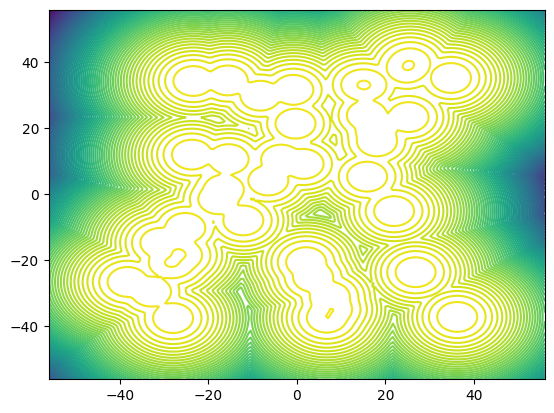

In [3]:
torch.manual_seed(0)  # seed of 0 for GMM problem
target = GMM(dim=dim, n_mixes=n_mixes,
              loc_scaling=loc_scaling, log_var_scaling=log_var_scaling,
              use_gpu=True, true_expectation_estimation_n_samples=int(1e5))
# plot target
target.to("cpu")
fig, ax = plt.subplots()
plotting_bounds = (-loc_scaling * 1.4, loc_scaling * 1.4)
plot_contours(target.log_prob, bounds=plotting_bounds, n_contour_levels=80, ax=ax, grid_width_n_points=200)
target.to("cuda")

In [4]:
# hyper-parameters

# Flow
n_flow_layers = 15
layer_nodes_per_dim = 40
lr = 1e-4
max_gradient_norm = 100.0
batch_size = 128
n_iterations = 4000
n_eval = 10
eval_batch_size = batch_size * 10
n_plots = 10 # number of plots shows throughout tranining
use_64_bit = True
alpha = 2.0

# AIS
# By default we use a simple metropolis mcmc transition with a fixed step size.
# Can switch this to 'hmc' to improve training efficiency. 
transition_operator_type = "metropolis" 
n_intermediate_distributions = 1
metropolis_step_size = 5.0

# buffer config
n_batches_buffer_sampling = 4
maximum_buffer_length = batch_size * n_batches_buffer_sampling * 100
min_buffer_length = batch_size * n_batches_buffer_sampling * 10

# target p^\alpha q^{a-\alpha} as target for AIS. 
min_is_target = True
p_target = not min_is_target # Whether to use p as the target. 
# if use_64_bit:
#     torch.set_default_dtype(torch.float64)
#     target = target.double()
#     print(f"running with 64 bit")

In [5]:
flow = make_wrapped_normflow_realnvp(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = False)

if transition_operator_type == "hmc":
    # very lightweight HMC.
    transition_operator = HamiltonianMonteCarlo(
            n_ais_intermediate_distributions=n_intermediate_distributions,
            dim=dim,
            base_log_prob=flow.log_prob,
            target_log_prob=target.log_prob,
            alpha=alpha,
            p_target=p_target,
        n_outer=1,
        epsilon=1.0, L=5)
elif transition_operator_type == "metropolis":
    transition_operator = Metropolis(            
        n_ais_intermediate_distributions=n_intermediate_distributions,
        dim=dim,
        base_log_prob=flow.log_prob,
        target_log_prob=target.log_prob,
        p_target=p_target,
        alpha=alpha,
        n_updates=1,
        adjust_step_size=False,
        max_step_size=metropolis_step_size, # the same for all metropolis steps 
        min_step_size=metropolis_step_size,
        eval_mode=False,
                                  )
else:
    raise NotImplementedError

# use GPU if available
if torch.cuda.is_available():
    flow.cuda()
    transition_operator.cuda()
    target.to("cuda")
    print(f"Running with GPU")

Running with GPU


/mnt/user_storage/active/lib/python3.9/site-packages/torch/_tensor.py:738: UserWarning: torch.lu is deprecated in favor of torch.linalg.lu_factor / torch.linalg.lu_factor_ex and will be removed in a future PyTorch release.
LU, pivots = torch.lu(A, compute_pivots)
should be replaced with
LU, pivots = torch.linalg.lu_factor(A, compute_pivots)
and
LU, pivots, info = torch.lu(A, compute_pivots, get_infos=True)
should be replaced with
LU, pivots, info = torch.linalg.lu_factor_ex(A, compute_pivots) (Triggered internally at ../aten/src/ATen/native/BatchLinearAlgebra.cpp:1992.)
  LU, pivots, infos = torch._lu_with_info(


In [6]:
fab_model = FABModel(flow=flow,
                     target_distribution=target,
                     n_intermediate_distributions=n_intermediate_distributions,
                     transition_operator=transition_operator,
                     alpha=alpha)
optimizer = torch.optim.Adam(flow.parameters(), lr=lr)
logger = ListLogger(save=False) # save training history

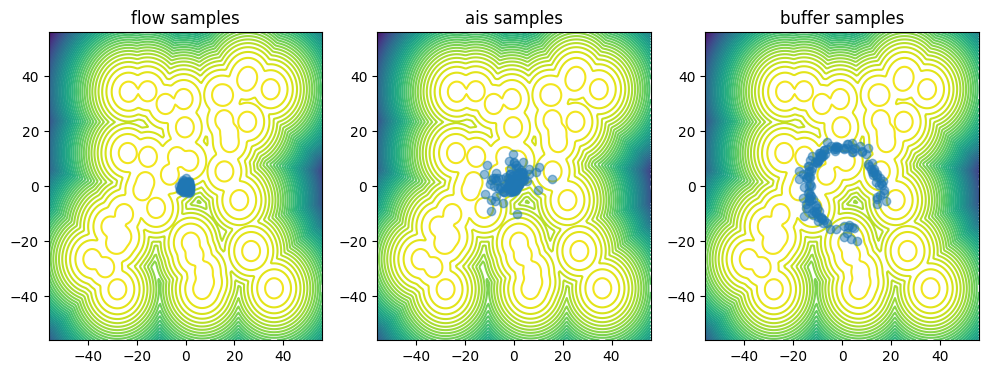

[<Figure size 1200x400 with 3 Axes>]

In [7]:
# Setup buffer.
def initial_sampler():
  # fill replay buffer using initialised model and AIS.
    point, log_w = fab_model.annealed_importance_sampler.sample_and_log_weights(
            batch_size, logging=False)
    return point.x, log_w, point.log_q

buffer = PrioritisedReplayBuffer(dim=dim, max_length=maximum_buffer_length,
                      min_sample_length=min_buffer_length,
                      initial_sampler=initial_sampler)

def plot(fab_model, n_samples = 128):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    target.to("cpu")
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[0], n_contour_levels=50, grid_width_n_points=200)
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[1], n_contour_levels=50, grid_width_n_points=200)
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[2], n_contour_levels=50, grid_width_n_points=200)
    target.to("cuda")

    # plot flow samples
    samples_flow = fab_model.flow.sample((n_samples,)).detach()
    plot_marginal_pair(samples_flow, ax=axs[0], bounds=plotting_bounds)


    # plot ais samples
    samples_ais = fab_model.annealed_importance_sampler.sample_and_log_weights(n_samples,
                                                                               logging=False)[0].x
    plot_marginal_pair(samples_ais, ax=axs[1], bounds=plotting_bounds)
    
    # plot buffer samples
    samples_buffer = buffer.sample(n_samples)[0].detach()
    plot_marginal_pair(samples_buffer, ax=axs[2], bounds=plotting_bounds)
    
    axs[0].set_title("flow samples")
    axs[1].set_title("ais samples")
    axs[2].set_title("buffer samples")
    plt.show()
    return [fig]

plot(fab_model) # Visualise model during initialisation.

In [8]:
# Setup trainer.
trainer = PrioritisedBufferTrainer(model=fab_model, optimizer=optimizer, 
              logger=logger, plot=plot,
              buffer=buffer, 
              n_batches_buffer_sampling=n_batches_buffer_sampling,
              max_gradient_norm=max_gradient_norm,
              alpha=alpha,
              w_adjust_max_clip=None)

loss: 0.02239816263318062, ess base: 0.010991431772708893,ess ais: 0.00781701598316431:   0%|          | 0/4000 [00:00<?, ?it/s]/home/ray/Joey-Dev/active_inference/fab/utils/numerical.py:59: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3614.)
  expectation = normalised_importance_weights.T @ function_values


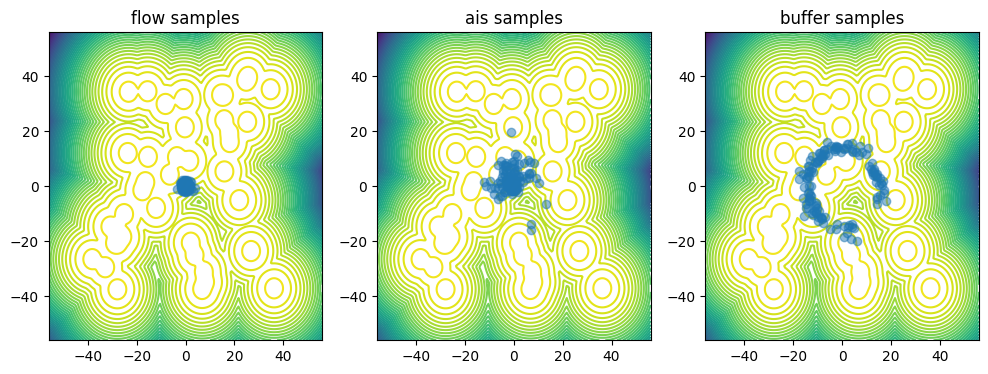

loss: 4.038982391357422, ess base: 0.0211564339697361,ess ais: 0.011304378509521484:   1%|          | 21/4000 [00:07<13:39,  4.85it/s]      

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.41684627532959, ess base: 0.02365376427769661,ess ais: 0.016399390995502472:   1%|          | 22/4000 [00:07<13:38,  4.86it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.173881530761719, ess base: 0.009015223942697048,ess ais: 0.00787703413516283:   1%|          | 23/4000 [00:07<13:36,  4.87it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.356048583984375, ess base: 0.009182479232549667,ess ais: 0.008982362225651741:   1%|          | 24/4000 [00:08<13:38,  4.86it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.7086334228515625, ess base: 0.05087053403258324,ess ais: 0.013698840513825417:   1%|          | 25/4000 [00:08<13:38,  4.86it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.1174845695495605, ess base: 0.08373662084341049,ess ais: 0.038062933832407:   1%|          | 26/4000 [00:08<13:30,  4.90it/s]   

10 nan/inf samples/log-probs/log-weights encountered at chain init.
9 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.5013747215271, ess base: 0.024358034133911133,ess ais: 0.010214083828032017:   1%|          | 28/4000 [00:08<13:26,  4.92it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.423905372619629, ess base: 0.012143895961344242,ess ais: 0.008408330380916595:   1%|          | 29/4000 [00:09<13:25,  4.93it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.3077497482299805, ess base: 0.05072341859340668,ess ais: 0.018022902309894562:   1%|          | 30/4000 [00:09<13:24,  4.93it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.754479885101318, ess base: 0.030193155631422997,ess ais: 0.01372870896011591:   1%|          | 31/4000 [00:09<13:23,  4.94it/s] 

7 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.525835990905762, ess base: 0.03026910126209259,ess ais: 0.01574721746146679:   1%|          | 32/4000 [00:09<13:36,  4.86it/s] 

8 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.642908096313477, ess base: 0.04104534536600113,ess ais: 0.019085584208369255:   1%|          | 33/4000 [00:09<13:43,  4.82it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.489955902099609, ess base: 0.11919597536325455,ess ais: 0.03542134910821915:   1%|          | 34/4000 [00:10<13:47,  4.79it/s] 

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.825433731079102, ess base: 0.017044194042682648,ess ais: 0.009480567649006844:   1%|          | 35/4000 [00:10<13:49,  4.78it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.913578033447266, ess base: 0.019631801173090935,ess ais: 0.013040785677731037:   1%|          | 36/4000 [00:10<13:50,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.58644437789917, ess base: 0.020200178027153015,ess ais: 0.011380664072930813:   1%|          | 37/4000 [00:10<13:52,  4.76it/s] 

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.734374523162842, ess base: 0.05085695534944534,ess ais: 0.011507411487400532:   1%|          | 38/4000 [00:11<13:59,  4.72it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.7317280769348145, ess base: 0.04529590904712677,ess ais: 0.009738161228597164:   1%|          | 39/4000 [00:11<14:02,  4.70it/s]

7 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.980532646179199, ess base: 0.037468984723091125,ess ais: 0.009877270087599754:   1%|          | 40/4000 [00:11<14:18,  4.61it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.700597763061523, ess base: 0.010302976705133915,ess ais: 0.008115703240036964:   1%|          | 41/4000 [00:11<14:13,  4.64it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.878222942352295, ess base: 0.05718044564127922,ess ais: 0.010544126853346825:   1%|          | 43/4000 [00:12<15:06,  4.37it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.0966973304748535, ess base: 0.10239369422197342,ess ais: 0.03591431304812431:   1%|          | 44/4000 [00:12<14:48,  4.45it/s]

7 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.127546310424805, ess base: 0.046151988208293915,ess ais: 0.019114065915346146:   1%|          | 45/4000 [00:12<14:38,  4.50it/s]

7 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.125311851501465, ess base: 0.012933793477714062,ess ais: 0.008381301537156105:   1%|          | 46/4000 [00:12<14:30,  4.54it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.992005348205566, ess base: 0.04475916177034378,ess ais: 0.019455332309007645:   1%|          | 47/4000 [00:13<14:23,  4.58it/s] 

8 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.161909103393555, ess base: 0.05874267593026161,ess ais: 0.01613173820078373:   1%|          | 48/4000 [00:13<14:18,  4.61it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.428194999694824, ess base: 0.15313634276390076,ess ais: 0.03050045110285282:   1%|          | 49/4000 [00:13<14:11,  4.64it/s]

9 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.046886444091797, ess base: 0.013940789736807346,ess ais: 0.008300404995679855:   1%|▏         | 50/4000 [00:13<14:04,  4.68it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.354011058807373, ess base: 0.029944222420454025,ess ais: 0.009319938719272614:   1%|▏         | 51/4000 [00:13<13:59,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.431087493896484, ess base: 0.0959625095129013,ess ais: 0.03853827714920044:   1%|▏         | 52/4000 [00:14<13:59,  4.70it/s]   

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.412535667419434, ess base: 0.026537207886576653,ess ais: 0.008717109449207783:   1%|▏         | 53/4000 [00:14<14:00,  4.70it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.529857158660889, ess base: 0.12253496050834656,ess ais: 0.04012564569711685:   1%|▏         | 54/4000 [00:14<13:57,  4.71it/s]  

9 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.330090045928955, ess base: 0.08623135834932327,ess ais: 0.026996875181794167:   1%|▏         | 55/4000 [00:14<13:53,  4.73it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.6062774658203125, ess base: 0.01877720281481743,ess ais: 0.008764519356191158:   1%|▏         | 56/4000 [00:14<13:54,  4.73it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.730688571929932, ess base: 0.04350397363305092,ess ais: 0.014109334908425808:   1%|▏         | 57/4000 [00:15<13:55,  4.72it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.424398422241211, ess base: 0.03573538735508919,ess ais: 0.011061503551900387:   1%|▏         | 58/4000 [00:15<13:47,  4.76it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.508150100708008, ess base: 0.09606517106294632,ess ais: 0.030108008533716202:   1%|▏         | 59/4000 [00:15<13:41,  4.80it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.723227500915527, ess base: 0.07055442780256271,ess ais: 0.033542450517416:   2%|▏         | 60/4000 [00:15<13:36,  4.82it/s]   

10 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.4439005851745605, ess base: 0.06340896338224411,ess ais: 0.016466418281197548:   2%|▏         | 61/4000 [00:15<13:44,  4.78it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.808905124664307, ess base: 0.09098873287439346,ess ais: 0.026608731597661972:   2%|▏         | 62/4000 [00:16<13:47,  4.76it/s] 

9 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.681814193725586, ess base: 0.09316693246364594,ess ais: 0.03513886034488678:   2%|▏         | 63/4000 [00:16<14:02,  4.67it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.570921897888184, ess base: 0.05446097254753113,ess ais: 0.014051740989089012:   2%|▏         | 64/4000 [00:16<14:02,  4.67it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.74710750579834, ess base: 0.09151007235050201,ess ais: 0.03146268054842949:   2%|▏         | 65/4000 [00:16<14:01,  4.68it/s]  

9 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.761082649230957, ess base: 0.0463448166847229,ess ais: 0.015745898708701134:   2%|▏         | 66/4000 [00:17<13:53,  4.72it/s]

7 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.709450721740723, ess base: 0.08532436937093735,ess ais: 0.04512209817767143:   2%|▏         | 67/4000 [00:17<13:44,  4.77it/s]

8 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.7734785079956055, ess base: 0.04988157004117966,ess ais: 0.013999087736010551:   2%|▏         | 68/4000 [00:17<13:52,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.873394966125488, ess base: 0.07013887912034988,ess ais: 0.024002626538276672:   2%|▏         | 69/4000 [00:17<13:49,  4.74it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.680349349975586, ess base: 0.0757233276963234,ess ais: 0.016648029908537865:   2%|▏         | 70/4000 [00:17<13:45,  4.76it/s] 

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.869398593902588, ess base: 0.029010968282818794,ess ais: 0.00919897761195898:   2%|▏         | 71/4000 [00:18<13:40,  4.79it/s]

8 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.946377754211426, ess base: 0.15067365765571594,ess ais: 0.05565384402871132:   2%|▏         | 72/4000 [00:18<13:38,  4.80it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.006688117980957, ess base: 0.13433904945850372,ess ais: 0.04949037358164787:   2%|▏         | 73/4000 [00:18<13:32,  4.83it/s]

9 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.803647041320801, ess base: 0.041106216609478,ess ais: 0.021962089464068413:   2%|▏         | 74/4000 [00:18<13:27,  4.86it/s] 

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.776531219482422, ess base: 0.011944876983761787,ess ais: 0.008338214829564095:   2%|▏         | 75/4000 [00:18<13:24,  4.88it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.937721252441406, ess base: 0.04944019019603729,ess ais: 0.02059665322303772:   2%|▏         | 76/4000 [00:19<13:22,  4.89it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.027435302734375, ess base: 0.14378607273101807,ess ais: 0.012363886460661888:   2%|▏         | 77/4000 [00:19<13:22,  4.89it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.134422302246094, ess base: 0.07361708581447601,ess ais: 0.036139972507953644:   2%|▏         | 78/4000 [00:19<13:22,  4.89it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.891688346862793, ess base: 0.08361215889453888,ess ais: 0.022190190851688385:   2%|▏         | 79/4000 [00:19<13:20,  4.90it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.845322608947754, ess base: 0.06624317169189453,ess ais: 0.03041592612862587:   2%|▏         | 80/4000 [00:19<13:20,  4.90it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.999201774597168, ess base: 0.13598544895648956,ess ais: 0.07449770718812943:   2%|▏         | 81/4000 [00:20<13:19,  4.90it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.912627220153809, ess base: 0.10027830302715302,ess ais: 0.016256991773843765:   2%|▏         | 82/4000 [00:20<13:23,  4.88it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.7610063552856445, ess base: 0.1002863273024559,ess ais: 0.02185550518333912:   2%|▏         | 83/4000 [00:20<13:24,  4.87it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.945014953613281, ess base: 0.08231639117002487,ess ais: 0.03840012848377228:   2%|▏         | 84/4000 [00:20<13:21,  4.88it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.026878356933594, ess base: 0.11233195662498474,ess ais: 0.032942045480012894:   2%|▏         | 85/4000 [00:20<13:19,  4.90it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.322617530822754, ess base: 0.05308923497796059,ess ais: 0.012394926510751247:   2%|▏         | 86/4000 [00:21<13:24,  4.86it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.593890190124512, ess base: 0.054022740572690964,ess ais: 0.023368215188384056:   2%|▏         | 87/4000 [00:21<13:47,  4.73it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.813223361968994, ess base: 0.1648591160774231,ess ais: 0.09962514042854309:   2%|▏         | 89/4000 [00:21<14:31,  4.49it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.142995834350586, ess base: 0.14829200506210327,ess ais: 0.05974696949124336:   2%|▏         | 90/4000 [00:22<14:11,  4.59it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.21130657196045, ess base: 0.04631125181913376,ess ais: 0.013447996228933334:   2%|▏         | 91/4000 [00:22<13:56,  4.67it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.533732414245605, ess base: 0.14412884414196014,ess ais: 0.04658416286110878:   2%|▏         | 93/4000 [00:22<13:32,  4.81it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.389123916625977, ess base: 0.05260784178972244,ess ais: 0.011463193222880363:   2%|▏         | 94/4000 [00:22<13:24,  4.86it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.235711097717285, ess base: 0.09395544230937958,ess ais: 0.02368662692606449:   2%|▏         | 95/4000 [00:23<13:21,  4.87it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.296608924865723, ess base: 0.019808808341622353,ess ais: 0.008328588679432869:   2%|▏         | 96/4000 [00:23<13:37,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.223163604736328, ess base: 0.10064981877803802,ess ais: 0.049666061997413635:   2%|▏         | 97/4000 [00:23<13:43,  4.74it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.818933486938477, ess base: 0.19013679027557373,ess ais: 0.09925726056098938:   2%|▏         | 98/4000 [00:23<13:45,  4.72it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.905555725097656, ess base: 0.12943899631500244,ess ais: 0.0557560957968235:   2%|▏         | 99/4000 [00:23<13:48,  4.71it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.88496208190918, ess base: 0.0547608844935894,ess ais: 0.012727411463856697:   2%|▎         | 100/4000 [00:24<13:52,  4.69it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.205438613891602, ess base: 0.06087247654795647,ess ais: 0.009229104965925217:   3%|▎         | 102/4000 [00:24<13:54,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.619030952453613, ess base: 0.049816060811281204,ess ais: 0.01194740366190672:   3%|▎         | 106/4000 [00:25<13:48,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.18912124633789, ess base: 0.09751788526773453,ess ais: 0.032520193606615067:   3%|▎         | 111/4000 [00:26<13:55,  4.66it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.057952880859375, ess base: 0.16164816915988922,ess ais: 0.06993264704942703:   3%|▎         | 112/4000 [00:26<13:54,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.611421585083008, ess base: 0.2067665010690689,ess ais: 0.10283415764570236:   3%|▎         | 120/4000 [00:28<13:43,  4.71it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.007179260253906, ess base: 0.17451190948486328,ess ais: 0.09400954097509384:   3%|▎         | 123/4000 [00:29<13:31,  4.78it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.198749542236328, ess base: 0.12859860062599182,ess ais: 0.036170560866594315:   3%|▎         | 124/4000 [00:29<13:38,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.989559650421143, ess base: 0.1655634194612503,ess ais: 0.050068266689777374:   3%|▎         | 126/4000 [00:29<14:20,  4.50it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.97761869430542, ess base: 0.176737442612648,ess ais: 0.060521747916936874:   3%|▎         | 132/4000 [00:31<13:47,  4.67it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0584342955747537e+21, ess base: 0.19323225319385529,ess ais: 0.06342372298240662:   3%|▎         | 135/4000 [00:31<13:42,  4.70it/s]

nan grad norm in replay step


loss: 8.641304016113281, ess base: 0.16894939541816711,ess ais: 0.07967469841241837:   3%|▎         | 138/4000 [00:32<13:30,  4.77it/s]     

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.405778884887695, ess base: 0.16705486178398132,ess ais: 0.03325749561190605:   4%|▎         | 147/4000 [00:34<13:46,  4.66it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.048962593078613, ess base: 0.10669273138046265,ess ais: 0.03091811202466488:   4%|▎         | 149/4000 [00:34<13:46,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.261160850524902, ess base: 0.19974902272224426,ess ais: 0.07084058970212936:   4%|▍         | 150/4000 [00:34<13:42,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.640159606933594, ess base: 0.24020354449748993,ess ais: 0.14226043224334717:   4%|▍         | 156/4000 [00:36<13:24,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.414979934692383, ess base: 0.19301460683345795,ess ais: 0.10705409944057465:   4%|▍         | 163/4000 [00:37<13:52,  4.61it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.137836456298828, ess base: 0.17076535522937775,ess ais: 0.05274312198162079:   4%|▍         | 164/4000 [00:37<13:49,  4.63it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.083768844604492, ess base: 0.1792270690202713,ess ais: 0.06060013920068741:   4%|▍         | 165/4000 [00:38<13:50,  4.62it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.176464080810547, ess base: 0.24953508377075195,ess ais: 0.14446017146110535:   4%|▍         | 169/4000 [00:38<13:12,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.679594993591309, ess base: 0.20085670053958893,ess ais: 0.10715993493795395:   4%|▍         | 173/4000 [00:39<13:16,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.867574691772461, ess base: 0.24035948514938354,ess ais: 0.08301927149295807:   4%|▍         | 174/4000 [00:39<13:09,  4.85it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 153.92431640625, ess base: 0.1887737214565277,ess ais: 0.07580363005399704:   4%|▍         | 175/4000 [00:40<13:04,  4.87it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.292806625366211, ess base: 0.14699235558509827,ess ais: 0.033905208110809326:   4%|▍         | 177/4000 [00:40<13:04,  4.87it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.431840896606445, ess base: 0.10759866237640381,ess ais: 0.017790859565138817:   4%|▍         | 180/4000 [00:41<13:04,  4.87it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.875646114349365, ess base: 0.13629257678985596,ess ais: 0.01862063631415367:   5%|▍         | 181/4000 [00:41<13:19,  4.78it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.214757919311523, ess base: 0.1787126064300537,ess ais: 0.06642743945121765:   5%|▍         | 184/4000 [00:42<13:37,  4.67it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.37901782989502, ess base: 0.21670880913734436,ess ais: 0.12931425869464874:   5%|▍         | 190/4000 [00:43<13:38,  4.65it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.713727951049805, ess base: 0.1865174025297165,ess ais: 0.09123548865318298:   5%|▍         | 195/4000 [00:44<13:38,  4.65it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 14.454216003417969, ess base: 0.1913680136203766,ess ais: 0.05782276764512062:   5%|▌         | 201/4000 [00:45<13:33,  4.67it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.970471382141113, ess base: 0.24692201614379883,ess ais: 0.12627895176410675:   5%|▌         | 202/4000 [00:45<13:32,  4.68it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.104049682617188, ess base: 0.21562090516090393,ess ais: 0.06718982756137848:   5%|▌         | 203/4000 [00:46<13:32,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.065595626831055, ess base: 0.29812008142471313,ess ais: 0.1540497988462448:   5%|▌         | 209/4000 [00:47<13:21,  4.73it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.31378173828125, ess base: 0.15470977127552032,ess ais: 0.045710690319538116:   5%|▌         | 211/4000 [00:47<13:10,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.460358619689941, ess base: 0.18707798421382904,ess ais: 0.11323238909244537:   5%|▌         | 212/4000 [00:47<13:12,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.158793449401855, ess base: 0.19080869853496552,ess ais: 0.09744713455438614:   5%|▌         | 218/4000 [00:49<13:03,  4.83it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.767597198486328, ess base: 0.19869466125965118,ess ais: 0.007874015718698502:   6%|▌         | 221/4000 [00:49<13:05,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.123434066772461, ess base: 0.1679966300725937,ess ais: 0.038060929626226425:   6%|▌         | 222/4000 [00:50<12:59,  4.85it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 78525.6015625, ess base: 0.17335227131843567,ess ais: 0.0943281501531601:   6%|▌         | 223/4000 [00:50<12:54,  4.87it/s]     

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.942516326904297, ess base: 0.17980167269706726,ess ais: 0.06525832414627075:   6%|▌         | 225/4000 [00:50<12:53,  4.88it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.459915161132812, ess base: 0.2525078058242798,ess ais: 0.10689643770456314:   6%|▌         | 226/4000 [00:50<12:52,  4.88it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 267.2801818847656, ess base: 0.21331512928009033,ess ais: 0.09476516395807266:   6%|▌         | 227/4000 [00:51<12:54,  4.87it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.092057228088379, ess base: 0.20528265833854675,ess ais: 0.07528222352266312:   6%|▌         | 229/4000 [00:51<13:16,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.135005950927734, ess base: 0.24333111941814423,ess ais: 0.1396619975566864:   6%|▌         | 231/4000 [00:51<13:27,  4.67it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.815349578857422, ess base: 0.15473484992980957,ess ais: 0.048665594309568405:   6%|▌         | 232/4000 [00:52<13:23,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.702762603759766, ess base: 0.19760429859161377,ess ais: 0.0895291119813919:   6%|▌         | 233/4000 [00:52<13:20,  4.70it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 16.037975311279297, ess base: 0.23503029346466064,ess ais: 0.09619050472974777:   6%|▌         | 234/4000 [00:52<13:19,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.325891494750977, ess base: 0.20350372791290283,ess ais: 0.08706986159086227:   6%|▌         | 239/4000 [00:53<13:02,  4.81it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.459543228149414, ess base: 0.2335003912448883,ess ais: 0.10409487783908844:   6%|▌         | 243/4000 [00:54<12:58,  4.82it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.909992694854736, ess base: 0.20763659477233887,ess ais: 0.057737741619348526:   6%|▌         | 245/4000 [00:54<13:06,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.0648193359375, ess base: 0.21244174242019653,ess ais: 0.12493891268968582:   6%|▌         | 248/4000 [00:55<13:12,  4.73it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.217172622680664, ess base: 0.25098511576652527,ess ais: 0.10976116359233856:   6%|▋         | 251/4000 [00:56<13:10,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.666059494018555, ess base: 0.24993254244327545,ess ais: 0.10342375189065933:   6%|▋         | 254/4000 [00:56<13:17,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.945528030395508, ess base: 0.16867928206920624,ess ais: 0.08177118748426437:   6%|▋         | 255/4000 [00:57<13:17,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.809295654296875, ess base: 0.20960000157356262,ess ais: 0.10810015350580215:   6%|▋         | 256/4000 [00:57<13:15,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.480525970458984, ess base: 0.2535492479801178,ess ais: 0.0078125:   6%|▋         | 258/4000 [00:57<13:14,  4.71it/s]           

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 10.547918319702148, ess base: 0.23826301097869873,ess ais: 0.007874015718698502:   6%|▋         | 260/4000 [00:58<13:41,  4.55it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1936.3280029296875, ess base: 0.18128721415996552,ess ais: 0.010495949536561966:   7%|▋         | 261/4000 [00:58<13:28,  4.62it/s]

nan grad norm in replay step


loss: 7.841583251953125, ess base: 0.23000329732894897,ess ais: 0.10118548572063446:   7%|▋         | 268/4000 [00:59<12:46,  4.87it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.161947250366211, ess base: 0.26288363337516785,ess ais: 0.09659813344478607:   7%|▋         | 271/4000 [01:00<13:04,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.510880947113037, ess base: 0.21074068546295166,ess ais: 0.007936508394777775:   7%|▋         | 273/4000 [01:00<13:09,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.12701416015625, ess base: 0.2229374200105667,ess ais: 0.0971560850739479:   7%|▋         | 275/4000 [01:01<13:07,  4.73it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 97950580736.0, ess base: 0.16860292851924896,ess ais: 0.04153207689523697:   7%|▋         | 278/4000 [01:01<13:09,  4.72it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0781581270956442e+30, ess base: 0.17696930468082428,ess ais: 0.06556576490402222:   7%|▋         | 279/4000 [01:02<12:50,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.228759307581999e+21, ess base: 0.18519049882888794,ess ais: 0.08645632117986679:   7%|▋         | 280/4000 [01:02<12:39,  4.90it/s] 

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step


loss: 19106276.0, ess base: 0.19652678072452545,ess ais: 0.007936508394777775:   7%|▋         | 282/4000 [01:02<12:59,  4.77it/s]          

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 46.5174446105957, ess base: 0.22013385593891144,ess ais: 0.11845864355564117:   7%|▋         | 283/4000 [01:02<12:57,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.030906677246094, ess base: 0.24035294353961945,ess ais: 0.12500280141830444:   7%|▋         | 284/4000 [01:03<12:58,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.547637939453125, ess base: 0.18795256316661835,ess ais: 0.09706667810678482:   7%|▋         | 285/4000 [01:03<13:08,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.496665954589844, ess base: 0.17446346580982208,ess ais: 0.061311814934015274:   7%|▋         | 286/4000 [01:03<13:07,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.2614656090736389,ess ais: 0.18455034494400024:   7%|▋         | 288/4000 [01:03<12:41,  4.87it/s]                

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.086057662963867, ess base: 0.20649684965610504,ess ais: 0.007874015718698502:   7%|▋         | 290/4000 [01:04<12:57,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.048786163330078, ess base: 0.2577095925807953,ess ais: 0.12887142598628998:   7%|▋         | 291/4000 [01:04<13:01,  4.75it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.759644508361816, ess base: 0.2511688470840454,ess ais: 0.007874015718698502:   7%|▋         | 292/4000 [01:04<13:01,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.232975006103516, ess base: 0.26485493779182434,ess ais: 0.1526440680027008:   8%|▊         | 302/4000 [01:06<12:58,  4.75it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.837637424468994, ess base: 0.17870724201202393,ess ais: 0.06549274176359177:   8%|▊         | 303/4000 [01:07<12:58,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.569085121154785, ess base: 0.2476014345884323,ess ais: 0.11622000485658646:   8%|▊         | 304/4000 [01:07<12:59,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.07036304473877, ess base: 0.2329784631729126,ess ais: 0.007936508394777775:   8%|▊         | 305/4000 [01:07<13:03,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.22023679316043854,ess ais: 0.12267986685037613:   8%|▊         | 306/4000 [01:07<12:38,  4.87it/s]             

nan loss in replay step


loss: 8.650726318359375, ess base: 0.2566831707954407,ess ais: 0.13838772475719452:   8%|▊         | 310/4000 [01:08<13:03,  4.71it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.173938751220703, ess base: 0.19261834025382996,ess ais: 0.0663803443312645:   8%|▊         | 311/4000 [01:08<13:01,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.19625473022461, ess base: 0.19883623719215393,ess ais: 0.06960567086935043:   8%|▊         | 312/4000 [01:09<13:01,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.283965110778809, ess base: 0.20402930676937103,ess ais: 0.0983041301369667:   8%|▊         | 313/4000 [01:09<13:01,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.511322021484375, ess base: 0.24522529542446136,ess ais: 0.1534338891506195:   8%|▊         | 317/4000 [01:10<12:57,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.85581111907959, ess base: 0.18852685391902924,ess ais: 0.07492462545633316:   8%|▊         | 318/4000 [01:10<12:55,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.400888442993164, ess base: 0.27201658487319946,ess ais: 0.14929641783237457:   8%|▊         | 319/4000 [01:10<12:55,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.786195278167725, ess base: 0.23671509325504303,ess ais: 0.13969427347183228:   8%|▊         | 322/4000 [01:11<12:51,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.970370292663574, ess base: 0.21733103692531586,ess ais: 0.10885141789913177:   8%|▊         | 323/4000 [01:11<12:51,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.936466217041016, ess base: 0.30158692598342896,ess ais: 0.1549900472164154:   8%|▊         | 328/4000 [01:12<12:55,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.34591007232666, ess base: 0.19010025262832642,ess ais: 0.059691205620765686:   8%|▊         | 329/4000 [01:12<13:09,  4.65it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9738383293151855, ess base: 0.1513717621564865,ess ais: 0.08309406042098999:   8%|▊         | 330/4000 [01:12<13:16,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 282209315454976.0, ess base: 0.21987316012382507,ess ais: 0.12754452228546143:   8%|▊         | 332/4000 [01:13<13:03,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.611671447753906, ess base: 0.31835389137268066,ess ais: 0.007874015718698502:   8%|▊         | 334/4000 [01:13<12:55,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.166854858398438, ess base: 0.2319658398628235,ess ais: 0.10766258090734482:   8%|▊         | 335/4000 [01:13<12:54,  4.73it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.928225517272949, ess base: 0.25899237394332886,ess ais: 0.13953576982021332:   8%|▊         | 337/4000 [01:14<12:50,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.480573654174805, ess base: 0.2063778191804886,ess ais: 0.11474836617708206:   9%|▊         | 341/4000 [01:15<12:49,  4.75it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.793757438659668, ess base: 0.25320500135421753,ess ais: 0.008044647984206676:   9%|▊         | 345/4000 [01:16<12:57,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.021501541137695, ess base: 0.2275482565164566,ess ais: 0.1367729902267456:   9%|▊         | 348/4000 [01:16<13:18,  4.58it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.695396423339844, ess base: 0.267804354429245,ess ais: 0.13917911052703857:   9%|▉         | 352/4000 [01:17<13:00,  4.68it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.406248092651367, ess base: 0.22415222227573395,ess ais: 0.10998976975679398:   9%|▉         | 356/4000 [01:18<13:11,  4.60it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.278143882751465, ess base: 0.2272867113351822,ess ais: 0.007874015718698502:   9%|▉         | 360/4000 [01:19<13:17,  4.56it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.029552459716797, ess base: 0.26982930302619934,ess ais: 0.15182805061340332:   9%|▉         | 362/4000 [01:19<13:12,  4.59it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.268383026123047, ess base: 0.20147889852523804,ess ais: 0.10966632515192032:   9%|▉         | 369/4000 [01:21<13:04,  4.63it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.051448822021484, ess base: 0.23821033537387848,ess ais: 0.11886026710271835:   9%|▉         | 371/4000 [01:21<13:19,  4.54it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.02198600769043, ess base: 0.19907675683498383,ess ais: 0.06488059461116791:   9%|▉         | 379/4000 [01:23<13:26,  4.49it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.984100818634033, ess base: 0.22040270268917084,ess ais: 0.07896061986684799:  10%|▉         | 393/4000 [01:26<12:48,  4.69it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.489482879638672, ess base: 0.22441084682941437,ess ais: 0.1021699458360672:  10%|▉         | 399/4000 [01:27<12:36,  4.76it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 42.91716003417969, ess base: 0.21893171966075897,ess ais: 0.10433400422334671:  10%|█         | 405/4000 [01:29<13:06,  4.57it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.185142517089844, ess base: 0.24079373478889465,ess ais: 0.008723694831132889:  10%|█         | 412/4000 [01:30<12:59,  4.60it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.807520866394043, ess base: 0.2459147572517395,ess ais: 0.11734747886657715:  10%|█         | 415/4000 [01:31<12:53,  4.64it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.025948524475098, ess base: 0.2404213696718216,ess ais: 0.11724819242954254:  10%|█         | 416/4000 [01:31<12:58,  4.61it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 16.325496673583984, ess base: 0.2114000916481018,ess ais: 0.09388670325279236:  10%|█         | 417/4000 [01:31<12:51,  4.65it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.303181648254395, ess base: 0.26207032799720764,ess ais: 0.14426589012145996:  10%|█         | 418/4000 [01:31<12:46,  4.67it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.208051681518555, ess base: 0.26768019795417786,ess ais: 0.13206301629543304:  11%|█         | 421/4000 [01:32<13:00,  4.59it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.36264705657959, ess base: 0.25150173902511597,ess ais: 0.13015598058700562:  11%|█         | 431/4000 [01:34<12:10,  4.88it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.744326591491699, ess base: 0.291673481464386,ess ais: 0.15427760779857635:  11%|█         | 432/4000 [01:34<12:08,  4.90it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.5545015335083, ess base: 0.27851295471191406,ess ais: 0.14779601991176605:  11%|█         | 435/4000 [01:35<12:21,  4.81it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.105635643005371, ess base: 0.3030470013618469,ess ais: 0.16060589253902435:  11%|█         | 439/4000 [01:36<12:34,  4.72it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.173145294189453, ess base: 0.2813427448272705,ess ais: 0.12432612478733063:  11%|█         | 442/4000 [01:36<12:46,  4.64it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.843420028686523, ess base: 0.2817266285419464,ess ais: 0.1620635986328125:  11%|█         | 444/4000 [01:37<12:32,  4.72it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


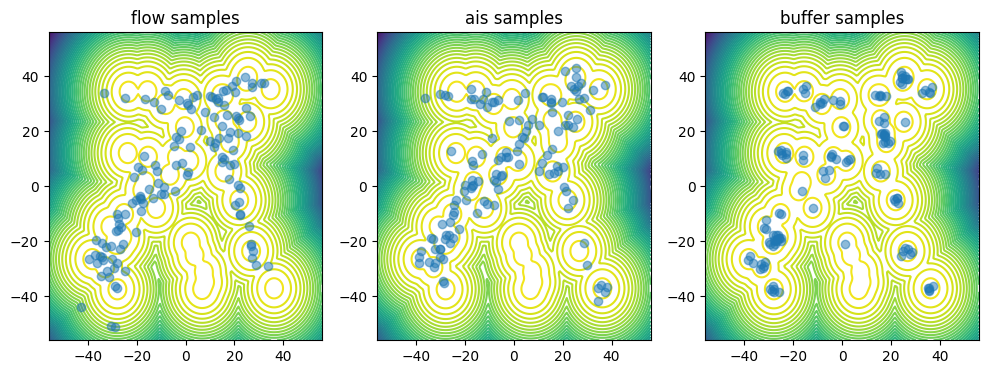

loss: 8.078092575073242, ess base: 0.21523362398147583,ess ais: 0.09389260411262512:  11%|█▏        | 453/4000 [01:41<14:20,  4.12it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.716157913208008, ess base: 0.3091568052768707,ess ais: 0.18961049616336823:  11%|█▏        | 455/4000 [01:41<13:28,  4.39it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.007251739501953, ess base: 0.20695678889751434,ess ais: 0.10981432348489761:  11%|█▏        | 456/4000 [01:41<13:12,  4.47it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.6969528172572836e+18, ess base: 0.27238333225250244,ess ais: 0.01707087829709053:  11%|█▏        | 457/4000 [01:42<13:00,  4.54it/s]

nan grad norm in replay step


loss: 7.988466739654541, ess base: 0.23553194105625153,ess ais: 0.1227298155426979:  12%|█▏        | 463/4000 [01:43<12:31,  4.70it/s]      

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.0979180074172416e+17, ess base: 0.2729102671146393,ess ais: 0.17144811153411865:  12%|█▏        | 468/4000 [01:44<12:01,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step


loss: 238.38555908203125, ess base: 0.2792814075946808,ess ais: 0.007874015718698502:  12%|█▏        | 493/4000 [01:49<12:18,  4.75it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 39.37854766845703, ess base: 0.19901207089424133,ess ais: 0.08590136468410492:  12%|█▏        | 495/4000 [01:50<12:07,  4.81it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.306699752807617, ess base: 0.24029092490673065,ess ais: 0.007936508394777775:  12%|█▏        | 496/4000 [01:50<12:08,  4.81it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.709650039672852, ess base: 0.22835421562194824,ess ais: 0.13409721851348877:  12%|█▏        | 497/4000 [01:50<12:10,  4.79it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.6450395584106445, ess base: 0.27808746695518494,ess ais: 0.14968989789485931:  13%|█▎        | 507/4000 [01:52<12:13,  4.76it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.543638229370117, ess base: 0.2341664433479309,ess ais: 0.1021130308508873:  13%|█▎        | 508/4000 [01:52<12:22,  4.70it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.556633949279785, ess base: 0.30387210845947266,ess ais: 0.0078125:  13%|█▎        | 515/4000 [01:54<11:44,  4.95it/s]           

nan loss in replay step


loss: inf, ess base: 0.27435266971588135,ess ais: 0.007818927057087421:  13%|█▎        | 516/4000 [01:54<11:27,  5.07it/s]   

nan loss in replay step
nan grad norm in replay step


loss: 7.408947944641113, ess base: 0.28152236342430115,ess ais: 0.00781252421438694:  13%|█▎        | 518/4000 [01:54<11:21,  5.11it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.776376724243164, ess base: 0.27891305088996887,ess ais: 0.007874015718698502:  13%|█▎        | 522/4000 [01:55<12:12,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.577195644378662, ess base: 0.2548326849937439,ess ais: 0.11928664147853851:  13%|█▎        | 530/4000 [01:57<12:23,  4.67it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.626655101776123, ess base: 0.25766265392303467,ess ais: 0.1603071540594101:  13%|█▎        | 534/4000 [01:58<12:21,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.003607749938965, ess base: 0.2516845464706421,ess ais: 0.17768044769763947:  13%|█▎        | 537/4000 [01:58<12:20,  4.68it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.076011657714844, ess base: 0.23462656140327454,ess ais: 0.13749168813228607:  13%|█▎        | 539/4000 [01:59<12:22,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.034135818481445, ess base: 0.2959912121295929,ess ais: 0.16209900379180908:  14%|█▎        | 545/4000 [02:00<12:13,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 13.707404136657715, ess base: 0.2858295142650604,ess ais: 0.1384546309709549:  14%|█▍        | 550/4000 [02:01<12:24,  4.63it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.0195951461792, ess base: 0.19866777956485748,ess ais: 0.09934414178133011:  14%|█▍        | 555/4000 [02:02<12:27,  4.61it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.605332374572754, ess base: 0.25475049018859863,ess ais: 0.007881876081228256:  14%|█▍        | 566/4000 [02:05<12:11,  4.69it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.203608512878418, ess base: 0.3290540874004364,ess ais: 0.21909131109714508:  14%|█▍        | 570/4000 [02:06<12:07,  4.72it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.44113540649414, ess base: 0.2995988726615906,ess ais: 0.19048358500003815:  15%|█▍        | 596/4000 [02:11<12:07,  4.68it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.96314811706543, ess base: 0.26318851113319397,ess ais: 0.1587667316198349:  15%|█▍        | 597/4000 [02:11<12:01,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 22758658.0, ess base: 0.314108669757843,ess ais: 0.16909021139144897:  15%|█▍        | 598/4000 [02:11<12:06,  4.68it/s]       

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.609744548797607, ess base: 0.2268408089876175,ess ais: 0.11530599743127823:  16%|█▌        | 622/4000 [02:17<11:52,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.442981719970703, ess base: 0.3180175721645355,ess ais: 0.17941699922084808:  16%|█▋        | 653/4000 [02:23<11:49,  4.71it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.763763427734375, ess base: 0.2902046740055084,ess ais: 0.1557263731956482:  16%|█▋        | 654/4000 [02:23<11:52,  4.70it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.700811862945557, ess base: 0.25029662251472473,ess ais: 0.11287607252597809:  17%|█▋        | 671/4000 [02:27<11:37,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.853158950805664, ess base: 0.32338327169418335,ess ais: 0.1626662164926529:  17%|█▋        | 673/4000 [02:27<11:37,  4.77it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.868242263793945, ess base: 0.320507675409317,ess ais: 0.19299200177192688:  17%|█▋        | 674/4000 [02:28<11:40,  4.75it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.497363090515137, ess base: 0.30968204140663147,ess ais: 0.15668414533138275:  17%|█▋        | 692/4000 [02:31<11:39,  4.73it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.690440654754639, ess base: 0.2636052966117859,ess ais: 0.14194421470165253:  18%|█▊        | 717/4000 [02:37<11:59,  4.57it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.923160552978516, ess base: 0.2716796398162842,ess ais: 0.1108604371547699:  18%|█▊        | 734/4000 [02:40<11:42,  4.65it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.743566864664958e+25, ess base: 0.32075947523117065,ess ais: 0.19362035393714905:  19%|█▊        | 746/4000 [02:43<11:29,  4.72it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.479856202814825e+25, ess base: 0.259628564119339,ess ais: 0.008933148346841335:  19%|█▊        | 747/4000 [02:43<11:21,  4.78it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6172694316137272e+24, ess base: 0.2724260091781616,ess ais: 0.0078125:  19%|█▊        | 748/4000 [02:43<11:17,  4.80it/s]         

nan grad norm in replay step


loss: 86.2662353515625, ess base: 0.3205740451812744,ess ais: 0.14044377207756042:  20%|█▉        | 784/4000 [02:51<11:31,  4.65it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.629191875457764, ess base: 0.3601509928703308,ess ais: 0.0078125:  21%|██        | 835/4000 [03:02<11:08,  4.73it/s]            

nan grad norm in replay step
nan loss in replay step


loss: 21.934036254882812, ess base: 0.2362370640039444,ess ais: 0.06935768574476242:  21%|██        | 837/4000 [03:02<10:57,  4.81it/s]

nan grad norm in replay step


loss: 8.251745223999023, ess base: 0.26792845129966736,ess ais: 0.12010557949542999:  21%|██        | 838/4000 [03:03<10:44,  4.91it/s]

nan loss in replay step
nan loss in replay step


loss: 7.719633102416992, ess base: 0.3412879705429077,ess ais: 0.20933736860752106:  21%|██        | 840/4000 [03:03<10:28,  5.03it/s] 

nan loss in replay step


loss: inf, ess base: 0.29027804732322693,ess ais: 0.007997889071702957:  21%|██        | 841/4000 [03:03<10:20,  5.09it/s]            

nan loss in replay step


loss: 8.918395042419434, ess base: 0.3353886008262634,ess ais: 0.170807346701622:  22%|██▏       | 867/4000 [03:09<10:24,  5.02it/s]    

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.039122581481934, ess base: 0.28532055020332336,ess ais: 0.132614403963089:  22%|██▏       | 868/4000 [03:09<10:09,  5.14it/s]

nan loss in replay step


loss: 8.286349296569824, ess base: 0.2782403826713562,ess ais: 0.14197084307670593:  22%|██▏       | 869/4000 [03:09<09:59,  5.23it/s]

nan loss in replay step


loss: inf, ess base: 0.2932817339897156,ess ais: 0.21731723845005035:  22%|██▏       | 870/4000 [03:09<09:51,  5.29it/s]              

nan loss in replay step


loss: 1.4824628476027972e+27, ess base: 0.31797879934310913,ess ais: 0.05147099122405052:  22%|██▏       | 887/4000 [03:13<11:09,  4.65it/s]

nan grad norm in replay step


loss: 7.987513542175293, ess base: 0.3143293559551239,ess ais: 0.20829083025455475:  22%|██▏       | 888/4000 [03:13<11:07,  4.66it/s]      

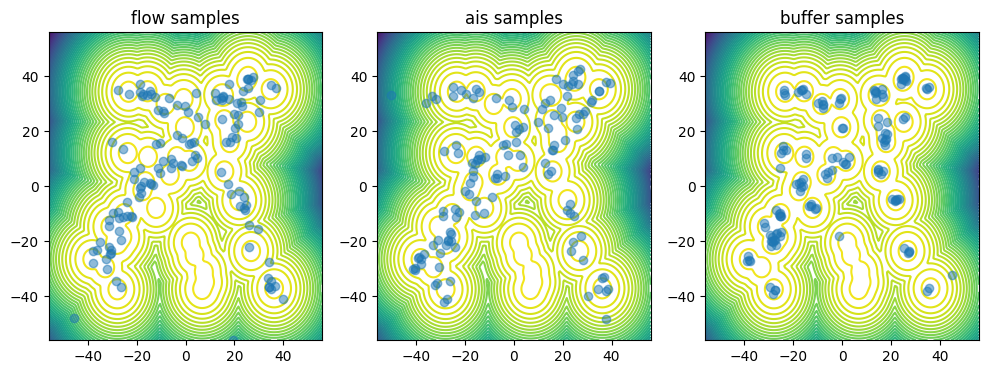

loss: 7.743490695953369, ess base: 0.30620408058166504,ess ais: 0.16027529537677765:  22%|██▏       | 891/4000 [03:16<27:53,  1.86it/s]

nan grad norm in replay step


loss: 8.975411342789837e+16, ess base: 0.32867780327796936,ess ais: 0.10334961861371994:  22%|██▏       | 892/4000 [03:16<23:00,  2.25it/s]

nan grad norm in replay step


loss: 1.878915425970946e+18, ess base: 0.30390748381614685,ess ais: 0.11508047580718994:  22%|██▏       | 893/4000 [03:16<19:20,  2.68it/s]

nan grad norm in replay step


loss: 7.75705099105835, ess base: 0.3446978032588959,ess ais: 0.22498995065689087:  23%|██▎       | 905/4000 [03:19<10:42,  4.82it/s]      

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.167530059814453, ess base: 0.3418591618537903,ess ais: 0.20020495355129242:  23%|██▎       | 914/4000 [03:21<10:31,  4.89it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.12257194519043, ess base: 0.29685530066490173,ess ais: 0.16073745489120483:  23%|██▎       | 920/4000 [03:22<10:34,  4.85it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.639593124389648, ess base: 0.33160507678985596,ess ais: 0.17125371098518372:  24%|██▍       | 969/4000 [03:32<11:11,  4.51it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.382827758789062, ess base: 0.3799256384372711,ess ais: 0.2225799262523651:  24%|██▍       | 975/4000 [03:34<10:21,  4.87it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.46392822265625, ess base: 0.31070107221603394,ess ais: 0.12991465628147125:  25%|██▌       | 1008/4000 [03:41<10:47,  4.62it/s]  

nan grad norm in replay step


loss: 1.3444786445943272e+35, ess base: 0.2934150695800781,ess ais: 0.007812511175870895:  25%|██▌       | 1016/4000 [03:42<10:34,  4.70it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.23959554731845856,ess ais: 0.1310720145702362:  26%|██▌       | 1023/4000 [03:44<10:11,  4.87it/s]                    

nan loss in replay step
nan grad norm in replay step


loss: 8.153149604797363, ess base: 0.31833669543266296,ess ais: 0.1838587075471878:  26%|██▌       | 1032/4000 [03:46<10:28,  4.72it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 151541168.0, ess base: 0.3163266181945801,ess ais: 0.1417088508605957:  26%|██▌       | 1040/4000 [03:48<10:13,  4.83it/s]         

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 55693299712.0, ess base: 0.30188459157943726,ess ais: 0.007888834923505783:  26%|██▌       | 1041/4000 [03:48<09:53,  4.98it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1879.7723388671875, ess base: 0.22138988971710205,ess ais: 0.10608604550361633:  26%|██▌       | 1043/4000 [03:48<09:56,  4.96it/s] 

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.287567138671875, ess base: 0.26664528250694275,ess ais: 0.008474576286971569:  26%|██▌       | 1044/4000 [03:48<09:50,  5.01it/s]

10 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.2715533971786499,ess ais: 0.008130080997943878:  26%|██▌       | 1045/4000 [03:48<09:24,  5.24it/s]                

nan loss in replay step
nan loss in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.761015892028809, ess base: 0.20264099538326263,ess ais: 0.10225558280944824:  26%|██▌       | 1047/4000 [03:49<09:51,  4.99it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.233383178710938, ess base: 0.26668262481689453,ess ais: 0.12726806104183197:  26%|██▋       | 1050/4000 [03:50<10:23,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.167431831359863, ess base: 0.33600443601608276,ess ais: 0.1985800862312317:  26%|██▋       | 1057/4000 [03:51<10:27,  4.69it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.138835906982422, ess base: 0.30689647793769836,ess ais: 0.19872288405895233:  26%|██▋       | 1059/4000 [03:51<10:25,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.4769721031188965, ess base: 0.3296421468257904,ess ais: 0.0078125:  27%|██▋       | 1069/4000 [03:54<09:45,  5.00it/s]          

nan loss in replay step
nan loss in replay step


loss: 7.543513774871826, ess base: 0.32881540060043335,ess ais: 0.21306578814983368:  27%|██▋       | 1079/4000 [03:56<10:15,  4.75it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.000341415405273, ess base: 0.354635089635849,ess ais: 0.22388683259487152:  27%|██▋       | 1080/4000 [03:56<10:13,  4.76it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8046.8359375, ess base: 0.3043390214443207,ess ais: 0.007874015718698502:  27%|██▋       | 1088/4000 [03:58<10:31,  4.61it/s]      

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.2755255699157715,ess ais: 0.012752928771078587:  27%|██▋       | 1089/4000 [03:58<09:33,  5.08it/s]         

nan loss in replay step
nan loss in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step


loss: 529652.625, ess base: 0.2200021594762802,ess ais: 0.00800000037997961:  27%|██▋       | 1091/4000 [03:58<08:52,  5.46it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.26977452635765076,ess ais: 0.14869774878025055:  27%|██▋       | 1092/4000 [03:58<08:20,  5.81it/s]      

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step


loss: inf, ess base: 0.2789049446582794,ess ais: 0.1608344316482544:  27%|██▋       | 1094/4000 [03:58<07:36,  6.36it/s]           

nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step


loss: inf, ess base: 0.24860021471977234,ess ais: 0.018290232867002487:  27%|██▋       | 1095/4000 [03:59<07:26,  6.50it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan loss in replay step
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 24.46782684326172, ess base: 0.16761504113674164,ess ais: 0.007936508394777775:  27%|██▋       | 1096/4000 [03:59<08:19,  5.82it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.990509986877441, ess base: 0.21406571567058563,ess ais: 0.11762813478708267:  27%|██▋       | 1098/4000 [03:59<09:34,  5.05it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.26910489797592163,ess ais: 0.007936508394777775:  27%|██▋       | 1099/4000 [03:59<09:33,  5.06it/s]             

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: nan, ess base: 0.22865016758441925,ess ais: 0.00800000037997961:  28%|██▊       | 1100/4000 [04:00<08:28,  5.71it/s] 

nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan loss in replay step
nan loss in replay step


loss: nan, ess base: 0.22733666002750397,ess ais: 0.08804228156805038:  28%|██▊       | 1102/4000 [04:00<07:21,  6.57it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step


loss: 5.193002979533236e+34, ess base: 0.28938692808151245,ess ais: 0.017530331388115883:  28%|██▊       | 1103/4000 [04:00<07:44,  6.23it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step


loss: 5.310690076879533e+23, ess base: 0.03721112757921219,ess ais: 0.008910387754440308:  28%|██▊       | 1105/4000 [04:00<08:03,  5.99it/s]

nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step


loss: 5.267477858310928e+23, ess base: 0.2082395702600479,ess ais: 0.007936508394777775:  28%|██▊       | 1106/4000 [04:01<07:57,  6.06it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.7746761441484982e+31, ess base: 0.2594258785247803,ess ais: 0.10511434823274612:  28%|██▊       | 1107/4000 [04:01<07:52,  6.13it/s]

nan grad norm in replay step
nan loss in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: inf, ess base: 0.26190483570098877,ess ais: 0.12494980543851852:  28%|██▊       | 1109/4000 [04:01<07:27,  6.46it/s]                  

nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.4137035579224431e+24, ess base: 0.2636381983757019,ess ais: 0.12489176541566849:  28%|██▊       | 1110/4000 [04:01<07:51,  6.12it/s]

nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan loss in replay step


loss: 1.3113208464934418e+36, ess base: 0.10122106969356537,ess ais: 0.0078125:  28%|██▊       | 1112/4000 [04:01<07:24,  6.50it/s]         

nan grad norm in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.2569855749607086,ess ais: 0.007875723764300346:  28%|██▊       | 1113/4000 [04:02<07:07,  6.75it/s]         

nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan loss in replay step
nan grad norm in replay step


loss: nan, ess base: 0.2384515106678009,ess ais: 0.08429974317550659:  28%|██▊       | 1115/4000 [04:02<07:40,  6.27it/s] 

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
nan loss in replay step


loss: inf, ess base: 0.18540851771831512,ess ais: 0.05804277956485748:  28%|██▊       | 1116/4000 [04:02<07:12,  6.66it/s]

nan loss in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step


loss: inf, ess base: 0.2342582643032074,ess ais: 0.08855646103620529:  28%|██▊       | 1118/4000 [04:02<07:19,  6.55it/s]  

nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan loss in replay step
nan grad norm in replay step
nan loss in replay step


loss: 3.487907016576799e+29, ess base: 0.02136668935418129,ess ais: 0.008043672889471054:  28%|██▊       | 1119/4000 [04:03<07:27,  6.43it/s]

nan grad norm in replay step
nan loss in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step


loss: inf, ess base: 0.05238909274339676,ess ais: 0.009723309427499771:  28%|██▊       | 1121/4000 [04:03<07:41,  6.24it/s]                   

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step


loss: inf, ess base: 0.22319893538951874,ess ais: 0.10716003179550171:  28%|██▊       | 1122/4000 [04:03<07:36,  6.30it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan loss in replay step


loss: 6.485712061071883e+35, ess base: 0.11433064937591553,ess ais: 0.0078125:  28%|██▊       | 1124/4000 [04:03<07:21,  6.51it/s]

nan grad norm in replay step
nan loss in replay step
nan loss in replay step
nan loss in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step


loss: 1.0350526391469702e+27, ess base: 0.16579341888427734,ess ais: 0.02780907042324543:  28%|██▊       | 1125/4000 [04:03<07:08,  6.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan loss in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 1.0001807801642144e+35, ess base: 0.12315499037504196,ess ais: 0.007893864996731281:  28%|██▊       | 1126/4000 [04:04<07:31,  6.37it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.21740658581256866,ess ais: 0.07382073253393173:  28%|██▊       | 1127/4000 [04:04<07:47,  6.15it/s]                    

nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.3406836986541748,ess ais: 0.007874015718698502:  28%|██▊       | 1129/4000 [04:04<08:08,  5.88it/s]                  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.965362129918928e+35, ess base: 0.1580061912536621,ess ais: 0.007936508394777775:  28%|██▊       | 1130/4000 [04:04<08:36,  5.56it/s]

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.23894645273685455,ess ais: 0.09843520075082779:  28%|██▊       | 1131/4000 [04:05<08:29,  5.63it/s]                  

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2584296749490618e+24, ess base: 0.23584546148777008,ess ais: 0.12799853086471558:  28%|██▊       | 1132/4000 [04:05<08:49,  5.42it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step


loss: 1.2207458258522309e+33, ess base: 0.2842801511287689,ess ais: 0.007874015718698502:  28%|██▊       | 1133/4000 [04:05<08:44,  5.47it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.965353414821051e+35, ess base: 0.15233531594276428,ess ais: 0.007904203608632088:  28%|██▊       | 1135/4000 [04:05<09:10,  5.20it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.25347617268562317,ess ais: 0.007874100469052792:  28%|██▊       | 1136/4000 [04:05<08:46,  5.44it/s]                  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.6342703062003142e+35, ess base: 0.2339121252298355,ess ais: 0.09668697416782379:  28%|██▊       | 1137/4000 [04:06<08:45,  5.45it/s]

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
8 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.09453220173335e+35, ess base: 0.20072616636753082,ess ais: 0.008333333767950535:  28%|██▊       | 1138/4000 [04:06<08:45,  5.45it/s]

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: nan, ess base: 0.19090227782726288,ess ais: 0.0761045590043068:  28%|██▊       | 1139/4000 [04:06<08:53,  5.36it/s]                   

nan grad norm in replay step
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.634281992354285e+35, ess base: 0.23756617307662964,ess ais: 0.011872706934809685:  29%|██▊       | 1141/4000 [04:06<08:48,  5.41it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.966079937071307e+35, ess base: 0.25913333892822266,ess ais: 0.13165979087352753:  29%|██▊       | 1142/4000 [04:07<08:50,  5.38it/s] 

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.4666059788994744e+33, ess base: 0.25787433981895447,ess ais: 0.13187254965305328:  29%|██▊       | 1143/4000 [04:07<09:05,  5.23it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.965360545355677e+35, ess base: 0.2531205415725708,ess ais: 0.025909310206770897:  29%|██▊       | 1144/4000 [04:07<08:59,  5.30it/s] 

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan loss in replay step


loss: inf, ess base: 0.23801018297672272,ess ais: 0.0078125:  29%|██▊       | 1145/4000 [04:07<08:24,  5.66it/s]                            

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.608852327102488e+35, ess base: 0.1676626354455948,ess ais: 0.007874015718698502:  29%|██▊       | 1146/4000 [04:07<08:50,  5.38it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.481688097094275e+35, ess base: 0.008439494296908379,ess ais: 0.007874015718698502:  29%|██▊       | 1147/4000 [04:08<09:07,  5.21it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6088237059287796e+35, ess base: 0.14084859192371368,ess ais: 0.028817342594265938:  29%|██▊       | 1149/4000 [04:08<09:09,  5.19it/s]

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.3205046057701111,ess ais: 0.0078125:  29%|██▉       | 1150/4000 [04:08<08:46,  5.41it/s]                               

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step


loss: 8.094505264158095e+35, ess base: 0.29596930742263794,ess ais: 0.1499178260564804:  29%|██▉       | 1151/4000 [04:08<08:48,  5.39it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan loss in replay step


loss: 1.6202879220093905e+35, ess base: 0.25552448630332947,ess ais: 0.01415322907269001:  29%|██▉       | 1152/4000 [04:08<08:30,  5.58it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.607290135131855e+34, ess base: 0.21474967896938324,ess ais: 0.027134818956255913:  29%|██▉       | 1153/4000 [04:09<08:49,  5.37it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.486387481157317e+35, ess base: 0.24296934902668,ess ais: 0.0078125:  29%|██▉       | 1155/4000 [04:09<09:11,  5.16it/s]              

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.614285981881864e+34, ess base: 0.16706056892871857,ess ais: 0.008130150847136974:  29%|██▉       | 1156/4000 [04:09<09:21,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.24525047838687897,ess ais: 0.0078125:  29%|██▉       | 1157/4000 [04:09<09:11,  5.15it/s]                             

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.995581269899554e+31, ess base: 0.20056144893169403,ess ais: 0.007874821312725544:  29%|██▉       | 1158/4000 [04:10<09:31,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step


loss: 5.124133686491278e+24, ess base: 0.21443206071853638,ess ais: 0.12133369594812393:  29%|██▉       | 1159/4000 [04:10<09:20,  5.07it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.721692630746358e+34, ess base: 0.2129874974489212,ess ais: 0.09248193353414536:  29%|██▉       | 1160/4000 [04:10<09:06,  5.20it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.607014817267118e+34, ess base: 0.21495859324932098,ess ais: 0.10691803693771362:  29%|██▉       | 1162/4000 [04:10<09:06,  5.19it/s]

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.010338373215025e+35, ess base: 0.24441373348236084,ess ais: 0.0078125:  29%|██▉       | 1163/4000 [04:11<09:14,  5.12it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: nan, ess base: 0.23065485060214996,ess ais: 0.0078125:  29%|██▉       | 1164/4000 [04:11<09:02,  5.23it/s]                  

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6227931165080916e+35, ess base: 0.18285591900348663,ess ais: 0.00787406973540783:  29%|██▉       | 1166/4000 [04:11<08:43,  5.41it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
nan loss in replay step
nan grad norm in replay step


loss: 7.870343439393236e+35, ess base: 0.2440175563097,ess ais: 0.007874015718698502:  29%|██▉       | 1167/4000 [04:11<08:36,  5.49it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.189491354903706e+34, ess base: 0.3343043625354767,ess ais: 0.12334815412759781:  29%|██▉       | 1168/4000 [04:12<08:49,  5.35it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.4293287250674326e+33, ess base: 0.04437675327062607,ess ais: 0.014384263195097446:  29%|██▉       | 1169/4000 [04:12<08:59,  5.25it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1485666486641624e+33, ess base: 0.2450355440378189,ess ais: 0.00800000037997961:  29%|██▉       | 1170/4000 [04:12<09:08,  5.16it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.20989003777503967,ess ais: 0.09198680520057678:  29%|██▉       | 1171/4000 [04:12<08:59,  5.24it/s]                  

nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6203368453997431e+35, ess base: 0.29367122054100037,ess ais: 0.0078125:  29%|██▉       | 1173/4000 [04:13<08:44,  5.39it/s]        

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.796931491604114e+34, ess base: 0.16327057778835297,ess ais: 0.007936508394777775:  29%|██▉       | 1174/4000 [04:13<08:58,  5.24it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.542209524845691e+33, ess base: 0.23371906578540802,ess ais: 0.007874015718698502:  29%|██▉       | 1175/4000 [04:13<09:07,  5.16it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 1.6202880210445937e+35, ess base: 0.28121381998062134,ess ais: 0.007874015718698502:  29%|██▉       | 1176/4000 [04:13<08:54,  5.29it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step


loss: 8.614189917734816e+34, ess base: 0.2978704273700714,ess ais: 0.11542576551437378:  29%|██▉       | 1177/4000 [04:13<08:43,  5.39it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.021258268505334854,ess ais: 0.0078125:  29%|██▉       | 1178/4000 [04:13<08:39,  5.44it/s]                          

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.647448415868824e+33, ess base: 0.23438139259815216,ess ais: 0.007874015718698502:  30%|██▉       | 1180/4000 [04:14<08:41,  5.40it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.642811910384085e+30, ess base: 0.2113608717918396,ess ais: 0.007874015718698502:  30%|██▉       | 1181/4000 [04:14<08:51,  5.31it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.966052207214427e+35, ess base: 0.27713218331336975,ess ais: 0.007874015718698502:  30%|██▉       | 1182/4000 [04:14<08:41,  5.40it/s]

nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6095237857797963e+35, ess base: 0.2158166766166687,ess ais: 0.0078125:  30%|██▉       | 1183/4000 [04:14<08:55,  5.26it/s]           

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.936515668321745e+34, ess base: 0.22592130303382874,ess ais: 0.09753429889678955:  30%|██▉       | 1185/4000 [04:15<08:48,  5.32it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step


loss: 9.049947782619364e+34, ess base: 0.21317502856254578,ess ais: 0.007813548669219017:  30%|██▉       | 1186/4000 [04:15<08:47,  5.33it/s]

nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.1031398980092457e+35, ess base: 0.22542867064476013,ess ais: 0.10974900424480438:  30%|██▉       | 1187/4000 [04:15<09:03,  5.17it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.692764779410438e+34, ess base: 0.17560625076293945,ess ais: 0.051407769322395325:  30%|██▉       | 1188/4000 [04:15<09:15,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.6088202396966696e+35, ess base: 0.20029756426811218,ess ais: 0.018663521856069565:  30%|██▉       | 1189/4000 [04:16<09:22,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.577955744287033e+34, ess base: 0.1698865443468094,ess ais: 0.007874015718698502:  30%|██▉       | 1190/4000 [04:16<09:25,  4.97it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.645711585993707e+33, ess base: 0.254167765378952,ess ais: 0.007874015718698502:  30%|██▉       | 1191/4000 [04:16<09:31,  4.91it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.859936820246988e+35, ess base: 0.21239639818668365,ess ais: 0.007874015718698502:  30%|██▉       | 1192/4000 [04:16<09:33,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.021106272782339e+35, ess base: 0.22719821333885193,ess ais: 0.007874015718698502:  30%|██▉       | 1193/4000 [04:16<09:35,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.629133380455516e+34, ess base: 0.22979146242141724,ess ais: 0.08884604275226593:  30%|██▉       | 1194/4000 [04:17<09:33,  4.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.078110731118958e+35, ess base: 0.24519623816013336,ess ais: 0.007936508394777775:  30%|██▉       | 1195/4000 [04:17<09:29,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.955674110206683e+35, ess base: 0.2786208987236023,ess ais: 0.13751883804798126:  30%|██▉       | 1196/4000 [04:17<09:25,  4.96it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.546280837288092e+35, ess base: 0.022989774122834206,ess ais: 0.01391750480979681:  30%|██▉       | 1197/4000 [04:17<09:05,  5.14it/s]

nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.5439328762954904e+35, ess base: 0.2483588010072708,ess ais: 0.015154397115111351:  30%|██▉       | 1199/4000 [04:18<09:17,  5.03it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.05792592838406563,ess ais: 0.020116057246923447:  30%|███       | 1200/4000 [04:18<09:05,  5.13it/s]                  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.529995057945981e+35, ess base: 0.08402830362319946,ess ais: 0.007874015718698502:  30%|███       | 1201/4000 [04:18<08:55,  5.22it/s]

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.577806696306303e+34, ess base: 0.26262685656547546,ess ais: 0.12324783205986023:  30%|███       | 1202/4000 [04:18<09:02,  5.16it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.20745371282100677,ess ais: 0.007874015718698502:  30%|███       | 1203/4000 [04:18<08:52,  5.26it/s]                 

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.93619974602372e+34, ess base: 0.1903221607208252,ess ais: 0.007874015718698502:  30%|███       | 1204/4000 [04:19<09:03,  5.14it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.138794599285194e+35, ess base: 0.0983588695526123,ess ais: 0.00826201494783163:  30%|███       | 1206/4000 [04:19<08:54,  5.23it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.577811648066461e+34, ess base: 0.0305876974016428,ess ais: 0.007874472066760063:  30%|███       | 1207/4000 [04:19<08:46,  5.30it/s]

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.94348881881199e+35, ess base: 0.25192245841026306,ess ais: 0.00800000037997961:  30%|███       | 1208/4000 [04:19<08:58,  5.19it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.8381665707893103e+30, ess base: 0.17841653525829315,ess ais: 0.00787890050560236:  30%|███       | 1209/4000 [04:20<09:08,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: inf, ess base: 0.13455833494663239,ess ais: 0.018836278468370438:  30%|███       | 1210/4000 [04:20<08:56,  5.20it/s]                  

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3846569294037641e+35, ess base: 0.23031270503997803,ess ais: 0.007936599664390087:  30%|███       | 1211/4000 [04:20<09:04,  5.13it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.61400571225697e+34, ess base: 0.26358386874198914,ess ais: 0.0078125:  30%|███       | 1212/4000 [04:20<09:10,  5.06it/s]             

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0885030891959542e+35, ess base: 0.23407061398029327,ess ais: 0.007936508394777775:  30%|███       | 1213/4000 [04:20<09:15,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step


loss: 1.0371353503398683e+27, ess base: 0.2407093197107315,ess ais: 0.08307836204767227:  30%|███       | 1214/4000 [04:21<09:06,  5.09it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.964145704238957e+34, ess base: 0.2528083622455597,ess ais: 0.10403457283973694:  30%|███       | 1215/4000 [04:21<09:13,  5.03it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4695212262473657e+35, ess base: 0.29513218998908997,ess ais: 0.12599582970142365:  30%|███       | 1216/4000 [04:21<09:22,  4.95it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8046453395947746e+30, ess base: 0.18117748200893402,ess ais: 0.03077145852148533:  30%|███       | 1217/4000 [04:21<09:24,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.824412563454689e+33, ess base: 0.257246196269989,ess ais: 0.12825405597686768:  30%|███       | 1218/4000 [04:21<09:24,  4.93it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.1618306189775467,ess ais: 0.008355722762644291:  30%|███       | 1220/4000 [04:22<08:52,  5.22it/s]                   

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.79665122197922e+34, ess base: 0.22788703441619873,ess ais: 0.007874015718698502:  31%|███       | 1221/4000 [04:22<09:02,  5.12it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.6531385921382894e+35, ess base: 0.28671446442604065,ess ais: 0.00800000037997961:  31%|███       | 1222/4000 [04:22<08:51,  5.23it/s]

nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.8046453395947746e+30, ess base: 0.23498937487602234,ess ais: 0.08850464969873428:  31%|███       | 1223/4000 [04:22<09:03,  5.11it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.21310129761695862,ess ais: 0.020333057269454002:  31%|███       | 1224/4000 [04:22<08:53,  5.20it/s]                  

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.796966153925214e+34, ess base: 0.15708427131175995,ess ais: 0.028171684592962265:  31%|███       | 1225/4000 [04:23<09:05,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step


loss: inf, ess base: 0.21094132959842682,ess ais: 0.007874015718698502:  31%|███       | 1227/4000 [04:23<08:47,  5.25it/s]                  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step


loss: 9.374603004858128e+34, ess base: 0.23241184651851654,ess ais: 0.04816416651010513:  31%|███       | 1228/4000 [04:23<08:32,  5.41it/s]

nan loss in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.738155242968472e+28, ess base: 0.17679494619369507,ess ais: 0.06073683500289917:  31%|███       | 1229/4000 [04:23<08:39,  5.34it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2818483278692643e+35, ess base: 0.2378499060869217,ess ais: 0.12655098736286163:  31%|███       | 1231/4000 [04:24<08:25,  5.48it/s]

nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4653884648708372e+33, ess base: 0.18275579810142517,ess ais: 0.03506884351372719:  31%|███       | 1232/4000 [04:24<08:36,  5.36it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.000314939838837e+31, ess base: 0.3238031268119812,ess ais: 0.05120183154940605:  31%|███       | 1233/4000 [04:24<08:34,  5.38it/s]  

nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.897173108233707e+33, ess base: 0.2195080667734146,ess ais: 0.007874015718698502:  31%|███       | 1234/4000 [04:24<08:48,  5.24it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.79665122197922e+34, ess base: 0.249995157122612,ess ais: 0.007936508394777775:  31%|███       | 1235/4000 [04:25<09:02,  5.09it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.598631876939902e+35, ess base: 0.14139078557491302,ess ais: 0.0078125:  31%|███       | 1236/4000 [04:25<09:08,  5.04it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.578057255370255e+34, ess base: 0.2078789919614792,ess ais: 0.007874015718698502:  31%|███       | 1237/4000 [04:25<09:12,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4695212262473657e+35, ess base: 0.2700035274028778,ess ais: 0.12638427317142487:  31%|███       | 1238/4000 [04:25<09:06,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4476172142274533e+35, ess base: 0.2232741266489029,ess ais: 0.007892842404544353:  31%|███       | 1240/4000 [04:26<09:01,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.724310462667524e+34, ess base: 0.2797480821609497,ess ais: 0.1226222962141037:  31%|███       | 1241/4000 [04:26<09:10,  5.01it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.4293287250674326e+33, ess base: 0.2284913957118988,ess ais: 0.12035056948661804:  31%|███       | 1242/4000 [04:26<09:58,  4.61it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.850544116988528e+35, ess base: 0.16666243970394135,ess ais: 0.06904413551092148:  31%|███       | 1243/4000 [04:26<10:00,  4.59it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.362796096732422e+35, ess base: 0.1218455508351326,ess ais: 0.02722206339240074:  31%|███       | 1244/4000 [04:26<09:41,  4.74it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9898151034753426e+35, ess base: 0.30397042632102966,ess ais: 0.14848685264587402:  31%|███       | 1245/4000 [04:27<09:30,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0891848475343895e+35, ess base: 0.15717153251171112,ess ais: 0.010016938671469688:  31%|███       | 1247/4000 [04:27<08:54,  5.15it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step


loss: 5.009191909384088e+33, ess base: 0.21022216975688934,ess ais: 0.0078125:  31%|███       | 1248/4000 [04:27<08:57,  5.12it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.4000281709041624e+33, ess base: 0.24422135949134827,ess ais: 0.015579210594296455:  31%|███       | 1249/4000 [04:27<08:59,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.514461509088464e+34, ess base: 0.20665818452835083,ess ais: 0.056271377950906754:  31%|███▏      | 1250/4000 [04:28<09:05,  5.04it/s] 

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: nan, ess base: 0.08195751905441284,ess ais: 0.00839677918702364:  31%|███▏      | 1251/4000 [04:28<08:50,  5.18it/s]                   

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.577772033985203e+34, ess base: 0.21431678533554077,ess ais: 0.007936508394777775:  31%|███▏      | 1253/4000 [04:28<08:54,  5.14it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.4874763367535615e+29, ess base: 0.21913161873817444,ess ais: 0.00800000037997961:  31%|███▏      | 1254/4000 [04:28<08:56,  5.11it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.290859663758667e+34, ess base: 0.22764767706394196,ess ais: 0.00800000037997961:  31%|███▏      | 1255/4000 [04:29<08:44,  5.23it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.349440286225697e+21, ess base: 0.29773572087287903,ess ais: 0.16395816206932068:  31%|███▏      | 1256/4000 [04:29<08:57,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.577772033985203e+34, ess base: 0.20173346996307373,ess ais: 0.007840428501367569:  31%|███▏      | 1257/4000 [04:29<09:03,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step


loss: 4.72431095784354e+34, ess base: 0.16039599478244781,ess ais: 0.007936508394777775:  31%|███▏      | 1258/4000 [04:29<08:51,  5.16it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3954326279933253e+33, ess base: 0.2673180103302002,ess ais: 0.007874015718698502:  31%|███▏      | 1259/4000 [04:29<08:44,  5.23it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.084933460797599e+31, ess base: 0.2169586420059204,ess ais: 0.007938865572214127:  32%|███▏      | 1260/4000 [04:30<08:54,  5.12it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.963877230479495e+35, ess base: 0.28952091932296753,ess ais: 0.15793688595294952:  32%|███▏      | 1261/4000 [04:30<09:06,  5.01it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9498859331202887e+35, ess base: 0.23241625726222992,ess ais: 0.007874015718698502:  32%|███▏      | 1262/4000 [04:30<09:10,  4.97it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.6619747928700565e+35, ess base: 0.20284852385520935,ess ais: 0.08371718227863312:  32%|███▏      | 1263/4000 [04:30<09:14,  4.94it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.989811934348842e+35, ess base: 0.18148784339427948,ess ais: 0.08415675908327103:  32%|███▏      | 1264/4000 [04:30<09:16,  4.92it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.976664259768485e+35, ess base: 0.21043968200683594,ess ais: 0.11091399937868118:  32%|███▏      | 1265/4000 [04:31<09:19,  4.89it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.938934788849515e+33, ess base: 0.23550370335578918,ess ais: 0.12869398295879364:  32%|███▏      | 1266/4000 [04:31<09:21,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8046492686036884e+30, ess base: 0.24175141751766205,ess ais: 0.008594213053584099:  32%|███▏      | 1267/4000 [04:31<09:28,  4.81it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.850540551721215e+35, ess base: 0.2242918163537979,ess ais: 0.007936508394777775:  32%|███▏      | 1268/4000 [04:31<09:35,  4.75it/s]  

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0037657964012605e+35, ess base: 0.22651539742946625,ess ais: 0.10718241333961487:  32%|███▏      | 1269/4000 [04:31<09:30,  4.79it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.963886143647778e+35, ess base: 0.1270059496164322,ess ais: 0.007874252274632454:  32%|███▏      | 1270/4000 [04:32<09:29,  4.80it/s] 

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.936408215126335e+34, ess base: 0.28179728984832764,ess ais: 0.11272810399532318:  32%|███▏      | 1272/4000 [04:32<09:06,  4.99it/s]

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0974534947151907e+35, ess base: 0.24838005006313324,ess ais: 0.007874015718698502:  32%|███▏      | 1273/4000 [04:32<09:08,  4.97it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: nan, ess base: 0.2753356695175171,ess ais: 0.0921582281589508:  32%|███▏      | 1274/4000 [04:32<08:53,  5.11it/s]                      

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.60700986550696e+34, ess base: 0.17269422113895416,ess ais: 0.007874015718698502:  32%|███▏      | 1275/4000 [04:33<09:00,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.988386940531053e+35, ess base: 0.2579392194747925,ess ais: 0.007936508394777775:  32%|███▏      | 1276/4000 [04:33<08:53,  5.11it/s]

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.20125490427017212,ess ais: 0.09423842281103134:  32%|███▏      | 1277/4000 [04:33<08:46,  5.17it/s]                  

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.381883082641157e+34, ess base: 0.2963562309741974,ess ais: 0.1862913966178894:  32%|███▏      | 1278/4000 [04:33<08:56,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.211292800849654e+34, ess base: 0.25495994091033936,ess ais: 0.009434017352759838:  32%|███▏      | 1280/4000 [04:34<08:42,  5.20it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.432725323050222e+33, ess base: 0.23792871832847595,ess ais: 0.12745994329452515:  32%|███▏      | 1281/4000 [04:34<08:58,  5.05it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.469549748385871e+35, ess base: 0.2611711323261261,ess ais: 0.0078125:  32%|███▏      | 1282/4000 [04:34<08:58,  5.05it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.734025061242554e+28, ess base: 0.2707946300506592,ess ais: 0.09329286962747574:  32%|███▏      | 1283/4000 [04:34<08:40,  5.22it/s]

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.433575168887191e+33, ess base: 0.14814132452011108,ess ais: 0.0424947515130043:  32%|███▏      | 1284/4000 [04:34<08:46,  5.16it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.1624581217765808,ess ais: 0.041248418390750885:  32%|███▏      | 1285/4000 [04:35<08:32,  5.30it/s]                 

nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.027945958215238e+34, ess base: 0.23413334786891937,ess ais: 0.007874015718698502:  32%|███▏      | 1287/4000 [04:35<08:55,  5.07it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.61400571225697e+34, ess base: 0.24061749875545502,ess ais: 0.007936508394777775:  32%|███▏      | 1288/4000 [04:35<09:03,  4.99it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.2279299944639206,ess ais: 0.009330478496849537:  32%|███▏      | 1289/4000 [04:35<08:53,  5.09it/s]                  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step


loss: 4.577772033985203e+34, ess base: 0.20979005098342896,ess ais: 0.05991504713892937:  32%|███▏      | 1290/4000 [04:36<08:59,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5144838026854296e+35, ess base: 0.17709626257419586,ess ais: 0.0078125:  32%|███▏      | 1291/4000 [04:36<09:00,  5.01it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0884888281267016e+35, ess base: 0.2213759571313858,ess ais: 0.0078125:  32%|███▏      | 1292/4000 [04:36<08:36,  5.25it/s] 

nan grad norm in replay step
nan loss in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step


loss: 1.4653884648708372e+33, ess base: 0.24825288355350494,ess ais: 0.007936508394777775:  32%|███▏      | 1294/4000 [04:36<08:04,  5.59it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step


loss: 4.71731511109353e+34, ess base: 0.23957394063472748,ess ais: 0.007936508394777775:  32%|███▏      | 1295/4000 [04:36<08:29,  5.31it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.447588692088948e+35, ess base: 0.2608132064342499,ess ais: 0.10049299150705338:  32%|███▏      | 1296/4000 [04:37<08:34,  5.25it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.824412563454689e+33, ess base: 0.2748676836490631,ess ais: 0.12936238944530487:  32%|███▏      | 1297/4000 [04:37<08:29,  5.31it/s]

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.607290135131855e+34, ess base: 0.2733232378959656,ess ais: 0.007936508394777775:  32%|███▏      | 1298/4000 [04:37<08:45,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.85121537759543e+35, ess base: 0.19970951974391937,ess ais: 0.08686801791191101:  32%|███▏      | 1299/4000 [04:37<08:48,  5.11it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.60700986550696e+34, ess base: 0.24475142359733582,ess ais: 0.1279374212026596:  32%|███▎      | 1300/4000 [04:37<08:51,  5.08it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.428979935461364e+33, ess base: 0.2443816363811493,ess ais: 0.1293642371892929:  33%|███▎      | 1301/4000 [04:38<08:56,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.60700986550696e+34, ess base: 0.2592712938785553,ess ais: 0.13503427803516388:  33%|███▎      | 1303/4000 [04:38<08:53,  5.05it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.74655838955146e+34, ess base: 0.31801289319992065,ess ais: 0.0078125:  33%|███▎      | 1304/4000 [04:38<08:51,  5.07it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.290539780052515e+34, ess base: 0.24115224182605743,ess ais: 0.10774926096200943:  33%|███▎      | 1305/4000 [04:38<08:59,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.995576917766603e+31, ess base: 0.2285381555557251,ess ais: 0.0078125:  33%|███▎      | 1306/4000 [04:39<09:03,  4.96it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.608851732891269e+35, ess base: 0.22721192240715027,ess ais: 0.0078125:  33%|███▎      | 1307/4000 [04:39<09:07,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.520966141230885e+34, ess base: 0.27853408455848694,ess ais: 0.007874015718698502:  33%|███▎      | 1308/4000 [04:39<09:06,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.513766391673863e+35, ess base: 0.2618088722229004,ess ais: 0.1412000060081482:  33%|███▎      | 1309/4000 [04:39<09:07,  4.92it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step


loss: 4.092254624527962e+35, ess base: 0.2830955386161804,ess ais: 0.0078125:  33%|███▎      | 1310/4000 [04:39<08:51,  5.07it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8644950079848523e+35, ess base: 0.1999838799238205,ess ais: 0.0525951124727726:  33%|███▎      | 1311/4000 [04:40<08:55,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.521554246663639e+34, ess base: 0.2745603621006012,ess ais: 0.007874015718698502:  33%|███▎      | 1312/4000 [04:40<08:58,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.607290135131855e+34, ess base: 0.23837481439113617,ess ais: 0.0078125:  33%|███▎      | 1313/4000 [04:40<09:03,  4.94it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.6125863332035396e+35, ess base: 0.21059377491474152,ess ais: 0.06949447840452194:  33%|███▎      | 1314/4000 [04:40<09:04,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0884852628593885e+35, ess base: 0.2639417052268982,ess ais: 0.15551340579986572:  33%|███▎      | 1315/4000 [04:40<09:05,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.5850476551840915e+34, ess base: 0.27622509002685547,ess ais: 0.11937195807695389:  33%|███▎      | 1316/4000 [04:41<09:07,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.487488803801076e+29, ess base: 0.21319840848445892,ess ais: 0.007874015718698502:  33%|███▎      | 1317/4000 [04:41<09:18,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: inf, ess base: 0.2362152636051178,ess ais: 0.09618919342756271:  33%|███▎      | 1318/4000 [04:41<08:51,  5.05it/s]                    

nan grad norm in replay step
nan loss in replay step
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0836107587598212e+34, ess base: 0.253711074590683,ess ais: 0.140624538064003:  33%|███▎      | 1319/4000 [04:41<08:52,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4695212262473657e+35, ess base: 0.2336379438638687,ess ais: 0.007874015718698502:  33%|███▎      | 1321/4000 [04:42<08:55,  5.01it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.938934788849515e+33, ess base: 0.2865849733352661,ess ais: 0.007874015718698502:  33%|███▎      | 1322/4000 [04:42<09:06,  4.90it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0037657964012605e+35, ess base: 0.19376862049102783,ess ais: 0.0078125:  33%|███▎      | 1323/4000 [04:42<08:48,  5.07it/s]         

nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.2049204558134079,ess ais: 0.04400978982448578:  33%|███▎      | 1324/4000 [04:42<08:21,  5.34it/s]          

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.803651525313371e+34, ess base: 0.21990905702114105,ess ais: 0.12022417783737183:  33%|███▎      | 1325/4000 [04:42<08:31,  5.23it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8948027512026527e+35, ess base: 0.23782502114772797,ess ais: 0.007812507450580597:  33%|███▎      | 1326/4000 [04:43<08:40,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.493365316652359e+29, ess base: 0.17482522130012512,ess ais: 0.0078125:  33%|███▎      | 1327/4000 [04:43<08:55,  4.99it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.71731511109353e+34, ess base: 0.1804460883140564,ess ais: 0.03626510873436928:  33%|███▎      | 1329/4000 [04:43<08:23,  5.31it/s]   

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.938934788849515e+33, ess base: 0.19738221168518066,ess ais: 0.00800000037997961:  33%|███▎      | 1330/4000 [04:43<08:32,  5.21it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3191783193178346e+35, ess base: 0.25286293029785156,ess ais: 0.007936508394777775:  33%|███▎      | 1331/4000 [04:44<08:39,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.607014817267118e+34, ess base: 0.22740702331066132,ess ais: 0.01964496448636055:  33%|███▎      | 1332/4000 [04:44<08:44,  5.08it/s]  

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.0206757839525225e+34, ess base: 0.236045241355896,ess ais: 0.10752559453248978:  33%|███▎      | 1333/4000 [04:44<08:47,  5.05it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
4 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered

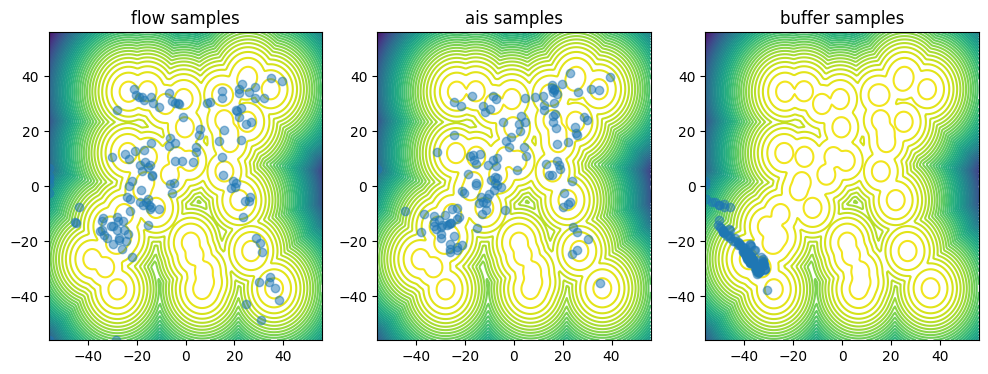

loss: 1.5543437412437864e+33, ess base: 0.1229594275355339,ess ais: 0.007874015718698502:  33%|███▎      | 1335/4000 [04:47<29:27,  1.51it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.039200394015359e+35, ess base: 0.17884401977062225,ess ais: 0.00800000037997961:  33%|███▎      | 1336/4000 [04:47<23:19,  1.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.08454784750938416,ess ais: 0.007893617264926434:  33%|███▎      | 1337/4000 [04:47<18:44,  2.37it/s]                 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0922211269090667e+34, ess base: 0.209865540266037,ess ais: 0.012164308689534664:  33%|███▎      | 1338/4000 [04:47<15:53,  2.79it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step


loss: 1.5543437412437864e+33, ess base: 0.2457226812839508,ess ais: 0.007936508394777775:  33%|███▎      | 1339/4000 [04:47<13:37,  3.25it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6242522269147957e+33, ess base: 0.2677365243434906,ess ais: 0.12469638139009476:  34%|███▎      | 1340/4000 [04:48<12:18,  3.60it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5542970090073034e+33, ess base: 0.19322599470615387,ess ais: 0.007948010228574276:  34%|███▎      | 1341/4000 [04:48<11:23,  3.89it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.584767385559197e+34, ess base: 0.22234496474266052,ess ais: 0.11675571650266647:  34%|███▎      | 1342/4000 [04:48<10:42,  4.14it/s]  

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.769440473237611e+34, ess base: 0.23912334442138672,ess ais: 0.12387536466121674:  34%|███▎      | 1343/4000 [04:48<10:12,  4.33it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3627715360020426e+35, ess base: 0.1875954568386078,ess ais: 0.05965500324964523:  34%|███▎      | 1344/4000 [04:48<09:51,  4.49it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.16840770840644836,ess ais: 0.007936508394777775:  34%|███▎      | 1345/4000 [04:49<09:19,  4.74it/s]                 

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.374422760788408e+34, ess base: 0.20826789736747742,ess ais: 0.0078125:  34%|███▎      | 1346/4000 [04:49<09:11,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.938893008373189e+33, ess base: 0.31002017855644226,ess ais: 0.14390245079994202:  34%|███▎      | 1348/4000 [04:49<09:00,  4.91it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.938887437643012e+33, ess base: 0.2630593478679657,ess ais: 0.007940088398754597:  34%|███▎      | 1349/4000 [04:49<08:56,  4.94it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.9905111228830304e+35, ess base: 0.2685798406600952,ess ais: 0.017179269343614578:  34%|███▍      | 1350/4000 [04:50<08:53,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4857192260030008e+35, ess base: 0.1278827041387558,ess ais: 0.027561437338590622:  34%|███▍      | 1351/4000 [04:50<08:52,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.901906639174855e+26, ess base: 0.2203591912984848,ess ais: 0.024695411324501038:  34%|███▍      | 1352/4000 [04:50<08:56,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4475922573562613e+35, ess base: 0.14476032555103302,ess ais: 0.007936508394777775:  34%|███▍      | 1353/4000 [04:50<08:53,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.796656173739377e+34, ess base: 0.25955715775489807,ess ais: 0.04802241548895836:  34%|███▍      | 1354/4000 [04:50<08:50,  4.99it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.505682534544436e+33, ess base: 0.2493247091770172,ess ais: 0.1456417441368103:  34%|███▍      | 1356/4000 [04:51<08:46,  5.02it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.340369574980728e+35, ess base: 0.17865145206451416,ess ais: 0.008233461529016495:  34%|███▍      | 1357/4000 [04:51<09:03,  4.86it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3841096608711968e+35, ess base: 0.22177015244960785,ess ais: 0.06973817944526672:  34%|███▍      | 1358/4000 [04:51<08:56,  4.92it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.049909158890138e+34, ess base: 0.27404648065567017,ess ais: 0.007874015718698502:  34%|███▍      | 1359/4000 [04:51<08:53,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.79668588430032e+34, ess base: 0.014713229611515999,ess ais: 0.008414624258875847:  34%|███▍      | 1360/4000 [04:52<08:57,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.566789371428742e+33, ess base: 0.2537069022655487,ess ais: 0.01627616211771965:  34%|███▍      | 1361/4000 [04:52<08:58,  4.90it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2499080422218192e+31, ess base: 0.13956455886363983,ess ais: 0.03347316384315491:  34%|███▍      | 1362/4000 [04:52<08:56,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.340369574980728e+35, ess base: 0.25188973546028137,ess ais: 0.0078125:  34%|███▍      | 1363/4000 [04:52<08:56,  4.92it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.536848416758901e+34, ess base: 0.018719835206866264,ess ais: 0.01080098282545805:  34%|███▍      | 1364/4000 [04:52<08:57,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.100898423580256e+34, ess base: 0.011319032870233059,ess ais: 0.007936508394777775:  34%|███▍      | 1365/4000 [04:53<08:56,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3404909921397812e+35, ess base: 0.2050904929637909,ess ais: 0.0777411237359047:  34%|███▍      | 1366/4000 [04:53<08:56,  4.91it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.9899365206343957e+35, ess base: 0.054638542234897614,ess ais: 0.017001595348119736:  34%|███▍      | 1367/4000 [04:53<08:57,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.447588692088948e+35, ess base: 0.1470770686864853,ess ais: 0.08445718139410019:  34%|███▍      | 1368/4000 [04:53<08:40,  5.06it/s]    

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.330177547921444e+35, ess base: 0.1586267054080963,ess ais: 0.0078125:  34%|███▍      | 1369/4000 [04:53<08:44,  5.02it/s]          

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.61400571225697e+34, ess base: 0.29363611340522766,ess ais: 0.17015312612056732:  34%|███▍      | 1370/4000 [04:54<08:46,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.803646573553214e+34, ess base: 0.2326798290014267,ess ais: 0.09760741144418716:  34%|███▍      | 1371/4000 [04:54<08:49,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.049644646538802e+35, ess base: 0.17478762567043304,ess ais: 0.0078125:  34%|███▍      | 1373/4000 [04:54<08:26,  5.18it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.79665122197922e+34, ess base: 0.2217252105474472,ess ais: 0.007936508394777775:  34%|███▍      | 1374/4000 [04:54<08:11,  5.35it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.995576917766603e+31, ess base: 0.2303287833929062,ess ais: 0.1198720633983612:  34%|███▍      | 1375/4000 [04:55<08:25,  5.19it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step


loss: 5.983672311568714e+33, ess base: 0.1520516276359558,ess ais: 0.03418850153684616:  34%|███▍      | 1376/4000 [04:55<08:18,  5.26it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.989811934348842e+35, ess base: 0.2999090552330017,ess ais: 0.00800000037997961:  34%|███▍      | 1377/4000 [04:55<08:30,  5.13it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4484132591903154e+35, ess base: 0.2732636332511902,ess ais: 0.007936508394777775:  34%|███▍      | 1378/4000 [04:55<08:44,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: inf, ess base: 0.26856550574302673,ess ais: 0.16375191509723663:  34%|███▍      | 1379/4000 [04:55<08:36,  5.08it/s]                   

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan loss in replay step
nan grad norm in replay step


loss: 4.577772529161219e+34, ess base: 0.19234780967235565,ess ais: 0.049251191318035126:  34%|███▍      | 1380/4000 [04:56<08:30,  5.13it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3184822008749437e+35, ess base: 0.19810442626476288,ess ais: 0.009610495530068874:  35%|███▍      | 1381/4000 [04:56<08:39,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5543019607674605e+33, ess base: 0.21759191155433655,ess ais: 0.007936508394777775:  35%|███▍      | 1382/4000 [04:56<09:01,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.20533797775859e+34, ess base: 0.04258744418621063,ess ais: 0.008797436021268368:  35%|███▍      | 1383/4000 [04:56<08:57,  4.87it/s]  

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.738154770731823e+28, ess base: 0.2736937999725342,ess ais: 0.007936508394777775:  35%|███▍      | 1384/4000 [04:56<08:54,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step


loss: 1.9898115382080294e+35, ess base: 0.03259028121829033,ess ais: 0.007874015718698502:  35%|███▍      | 1385/4000 [04:57<08:39,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5546451796433524e+33, ess base: 0.21646863222122192,ess ais: 0.06890907883644104:  35%|███▍      | 1386/4000 [04:57<08:42,  5.00it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.374422760788408e+34, ess base: 0.2496713250875473,ess ais: 0.007936508394777775:  35%|███▍      | 1387/4000 [04:57<08:45,  4.97it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5542963900372838e+33, ess base: 0.1010248064994812,ess ais: 0.0078125:  35%|███▍      | 1388/4000 [04:57<08:47,  4.95it/s]          

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.983276170756143e+33, ess base: 0.23533067107200623,ess ais: 0.007980656810104847:  35%|███▍      | 1389/4000 [04:57<08:49,  4.93it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.051157002449738e+34, ess base: 0.2755187451839447,ess ais: 0.15234346687793732:  35%|███▍      | 1391/4000 [04:58<08:35,  5.06it/s]  

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.554698101580032e+33, ess base: 0.3013717830181122,ess ais: 0.0078125:  35%|███▍      | 1392/4000 [04:58<08:40,  5.01it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.020669841840334e+34, ess base: 0.2640668451786041,ess ais: 0.0078125:  35%|███▍      | 1393/4000 [04:58<08:36,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.60700986550696e+34, ess base: 0.23379112780094147,ess ais: 0.13819004595279694:  35%|███▍      | 1394/4000 [04:58<08:33,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3634675554097304e+35, ess base: 0.23380200564861298,ess ais: 0.007874015718698502:  35%|███▍      | 1396/4000 [04:59<08:28,  5.12it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9110455148701083e+35, ess base: 0.20836634933948517,ess ais: 0.050798449665308:  35%|███▍      | 1397/4000 [04:59<08:29,  5.10it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5543499309439829e+33, ess base: 0.20584183931350708,ess ais: 0.10438983142375946:  35%|███▍      | 1398/4000 [04:59<08:29,  5.11it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.487475958964243e+29, ess base: 0.16159725189208984,ess ais: 0.025611525401473045:  35%|███▍      | 1399/4000 [04:59<08:37,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9898115382080294e+35, ess base: 0.23407414555549622,ess ais: 0.007874015718698502:  35%|███▌      | 1400/4000 [05:00<08:33,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.762444626487602e+34, ess base: 0.23182867467403412,ess ais: 0.09351304918527603:  35%|███▌      | 1401/4000 [05:00<08:32,  5.07it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3410655943884159e+35, ess base: 0.24304328858852386,ess ais: 0.007936508394777775:  35%|███▌      | 1403/4000 [05:00<08:39,  5.00it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.796656173739377e+34, ess base: 0.2804413139820099,ess ais: 0.0078125:  35%|███▌      | 1404/4000 [05:00<08:41,  4.98it/s]             

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5543493119739632e+33, ess base: 0.21045640110969543,ess ais: 0.0078125:  35%|███▌      | 1405/4000 [05:01<08:28,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6367507790364307e+33, ess base: 0.19884462654590607,ess ais: 0.07522094994783401:  35%|███▌      | 1406/4000 [05:01<08:34,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.796686379476336e+34, ess base: 0.3155718445777893,ess ais: 0.007874015718698502:  35%|███▌      | 1407/4000 [05:01<08:45,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.60704452782806e+34, ess base: 0.25468823313713074,ess ais: 0.12219192832708359:  35%|███▌      | 1408/4000 [05:01<08:44,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.796656173739377e+34, ess base: 0.2337079793214798,ess ais: 0.1103024035692215:  35%|███▌      | 1409/4000 [05:01<08:43,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step


loss: 1.4008984056135789e+35, ess base: 0.13452397286891937,ess ais: 0.0078125:  35%|███▌      | 1410/4000 [05:02<08:27,  5.11it/s]       

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.577776985745361e+34, ess base: 0.12504546344280243,ess ais: 0.030910324305295944:  35%|███▌      | 1412/4000 [05:02<08:30,  5.07it/s]

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: inf, ess base: 0.31819888949394226,ess ais: 0.17993278801441193:  35%|███▌      | 1413/4000 [05:02<08:15,  5.22it/s]                   

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.4874884260117576e+29, ess base: 0.08473005890846252,ess ais: 0.007874015718698502:  35%|███▌      | 1414/4000 [05:02<08:18,  5.19it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2537688456515006e+24, ess base: 0.26575005054473877,ess ais: 0.13773386180400848:  35%|███▌      | 1415/4000 [05:03<08:23,  5.14it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.734023172295961e+28, ess base: 0.014070120640099049,ess ais: 0.007874015718698502:  35%|███▌      | 1416/4000 [05:03<08:26,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9898115382080294e+35, ess base: 0.23425929248332977,ess ais: 0.06858150660991669:  35%|███▌      | 1417/4000 [05:03<08:28,  5.08it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.005358084397391e+35, ess base: 0.2288970649242401,ess ais: 0.0920054093003273:  35%|███▌      | 1418/4000 [05:03<08:33,  5.03it/s]   

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0341018636871597e+35, ess base: 0.2478267252445221,ess ais: 0.007874015718698502:  35%|███▌      | 1419/4000 [05:04<08:36,  5.00it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.441472916852822e+33, ess base: 0.18398712575435638,ess ais: 0.007879210636019707:  36%|███▌      | 1421/4000 [05:04<08:34,  5.02it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.983630221607378e+33, ess base: 0.2381875365972519,ess ais: 0.007936508394777775:  36%|███▌      | 1422/4000 [05:04<08:32,  5.03it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: inf, ess base: 0.3161386251449585,ess ais: 0.1925235539674759:  36%|███▌      | 1423/4000 [05:04<08:18,  5.17it/s]                    

nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.60826464153078e+34, ess base: 0.22803698480129242,ess ais: 0.007874015718698502:  36%|███▌      | 1424/4000 [05:04<08:21,  5.13it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.584802047880297e+34, ess base: 0.03042852133512497,ess ais: 0.0078125:  36%|███▌      | 1425/4000 [05:05<08:26,  5.08it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.614010664017127e+34, ess base: 0.11074303090572357,ess ais: 0.010016367770731449:  36%|███▌      | 1427/4000 [05:05<08:30,  5.04it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.2674210112870023e+21, ess base: 0.14365404844284058,ess ais: 0.007938127964735031:  36%|███▌      | 1428/4000 [05:05<08:32,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9905111228830304e+35, ess base: 0.09751790761947632,ess ais: 0.013826876878738403:  36%|███▌      | 1429/4000 [05:05<08:34,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.607014817267118e+34, ess base: 0.23035277426242828,ess ais: 0.026615818962454796:  36%|███▌      | 1430/4000 [05:06<08:35,  4.99it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.57902136307285e+34, ess base: 0.28098511695861816,ess ais: 0.008689653128385544:  36%|███▌      | 1431/4000 [05:06<08:32,  5.01it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.9019295131375065e+26, ess base: 0.22774638235569,ess ais: 0.13638225197792053:  36%|███▌      | 1432/4000 [05:06<08:43,  4.90it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.734455628877475e+34, ess base: 0.1743147373199463,ess ais: 0.009933367371559143:  36%|███▌      | 1433/4000 [05:06<08:42,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.049946792267333e+34, ess base: 0.3025466203689575,ess ais: 0.13959521055221558:  36%|███▌      | 1435/4000 [05:07<08:29,  5.03it/s]   

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.030451526240518e+31, ess base: 0.24670617282390594,ess ais: 0.029068928211927414:  36%|███▌      | 1436/4000 [05:07<08:12,  5.21it/s]

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.577772033985203e+34, ess base: 0.26200661063194275,ess ais: 0.007874015718698502:  36%|███▌      | 1437/4000 [05:07<08:13,  5.19it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.9956359133466e+31, ess base: 0.24483799934387207,ess ais: 0.10047891736030579:  36%|███▌      | 1438/4000 [05:07<08:17,  5.15it/s]   

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.734456619229507e+34, ess base: 0.2142978459596634,ess ais: 0.007874015718698502:  36%|███▌      | 1439/4000 [05:07<08:22,  5.09it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.8893908922557246e+26, ess base: 0.18924975395202637,ess ais: 0.00800000037997961:  36%|███▌      | 1441/4000 [05:08<08:28,  5.03it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.608298313499849e+34, ess base: 0.27749103307724,ess ais: 0.007874015718698502:  36%|███▌      | 1442/4000 [05:08<08:12,  5.20it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.9905111228830304e+35, ess base: 0.23794235289096832,ess ais: 0.007874015718698502:  36%|███▌      | 1443/4000 [05:08<08:21,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.615259497928758e+34, ess base: 0.19946669042110443,ess ais: 0.007936508394777775:  36%|███▌      | 1444/4000 [05:08<08:28,  5.03it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.3082897776748474e+35, ess base: 0.13600656390190125,ess ais: 0.021988898515701294:  36%|███▌      | 1445/4000 [05:09<08:39,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.608258699418592e+34, ess base: 0.21912065148353577,ess ais: 0.11462117731571198:  36%|███▌      | 1446/4000 [05:09<08:47,  4.84it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.734040172815299e+28, ess base: 0.22494040429592133,ess ais: 0.007936508394777775:  36%|███▌      | 1447/4000 [05:09<08:41,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3193060747298889e+35, ess base: 0.034799493849277496,ess ais: 0.008668440394103527:  36%|███▌      | 1448/4000 [05:09<08:39,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.034101269475941e+35, ess base: 0.18567973375320435,ess ais: 0.04629490524530411:  36%|███▌      | 1449/4000 [05:09<08:38,  4.92it/s]   

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3084147601012136e+35, ess base: 0.14655576646327972,ess ais: 0.034054018557071686:  36%|███▋      | 1450/4000 [05:10<08:38,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3340245875857732e+35, ess base: 0.23951087892055511,ess ais: 0.12173201143741608:  36%|███▋      | 1451/4000 [05:10<08:37,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.050608639550767e+22, ess base: 0.2297026365995407,ess ais: 0.050499893724918365:  36%|███▋      | 1452/4000 [05:10<08:36,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.60704452782806e+34, ess base: 0.2097443789243698,ess ais: 0.06896916776895523:  36%|███▋      | 1453/4000 [05:10<08:37,  4.92it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.4290272866678666e+33, ess base: 0.21771171689033508,ess ais: 0.057818882167339325:  36%|███▋      | 1454/4000 [05:10<08:40,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.9956359133466e+31, ess base: 0.124625563621521,ess ais: 0.007874015718698502:  36%|███▋      | 1455/4000 [05:11<08:43,  4.86it/s]     

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.608263651178749e+34, ess base: 0.3080115020275116,ess ais: 0.04992330074310303:  36%|███▋      | 1456/4000 [05:11<08:42,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
nan loss in replay step


loss: 1.5542963900372838e+33, ess base: 0.28132015466690063,ess ais: 0.008135436102747917:  36%|███▋      | 1457/4000 [05:11<08:13,  5.15it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.762439674727444e+34, ess base: 0.2373947650194168,ess ais: 0.007874015718698502:  36%|███▋      | 1458/4000 [05:11<08:22,  5.05it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.318603122857981e+35, ess base: 0.25347986817359924,ess ais: 0.09719979763031006:  36%|███▋      | 1459/4000 [05:11<08:33,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3245357104688036e+35, ess base: 0.3092270791530609,ess ais: 0.15381088852882385:  36%|███▋      | 1460/4000 [05:12<08:34,  4.93it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.334021616529679e+35, ess base: 0.24664732813835144,ess ais: 0.08641272038221359:  37%|███▋      | 1461/4000 [05:12<08:39,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.995582237040209e+31, ess base: 0.20972520112991333,ess ais: 0.0078125:  37%|███▋      | 1462/4000 [05:12<08:40,  4.88it/s]          

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.577776985745361e+34, ess base: 0.2566608190536499,ess ais: 0.007874015718698502:  37%|███▋      | 1463/4000 [05:12<08:43,  4.85it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5543019607674605e+33, ess base: 0.08423846960067749,ess ais: 0.007874015718698502:  37%|███▋      | 1464/4000 [05:12<08:44,  4.83it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6242522269147957e+33, ess base: 0.1742362678050995,ess ais: 0.01855960674583912:  37%|███▋      | 1466/4000 [05:13<08:36,  4.90it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.57902136307285e+34, ess base: 0.17723199725151062,ess ais: 0.007936508394777775:  37%|███▋      | 1467/4000 [05:13<08:32,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.60700986550696e+34, ess base: 0.20259225368499756,ess ais: 0.0078125:  37%|███▋      | 1468/4000 [05:13<08:29,  4.97it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5546451796433524e+33, ess base: 0.22052247822284698,ess ais: 0.10991653054952621:  37%|███▋      | 1470/4000 [05:14<08:25,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.4933823171716976e+29, ess base: 0.22826606035232544,ess ais: 0.0078125:  37%|███▋      | 1471/4000 [05:14<08:22,  5.04it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.053238352076356e+33, ess base: 0.3036377429962158,ess ais: 0.1549873650074005:  37%|███▋      | 1472/4000 [05:14<08:29,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4482918420312623e+35, ess base: 0.13851623237133026,ess ais: 0.007874015718698502:  37%|███▋      | 1473/4000 [05:14<08:35,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.850513019934741e+35, ess base: 0.12053631246089935,ess ais: 0.007874015718698502:  37%|███▋      | 1474/4000 [05:14<08:32,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2544799099894668e+24, ess base: 0.19026842713356018,ess ais: 0.0078125:  37%|███▋      | 1476/4000 [05:15<08:25,  4.99it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0060541038050787e+35, ess base: 0.24878959357738495,ess ais: 0.09118064492940903:  37%|███▋      | 1477/4000 [05:15<08:23,  5.01it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.423433959533592e+29, ess base: 0.2568187713623047,ess ais: 0.0078125:  37%|███▋      | 1478/4000 [05:15<08:23,  5.01it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0053673937064864e+35, ess base: 0.14555788040161133,ess ais: 0.007874060422182083:  37%|███▋      | 1479/4000 [05:15<08:23,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.487477847910836e+29, ess base: 0.24571546912193298,ess ais: 0.12109258025884628:  37%|███▋      | 1480/4000 [05:16<08:29,  4.95it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.030451526240518e+31, ess base: 0.21673133969306946,ess ais: 0.00787972193211317:  37%|███▋      | 1481/4000 [05:16<08:31,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.9898212436579374e+35, ess base: 0.2635737657546997,ess ais: 0.007936508394777775:  37%|███▋      | 1482/4000 [05:16<08:37,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.244874089771771e+31, ess base: 0.17631225287914276,ess ais: 0.058045871555805206:  37%|███▋      | 1483/4000 [05:16<08:18,  5.05it/s]

nan grad norm in replay step
nan loss in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3430329279251357e+31, ess base: 0.212331160902977,ess ais: 0.01541967038065195:  37%|███▋      | 1484/4000 [05:16<08:20,  5.02it/s]  

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2493507274189769e+31, ess base: 0.1988559067249298,ess ais: 0.007937935180962086:  37%|███▋      | 1485/4000 [05:17<08:21,  5.02it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.487475958964243e+29, ess base: 0.16496598720550537,ess ais: 0.007936583831906319:  37%|███▋      | 1486/4000 [05:17<08:23,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.61400571225697e+34, ess base: 0.2490701824426651,ess ais: 0.0078125:  37%|███▋      | 1487/4000 [05:17<08:26,  4.96it/s]             

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2841664612054766e+31, ess base: 0.205016627907753,ess ais: 0.0379854291677475:  37%|███▋      | 1488/4000 [05:17<08:29,  4.93it/s]

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.73320729014186e+34, ess base: 0.2405937761068344,ess ais: 0.007874015718698502:  37%|███▋      | 1490/4000 [05:18<08:27,  4.94it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.439632918272303e+26, ess base: 0.21387483179569244,ess ais: 0.06165909767150879:  37%|███▋      | 1491/4000 [05:18<08:30,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.989811934348842e+35, ess base: 0.13390395045280457,ess ais: 0.027094919234514236:  37%|███▋      | 1492/4000 [05:18<08:27,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.6242522269147957e+33, ess base: 0.22731085121631622,ess ais: 0.038867224007844925:  37%|███▋      | 1493/4000 [05:18<08:21,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.615254546168601e+34, ess base: 0.19439971446990967,ess ais: 0.025162270292639732:  37%|███▋      | 1494/4000 [05:18<08:18,  5.03it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.995576917766603e+31, ess base: 0.19129498302936554,ess ais: 0.06613722443580627:  37%|███▋      | 1495/4000 [05:19<08:18,  5.02it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2492917318389797e+31, ess base: 0.2275935858488083,ess ais: 0.05050965026021004:  37%|███▋      | 1497/4000 [05:19<08:19,  5.01it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9898214417283437e+35, ess base: 0.1844145953655243,ess ais: 0.05928293243050575:  37%|███▋      | 1498/4000 [05:19<08:05,  5.15it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.31860718330131e+35, ess base: 0.2449776530265808,ess ais: 0.008234075270593166:  37%|███▋      | 1499/4000 [05:19<08:13,  5.07it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5174094597381963e+35, ess base: 0.28014448285102844,ess ais: 0.007874015718698502:  38%|███▊      | 1500/4000 [05:20<08:13,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9758921404063046e+35, ess base: 0.18143902719020844,ess ais: 0.00800000037997961:  38%|███▊      | 1501/4000 [05:20<08:14,  5.06it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.318478239466818e+35, ess base: 0.20461811125278473,ess ais: 0.007874023169279099:  38%|███▊      | 1502/4000 [05:20<08:18,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8365928298513912e+35, ess base: 0.2896476686000824,ess ais: 0.00800000037997961:  38%|███▊      | 1503/4000 [05:20<08:20,  4.99it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.439945288505549e+25, ess base: 0.010157967917621136,ess ais: 0.008424662053585052:  38%|███▊      | 1504/4000 [05:21<08:20,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.891039293306151e+26, ess base: 0.2513192892074585,ess ais: 0.09938177466392517:  38%|███▊      | 1506/4000 [05:21<08:18,  5.00it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.734147842771108e+28, ess base: 0.09866607934236526,ess ais: 0.007874015718698502:  38%|███▊      | 1507/4000 [05:21<08:31,  4.87it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.608258699418592e+34, ess base: 0.2634946405887604,ess ais: 0.13405215740203857:  38%|███▊      | 1508/4000 [05:21<08:26,  4.92it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.607103948949946e+34, ess base: 0.2144310623407364,ess ais: 0.007874015718698502:  38%|███▊      | 1509/4000 [05:21<08:23,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.447592653497074e+35, ess base: 0.2134135663509369,ess ais: 0.025815773755311966:  38%|███▊      | 1510/4000 [05:22<08:19,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.607014817267118e+34, ess base: 0.13006500899791718,ess ais: 0.017884911969304085:  38%|███▊      | 1511/4000 [05:22<08:17,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.637682019430983e+33, ess base: 0.2329784482717514,ess ais: 0.00800000037997961:  38%|███▊      | 1512/4000 [05:22<08:15,  5.03it/s]  

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.44772298382441e+35, ess base: 0.011558792553842068,ess ais: 0.007936508394777775:  38%|███▊      | 1514/4000 [05:22<08:16,  5.01it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2847293370670892e+31, ess base: 0.26066476106643677,ess ais: 0.07465923577547073:  38%|███▊      | 1515/4000 [05:23<08:11,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.577776985745361e+34, ess base: 0.28190338611602783,ess ais: 0.0078125:  38%|███▊      | 1516/4000 [05:23<08:15,  5.02it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.245426327086171e+31, ess base: 0.06917639821767807,ess ais: 0.007874015718698502:  38%|███▊      | 1517/4000 [05:23<08:17,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.373574080839499e+29, ess base: 0.22478865087032318,ess ais: 0.06418994069099426:  38%|███▊      | 1518/4000 [05:23<08:19,  4.97it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5552387718921898e+33, ess base: 0.05578720569610596,ess ais: 0.007936508394777775:  38%|███▊      | 1519/4000 [05:23<08:21,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.577772033985203e+34, ess base: 0.21755264699459076,ess ais: 0.0078125:  38%|███▊      | 1520/4000 [05:24<08:21,  4.94it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0053549152708904e+35, ess base: 0.19824855029582977,ess ais: 0.008882795460522175:  38%|███▊      | 1521/4000 [05:24<08:19,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.835884133937701e+35, ess base: 0.07702235877513885,ess ais: 0.011498705483973026:  38%|███▊      | 1523/4000 [05:24<08:12,  5.03it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.522769326769244e+35, ess base: 0.2405315637588501,ess ais: 0.07317322492599487:  38%|███▊      | 1524/4000 [05:24<08:14,  5.01it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.607108900710103e+34, ess base: 0.22629758715629578,ess ais: 0.00800000037997961:  38%|███▊      | 1525/4000 [05:25<08:14,  5.01it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.989820847517125e+35, ess base: 0.2511136829853058,ess ais: 0.007936508394777775:  38%|███▊      | 1526/4000 [05:25<08:12,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.3782313682719298e+35, ess base: 0.218017116189003,ess ais: 0.07094776630401611:  38%|███▊      | 1527/4000 [05:25<08:13,  5.01it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2499081631144012e+31, ess base: 0.2649410665035248,ess ais: 0.1327589452266693:  38%|███▊      | 1528/4000 [05:25<08:12,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5329485782873221e+35, ess base: 0.24273067712783813,ess ais: 0.007874015718698502:  38%|███▊      | 1529/4000 [05:26<08:11,  5.03it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9751826522109894e+35, ess base: 0.23014618456363678,ess ais: 0.007874015718698502:  38%|███▊      | 1531/4000 [05:26<08:11,  5.02it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174054983300706e+35, ess base: 0.22354336082935333,ess ais: 0.007936508394777775:  38%|███▊      | 1532/4000 [05:26<08:24,  4.90it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.608352782861577e+34, ess base: 0.22452963888645172,ess ais: 0.059010136872529984:  38%|███▊      | 1533/4000 [05:26<08:22,  4.91it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.578201846766843e+34, ess base: 0.22455264627933502,ess ais: 0.0319584384560585:  38%|███▊      | 1534/4000 [05:26<08:21,  4.92it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.010517620410726e+35, ess base: 0.014136695303022861,ess ais: 0.009999417699873447:  38%|███▊      | 1535/4000 [05:27<08:21,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5329578875964175e+35, ess base: 0.2726989984512329,ess ais: 0.024186156690120697:  38%|███▊      | 1536/4000 [05:27<08:17,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.850521933103024e+35, ess base: 0.22816458344459534,ess ais: 0.0078125:  38%|███▊      | 1537/4000 [05:27<08:11,  5.01it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5330896044165975e+35, ess base: 0.19949889183044434,ess ais: 0.007936508394777775:  38%|███▊      | 1538/4000 [05:27<08:06,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9898115382080294e+35, ess base: 0.27254706621170044,ess ais: 0.12719431519508362:  38%|███▊      | 1540/4000 [05:28<08:06,  5.06it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174055973652737e+35, ess base: 0.2456098198890686,ess ais: 0.12221501022577286:  39%|███▊      | 1541/4000 [05:28<08:05,  5.07it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.18644529972585e+30, ess base: 0.13959690928459167,ess ais: 0.0078125:  39%|███▊      | 1542/4000 [05:28<08:01,  5.11it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.255712654017661e+30, ess base: 0.27372312545776367,ess ais: 0.008017834275960922:  39%|███▊      | 1543/4000 [05:28<07:58,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.368963539994944e+29, ess base: 0.15023474395275116,ess ais: 0.0078125:  39%|███▊      | 1544/4000 [05:28<07:58,  5.13it/s]           

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5542970090073034e+33, ess base: 0.26402807235717773,ess ais: 0.09233514964580536:  39%|███▊      | 1546/4000 [05:29<07:56,  5.15it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.785257717033653e+34, ess base: 0.18321488797664642,ess ais: 0.0606912262737751:  39%|███▊      | 1547/4000 [05:29<07:54,  5.17it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0105269297198215e+35, ess base: 0.20956933498382568,ess ais: 0.11249096691608429:  39%|███▊      | 1548/4000 [05:29<07:53,  5.18it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5594883105620466e+33, ess base: 0.2412124127149582,ess ais: 0.008000612258911133:  39%|███▊      | 1549/4000 [05:29<07:54,  5.16it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.702952896529699e+27, ess base: 0.26852163672447205,ess ais: 0.12200774252414703:  39%|███▉      | 1550/4000 [05:30<07:58,  5.12it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3169416491010488e+31, ess base: 0.23469612002372742,ess ais: 0.0171186625957489:  39%|███▉      | 1551/4000 [05:30<07:56,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5585460834496456e+33, ess base: 0.02318272367119789,ess ais: 0.00819602981209755:  39%|███▉      | 1552/4000 [05:30<08:03,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.624912502174704e+33, ess base: 0.23444674909114838,ess ais: 0.146320641040802:  39%|███▉      | 1553/4000 [05:30<08:10,  4.99it/s]   

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.507216838467694e+35, ess base: 0.26993265748023987,ess ais: 0.15962624549865723:  39%|███▉      | 1555/4000 [05:31<08:10,  4.99it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0261124957792213e+35, ess base: 0.24120588600635529,ess ais: 0.007874015718698502:  39%|███▉      | 1556/4000 [05:31<08:08,  5.00it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3169342746535492e+31, ess base: 0.22113566100597382,ess ais: 0.0078125:  39%|███▉      | 1557/4000 [05:31<08:12,  4.96it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.5073844060314114e+35, ess base: 0.2463310956954956,ess ais: 0.007874015718698502:  39%|███▉      | 1558/4000 [05:31<08:13,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5174055973652737e+35, ess base: 0.17998623847961426,ess ais: 0.03073413297533989:  39%|███▉      | 1559/4000 [05:31<08:11,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9907256331330377e+35, ess base: 0.2658235728740692,ess ais: 0.0078125:  39%|███▉      | 1560/4000 [05:32<08:10,  4.97it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.942829162522101e+34, ess base: 0.25115689635276794,ess ais: 0.0078125:  39%|███▉      | 1561/4000 [05:32<08:17,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.578197390182702e+34, ess base: 0.1782897263765335,ess ais: 0.007936508394777775:  39%|███▉      | 1562/4000 [05:32<08:12,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.373573325260862e+29, ess base: 0.24104486405849457,ess ais: 0.007874015718698502:  39%|███▉      | 1563/4000 [05:32<08:07,  5.00it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.989945829943491e+35, ess base: 0.2563896179199219,ess ais: 0.007936508394777775:  39%|███▉      | 1564/4000 [05:32<08:10,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5381115805327673e+35, ess base: 0.15489257872104645,ess ais: 0.0078125:  39%|███▉      | 1565/4000 [05:33<09:09,  4.43it/s]         

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5175372151502506e+35, ess base: 0.09298792481422424,ess ais: 0.007874015718698502:  39%|███▉      | 1566/4000 [05:33<08:55,  4.55it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.55948273983187e+33, ess base: 0.2239503115415573,ess ais: 0.11607730388641357:  39%|███▉      | 1568/4000 [05:33<08:24,  4.82it/s]    

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.001295544131023e+35, ess base: 0.23995521664619446,ess ais: 0.15480943024158478:  39%|███▉      | 1569/4000 [05:33<08:14,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.468294774291645e+35, ess base: 0.23909787833690643,ess ais: 0.09106963127851486:  39%|███▉      | 1570/4000 [05:34<08:07,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.071547043046963e+33, ess base: 0.22804725170135498,ess ais: 0.12353312969207764:  39%|███▉      | 1571/4000 [05:34<08:02,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.785258212209669e+34, ess base: 0.1427541971206665,ess ais: 0.007874015718698502:  39%|███▉      | 1573/4000 [05:34<07:53,  5.12it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.578196895006686e+34, ess base: 0.21166881918907166,ess ais: 0.007936508394777775:  39%|███▉      | 1574/4000 [05:34<07:55,  5.11it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.026194893068236e+35, ess base: 0.23535796999931335,ess ais: 0.00825531780719757:  39%|███▉      | 1575/4000 [05:35<08:00,  5.05it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.249548945726356e+30, ess base: 0.03624806925654411,ess ais: 0.008555491454899311:  39%|███▉      | 1576/4000 [05:35<08:04,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0706103866647386e+33, ess base: 0.19261956214904785,ess ais: 0.007874015718698502:  39%|███▉      | 1577/4000 [05:35<08:05,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.316928834487361e+31, ess base: 0.2581580579280853,ess ais: 0.10450761765241623:  39%|███▉      | 1578/4000 [05:35<08:05,  4.99it/s]   

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706159573949154e+33, ess base: 0.2941558063030243,ess ais: 0.14538632333278656:  39%|███▉      | 1579/4000 [05:35<08:18,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9911938970177253e+31, ess base: 0.2776191830635071,ess ais: 0.14510217308998108:  40%|███▉      | 1580/4000 [05:36<08:13,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6452791551649923e+23, ess base: 0.1746341437101364,ess ais: 0.008064515888690948:  40%|███▉      | 1581/4000 [05:36<08:13,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706108508922534e+33, ess base: 0.26753318309783936,ess ais: 0.0250372514128685:  40%|███▉      | 1582/4000 [05:36<08:23,  4.80it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.005528623017203e+35, ess base: 0.2567838132381439,ess ais: 0.08605410903692245:  40%|███▉      | 1583/4000 [05:36<08:19,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.571038910098599e+33, ess base: 0.24468813836574554,ess ais: 0.0078125:  40%|███▉      | 1584/4000 [05:36<08:16,  4.87it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.659838451978896e+31, ess base: 0.2861275374889374,ess ais: 0.0078125:  40%|███▉      | 1585/4000 [05:37<08:14,  4.88it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174573927765174e+35, ess base: 0.0998833179473877,ess ais: 0.0078125:  40%|███▉      | 1586/4000 [05:37<08:16,  4.86it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.572651481742273e+33, ess base: 0.027748828753829002,ess ais: 0.008519154042005539:  40%|███▉      | 1587/4000 [05:37<08:15,  4.87it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.6291561606293744e+33, ess base: 0.26720115542411804,ess ais: 0.1727726310491562:  40%|███▉      | 1589/4000 [05:37<08:10,  4.92it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9898115382080294e+35, ess base: 0.27607136964797974,ess ais: 0.007874015718698502:  40%|███▉      | 1590/4000 [05:38<08:09,  4.92it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0106426028370924e+35, ess base: 0.12916110455989838,ess ais: 0.026739418506622314:  40%|███▉      | 1591/4000 [05:38<08:07,  4.94it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.249755369810055e+30, ess base: 0.22244256734848022,ess ais: 0.06722770631313324:  40%|███▉      | 1592/4000 [05:38<08:07,  4.94it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.0706103866647386e+33, ess base: 0.2646232545375824,ess ais: 0.00800000037997961:  40%|███▉      | 1593/4000 [05:38<08:05,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5717208603177402e+33, ess base: 0.043616101145744324,ess ais: 0.007880685850977898:  40%|███▉      | 1594/4000 [05:38<08:05,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5542970090073034e+33, ess base: 0.3029756247997284,ess ais: 0.007874015718698502:  40%|███▉      | 1595/4000 [05:39<08:04,  4.96it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706105414072436e+33, ess base: 0.28241172432899475,ess ais: 0.15351422131061554:  40%|███▉      | 1596/4000 [05:39<08:03,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.890376317324142e+26, ess base: 0.24285252392292023,ess ais: 0.031138578429818153:  40%|███▉      | 1597/4000 [05:39<08:02,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5543019607674605e+33, ess base: 0.22099703550338745,ess ais: 0.0078125:  40%|███▉      | 1598/4000 [05:39<08:01,  4.99it/s]          

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5674657509177065e+33, ess base: 0.22872130572795868,ess ais: 0.05753488093614578:  40%|████      | 1600/4000 [05:40<08:01,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.249548945726356e+30, ess base: 0.021906653419137,ess ais: 0.009044087491929531:  40%|████      | 1601/4000 [05:40<08:00,  4.99it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5175303817212337e+35, ess base: 0.1346772462129593,ess ais: 0.06315851211547852:  40%|████      | 1602/4000 [05:40<08:01,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.231900443909445e+26, ess base: 0.2146667093038559,ess ais: 0.0717422217130661:  40%|████      | 1603/4000 [05:40<08:02,  4.97it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9899856420951545e+35, ess base: 0.10477809607982635,ess ais: 0.007874015718698502:  40%|████      | 1604/4000 [05:41<08:03,  4.96it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.579958113339145e+33, ess base: 0.2309238165616989,ess ais: 0.007874015718698502:  40%|████      | 1605/4000 [05:41<08:03,  4.95it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.533125356124932e+35, ess base: 0.2455257773399353,ess ais: 0.14210201799869537:  40%|████      | 1606/4000 [05:41<08:06,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.989820847517125e+35, ess base: 0.27441924810409546,ess ais: 0.007874015718698502:  40%|████      | 1608/4000 [05:41<07:58,  5.00it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.166172702945575e+19, ess base: 0.23796331882476807,ess ais: 0.12269093096256256:  40%|████      | 1609/4000 [05:42<07:59,  4.98it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.567465131947687e+33, ess base: 0.24541506171226501,ess ais: 0.0078125:  40%|████      | 1610/4000 [05:42<08:01,  4.96it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.369551380174731e+29, ess base: 0.12370026856660843,ess ais: 0.008759929798543453:  40%|████      | 1611/4000 [05:42<08:03,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5329577885612144e+35, ess base: 0.24733230471611023,ess ais: 0.1010519340634346:  40%|████      | 1612/4000 [05:42<08:01,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.522769326769244e+35, ess base: 0.29514044523239136,ess ais: 0.13937386870384216:  40%|████      | 1613/4000 [05:42<08:00,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5331159477806335e+35, ess base: 0.23685362935066223,ess ais: 0.06760314106941223:  40%|████      | 1614/4000 [05:43<08:00,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.444044494011019e+27, ess base: 0.1921754628419876,ess ais: 0.012070216238498688:  40%|████      | 1615/4000 [05:43<08:02,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2499114272141141e+31, ess base: 0.21336975693702698,ess ais: 0.0078125:  40%|████      | 1617/4000 [05:43<07:48,  5.09it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174149066743692e+35, ess base: 0.276653528213501,ess ais: 0.04874137416481972:  40%|████      | 1618/4000 [05:43<07:43,  5.14it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5726570524724498e+33, ess base: 0.2458963692188263,ess ais: 0.11809442937374115:  40%|████      | 1619/4000 [05:43<07:44,  5.13it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.010517620410726e+35, ess base: 0.2189451903104782,ess ais: 0.007874015718698502:  40%|████      | 1620/4000 [05:44<07:40,  5.16it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.98999495140425e+35, ess base: 0.18694786727428436,ess ais: 0.06574302911758423:  41%|████      | 1621/4000 [05:44<07:39,  5.17it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5073483572174674e+35, ess base: 0.25549742579460144,ess ais: 0.12150494009256363:  41%|████      | 1623/4000 [05:44<07:37,  5.19it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.50734875335828e+35, ess base: 0.25011691451072693,ess ais: 0.007874015718698502:  41%|████      | 1624/4000 [05:44<07:38,  5.18it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5175890105614943e+35, ess base: 0.26635614037513733,ess ais: 0.1206950917840004:  41%|████      | 1625/4000 [05:45<07:43,  5.12it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0706110056347583e+33, ess base: 0.285269170999527,ess ais: 0.13980422914028168:  41%|████      | 1626/4000 [05:45<07:50,  5.05it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0105602055480775e+35, ess base: 0.27114176750183105,ess ais: 0.007874015718698502:  41%|████      | 1627/4000 [05:45<07:53,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5382432973529472e+35, ess base: 0.23027697205543518,ess ais: 0.007874015718698502:  41%|████      | 1628/4000 [05:45<07:53,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.575173923644592e+27, ess base: 0.23249551653862,ess ais: 0.11117328703403473:  41%|████      | 1629/4000 [05:45<07:53,  5.01it/s]     

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.367684345362064e+29, ess base: 0.21193888783454895,ess ais: 0.05905206501483917:  41%|████      | 1631/4000 [05:46<07:54,  4.99it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0715527685196446e+33, ess base: 0.04246225953102112,ess ais: 0.007874015718698502:  41%|████      | 1632/4000 [05:46<07:58,  4.95it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706102319222337e+33, ess base: 0.23442120850086212,ess ais: 0.00787432212382555:  41%|████      | 1633/4000 [05:46<08:01,  4.92it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5542963900372838e+33, ess base: 0.22511087357997894,ess ais: 0.09539707750082016:  41%|████      | 1634/4000 [05:46<08:02,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.0837795928026565e+33, ess base: 0.15847325325012207,ess ais: 0.030079176649451256:  41%|████      | 1635/4000 [05:47<08:03,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.629308771820968e+27, ess base: 0.20758475363254547,ess ais: 0.07098360359668732:  41%|████      | 1636/4000 [05:47<08:02,  4.90it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.533080196072299e+35, ess base: 0.2515319883823395,ess ais: 0.00800000037997961:  41%|████      | 1637/4000 [05:47<07:57,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9899789077013408e+35, ess base: 0.24405543506145477,ess ais: 0.018013514578342438:  41%|████      | 1638/4000 [05:47<07:58,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174054983300706e+35, ess base: 0.22345231473445892,ess ais: 0.0078125:  41%|████      | 1639/4000 [05:47<07:56,  4.96it/s]           

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5543022702524704e+33, ess base: 0.2967395782470703,ess ais: 0.007891054265201092:  41%|████      | 1641/4000 [05:48<07:55,  4.97it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.083778973832637e+33, ess base: 0.21644580364227295,ess ais: 0.10927999764680862:  41%|████      | 1642/4000 [05:48<07:52,  4.99it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5381116795679704e+35, ess base: 0.28498080372810364,ess ais: 0.027549266815185547:  41%|████      | 1643/4000 [05:48<07:51,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.517448083467422e+35, ess base: 0.2743784785270691,ess ais: 0.011134948581457138:  41%|████      | 1644/4000 [05:48<07:49,  5.02it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2498546077005923e+31, ess base: 0.023022152483463287,ess ais: 0.011661005206406116:  41%|████      | 1645/4000 [05:49<07:46,  5.04it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4111170913416104e+31, ess base: 0.1521247774362564,ess ais: 0.10464686900377274:  41%|████      | 1647/4000 [05:49<07:45,  5.05it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174054983300706e+35, ess base: 0.24936257302761078,ess ais: 0.007815524935722351:  41%|████      | 1648/4000 [05:49<07:44,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.7679362618115647e+31, ess base: 0.30227866768836975,ess ais: 0.0078125:  41%|████      | 1649/4000 [05:49<07:43,  5.07it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706111603772632e+33, ess base: 0.2151545286178589,ess ais: 0.12067793309688568:  41%|████▏     | 1651/4000 [05:50<07:41,  5.08it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6748094418269369e+31, ess base: 0.23048362135887146,ess ais: 0.008130080997943878:  41%|████▏     | 1652/4000 [05:50<07:40,  5.10it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3168699597999457e+31, ess base: 0.2783760130405426,ess ais: 0.0078125:  41%|████▏     | 1653/4000 [05:50<07:39,  5.11it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5684027167849407e+33, ess base: 0.21585698425769806,ess ais: 0.08741690218448639:  41%|████▏     | 1654/4000 [05:50<07:39,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2788468195202197e+26, ess base: 0.25612881779670715,ess ais: 0.009331761859357357:  41%|████▏     | 1655/4000 [05:51<07:40,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.186317153588971e+30, ess base: 0.02313675917685032,ess ais: 0.007874015718698502:  41%|████▏     | 1656/4000 [05:51<07:41,  5.08it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706102319222337e+33, ess base: 0.2577373683452606,ess ais: 0.0078125:  41%|████▏     | 1658/4000 [05:51<07:45,  5.03it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4105522811986865e+31, ess base: 0.023918747901916504,ess ais: 0.008248410187661648:  41%|████▏     | 1659/4000 [05:51<07:53,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2493668061323777e+31, ess base: 0.16393880546092987,ess ais: 0.03862050920724869:  42%|████▏     | 1660/4000 [05:52<07:51,  4.97it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3435314889331448e+31, ess base: 0.00852211844176054,ess ais: 0.0078125:  42%|████▏     | 1661/4000 [05:52<07:45,  5.02it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5174054983300706e+35, ess base: 0.2603049874305725,ess ais: 0.007874015718698502:  42%|████▏     | 1662/4000 [05:52<07:49,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.6249069314445273e+33, ess base: 0.2906716763973236,ess ais: 0.15789850056171417:  42%|████▏     | 1663/4000 [05:52<07:51,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2493079314449625e+31, ess base: 0.235816091299057,ess ais: 0.08322923630475998:  42%|████▏     | 1664/4000 [05:52<07:51,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.249548643494901e+30, ess base: 0.26823922991752625,ess ais: 0.1389240026473999:  42%|████▏     | 1665/4000 [05:53<07:52,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.07486069904712e+33, ess base: 0.2840113937854767,ess ais: 0.01196254137903452:  42%|████▏     | 1666/4000 [05:53<07:52,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5175372151502506e+35, ess base: 0.23069052398204803,ess ais: 0.00800000037997961:  42%|████▏     | 1668/4000 [05:53<07:47,  4.99it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.7679362618115647e+31, ess base: 0.29864737391471863,ess ais: 0.1264285445213318:  42%|████▏     | 1669/4000 [05:53<07:47,  4.99it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.23300282133529e+26, ess base: 0.2640831470489502,ess ais: 0.03330341354012489:  42%|████▏     | 1670/4000 [05:54<07:47,  4.99it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.2502655365059324e+30, ess base: 0.25843334197998047,ess ais: 0.12192517518997192:  42%|████▏     | 1671/4000 [05:54<07:46,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.368962028837669e+29, ess base: 0.2525333762168884,ess ais: 0.11521925032138824:  42%|████▏     | 1672/4000 [05:54<07:49,  4.96it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5542965447797887e+33, ess base: 0.040723368525505066,ess ais: 0.014129498973488808:  42%|████▏     | 1673/4000 [05:54<07:51,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.084715784957366e+33, ess base: 0.21331161260604858,ess ais: 0.010306260548532009:  42%|████▏     | 1674/4000 [05:54<07:45,  5.00it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9194022714493895e+19, ess base: 0.19800586998462677,ess ais: 0.0078125:  42%|████▏     | 1676/4000 [05:55<07:44,  5.00it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5382364639239304e+35, ess base: 0.29759347438812256,ess ais: 0.12671378254890442:  42%|████▏     | 1677/4000 [05:55<07:41,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2498547285931742e+31, ess base: 0.23102375864982605,ess ais: 0.007874015718698502:  42%|████▏     | 1678/4000 [05:55<07:42,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2493560466925832e+31, ess base: 0.23409351706504822,ess ais: 0.02570042945444584:  42%|████▏     | 1679/4000 [05:55<07:43,  5.01it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.890367093952105e+26, ess base: 0.21721439063549042,ess ais: 0.11469585448503494:  42%|████▏     | 1680/4000 [05:56<07:45,  4.99it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.192074058341976e+30, ess base: 0.2219647765159607,ess ais: 0.007874015718698502:  42%|████▏     | 1681/4000 [05:56<07:52,  4.91it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.43148993896405e+29, ess base: 0.2515047788619995,ess ais: 0.007936508394777775:  42%|████▏     | 1682/4000 [05:56<07:54,  4.89it/s] 

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706128625448172e+33, ess base: 0.24431654810905457,ess ais: 0.10450521111488342:  42%|████▏     | 1684/4000 [05:56<07:43,  5.00it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.56678138701406e+31, ess base: 0.2182425558567047,ess ais: 0.007874015718698502:  42%|████▏     | 1685/4000 [05:57<07:40,  5.03it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.532948479252119e+35, ess base: 0.2406807690858841,ess ais: 0.007874015718698502:  42%|████▏     | 1686/4000 [05:57<07:39,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.083778973832637e+33, ess base: 0.2128351479768753,ess ais: 0.10397546738386154:  42%|████▏     | 1687/4000 [05:57<07:35,  5.07it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3168699597999457e+31, ess base: 0.2434861958026886,ess ais: 0.0078125:  42%|████▏     | 1688/4000 [05:57<08:08,  4.73it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5382527056972458e+35, ess base: 0.20424455404281616,ess ais: 0.09259741008281708:  42%|████▏     | 1689/4000 [05:58<08:24,  4.58it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5175303817212337e+35, ess base: 0.2801796495914459,ess ais: 0.0078125:  42%|████▏     | 1690/4000 [05:58<08:13,  4.68it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174149066743692e+35, ess base: 0.19353511929512024,ess ais: 0.0078125:  42%|████▏     | 1691/4000 [05:58<07:59,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.835510500317326e+31, ess base: 0.23489108681678772,ess ais: 0.0078125:  42%|████▏     | 1693/4000 [05:58<07:42,  4.99it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.249880599605714e+31, ess base: 0.27446305751800537,ess ais: 0.14514842629432678:  42%|████▏     | 1694/4000 [05:59<07:38,  5.03it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.255251751048933e+30, ess base: 0.1622694730758667,ess ais: 0.019208598881959915:  42%|████▏     | 1695/4000 [05:59<07:34,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5174149066743692e+35, ess base: 0.257426381111145,ess ais: 0.12157675623893738:  42%|████▏     | 1696/4000 [05:59<07:32,  5.09it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.367685100940701e+29, ess base: 0.04584137722849846,ess ais: 0.0078125:  42%|████▏     | 1697/4000 [05:59<07:30,  5.11it/s]         

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2499360893008343e+31, ess base: 0.2895979583263397,ess ais: 0.007874015718698502:  42%|████▏     | 1699/4000 [06:00<07:29,  5.12it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5667192482269316e+31, ess base: 0.14450815320014954,ess ais: 0.0140477130189538:  42%|████▎     | 1700/4000 [06:00<07:31,  5.09it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.36822836198089e+29, ess base: 0.1594415009021759,ess ais: 0.007874015718698502:  43%|████▎     | 1701/4000 [06:00<07:30,  5.10it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.6258434330842467e+33, ess base: 0.18153122067451477,ess ais: 0.053008027374744415:  43%|████▎     | 1702/4000 [06:00<07:33,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.414667304688028e+26, ess base: 0.22553576529026031,ess ais: 0.1465199589729309:  43%|████▎     | 1703/4000 [06:00<07:35,  5.05it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6743088256450344e+31, ess base: 0.06413666903972626,ess ais: 0.0078125:  43%|████▎     | 1704/4000 [06:00<07:35,  5.04it/s]        

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.991175521345267e+31, ess base: 0.2149358093738556,ess ais: 0.007874015718698502:  43%|████▎     | 1706/4000 [06:01<07:50,  4.88it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5329909653542672e+35, ess base: 0.25828826427459717,ess ais: 0.0078125:  43%|████▎     | 1707/4000 [06:01<07:41,  4.96it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0748622464721692e+33, ess base: 0.21629665791988373,ess ais: 0.09633462876081467:  43%|████▎     | 1708/4000 [06:01<07:36,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5537862782749956e+35, ess base: 0.23008468747138977,ess ais: 0.0078125:  43%|████▎     | 1709/4000 [06:01<07:29,  5.10it/s]          

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174054983300706e+35, ess base: 0.2275298684835434,ess ais: 0.10535236448049545:  43%|████▎     | 1710/4000 [06:02<07:24,  5.15it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0748603895621103e+33, ess base: 0.1907000094652176,ess ais: 0.066291444003582:  43%|████▎     | 1711/4000 [06:02<07:34,  5.04it/s]  

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.6249066219595175e+33, ess base: 0.25869986414909363,ess ais: 0.0078125:  43%|████▎     | 1712/4000 [06:02<07:43,  4.94it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.42505543128915e+29, ess base: 0.2540363073348999,ess ais: 0.13755914568901062:  43%|████▎     | 1714/4000 [06:02<07:36,  5.01it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5674713216478833e+33, ess base: 0.09796711802482605,ess ais: 0.007936508394777775:  43%|████▎     | 1715/4000 [06:03<07:34,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.255158059297913e+30, ess base: 0.23296497762203217,ess ais: 0.008281391113996506:  43%|████▎     | 1716/4000 [06:03<07:35,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.6380776850074943e+33, ess base: 0.27875667810440063,ess ais: 0.14077559113502502:  43%|████▎     | 1717/4000 [06:03<07:36,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.6409362318800204e+27, ess base: 0.1464681178331375,ess ais: 0.02477218396961689:  43%|████▎     | 1718/4000 [06:03<07:34,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5175373141854537e+35, ess base: 0.22986723482608795,ess ais: 0.007874015718698502:  43%|████▎     | 1719/4000 [06:03<07:34,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5542963900372838e+33, ess base: 0.2575916051864624,ess ais: 0.007936508394777775:  43%|████▎     | 1721/4000 [06:04<07:33,  5.02it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.823784207577242e+26, ess base: 0.16678789258003235,ess ais: 0.02226860821247101:  43%|████▎     | 1722/4000 [06:04<07:33,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.6987831575656803e+23, ess base: 0.1910315304994583,ess ais: 0.0790465772151947:  43%|████▎     | 1723/4000 [06:04<07:32,  5.03it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.7418409935322731e+31, ess base: 0.16456280648708344,ess ais: 0.0078125:  43%|████▎     | 1724/4000 [06:04<07:37,  4.97it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.2797884335714622e+26, ess base: 0.013561083003878593,ess ais: 0.007874015718698502:  43%|████▎     | 1725/4000 [06:05<07:41,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5381540666349156e+35, ess base: 0.2882743179798126,ess ais: 0.008064515888690948:  43%|████▎     | 1726/4000 [06:05<07:42,  4.91it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0715527685196446e+33, ess base: 0.2797737419605255,ess ais: 0.007936508394777775:  43%|████▎     | 1727/4000 [06:05<07:34,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5667949421589188e+33, ess base: 0.2826918959617615,ess ais: 0.007874015718698502:  43%|████▎     | 1729/4000 [06:05<07:21,  5.14it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706128625448172e+33, ess base: 0.27059412002563477,ess ais: 0.1383284479379654:  43%|████▎     | 1730/4000 [06:06<07:18,  5.18it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.083778973832637e+33, ess base: 0.27340248227119446,ess ais: 0.007874015718698502:  43%|████▎     | 1731/4000 [06:06<07:17,  5.19it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.071547043046963e+33, ess base: 0.2380712628364563,ess ais: 0.12841492891311646:  43%|████▎     | 1732/4000 [06:06<07:26,  5.08it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5537794448459788e+35, ess base: 0.28242817521095276,ess ais: 0.12415121495723724:  43%|████▎     | 1733/4000 [06:06<07:27,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5175303817212337e+35, ess base: 0.21628539264202118,ess ais: 0.019902657717466354:  43%|████▎     | 1734/4000 [06:06<07:29,  5.04it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.8227873455274988e+26, ess base: 0.24327045679092407,ess ais: 0.007874015718698502:  43%|████▎     | 1735/4000 [06:07<07:33,  4.99it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.99114795783658e+31, ess base: 0.1360805183649063,ess ais: 0.020253270864486694:  43%|████▎     | 1736/4000 [06:07<07:39,  4.93it/s]   

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706102319222337e+33, ess base: 0.20515334606170654,ess ais: 0.007874015718698502:  43%|████▎     | 1737/4000 [06:07<07:38,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.252091921187915e+30, ess base: 0.25060275197029114,ess ais: 0.0078125:  43%|████▎     | 1738/4000 [06:07<07:41,  4.90it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5176715068857122e+35, ess base: 0.15628014504909515,ess ais: 0.027341710403561592:  43%|████▎     | 1739/4000 [06:08<07:50,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8868698333605057e+35, ess base: 0.20611847937107086,ess ais: 0.0146470433101058:  44%|████▎     | 1741/4000 [06:08<07:39,  4.91it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.886958766972928e+35, ess base: 0.17586494982242584,ess ais: 0.007874015718698502:  44%|████▎     | 1742/4000 [06:08<07:33,  4.97it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.390002750634211e+35, ess base: 0.23937328159809113,ess ais: 0.0078125:  44%|████▎     | 1743/4000 [06:08<07:30,  5.01it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0706103866647386e+33, ess base: 0.2696048319339752,ess ais: 0.1281462013721466:  44%|████▎     | 1744/4000 [06:08<07:27,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.7418247939262903e+31, ess base: 0.15944139659404755,ess ais: 0.04133523255586624:  44%|████▎     | 1745/4000 [06:09<07:24,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.95389372665114e+22, ess base: 0.21908189356327057,ess ais: 0.1066218838095665:  44%|████▎     | 1747/4000 [06:09<07:21,  5.10it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.100521493893952e+33, ess base: 0.18535685539245605,ess ais: 0.0078125:  44%|████▎     | 1748/4000 [06:09<07:20,  5.11it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.367683589783427e+29, ess base: 0.22357527911663055,ess ais: 0.007936508394777775:  44%|████▎     | 1749/4000 [06:09<07:27,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0757965817168198e+33, ess base: 0.2637217044830322,ess ais: 0.12225237488746643:  44%|████▍     | 1750/4000 [06:10<07:30,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3694215518226774e+35, ess base: 0.21448379755020142,ess ais: 0.07192620635032654:  44%|████▍     | 1751/4000 [06:10<07:30,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.8244324261639922e+26, ess base: 0.19161450862884521,ess ais: 0.007832716219127178:  44%|████▍     | 1752/4000 [06:10<07:33,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5381115805327673e+35, ess base: 0.2038842737674713,ess ais: 0.010461045429110527:  44%|████▍     | 1753/4000 [06:10<07:33,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 435525286625280.0, ess base: 0.22565054893493652,ess ais: 0.09763619303703308:  44%|████▍     | 1754/4000 [06:10<07:34,  4.94it/s]     

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.249582795649305e+30, ess base: 0.15763713419437408,ess ais: 0.007874015718698502:  44%|████▍     | 1755/4000 [06:11<07:28,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2493045464526676e+31, ess base: 0.2728634476661682,ess ais: 0.10687388479709625:  44%|████▍     | 1757/4000 [06:11<07:26,  5.03it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5175797012523988e+35, ess base: 0.2648923397064209,ess ais: 0.09444788843393326:  44%|████▍     | 1758/4000 [06:11<07:22,  5.06it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.252199213354406e+30, ess base: 0.21632570028305054,ess ais: 0.12277999520301819:  44%|████▍     | 1759/4000 [06:11<07:22,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0748597705920906e+33, ess base: 0.2835601568222046,ess ais: 0.007874015718698502:  44%|████▍     | 1760/4000 [06:12<07:19,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3168699597999457e+31, ess base: 0.2855689525604248,ess ais: 0.007874015718698502:  44%|████▍     | 1761/4000 [06:12<07:19,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.7418247939262903e+31, ess base: 0.10269863158464432,ess ais: 0.01989622972905636:  44%|████▍     | 1763/4000 [06:12<07:20,  5.08it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0715473525319728e+33, ess base: 0.15611106157302856,ess ais: 0.041160937398672104:  44%|████▍     | 1764/4000 [06:12<07:25,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.8668793066148016e+26, ess base: 0.2784402370452881,ess ais: 0.17480044066905975:  44%|████▍     | 1765/4000 [06:13<07:27,  4.99it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.0748622464721692e+33, ess base: 0.25479379296302795,ess ais: 0.1331489384174347:  44%|████▍     | 1766/4000 [06:13<07:47,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9074081499290784e+35, ess base: 0.2810290455818176,ess ais: 0.0078125:  44%|████▍     | 1767/4000 [06:13<07:45,  4.79it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.0757967364593247e+33, ess base: 0.28109991550445557,ess ais: 0.00800000037997961:  44%|████▍     | 1768/4000 [06:13<07:44,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.26431456208229065,ess ais: 0.12552154064178467:  44%|████▍     | 1769/4000 [06:14<07:41,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2845692762330455e+26, ess base: 0.15333321690559387,ess ais: 0.0078125:  44%|████▍     | 1770/4000 [06:14<07:39,  4.85it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.369506045456496e+29, ess base: 0.2216799259185791,ess ais: 0.0078125:  44%|████▍     | 1771/4000 [06:14<07:37,  4.87it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5175466234945491e+35, ess base: 0.0562305748462677,ess ais: 0.009749963879585266:  44%|████▍     | 1772/4000 [06:14<07:36,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.886744652863733e+35, ess base: 0.08719529956579208,ess ais: 0.012401054613292217:  44%|████▍     | 1773/4000 [06:14<07:36,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.249582795649305e+30, ess base: 0.1217450201511383,ess ais: 0.014621909707784653:  44%|████▍     | 1774/4000 [06:15<07:36,  4.88it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.392568572201556e+29, ess base: 0.3008975684642792,ess ais: 0.00800000037997961:  44%|████▍     | 1775/4000 [06:15<07:35,  4.88it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5381115805327673e+35, ess base: 0.121609166264534,ess ais: 0.020742230117321014:  44%|████▍     | 1776/4000 [06:15<07:35,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.8868337845465617e+35, ess base: 0.03959231823682785,ess ais: 0.007874015718698502:  44%|████▍     | 1777/4000 [06:15<07:34,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3692966684315143e+35, ess base: 0.22521762549877167,ess ais: 0.07791535556316376:  44%|████▍     | 1777/4000 [06:15<07:34,  4.89it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf sam

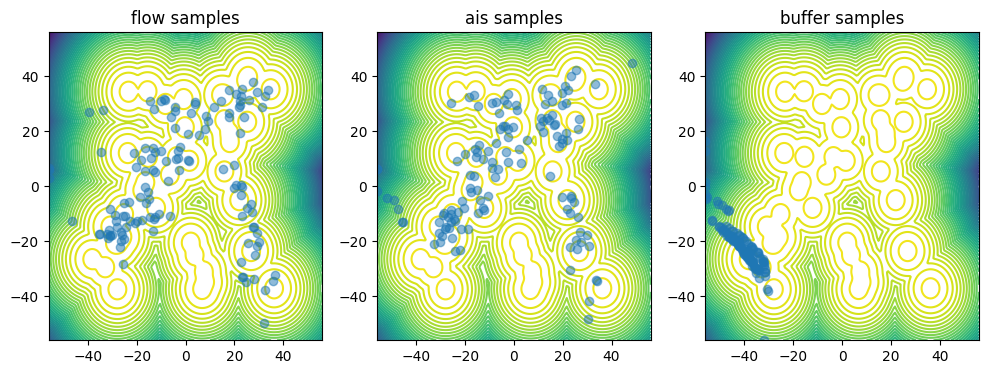

loss: 1.2787957220391355e+26, ess base: 0.2546803057193756,ess ais: 0.10891643166542053:  44%|████▍     | 1779/4000 [06:18<26:20,  1.41it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5381209888770659e+35, ess base: 0.30214589834213257,ess ais: 0.008952236734330654:  44%|████▍     | 1780/4000 [06:18<20:41,  1.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3171374950838264e+31, ess base: 0.08821658045053482,ess ais: 0.011370031163096428:  45%|████▍     | 1781/4000 [06:18<16:44,  2.21it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.18644469526294e+30, ess base: 0.3082122802734375,ess ais: 0.1868230402469635:  45%|████▍     | 1782/4000 [06:19<13:58,  2.65it/s]     

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.2496033473882385e+30, ess base: 0.2569465935230255,ess ais: 0.0078125:  45%|████▍     | 1783/4000 [06:19<11:59,  3.08it/s]       

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3168733447922406e+31, ess base: 0.2702270448207855,ess ais: 0.007874015718698502:  45%|████▍     | 1784/4000 [06:19<10:38,  3.47it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5433181282772857e+27, ess base: 0.24056725203990936,ess ais: 0.12292895466089249:  45%|████▍     | 1785/4000 [06:19<09:38,  3.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693060767758128e+35, ess base: 0.08846589177846909,ess ais: 0.018091993406414986:  45%|████▍     | 1786/4000 [06:19<08:57,  4.12it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.83551690762417e+31, ess base: 0.17351095378398895,ess ais: 0.007829569280147552:  45%|████▍     | 1787/4000 [06:20<08:28,  4.35it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8868765677543194e+35, ess base: 0.194178506731987,ess ais: 0.008517111651599407:  45%|████▍     | 1789/4000 [06:20<07:52,  4.68it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.886876369683913e+35, ess base: 0.23548392951488495,ess ais: 0.10358162969350815:  45%|████▍     | 1790/4000 [06:20<07:40,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5381115805327673e+35, ess base: 0.22232282161712646,ess ais: 0.08627571165561676:  45%|████▍     | 1791/4000 [06:20<07:32,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693391545336625e+35, ess base: 0.0263372715562582,ess ais: 0.007874015718698502:  45%|████▍     | 1792/4000 [06:21<07:26,  4.94it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.847085511308315e+30, ess base: 0.26347577571868896,ess ais: 0.1301036775112152:  45%|████▍     | 1794/4000 [06:21<07:36,  4.83it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.599873116959819e+30, ess base: 0.16759273409843445,ess ais: 0.05304080620408058:  45%|████▍     | 1795/4000 [06:21<07:29,  4.91it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.369751608513605e+29, ess base: 0.1912921965122223,ess ais: 0.09131170064210892:  45%|████▍     | 1796/4000 [06:21<07:30,  4.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.4417019673052624e+25, ess base: 0.23769158124923706,ess ais: 0.04855593293905258:  45%|████▍     | 1797/4000 [06:22<07:26,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.074862401214674e+33, ess base: 0.07338093966245651,ess ais: 0.011033802293241024:  45%|████▍     | 1798/4000 [06:22<07:24,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.534334996590064e+30, ess base: 0.3049425482749939,ess ais: 0.007874015718698502:  45%|████▍     | 1799/4000 [06:22<07:24,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706103866647386e+33, ess base: 0.026144197210669518,ess ais: 0.007874015718698502:  45%|████▌     | 1800/4000 [06:22<07:22,  4.97it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4105468410324982e+31, ess base: 0.1990301012992859,ess ais: 0.10174254328012466:  45%|████▌     | 1802/4000 [06:23<07:19,  5.00it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3693326182102551e+35, ess base: 0.26225602626800537,ess ais: 0.027618592604994774:  45%|████▌     | 1803/4000 [06:23<07:26,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.249548945726356e+30, ess base: 0.22004030644893646,ess ais: 0.10569995641708374:  45%|████▌     | 1804/4000 [06:23<07:25,  4.93it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.2536928653717041,ess ais: 0.0078125:  45%|████▌     | 1805/4000 [06:23<07:26,  4.92it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5175797012523988e+35, ess base: 0.23681141436100006,ess ais: 0.1502748429775238:  45%|████▌     | 1806/4000 [06:23<07:27,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5174054983300706e+35, ess base: 0.19261953234672546,ess ais: 0.044182367622852325:  45%|████▌     | 1807/4000 [06:24<07:33,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3169013918712557e+31, ess base: 0.2738341689109802,ess ais: 0.007874094881117344:  45%|████▌     | 1808/4000 [06:24<07:31,  4.85it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.027131302282214165,ess ais: 0.007872296497225761:  45%|████▌     | 1809/4000 [06:24<07:31,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.410559655646186e+31, ess base: 0.28328025341033936,ess ais: 0.007874015718698502:  45%|████▌     | 1810/4000 [06:24<07:29,  4.87it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0748597705920906e+33, ess base: 0.28574711084365845,ess ais: 0.09128695726394653:  45%|████▌     | 1811/4000 [06:24<07:29,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.071547043046963e+33, ess base: 0.11949164420366287,ess ais: 0.02752082608640194:  45%|████▌     | 1812/4000 [06:25<07:28,  4.88it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.597724553546909e+30, ess base: 0.08700892329216003,ess ais: 0.012867923825979233:  45%|████▌     | 1813/4000 [06:25<07:26,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.6222569112570295e+27, ess base: 0.17894788086414337,ess ais: 0.04505382850766182:  45%|████▌     | 1814/4000 [06:25<07:27,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3693391545336625e+35, ess base: 0.20431461930274963,ess ais: 0.08478689193725586:  45%|████▌     | 1815/4000 [06:25<07:31,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3168888190427317e+31, ess base: 0.1786917746067047,ess ais: 0.0078125:  45%|████▌     | 1816/4000 [06:25<07:33,  4.81it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5174149066743692e+35, ess base: 0.24259726703166962,ess ais: 0.12725457549095154:  45%|████▌     | 1817/4000 [06:26<07:33,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5174479844322189e+35, ess base: 0.2545817494392395,ess ais: 0.007977222092449665:  45%|████▌     | 1818/4000 [06:26<07:38,  4.76it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.866687638119935e+25, ess base: 0.020167794078588486,ess ais: 0.01224743016064167:  45%|████▌     | 1819/4000 [06:26<07:40,  4.74it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3168699597999457e+31, ess base: 0.25640228390693665,ess ais: 0.0078125:  46%|████▌     | 1820/4000 [06:26<07:42,  4.72it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5174414481088114e+35, ess base: 0.18679317831993103,ess ais: 0.007874015718698502:  46%|████▌     | 1821/4000 [06:27<07:37,  4.76it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.770285204679076e+31, ess base: 0.22939355671405792,ess ais: 0.007874015718698502:  46%|████▌     | 1822/4000 [06:27<07:38,  4.75it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3693751043124034e+35, ess base: 0.1675952970981598,ess ais: 0.007874015718698502:  46%|████▌     | 1823/4000 [06:27<07:41,  4.72it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5175466234945491e+35, ess base: 0.1953922063112259,ess ais: 0.007874015718698502:  46%|████▌     | 1824/4000 [06:27<07:49,  4.64it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.4359182212852516e+25, ess base: 0.2524021863937378,ess ais: 0.012186765670776367:  46%|████▌     | 1825/4000 [06:27<07:47,  4.65it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.886702265796788e+35, ess base: 0.15965744853019714,ess ais: 0.007936508394777775:  46%|████▌     | 1826/4000 [06:28<07:45,  4.67it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.849555346757787e+30, ess base: 0.22641485929489136,ess ais: 0.10249992460012436:  46%|████▌     | 1827/4000 [06:28<07:43,  4.69it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.26155680418014526,ess ais: 0.04656323418021202:  46%|████▌     | 1828/4000 [06:28<07:39,  4.72it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.410550226024793e+31, ess base: 0.1679677665233612,ess ais: 0.07115896046161652:  46%|████▌     | 1829/4000 [06:28<07:34,  4.78it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5175797012523988e+35, ess base: 0.30040621757507324,ess ais: 0.007936508394777775:  46%|████▌     | 1830/4000 [06:28<07:37,  4.74it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.0748597705920906e+33, ess base: 0.2986777424812317,ess ais: 0.007961142808198929:  46%|████▌     | 1831/4000 [06:29<07:32,  4.79it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5174054983300706e+35, ess base: 0.08812764286994934,ess ais: 0.007936527021229267:  46%|████▌     | 1832/4000 [06:29<07:49,  4.62it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3693391545336625e+35, ess base: 0.07864544540643692,ess ais: 0.007936508394777775:  46%|████▌     | 1833/4000 [06:29<08:11,  4.41it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174149066743692e+35, ess base: 0.1793532520532608,ess ais: 0.04377993941307068:  46%|████▌     | 1834/4000 [06:29<08:03,  4.48it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3692966684315143e+35, ess base: 0.23896868526935577,ess ais: 0.007937719114124775:  46%|████▌     | 1835/4000 [06:30<08:20,  4.32it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3694708713538425e+35, ess base: 0.20600979030132294,ess ais: 0.0078125:  46%|████▌     | 1836/4000 [06:30<08:12,  4.39it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.369480279698141e+35, ess base: 0.3146388828754425,ess ais: 0.15095609426498413:  46%|████▌     | 1837/4000 [06:30<08:08,  4.43it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.7418247939262903e+31, ess base: 0.14527767896652222,ess ais: 0.01736387424170971:  46%|████▌     | 1838/4000 [06:30<08:04,  4.47it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.886780701677677e+35, ess base: 0.2900976538658142,ess ais: 0.008195147849619389:  46%|████▌     | 1839/4000 [06:30<08:01,  4.49it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9075398667492584e+35, ess base: 0.21677568554878235,ess ais: 0.0078125:  46%|████▌     | 1840/4000 [06:31<07:51,  4.58it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3168699597999457e+31, ess base: 0.23268328607082367,ess ais: 0.007936508394777775:  46%|████▌     | 1841/4000 [06:31<07:57,  4.52it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.6766084443391054e+31, ess base: 0.2665225565433502,ess ais: 0.007945400662720203:  46%|████▌     | 1842/4000 [06:31<07:50,  4.59it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.7702980192927638e+31, ess base: 0.2489057332277298,ess ais: 0.07460418343544006:  46%|████▌     | 1843/4000 [06:31<07:43,  4.65it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.207373761323553e+26, ess base: 0.24285440146923065,ess ais: 0.007936508394777775:  46%|████▌     | 1844/4000 [06:32<07:39,  4.69it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3694283852516942e+35, ess base: 0.2680835723876953,ess ais: 0.12040732055902481:  46%|████▌     | 1845/4000 [06:32<07:48,  4.60it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.2498632664394557e+30, ess base: 0.2493336945772171,ess ais: 0.1366255283355713:  46%|████▌     | 1846/4000 [06:32<07:41,  4.67it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.36802737806338e+29, ess base: 0.23572930693626404,ess ais: 0.09703724086284637:  46%|████▌     | 1847/4000 [06:32<07:31,  4.76it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0706103866647386e+33, ess base: 0.23074990510940552,ess ais: 0.11376431584358215:  46%|████▌     | 1848/4000 [06:32<07:26,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.847095182714871e+30, ess base: 0.32093966007232666,ess ais: 0.2112111747264862:  46%|████▌     | 1849/4000 [06:33<07:22,  4.86it/s]  

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.5342805949281816e+30, ess base: 0.03752711042761803,ess ais: 0.009544146247208118:  46%|████▋     | 1850/4000 [06:33<07:21,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.186317153588971e+30, ess base: 0.023584019392728806,ess ais: 0.007936508394777775:  46%|████▋     | 1851/4000 [06:33<07:19,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.801993647582934e+26, ess base: 0.23983582854270935,ess ais: 0.024773849174380302:  46%|████▋     | 1853/4000 [06:33<07:05,  5.04it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3694376945607897e+35, ess base: 0.26806697249412537,ess ais: 0.15134471654891968:  46%|████▋     | 1854/4000 [06:34<07:20,  4.87it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.0602733643511045e+23, ess base: 0.15849414467811584,ess ais: 0.007815966382622719:  46%|████▋     | 1855/4000 [06:34<07:42,  4.64it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0748597705920906e+33, ess base: 0.21228353679180145,ess ais: 0.007812587544322014:  46%|████▋     | 1856/4000 [06:34<07:33,  4.72it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8019870067550675e+26, ess base: 0.2302878201007843,ess ais: 0.0080172810703516:  46%|████▋     | 1857/4000 [06:34<07:31,  4.75it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5975365655819587e+30, ess base: 0.1626889556646347,ess ais: 0.024408571422100067:  46%|████▋     | 1858/4000 [06:34<07:28,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3900811865151e+35, ess base: 0.24402084946632385,ess ais: 0.10339077562093735:  46%|████▋     | 1859/4000 [06:35<07:24,  4.81it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693391545336625e+35, ess base: 0.17511427402496338,ess ais: 0.07867015153169632:  46%|████▋     | 1860/4000 [06:35<07:22,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.956650289573432e+21, ess base: 0.19821856915950775,ess ais: 0.0078125:  47%|████▋     | 1861/4000 [06:35<07:20,  4.86it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3168833788765434e+31, ess base: 0.21580621600151062,ess ais: 0.0078125:  47%|████▋     | 1862/4000 [06:35<07:19,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.488912334323955e+27, ess base: 0.26549848914146423,ess ais: 0.010194113478064537:  47%|████▋     | 1863/4000 [06:35<07:18,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174054983300706e+35, ess base: 0.22240301966667175,ess ais: 0.0078125:  47%|████▋     | 1864/4000 [06:36<07:19,  4.86it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2798129677410802e+26, ess base: 0.26012659072875977,ess ais: 0.11733366549015045:  47%|████▋     | 1865/4000 [06:36<07:20,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174414481088114e+35, ess base: 0.15615147352218628,ess ais: 0.018425798043608665:  47%|████▋     | 1866/4000 [06:36<07:22,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.597384240928687e+30, ess base: 0.2759183645248413,ess ais: 0.007874015718698502:  47%|████▋     | 1867/4000 [06:36<07:17,  4.88it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.621396861777182e+26, ess base: 0.2605453431606293,ess ais: 0.12831997871398926:  47%|████▋     | 1868/4000 [06:37<07:15,  4.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.367683589783427e+29, ess base: 0.23993979394435883,ess ais: 0.014634755440056324:  47%|████▋     | 1869/4000 [06:37<07:14,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.436659549812714e+25, ess base: 0.2278032749891281,ess ais: 0.007855956442654133:  47%|████▋     | 1870/4000 [06:37<07:15,  4.89it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4105468410324982e+31, ess base: 0.2644372880458832,ess ais: 0.1464042216539383:  47%|████▋     | 1871/4000 [06:37<07:15,  4.89it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0706128625448172e+33, ess base: 0.17669227719306946,ess ais: 0.007874015718698502:  47%|████▋     | 1872/4000 [06:37<07:13,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3900811865151e+35, ess base: 0.2490098625421524,ess ais: 0.017388802021741867:  47%|████▋     | 1873/4000 [06:38<07:13,  4.91it/s]    

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174414481088114e+35, ess base: 0.29774388670921326,ess ais: 0.19149309396743774:  47%|████▋     | 1874/4000 [06:38<07:14,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5174054983300706e+35, ess base: 0.12851876020431519,ess ais: 0.007874015718698502:  47%|████▋     | 1875/4000 [06:38<07:09,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5175731649289914e+35, ess base: 0.2348599135875702,ess ais: 0.014183043502271175:  47%|████▋     | 1876/4000 [06:38<07:05,  4.99it/s] 

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6214704642860362e+26, ess base: 0.29572442173957825,ess ais: 0.07649611681699753:  47%|████▋     | 1878/4000 [06:39<07:01,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693485628779611e+35, ess base: 0.2421427220106125,ess ais: 0.1119907945394516:  47%|████▋     | 1879/4000 [06:39<06:58,  5.06it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5381838762310616e+35, ess base: 0.08639088273048401,ess ais: 0.007874015718698502:  47%|████▋     | 1880/4000 [06:39<06:57,  5.08it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0837816044552204e+33, ess base: 0.277127206325531,ess ais: 0.01718892715871334:  47%|████▋     | 1881/4000 [06:39<06:55,  5.10it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693326182102551e+35, ess base: 0.21203897893428802,ess ais: 0.088262178003788:  47%|████▋     | 1882/4000 [06:39<06:54,  5.11it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174777940283649e+35, ess base: 0.26976320147514343,ess ais: 0.007936966605484486:  47%|████▋     | 1884/4000 [06:40<06:54,  5.11it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.233292112025214e+30, ess base: 0.24845600128173828,ess ais: 0.011927802115678787:  47%|████▋     | 1885/4000 [06:40<06:55,  5.09it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5174054983300706e+35, ess base: 0.23319613933563232,ess ais: 0.12596090137958527:  47%|████▋     | 1886/4000 [06:40<06:53,  5.11it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5174054983300706e+35, ess base: 0.21369971334934235,ess ais: 0.025871289893984795:  47%|████▋     | 1887/4000 [06:40<06:51,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.2520372172945777e+30, ess base: 0.26923808455467224,ess ais: 0.166765958070755:  47%|████▋     | 1888/4000 [06:40<06:49,  5.16it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5668120233220383e+35, ess base: 0.02804119512438774,ess ais: 0.01958797313272953:  47%|████▋     | 1890/4000 [06:41<06:54,  5.09it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.4757177633771828e+25, ess base: 0.2814221978187561,ess ais: 0.007936508394777775:  47%|████▋     | 1891/4000 [06:41<07:04,  4.97it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5175138428423088e+35, ess base: 0.16455882787704468,ess ais: 0.050510089844465256:  47%|████▋     | 1892/4000 [06:41<07:01,  5.00it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.1829984486103058,ess ais: 0.0078125:  47%|████▋     | 1893/4000 [06:41<06:58,  5.04it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5174777940283649e+35, ess base: 0.10056547075510025,ess ais: 0.013710536062717438:  47%|████▋     | 1894/4000 [06:42<07:00,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0503009991111457e+25, ess base: 0.26534485816955566,ess ais: 0.14237309992313385:  47%|████▋     | 1895/4000 [06:42<07:03,  4.97it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.390002750634211e+35, ess base: 0.259850412607193,ess ais: 0.13817065954208374:  47%|████▋     | 1896/4000 [06:42<07:05,  4.95it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0492748081717878e+35, ess base: 0.25339558720588684,ess ais: 0.007936508394777775:  47%|████▋     | 1897/4000 [06:42<07:07,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4185289905011537e+35, ess base: 0.24891413748264313,ess ais: 0.10138748586177826:  47%|████▋     | 1898/4000 [06:42<07:06,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.040415810509342e+31, ess base: 0.253677636384964,ess ais: 0.1502695083618164:  47%|████▋     | 1899/4000 [06:43<07:06,  4.93it/s]    

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0492682718483803e+35, ess base: 0.22191479802131653,ess ais: 0.007874015718698502:  48%|████▊     | 1900/4000 [06:43<07:06,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1485172471194697e+31, ess base: 0.27827420830726624,ess ais: 0.0844668596982956:  48%|████▊     | 1901/4000 [06:43<07:05,  4.93it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0778432060867684e+33, ess base: 0.24420584738254547,ess ais: 0.02234003134071827:  48%|████▊     | 1902/4000 [06:43<07:04,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.1390822366988e+23, ess base: 0.23248744010925293,ess ais: 0.11115380376577377:  48%|████▊     | 1903/4000 [06:43<07:03,  4.95it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.052118465304374695,ess ais: 0.0078125:  48%|████▊     | 1904/4000 [06:44<07:39,  4.56it/s]      

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.599873116959819e+30, ess base: 0.2856975495815277,ess ais: 0.007936508394777775:  48%|████▊     | 1905/4000 [06:44<07:27,  4.68it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706102319222337e+33, ess base: 0.07726144045591354,ess ais: 0.01134475413709879:  48%|████▊     | 1907/4000 [06:44<07:11,  4.85it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3693391545336625e+35, ess base: 0.21226471662521362,ess ais: 0.00841180607676506:  48%|████▊     | 1908/4000 [06:45<07:08,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3694114502319568e+35, ess base: 0.2192671298980713,ess ais: 0.020912202075123787:  48%|████▊     | 1909/4000 [06:45<07:04,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.15172602236270905,ess ais: 0.008926281705498695:  48%|████▊     | 1910/4000 [06:45<07:04,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4185289905011537e+35, ess base: 0.021862531080842018,ess ais: 0.009181232191622257:  48%|████▊     | 1911/4000 [06:45<07:03,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693326182102551e+35, ess base: 0.06730248034000397,ess ais: 0.01045838464051485:  48%|████▊     | 1912/4000 [06:45<07:01,  4.96it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706128625448172e+33, ess base: 0.25137051939964294,ess ais: 0.12203346192836761:  48%|████▊     | 1913/4000 [06:46<06:59,  4.98it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0493046177679337e+35, ess base: 0.14924271404743195,ess ais: 0.01849301904439926:  48%|████▊     | 1915/4000 [06:46<07:15,  4.79it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.7418400263916174e+31, ess base: 0.251510351896286,ess ais: 0.1335427612066269:  48%|████▊     | 1916/4000 [06:46<07:07,  4.88it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.4363819263144045e+25, ess base: 0.2534927427768707,ess ais: 0.00787402130663395:  48%|████▊     | 1917/4000 [06:46<06:59,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.13320301473140717,ess ais: 0.007936508394777775:  48%|████▊     | 1918/4000 [06:47<06:54,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1319847029659118e+31, ess base: 0.2672521770000458,ess ais: 0.0078125:  48%|████▊     | 1920/4000 [06:47<06:48,  5.09it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693326182102551e+35, ess base: 0.2483033537864685,ess ais: 0.10406874865293503:  48%|████▊     | 1921/4000 [06:47<06:48,  5.09it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.6564069996258065e+27, ess base: 0.2869872748851776,ess ais: 0.11776531487703323:  48%|████▊     | 1922/4000 [06:47<06:49,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3168699597999457e+31, ess base: 0.23020341992378235,ess ais: 0.007874015718698502:  48%|████▊     | 1923/4000 [06:48<06:48,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693800560725605e+35, ess base: 0.2622433602809906,ess ais: 0.007874015718698502:  48%|████▊     | 1924/4000 [06:48<06:49,  5.06it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0494363345881137e+35, ess base: 0.2580801248550415,ess ais: 0.1025959849357605:  48%|████▊     | 1926/4000 [06:48<06:47,  5.08it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.4259945647264987e+25, ess base: 0.2510730028152466,ess ais: 0.007936508394777775:  48%|████▊     | 1927/4000 [06:48<06:47,  5.09it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.741841597995183e+31, ess base: 0.25989311933517456,ess ais: 0.007874015718698502:  48%|████▊     | 1928/4000 [06:49<06:47,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0706103866647386e+33, ess base: 0.08546572923660278,ess ais: 0.015365993604063988:  48%|████▊     | 1929/4000 [06:49<06:44,  5.12it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.249711546249094e+30, ess base: 0.2377191036939621,ess ais: 0.11134349554777145:  48%|████▊     | 1930/4000 [06:49<06:42,  5.14it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6766118293314003e+31, ess base: 0.1685846894979477,ess ais: 0.06393034011125565:  48%|████▊     | 1932/4000 [06:49<06:42,  5.14it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.23545128107070923,ess ais: 0.00800000037997961:  48%|████▊     | 1933/4000 [06:49<06:40,  5.16it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.369464335030435e+35, ess base: 0.23748110234737396,ess ais: 0.1449928879737854:  48%|████▊     | 1934/4000 [06:50<06:40,  5.16it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4186607073213337e+35, ess base: 0.2351568192243576,ess ais: 0.0078125:  48%|████▊     | 1935/4000 [06:50<06:39,  5.17it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693326182102551e+35, ess base: 0.24809567630290985,ess ais: 0.09052380919456482:  48%|████▊     | 1936/4000 [06:50<06:41,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3168885772575677e+31, ess base: 0.21166151762008667,ess ais: 0.0078125:  48%|████▊     | 1937/4000 [06:50<06:48,  5.05it/s]          

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5975812958372844e+30, ess base: 0.17384612560272217,ess ais: 0.007816425524652004:  48%|████▊     | 1939/4000 [06:51<06:46,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3168733447922406e+31, ess base: 0.2262035757303238,ess ais: 0.00800000037997961:  48%|████▊     | 1940/4000 [06:51<06:45,  5.08it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0503694826485193e+25, ess base: 0.202464297413826,ess ais: 0.05356922000646591:  49%|████▊     | 1941/4000 [06:51<06:46,  5.06it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5231952507659078e+26, ess base: 0.16987033188343048,ess ais: 0.0789000391960144:  49%|████▊     | 1942/4000 [06:51<06:44,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
6 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0493454202716286e+35, ess base: 0.029176754876971245,ess ais: 0.008666370995342731:  49%|████▊     | 1943/4000 [06:51<06:41,  5.12it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4185648412446914e+35, ess base: 0.22333264350891113,ess ais: 0.1240166574716568:  49%|████▊     | 1944/4000 [06:52<06:43,  5.09it/s]   

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.597418997546001e+30, ess base: 0.1965770572423935,ess ais: 0.0078125:  49%|████▊     | 1946/4000 [06:52<06:46,  5.06it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4185648412446914e+35, ess base: 0.22929026186466217,ess ais: 0.007874015718698502:  49%|████▊     | 1947/4000 [06:52<06:47,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693326182102551e+35, ess base: 0.14960698783397675,ess ais: 0.007874015718698502:  49%|████▊     | 1948/4000 [06:52<06:45,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.193662621590799e+23, ess base: 0.23902331292629242,ess ais: 0.07208812236785889:  49%|████▊     | 1949/4000 [06:53<06:42,  5.09it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.235332174345814e+30, ess base: 0.226457417011261,ess ais: 0.0078125:  49%|████▉     | 1950/4000 [06:53<06:54,  4.94it/s]            

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.23915550112724304,ess ais: 0.11083388328552246:  49%|████▉     | 1952/4000 [06:53<06:53,  4.95it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.418601286199448e+35, ess base: 0.24421103298664093,ess ais: 0.06889788806438446:  49%|████▉     | 1953/4000 [06:53<06:50,  4.99it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0492371747945935e+35, ess base: 0.20395761728286743,ess ais: 0.03975065425038338:  49%|████▉     | 1954/4000 [06:54<06:50,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.488506210806428e+27, ess base: 0.05343034118413925,ess ais: 0.0078125:  49%|████▉     | 1955/4000 [06:54<06:50,  4.98it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4885203779058767e+27, ess base: 0.23198984563350677,ess ais: 0.0078125:  49%|████▉     | 1956/4000 [06:54<06:48,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4185289905011537e+35, ess base: 0.23708628118038177,ess ais: 0.10376621782779694:  49%|████▉     | 1958/4000 [06:54<06:45,  5.04it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.865860124004729e+26, ess base: 0.16200126707553864,ess ais: 0.0078125:  49%|████▉     | 1959/4000 [06:55<06:45,  5.03it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3693689641298085e+35, ess base: 0.23811498284339905,ess ais: 0.00800000037997961:  49%|████▉     | 1960/4000 [06:55<06:43,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0492682718483803e+35, ess base: 0.2642570734024048,ess ais: 0.07420942932367325:  49%|████▉     | 1961/4000 [06:55<06:47,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0492682718483803e+35, ess base: 0.25072553753852844,ess ais: 0.007874015718698502:  49%|████▉     | 1962/4000 [06:55<06:50,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.922594821743318e+29, ess base: 0.18936435878276825,ess ais: 0.010328922420740128:  49%|████▉     | 1963/4000 [06:55<06:55,  4.91it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.087036976804475e+30, ess base: 0.2346472442150116,ess ais: 0.09442035853862762:  49%|████▉     | 1964/4000 [06:56<07:00,  4.84it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.232977186849205e+30, ess base: 0.0492597334086895,ess ais: 0.0078125:  49%|████▉     | 1965/4000 [06:56<07:03,  4.80it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3694049139085494e+35, ess base: 0.21566827595233917,ess ais: 0.007876445539295673:  49%|████▉     | 1966/4000 [06:56<07:05,  4.79it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.2500130236148834,ess ais: 0.007874015718698502:  49%|████▉     | 1967/4000 [06:56<07:00,  4.83it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.6802615289210337e+26, ess base: 0.2671670913696289,ess ais: 0.03579437732696533:  49%|████▉     | 1968/4000 [06:57<06:59,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5231961731031115e+26, ess base: 0.24751010537147522,ess ais: 0.10449766367673874:  49%|████▉     | 1969/4000 [06:57<06:57,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.29499953985214233,ess ais: 0.13058070838451385:  49%|████▉     | 1970/4000 [06:57<06:57,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.28800249099731445,ess ais: 0.1971166431903839:  49%|████▉     | 1971/4000 [06:57<06:59,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3693015211564683e+35, ess base: 0.22006455063819885,ess ais: 0.047856543213129044:  49%|████▉     | 1972/4000 [06:57<06:55,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8638684544247336e+26, ess base: 0.2456851452589035,ess ais: 0.09503617882728577:  49%|████▉     | 1973/4000 [06:58<06:50,  4.94it/s]  

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.0870134027509925e+30, ess base: 0.22346921265125275,ess ais: 0.031552787870168686:  49%|████▉     | 1974/4000 [06:58<06:50,  4.94it/s]

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.120920402947033e+20, ess base: 0.25643810629844666,ess ais: 0.04626543074846268:  49%|████▉     | 1976/4000 [06:58<06:46,  4.98it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.418601286199448e+35, ess base: 0.28368136286735535,ess ais: 0.007874015718698502:  49%|████▉     | 1977/4000 [06:58<06:50,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0492371747945935e+35, ess base: 0.20997515320777893,ess ais: 0.007901565171778202:  49%|████▉     | 1978/4000 [06:59<06:50,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.2542784369565368e+23, ess base: 0.17958258092403412,ess ais: 0.007874015718698502:  49%|████▉     | 1979/4000 [06:59<06:48,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.21146880090236664,ess ais: 0.007936508394777775:  50%|████▉     | 1980/4000 [06:59<06:45,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.232844205009047e+30, ess base: 0.2361062914133072,ess ais: 0.09228581935167313:  50%|████▉     | 1981/4000 [06:59<06:43,  5.01it/s]   

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4425401827175461e+26, ess base: 0.21201422810554504,ess ais: 0.007936508394777775:  50%|████▉     | 1983/4000 [07:00<06:41,  5.03it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.896188481739067e+29, ess base: 0.2653241455554962,ess ais: 0.008054103702306747:  50%|████▉     | 1984/4000 [07:00<06:39,  5.05it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0607269835694559e+25, ess base: 0.0169939324259758,ess ais: 0.008196172304451466:  50%|████▉     | 1985/4000 [07:00<06:38,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0492371747945935e+35, ess base: 0.04808095097541809,ess ais: 0.007936508394777775:  50%|████▉     | 1986/4000 [07:00<06:43,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3999678132461437e+22, ess base: 0.22104111313819885,ess ais: 0.010951247997581959:  50%|████▉     | 1987/4000 [07:00<06:46,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.418601286199448e+35, ess base: 0.2507576048374176,ess ais: 0.04928665608167648:  50%|████▉     | 1988/4000 [07:01<06:48,  4.92it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1319847029659118e+31, ess base: 0.22540722787380219,ess ais: 0.11258672922849655:  50%|████▉     | 1989/4000 [07:01<06:50,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5975178272317547e+30, ess base: 0.20465214550495148,ess ais: 0.007845746353268623:  50%|████▉     | 1990/4000 [07:01<07:00,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0509090499126753e+25, ess base: 0.07088964432477951,ess ais: 0.007874015718698502:  50%|████▉     | 1991/4000 [07:01<06:53,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.89618772616043e+29, ess base: 0.14892928302288055,ess ais: 0.049590520560741425:  50%|████▉     | 1992/4000 [07:01<06:46,  4.94it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4185289905011537e+35, ess base: 0.21638406813144684,ess ais: 0.007968531921505928:  50%|████▉     | 1993/4000 [07:02<06:42,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.597384240928687e+30, ess base: 0.23816446959972382,ess ais: 0.07642433792352676:  50%|████▉     | 1994/4000 [07:02<06:47,  4.93it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4185289905011537e+35, ess base: 0.22808028757572174,ess ais: 0.09597510099411011:  50%|████▉     | 1995/4000 [07:02<06:54,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.232977791312114e+30, ess base: 0.27170804142951965,ess ais: 0.12549424171447754:  50%|████▉     | 1996/4000 [07:02<06:53,  4.85it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.232855085341424e+30, ess base: 0.2277355194091797,ess ais: 0.019253136590123177:  50%|████▉     | 1997/4000 [07:02<06:53,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.8984701986667584e+23, ess base: 0.248025581240654,ess ais: 0.0078125:  50%|████▉     | 1998/4000 [07:03<06:52,  4.85it/s]           

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.309539599590611e+20, ess base: 0.25228410959243774,ess ais: 0.017624324187636375:  50%|████▉     | 1999/4000 [07:03<06:51,  4.86it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0900988118208199e+25, ess base: 0.22801358997821808,ess ais: 0.10742918401956558:  50%|█████     | 2000/4000 [07:03<06:52,  4.85it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.921076486471746e+29, ess base: 0.030380340293049812,ess ais: 0.007936508394777775:  50%|█████     | 2001/4000 [07:03<06:51,  4.85it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.23708492517471313,ess ais: 0.0873393714427948:  50%|█████     | 2003/4000 [07:04<06:47,  4.90it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.2132830023765564,ess ais: 0.04434475302696228:  50%|█████     | 2004/4000 [07:04<06:46,  4.91it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2466389555616408e+31, ess base: 0.26817023754119873,ess ais: 0.00787430815398693:  50%|█████     | 2005/4000 [07:04<06:45,  4.92it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.926420868204255e+22, ess base: 0.18933828175067902,ess ais: 0.05433487147092819:  50%|█████     | 2006/4000 [07:04<06:43,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3694050129437525e+35, ess base: 0.2504945993423462,ess ais: 0.007874015718698502:  50%|█████     | 2007/4000 [07:04<06:42,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0495521067405877e+35, ess base: 0.22717992961406708,ess ais: 0.10148327797651291:  50%|█████     | 2008/4000 [07:05<06:42,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4185289905011537e+35, ess base: 0.15832403302192688,ess ais: 0.00800000037997961:  50%|█████     | 2009/4000 [07:05<06:42,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.1593511150013746e+23, ess base: 0.1773652732372284,ess ais: 0.06192462146282196:  50%|█████     | 2010/4000 [07:05<06:42,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.232844205009047e+30, ess base: 0.09264568984508514,ess ais: 0.013641541823744774:  50%|█████     | 2011/4000 [07:05<06:44,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0594087331210884e+25, ess base: 0.07750865072011948,ess ais: 0.014267472550272942:  50%|█████     | 2012/4000 [07:05<06:45,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.597395121261064e+30, ess base: 0.20265470445156097,ess ais: 0.0078125:  50%|█████     | 2013/4000 [07:06<06:45,  4.89it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.0544484307734326e+23, ess base: 0.22960463166236877,ess ais: 0.0078125:  50%|█████     | 2014/4000 [07:06<06:45,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693689641298085e+35, ess base: 0.24178919196128845,ess ais: 0.1106729507446289:  50%|█████     | 2015/4000 [07:06<06:52,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0493046177679337e+35, ess base: 0.2600933015346527,ess ais: 0.13422466814517975:  50%|█████     | 2017/4000 [07:06<06:35,  5.01it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.9210719529999224e+29, ess base: 0.14650258421897888,ess ais: 0.00800000037997961:  50%|█████     | 2018/4000 [07:07<06:30,  5.08it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.597384240928687e+30, ess base: 0.30091148614883423,ess ais: 0.15396185219287872:  50%|█████     | 2019/4000 [07:07<06:26,  5.12it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4185289905011537e+35, ess base: 0.2259732335805893,ess ais: 0.06238514930009842:  50%|█████     | 2020/4000 [07:07<06:24,  5.15it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.557415339943498e+31, ess base: 0.28422752022743225,ess ais: 0.1417437195777893:  51%|█████     | 2021/4000 [07:07<06:23,  5.16it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.897523211401785e+29, ess base: 0.2368662804365158,ess ais: 0.0078125:  51%|█████     | 2023/4000 [07:08<06:24,  5.15it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4885132943561524e+27, ess base: 0.05415745824575424,ess ais: 0.007936508394777775:  51%|█████     | 2024/4000 [07:08<06:24,  5.14it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0492323220696395e+35, ess base: 0.02626107819378376,ess ais: 0.008425568230450153:  51%|█████     | 2025/4000 [07:08<06:24,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.488933880121033e+27, ess base: 0.2456706166267395,ess ais: 0.0078125:  51%|█████     | 2026/4000 [07:08<06:24,  5.14it/s]             

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.597394819029609e+30, ess base: 0.23682759702205658,ess ais: 0.007874015718698502:  51%|█████     | 2027/4000 [07:08<06:23,  5.15it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492682718483803e+35, ess base: 0.2795906364917755,ess ais: 0.007874015718698502:  51%|█████     | 2029/4000 [07:09<06:21,  5.16it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693326182102551e+35, ess base: 0.25626665353775024,ess ais: 0.007874015718698502:  51%|█████     | 2030/4000 [07:09<06:24,  5.13it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.722472460136988e+30, ess base: 0.16706891357898712,ess ais: 0.057575080543756485:  51%|█████     | 2031/4000 [07:09<06:26,  5.09it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.197690274480936e+31, ess base: 0.17985056340694427,ess ais: 0.008130080997943878:  51%|█████     | 2032/4000 [07:09<06:26,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.599872814728364e+30, ess base: 0.2612825036048889,ess ais: 0.13476106524467468:  51%|█████     | 2033/4000 [07:10<06:26,  5.08it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492682718483803e+35, ess base: 0.2785433530807495,ess ais: 0.007874015718698502:  51%|█████     | 2034/4000 [07:10<06:27,  5.08it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.6063773192082185e+31, ess base: 0.23290613293647766,ess ais: 0.030032236129045486:  51%|█████     | 2036/4000 [07:10<06:28,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.197690274480936e+31, ess base: 0.20944815874099731,ess ais: 0.0826670452952385:  51%|█████     | 2037/4000 [07:10<06:28,  5.05it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.19664914906024933,ess ais: 0.05355058237910271:  51%|█████     | 2038/4000 [07:11<06:28,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.6327429260322416e+27, ess base: 0.2338874787092209,ess ais: 0.008064515888690948:  51%|█████     | 2039/4000 [07:11<06:32,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.232844205009047e+30, ess base: 0.2802949547767639,ess ais: 0.14966779947280884:  51%|█████     | 2040/4000 [07:11<06:43,  4.86it/s]  

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.896186592792474e+29, ess base: 0.2311621755361557,ess ais: 0.05527234822511673:  51%|█████     | 2042/4000 [07:11<06:34,  4.96it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.235332174345814e+30, ess base: 0.08981835842132568,ess ais: 0.0078125:  51%|█████     | 2043/4000 [07:12<06:32,  4.98it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.922513219250494e+29, ess base: 0.2422858625650406,ess ais: 0.1367354393005371:  51%|█████     | 2044/4000 [07:12<06:31,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492371747945935e+35, ess base: 0.22408711910247803,ess ais: 0.0078125:  51%|█████     | 2045/4000 [07:12<06:30,  5.01it/s]       

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.232843600546137e+30, ess base: 0.058397818356752396,ess ais: 0.023550668731331825:  51%|█████     | 2046/4000 [07:12<06:30,  5.00it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492371747945935e+35, ess base: 0.24023602902889252,ess ais: 0.008612672798335552:  51%|█████     | 2047/4000 [07:12<06:35,  4.94it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.197926740371253e+31, ess base: 0.18251387774944305,ess ais: 0.007936508394777775:  51%|█████     | 2048/4000 [07:13<06:38,  4.90it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.197677943437576e+31, ess base: 0.2516416311264038,ess ais: 0.14463452994823456:  51%|█████     | 2049/4000 [07:13<06:41,  4.86it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.597384543160142e+30, ess base: 0.15900562703609467,ess ais: 0.007936508394777775:  51%|█████▏    | 2050/4000 [07:13<06:41,  4.85it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.27500560879707336,ess ais: 0.007936508394777775:  51%|█████▏    | 2052/4000 [07:13<06:33,  4.95it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3696164531024625e+35, ess base: 0.13872908055782318,ess ais: 0.0078125:  51%|█████▏    | 2053/4000 [07:14<06:30,  4.98it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0492731245733343e+35, ess base: 0.20002028346061707,ess ais: 0.00800000037997961:  51%|█████▏    | 2054/4000 [07:14<06:28,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3696164531024625e+35, ess base: 0.20976325869560242,ess ais: 0.09373490512371063:  51%|█████▏    | 2055/4000 [07:14<06:31,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.488919122725774e+27, ess base: 0.2171458750963211,ess ais: 0.06100885197520256:  51%|█████▏    | 2056/4000 [07:14<06:28,  5.00it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.597384240928687e+30, ess base: 0.20999450981616974,ess ais: 0.07614403963088989:  51%|█████▏    | 2058/4000 [07:15<06:25,  5.03it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5975178272317547e+30, ess base: 0.19750674068927765,ess ais: 0.007874015718698502:  51%|█████▏    | 2059/4000 [07:15<06:23,  5.06it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.3122383654117584,ess ais: 0.15447279810905457:  52%|█████▏    | 2060/4000 [07:15<06:24,  5.05it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3694050129437525e+35, ess base: 0.13217496871948242,ess ais: 0.007936508394777775:  52%|█████▏    | 2061/4000 [07:15<06:28,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.896296529484195e+29, ess base: 0.18345092236995697,ess ais: 0.007936515845358372:  52%|█████▏    | 2062/4000 [07:15<06:30,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.418957020649137e+35, ess base: 0.2654319405555725,ess ais: 0.00800000037997961:  52%|█████▏    | 2063/4000 [07:16<06:30,  4.96it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.203440892819679e+31, ess base: 0.20292626321315765,ess ais: 0.020496387034654617:  52%|█████▏    | 2064/4000 [07:16<06:30,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0495880565193285e+35, ess base: 0.2531066834926605,ess ais: 0.07097753882408142:  52%|█████▏    | 2065/4000 [07:16<06:38,  4.86it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.514109947127901e+28, ess base: 0.2691447138786316,ess ais: 0.0078125:  52%|█████▏    | 2066/4000 [07:16<06:35,  4.89it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.7763254851656655e+28, ess base: 0.26448145508766174,ess ais: 0.12670019268989563:  52%|█████▏    | 2067/4000 [07:16<06:33,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0493046177679337e+35, ess base: 0.25228047370910645,ess ais: 0.014096943661570549:  52%|█████▏    | 2068/4000 [07:17<06:31,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.673914415868958e+21, ess base: 0.08861095458269119,ess ais: 0.007936508394777775:  52%|█████▏    | 2069/4000 [07:17<06:30,  4.94it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402602633631481e+35, ess base: 0.20405873656272888,ess ais: 0.00800000037997961:  52%|█████▏    | 2070/4000 [07:17<06:31,  4.93it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.40259787994173e+35, ess base: 0.15866461396217346,ess ais: 0.008666635490953922:  52%|█████▏    | 2072/4000 [07:17<06:28,  4.97it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0451834658595511e+36, ess base: 0.24830138683319092,ess ais: 0.008014881983399391:  52%|█████▏    | 2073/4000 [07:18<06:28,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.418637335013392e+35, ess base: 0.2251151204109192,ess ais: 0.10283511132001877:  52%|█████▏    | 2074/4000 [07:18<06:28,  4.96it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0772214333044193e+36, ess base: 0.28719717264175415,ess ais: 0.07057962566614151:  52%|█████▏    | 2075/4000 [07:18<06:29,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402669977569618e+35, ess base: 0.24279789626598358,ess ais: 0.0078125:  52%|█████▏    | 2076/4000 [07:18<06:28,  4.95it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492329162808583e+35, ess base: 0.2621195614337921,ess ais: 0.12458118051290512:  52%|█████▏    | 2077/4000 [07:18<06:25,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.1976769762969204e+31, ess base: 0.18087099492549896,ess ais: 0.007874015718698502:  52%|█████▏    | 2079/4000 [07:19<06:22,  5.02it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.28798452056749e+30, ess base: 0.15866059064865112,ess ais: 0.02524375170469284:  52%|█████▏    | 2080/4000 [07:19<06:21,  5.03it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.28798452056749e+30, ess base: 0.21087048947811127,ess ais: 0.00800000037997961:  52%|█████▏    | 2081/4000 [07:19<06:25,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4185697930048486e+35, ess base: 0.225712850689888,ess ais: 0.008606749586760998:  52%|█████▏    | 2082/4000 [07:19<06:27,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.182112706851329e+36, ess base: 0.2358739972114563,ess ais: 0.12427365779876709:  52%|█████▏    | 2083/4000 [07:20<06:32,  4.89it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0452191185326826e+36, ess base: 0.027407631278038025,ess ais: 0.007936508394777775:  52%|█████▏    | 2084/4000 [07:20<06:32,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.557415339943498e+31, ess base: 0.03744513541460037,ess ais: 0.008983572944998741:  52%|█████▏    | 2085/4000 [07:20<06:32,  4.88it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5975178272317547e+30, ess base: 0.3100782036781311,ess ais: 0.0078125:  52%|█████▏    | 2086/4000 [07:20<06:32,  4.88it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4185295847123726e+35, ess base: 0.22481834888458252,ess ais: 0.00800000037997961:  52%|█████▏    | 2087/4000 [07:20<06:31,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.652659049484562e+30, ess base: 0.23599720001220703,ess ais: 0.00823630765080452:  52%|█████▏    | 2088/4000 [07:21<06:27,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.232843600546137e+30, ess base: 0.2924109697341919,ess ais: 0.010405904613435268:  52%|█████▏    | 2089/4000 [07:21<06:33,  4.86it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492682718483803e+35, ess base: 0.27046358585357666,ess ais: 0.007928864099085331:  52%|█████▏    | 2090/4000 [07:21<06:41,  4.75it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.197690274480936e+31, ess base: 0.2597237229347229,ess ais: 0.011287365108728409:  52%|█████▏    | 2091/4000 [07:21<06:38,  4.79it/s]  

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.24695563316345215,ess ais: 0.11850197613239288:  52%|█████▏    | 2092/4000 [07:22<06:36,  4.82it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.2879851250304e+30, ess base: 0.18571773171424866,ess ais: 0.007878415286540985:  52%|█████▏    | 2093/4000 [07:22<06:34,  4.83it/s]  

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0495521067405877e+35, ess base: 0.1880076825618744,ess ais: 0.00800000037997961:  52%|█████▏    | 2094/4000 [07:22<06:34,  4.83it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.6063773192082185e+31, ess base: 0.14711569249629974,ess ais: 0.024634428322315216:  52%|█████▏    | 2095/4000 [07:22<06:34,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492682718483803e+35, ess base: 0.10880623012781143,ess ais: 0.01927776262164116:  52%|█████▏    | 2097/4000 [07:23<06:30,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.28798452056749e+30, ess base: 0.2168581336736679,ess ais: 0.06705743074417114:  52%|█████▏    | 2098/4000 [07:23<06:27,  4.91it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.897523211401785e+29, ess base: 0.24305987358093262,ess ais: 0.09604712575674057:  52%|█████▏    | 2099/4000 [07:23<06:25,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3693326182102551e+35, ess base: 0.2157599776983261,ess ais: 0.07984017580747604:  52%|█████▎    | 2100/4000 [07:23<06:23,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.896291618223053e+29, ess base: 0.23724760115146637,ess ais: 0.007936508394777775:  53%|█████▎    | 2101/4000 [07:23<06:22,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693695583410274e+35, ess base: 0.2083691507577896,ess ais: 0.0947713851928711:  53%|█████▎    | 2102/4000 [07:24<06:21,  4.98it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3693374709352091e+35, ess base: 0.00969478115439415,ess ais: 0.0078125:  53%|█████▎    | 2104/4000 [07:24<06:17,  5.02it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1997027864736464e+21, ess base: 0.2637999653816223,ess ais: 0.007874015718698502:  53%|█████▎    | 2105/4000 [07:24<06:17,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4185345364725297e+35, ess base: 0.2787502110004425,ess ais: 0.12781433761119843:  53%|█████▎    | 2106/4000 [07:24<06:17,  5.01it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.403025712019308e+35, ess base: 0.17291104793548584,ess ais: 0.008429414592683315:  53%|█████▎    | 2108/4000 [07:25<06:15,  5.04it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.920961336351534e+31, ess base: 0.22856144607067108,ess ais: 0.007874015718698502:  53%|█████▎    | 2109/4000 [07:25<06:21,  4.95it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.403025712019308e+35, ess base: 0.2343706637620926,ess ais: 0.007874015718698502:  53%|█████▎    | 2110/4000 [07:25<06:20,  4.97it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0527999662276568e+35, ess base: 0.20591135323047638,ess ais: 0.0078125:  53%|█████▎    | 2111/4000 [07:25<06:18,  5.00it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0495527009518065e+35, ess base: 0.027991600334644318,ess ais: 0.008374934084713459:  53%|█████▎    | 2112/4000 [07:26<06:17,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.406134625116367e+35, ess base: 0.1151587963104248,ess ais: 0.01793958619236946:  53%|█████▎    | 2113/4000 [07:26<06:17,  5.00it/s]    

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0771894251267635e+36, ess base: 0.30797499418258667,ess ais: 0.007936508394777775:  53%|█████▎    | 2114/4000 [07:26<06:18,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3696164531024625e+35, ess base: 0.11339960992336273,ess ais: 0.02193523570895195:  53%|█████▎    | 2115/4000 [07:26<06:18,  4.98it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0527694633850888e+35, ess base: 0.1752443015575409,ess ais: 0.024830538779497147:  53%|█████▎    | 2117/4000 [07:27<06:14,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402633532614862e+35, ess base: 0.21042445302009583,ess ais: 0.007936508394777775:  53%|█████▎    | 2118/4000 [07:27<06:13,  5.03it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.40259787994173e+35, ess base: 0.09277094155550003,ess ais: 0.017154980450868607:  53%|█████▎    | 2119/4000 [07:27<06:14,  5.03it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.572597465599514e+32, ess base: 0.23674893379211426,ess ais: 0.007874015718698502:  53%|█████▎    | 2120/4000 [07:27<06:16,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.902357403522969e+29, ess base: 0.2606607973575592,ess ais: 0.007936508394777775:  53%|█████▎    | 2121/4000 [07:27<06:14,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0493411617578934e+35, ess base: 0.17850637435913086,ess ais: 0.007874015718698502:  53%|█████▎    | 2122/4000 [07:28<06:13,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.40259787994173e+35, ess base: 0.2511330842971802,ess ais: 0.0078125:  53%|█████▎    | 2123/4000 [07:28<06:20,  4.94it/s]              

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5317276489150315e+32, ess base: 0.26472705602645874,ess ais: 0.12241958826780319:  53%|█████▎    | 2124/4000 [07:28<06:21,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692972626427331e+35, ess base: 0.2732148766517639,ess ais: 0.018037280067801476:  53%|█████▎    | 2125/4000 [07:28<06:22,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.2801695764064789,ess ais: 0.007874015718698502:  53%|█████▎    | 2126/4000 [07:28<06:21,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.16715003550052643,ess ais: 0.0078125:  53%|█████▎    | 2127/4000 [07:29<06:26,  4.85it/s]          

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3364825645738808e+26, ess base: 0.17634142935276031,ess ais: 0.00822892040014267:  53%|█████▎    | 2128/4000 [07:29<06:25,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402670769851244e+35, ess base: 0.1591523438692093,ess ais: 0.007874015718698502:  53%|█████▎    | 2129/4000 [07:29<06:25,  4.85it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1824693920389683e+36, ess base: 0.27754443883895874,ess ais: 0.13935111463069916:  53%|█████▎    | 2130/4000 [07:29<06:24,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402598672223356e+35, ess base: 0.25461530685424805,ess ais: 0.00788984913378954:  53%|█████▎    | 2131/4000 [07:29<06:23,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1824658267716551e+36, ess base: 0.2254187911748886,ess ais: 0.007874015718698502:  53%|█████▎    | 2132/4000 [07:30<06:24,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3696524028812033e+35, ess base: 0.3086985945701599,ess ais: 0.1613478809595108:  53%|█████▎    | 2133/4000 [07:30<06:23,  4.87it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.406206722744255e+35, ess base: 0.22757723927497864,ess ais: 0.007877340540289879:  53%|█████▎    | 2134/4000 [07:30<06:23,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.2588574290275574,ess ais: 0.0078125:  53%|█████▎    | 2135/4000 [07:30<06:23,  4.86it/s]           

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0495934044202982e+35, ess base: 0.2114943116903305,ess ais: 0.007874015718698502:  53%|█████▎    | 2136/4000 [07:30<06:24,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402634324896487e+35, ess base: 0.23613230884075165,ess ais: 0.007874015718698502:  53%|█████▎    | 2137/4000 [07:31<06:24,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.653142317580953e+30, ess base: 0.22956308722496033,ess ais: 0.007874015718698502:  53%|█████▎    | 2138/4000 [07:31<06:24,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.3204623758792877,ess ais: 0.1611083596944809:  53%|█████▎    | 2139/4000 [07:31<06:31,  4.75it/s]  

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.406130663708242e+35, ess base: 0.28937196731567383,ess ais: 0.16698725521564484:  54%|█████▎    | 2140/4000 [07:31<06:28,  4.79it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.851495298187691e+32, ess base: 0.04680963605642319,ess ais: 0.009033434092998505:  54%|█████▎    | 2141/4000 [07:31<06:24,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5317276489150315e+32, ess base: 0.15784965455532074,ess ais: 0.007812907919287682:  54%|█████▎    | 2142/4000 [07:32<06:22,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3692966684315143e+35, ess base: 0.2588860094547272,ess ais: 0.007936508394777775:  54%|█████▎    | 2143/4000 [07:32<06:31,  4.74it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.892922574746114e+32, ess base: 0.30165547132492065,ess ais: 0.007946134544909:  54%|█████▎    | 2144/4000 [07:32<06:28,  4.78it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0531247026587621e+35, ess base: 0.16590076684951782,ess ais: 0.03512722626328468:  54%|█████▎    | 2145/4000 [07:32<06:28,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0496249966501008e+35, ess base: 0.15989823639392853,ess ais: 0.007874015718698502:  54%|█████▎    | 2146/4000 [07:33<06:25,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.6089600199722104e+32, ess base: 0.22321054339408875,ess ais: 0.007936508394777775:  54%|█████▎    | 2147/4000 [07:33<06:26,  4.79it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.1710811597635434e+26, ess base: 0.2258836328983307,ess ais: 0.01135614886879921:  54%|█████▎    | 2148/4000 [07:33<06:26,  4.79it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0493046177679337e+35, ess base: 0.2684673070907593,ess ais: 0.007874015718698502:  54%|█████▎    | 2149/4000 [07:33<06:25,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402634324896487e+35, ess base: 0.03945189714431763,ess ais: 0.00800000037997961:  54%|█████▍    | 2150/4000 [07:33<06:23,  4.83it/s] 

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.9023581591016065e+29, ess base: 0.04906639829277992,ess ais: 0.00800000037997961:  54%|█████▍    | 2151/4000 [07:34<06:21,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.052764016448916e+35, ess base: 0.08661098033189774,ess ais: 0.007936508394777775:  54%|█████▍    | 2152/4000 [07:34<06:20,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.926476455940616e+31, ess base: 0.23816132545471191,ess ais: 0.1589631587266922:  54%|█████▍    | 2154/4000 [07:34<06:12,  4.96it/s]  

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.232843600546137e+30, ess base: 0.25291964411735535,ess ais: 0.10384021699428558:  54%|█████▍    | 2155/4000 [07:34<06:13,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.406449160921549e+35, ess base: 0.21734850108623505,ess ais: 0.11011616885662079:  54%|█████▍    | 2156/4000 [07:35<06:14,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.2784464955329895,ess ais: 0.0078125:  54%|█████▍    | 2157/4000 [07:35<06:14,  4.92it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.5317276489150315e+32, ess base: 0.24914585053920746,ess ais: 0.007936508394777775:  54%|█████▍    | 2158/4000 [07:35<06:14,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0493052119791526e+35, ess base: 0.21473893523216248,ess ais: 0.0078125:  54%|█████▍    | 2159/4000 [07:35<06:16,  4.89it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.515150284464077e+28, ess base: 0.26767465472221375,ess ais: 0.13854609429836273:  54%|█████▍    | 2160/4000 [07:35<06:15,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0451834658595511e+36, ess base: 0.1868848353624344,ess ais: 0.008064515888690948:  54%|█████▍    | 2161/4000 [07:36<06:15,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.402602633631481e+35, ess base: 0.2305261343717575,ess ais: 0.10850110650062561:  54%|█████▍    | 2162/4000 [07:36<06:12,  4.93it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.614154803021636e+22, ess base: 0.20743130147457123,ess ais: 0.03660112991929054:  54%|█████▍    | 2163/4000 [07:36<06:15,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.40259787994173e+35, ess base: 0.2581021189689636,ess ais: 0.0078125:  54%|█████▍    | 2164/4000 [07:36<06:13,  4.91it/s]            

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.530580144710205e+28, ess base: 0.25126513838768005,ess ais: 0.007874015718698502:  54%|█████▍    | 2165/4000 [07:36<06:14,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.142792031142192e+30, ess base: 0.2559141516685486,ess ais: 0.007874015718698502:  54%|█████▍    | 2166/4000 [07:37<06:15,  4.89it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.288005072306423e+30, ess base: 0.24475204944610596,ess ais: 0.08373066037893295:  54%|█████▍    | 2167/4000 [07:37<06:16,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5437306274373632e+26, ess base: 0.2597517669200897,ess ais: 0.14584393799304962:  54%|█████▍    | 2168/4000 [07:37<06:15,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.142894487605404e+30, ess base: 0.1548091322183609,ess ais: 0.007874015718698502:  54%|█████▍    | 2169/4000 [07:37<06:16,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.1976769762969204e+31, ess base: 0.23771794140338898,ess ais: 0.0078125:  54%|█████▍    | 2170/4000 [07:37<06:13,  4.89it/s]         

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.406449953203174e+35, ess base: 0.26505139470100403,ess ais: 0.12425549328327179:  54%|█████▍    | 2172/4000 [07:38<06:13,  4.90it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.897523211401785e+29, ess base: 0.14905893802642822,ess ais: 0.008019458502531052:  54%|█████▍    | 2173/4000 [07:38<06:11,  4.92it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0493046177679337e+35, ess base: 0.16340695321559906,ess ais: 0.0078125:  54%|█████▍    | 2174/4000 [07:38<06:06,  4.98it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.449139440161921e+29, ess base: 0.25684475898742676,ess ais: 0.0078125:  54%|█████▍    | 2175/4000 [07:38<06:03,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492731245733343e+35, ess base: 0.1805637776851654,ess ais: 0.045177001506090164:  54%|█████▍    | 2176/4000 [07:39<06:02,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.233008014457605e+30, ess base: 0.19387416541576385,ess ais: 0.007936508394777775:  54%|█████▍    | 2178/4000 [07:39<06:00,  5.05it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.1976769762969204e+31, ess base: 0.22989024221897125,ess ais: 0.0460776761174202:  54%|█████▍    | 2179/4000 [07:39<05:59,  5.06it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402710383932501e+35, ess base: 0.2081901580095291,ess ais: 0.0078125:  55%|█████▍    | 2180/4000 [07:39<05:57,  5.08it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.5974047926676207e+30, ess base: 0.22163154184818268,ess ais: 0.007874015718698502:  55%|█████▍    | 2181/4000 [07:40<05:57,  5.08it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821214929936724e+35, ess base: 0.25177526473999023,ess ais: 0.007874015718698502:  55%|█████▍    | 2182/4000 [07:40<06:00,  5.05it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0870451708590505e+36, ess base: 0.16686266660690308,ess ais: 0.0078125:  55%|█████▍    | 2184/4000 [07:40<05:56,  5.09it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.40259787994173e+35, ess base: 0.16746750473976135,ess ais: 0.04280601814389229:  55%|█████▍    | 2185/4000 [07:40<05:56,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.027308127979724e+36, ess base: 0.25914546847343445,ess ais: 0.007874015718698502:  55%|█████▍    | 2186/4000 [07:41<05:57,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0495569594655417e+35, ess base: 0.2409297227859497,ess ais: 0.0078125:  55%|█████▍    | 2187/4000 [07:41<05:58,  5.05it/s]           

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.045182990490576e+36, ess base: 0.15706439316272736,ess ais: 0.007936508394777775:  55%|█████▍    | 2188/4000 [07:41<06:07,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402639078586238e+35, ess base: 0.15929724276065826,ess ais: 0.0078125:  55%|█████▍    | 2189/4000 [07:41<06:08,  4.91it/s]           

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402706422524375e+35, ess base: 0.22375871241092682,ess ais: 0.08953572809696198:  55%|█████▍    | 2190/4000 [07:41<06:09,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0874051836295153e+36, ess base: 0.2628506124019623,ess ais: 0.007874015718698502:  55%|█████▍    | 2191/4000 [07:42<06:09,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.203252783962147e+31, ess base: 0.24964316189289093,ess ais: 0.007936508394777775:  55%|█████▍    | 2192/4000 [07:42<06:09,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.922381360216008e+36, ess base: 0.027476469054818153,ess ais: 0.0078125:  55%|█████▍    | 2193/4000 [07:42<06:08,  4.91it/s]          

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0452149986682318e+36, ess base: 0.24444471299648285,ess ais: 0.07310313731431961:  55%|█████▍    | 2194/4000 [07:42<06:06,  4.93it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.920976810602025e+31, ess base: 0.21044398844242096,ess ais: 0.03379371389746666:  55%|█████▍    | 2196/4000 [07:43<06:01,  4.99it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9227344009081715e+36, ess base: 0.17491143941879272,ess ais: 0.0359102338552475:  55%|█████▍    | 2197/4000 [07:43<06:02,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.0273046419405735e+36, ess base: 0.2533707916736603,ess ais: 0.14535154402256012:  55%|█████▍    | 2198/4000 [07:43<06:01,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0874051836295153e+36, ess base: 0.21084964275360107,ess ais: 0.050268009305000305:  55%|█████▍    | 2199/4000 [07:43<06:00,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.045182990490576e+36, ess base: 0.24592657387256622,ess ais: 0.008803444914519787:  55%|█████▌    | 2200/4000 [07:43<05:58,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0452222876591831e+36, ess base: 0.24838048219680786,ess ais: 0.01020004041492939:  55%|█████▌    | 2201/4000 [07:44<06:05,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.532278919088776e+32, ess base: 0.2204623967409134,ess ais: 0.007936508394777775:  55%|█████▌    | 2202/4000 [07:44<06:07,  4.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.824819019049498e+35, ess base: 0.11052386462688446,ess ais: 0.007874548435211182:  55%|█████▌    | 2203/4000 [07:44<06:05,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.722482736006454e+30, ess base: 0.21943478286266327,ess ais: 0.0078125:  55%|█████▌    | 2205/4000 [07:44<05:59,  4.99it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.8212204759081e+35, ess base: 0.25211301445961,ess ais: 0.007936508394777775:  55%|█████▌    | 2206/4000 [07:45<05:58,  5.01it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.821535011713281e+35, ess base: 0.300861656665802,ess ais: 0.007936508394777775:  55%|█████▌    | 2207/4000 [07:45<05:57,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.406129871426616e+35, ess base: 0.16272224485874176,ess ais: 0.0078125:  55%|█████▌    | 2208/4000 [07:45<05:58,  4.99it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.824747713703235e+35, ess base: 0.2507067322731018,ess ais: 0.11300929635763168:  55%|█████▌    | 2209/4000 [07:45<06:00,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.821219683626475e+35, ess base: 0.26080209016799927,ess ais: 0.00800000037997961:  55%|█████▌    | 2210/4000 [07:45<05:59,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.052764016448916e+35, ess base: 0.03194417431950569,ess ais: 0.009269330650568008:  55%|█████▌    | 2211/4000 [07:46<05:59,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.052764016448916e+35, ess base: 0.041801147162914276,ess ais: 0.007874015718698502:  55%|█████▌    | 2212/4000 [07:46<05:59,  4.98it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821535011713281e+35, ess base: 0.29300859570503235,ess ais: 0.007874015718698502:  55%|█████▌    | 2213/4000 [07:46<06:09,  4.84it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0273117724751998e+36, ess base: 0.2773730456829071,ess ais: 0.015356668271124363:  55%|█████▌    | 2214/4000 [07:46<06:07,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.8963928657604456e+29, ess base: 0.2136678397655487,ess ais: 0.0078125:  55%|█████▌    | 2215/4000 [07:46<06:08,  4.84it/s]           

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0455433994018534e+36, ess base: 0.2129446566104889,ess ais: 0.06851880997419357:  55%|█████▌    | 2217/4000 [07:47<06:03,  4.90it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.050928995454705e+25, ess base: 0.2519906759262085,ess ais: 0.009800230152904987:  55%|█████▌    | 2218/4000 [07:47<06:02,  4.91it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.532285108788972e+32, ess base: 0.09231574833393097,ess ais: 0.007874015718698502:  55%|█████▌    | 2219/4000 [07:47<06:04,  4.88it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0870519052528642e+36, ess base: 0.2288302779197693,ess ais: 0.007874015718698502:  56%|█████▌    | 2220/4000 [07:47<06:01,  4.92it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.406134625116367e+35, ess base: 0.23059065639972687,ess ais: 0.00800000037997961:  56%|█████▌    | 2221/4000 [07:48<06:00,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.9410505402663983e+31, ess base: 0.19913576543331146,ess ais: 0.09575755894184113:  56%|█████▌    | 2221/4000 [07:48<06:00,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf sam

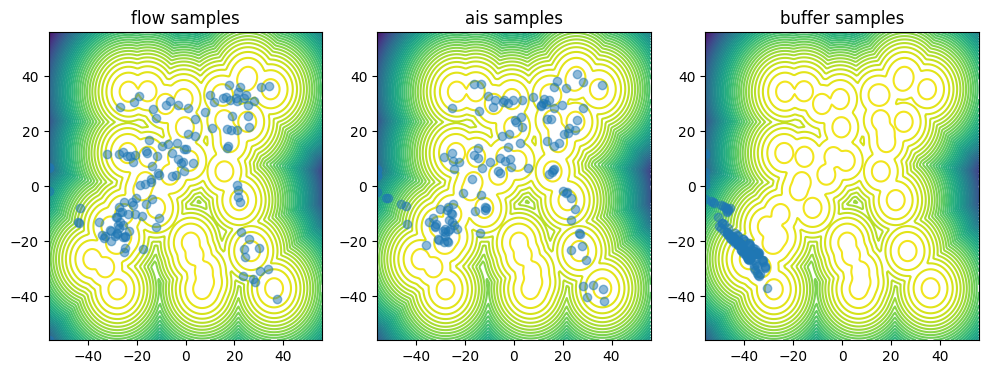

loss: 3.531733838615228e+32, ess base: 0.21366290748119354,ess ais: 0.07430914044380188:  56%|█████▌    | 2223/4000 [07:50<19:38,  1.51it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.0650009350815365e+25, ess base: 0.24926882982254028,ess ais: 0.10918787866830826:  56%|█████▌    | 2224/4000 [07:50<15:30,  1.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9223892830322594e+36, ess base: 0.22799144685268402,ess ais: 0.08581146597862244:  56%|█████▌    | 2225/4000 [07:51<12:38,  2.34it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492323220696395e+35, ess base: 0.24278101325035095,ess ais: 0.09610912203788757:  56%|█████▌    | 2226/4000 [07:51<10:39,  2.77it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.049631334903102e+35, ess base: 0.23252107203006744,ess ais: 0.0078125:  56%|█████▌    | 2227/4000 [07:51<09:18,  3.17it/s]           

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0273048003968985e+36, ess base: 0.12745900452136993,ess ais: 0.007874015718698502:  56%|█████▌    | 2228/4000 [07:51<08:19,  3.55it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.531728035771294e+32, ess base: 0.2353018820285797,ess ais: 0.0078125:  56%|█████▌    | 2229/4000 [07:51<07:35,  3.89it/s]             

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.009032594914047e+29, ess base: 0.25681719183921814,ess ais: 0.09068713337182999:  56%|█████▌    | 2230/4000 [07:52<07:08,  4.13it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492343027737023e+35, ess base: 0.2526983916759491,ess ais: 0.009352406486868858:  56%|█████▌    | 2231/4000 [07:52<06:49,  4.32it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0495521067405877e+35, ess base: 0.2526625692844391,ess ais: 0.0839075967669487:  56%|█████▌    | 2232/4000 [07:52<06:38,  4.44it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0495540874446505e+35, ess base: 0.17454129457473755,ess ais: 0.03165201097726822:  56%|█████▌    | 2233/4000 [07:52<06:26,  4.57it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402917961718288e+35, ess base: 0.23507285118103027,ess ais: 0.007874015718698502:  56%|█████▌    | 2234/4000 [07:53<06:17,  4.68it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.531733838615228e+32, ess base: 0.17974789440631866,ess ais: 0.04475150257349014:  56%|█████▌    | 2235/4000 [07:53<06:11,  4.75it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.604613689865532e+32, ess base: 0.22901712357997894,ess ais: 0.10639088600873947:  56%|█████▌    | 2236/4000 [07:53<06:09,  4.77it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821540557684657e+35, ess base: 0.25344446301460266,ess ais: 0.0078125:  56%|█████▌    | 2237/4000 [07:53<06:06,  4.82it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402598672223356e+35, ess base: 0.2704111635684967,ess ais: 0.16937491297721863:  56%|█████▌    | 2238/4000 [07:53<06:02,  4.85it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.514695048335128e+28, ess base: 0.20937305688858032,ess ais: 0.009140281938016415:  56%|█████▌    | 2239/4000 [07:54<06:00,  4.88it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402670769851244e+35, ess base: 0.1486859917640686,ess ais: 0.007874015718698502:  56%|█████▌    | 2241/4000 [07:54<05:55,  4.95it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.170993722196634e+26, ess base: 0.25404950976371765,ess ais: 0.11874421685934067:  56%|█████▌    | 2242/4000 [07:54<05:55,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.514100974631583e+28, ess base: 0.010283310897648335,ess ais: 0.010937356390058994:  56%|█████▌    | 2243/4000 [07:54<06:00,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0088848792904627e+29, ess base: 0.22744645178318024,ess ais: 0.0078125:  56%|█████▌    | 2244/4000 [07:55<06:00,  4.88it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821214929936724e+35, ess base: 0.2572808265686035,ess ais: 0.1301921010017395:  56%|█████▌    | 2245/4000 [07:55<05:56,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.8212204759081e+35, ess base: 0.10227225720882416,ess ais: 0.007874015718698502:  56%|█████▌    | 2246/4000 [07:55<05:54,  4.94it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.398296188257493e+26, ess base: 0.24263665080070496,ess ais: 0.007874015718698502:  56%|█████▌    | 2247/4000 [07:55<05:54,  4.95it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0455754075795092e+36, ess base: 0.194178968667984,ess ais: 0.015681086108088493:  56%|█████▌    | 2249/4000 [07:56<05:52,  4.96it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.246710765755326e+31, ess base: 0.24720293283462524,ess ais: 0.0078125:  56%|█████▋    | 2250/4000 [07:56<05:52,  4.96it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0870771790367062e+36, ess base: 0.08688618242740631,ess ais: 0.0078125:  56%|█████▋    | 2251/4000 [07:56<06:00,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.922381518672333e+36, ess base: 0.23850014805793762,ess ais: 0.11900286376476288:  56%|█████▋    | 2252/4000 [07:56<05:59,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.1976885819847887e+31, ess base: 0.23595507442951202,ess ais: 0.09718641638755798:  56%|█████▋    | 2253/4000 [07:56<05:57,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0493094704928877e+35, ess base: 0.12380136549472809,ess ais: 0.01676267199218273:  56%|█████▋    | 2254/4000 [07:57<05:57,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.82474692142161e+35, ess base: 0.23680122196674347,ess ais: 0.11759856343269348:  56%|█████▋    | 2255/4000 [07:57<05:57,  4.87it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0452155532653694e+36, ess base: 0.1828203797340393,ess ais: 0.0078125:  56%|█████▋    | 2256/4000 [07:57<05:58,  4.86it/s]         

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.40259787994173e+35, ess base: 0.10760655999183655,ess ais: 0.013523917645215988:  56%|█████▋    | 2257/4000 [07:57<05:58,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492343027737023e+35, ess base: 0.259304940700531,ess ais: 0.12492463737726212:  56%|█████▋    | 2258/4000 [07:57<05:56,  4.89it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.232843600546137e+30, ess base: 0.2569001615047455,ess ais: 0.0078125:  56%|█████▋    | 2259/4000 [07:58<05:57,  4.88it/s]          

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492348969849212e+35, ess base: 0.12003026902675629,ess ais: 0.007812503725290298:  56%|█████▋    | 2260/4000 [07:58<05:52,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.197677943437576e+31, ess base: 0.2577422559261322,ess ais: 0.007936508394777775:  57%|█████▋    | 2262/4000 [07:58<05:53,  4.92it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.232853876415604e+30, ess base: 0.2366168200969696,ess ais: 0.007874015718698502:  57%|█████▋    | 2263/4000 [07:58<05:49,  4.98it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.618694097243616e+32, ess base: 0.21264174580574036,ess ais: 0.0078125:  57%|█████▋    | 2264/4000 [07:59<05:45,  5.02it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.488373042112262e+30, ess base: 0.18457703292369843,ess ais: 0.00800000037997961:  57%|█████▋    | 2265/4000 [07:59<05:44,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.28798452056749e+30, ess base: 0.24265402555465698,ess ais: 0.11597919464111328:  57%|█████▋    | 2266/4000 [07:59<05:43,  5.05it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.406449953203174e+35, ess base: 0.22409434616565704,ess ais: 0.007936508394777775:  57%|█████▋    | 2267/4000 [07:59<05:47,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492348969849212e+35, ess base: 0.23957517743110657,ess ais: 0.014984359964728355:  57%|█████▋    | 2268/4000 [07:59<05:48,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.197740807580196e+31, ess base: 0.20921634137630463,ess ais: 0.058312706649303436:  57%|█████▋    | 2269/4000 [08:00<05:49,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0492343027737023e+35, ess base: 0.1633901745080948,ess ais: 0.010341258719563484:  57%|█████▋    | 2270/4000 [08:00<05:50,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.087045250087213e+36, ess base: 0.26576539874076843,ess ais: 0.08337140083312988:  57%|█████▋    | 2271/4000 [08:00<05:50,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.266665537119049e+31, ess base: 0.062012121081352234,ess ais: 0.007874015718698502:  57%|█████▋    | 2272/4000 [08:00<05:50,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.519029497224162e+30, ess base: 0.2027738392353058,ess ais: 0.007874015718698502:  57%|█████▋    | 2273/4000 [08:00<05:49,  4.95it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821232360132477e+35, ess base: 0.2622627019882202,ess ais: 0.15659672021865845:  57%|█████▋    | 2274/4000 [08:01<05:48,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0495521067405877e+35, ess base: 0.1618426889181137,ess ais: 0.036132048815488815:  57%|█████▋    | 2276/4000 [08:01<05:56,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.840686835437855e+35, ess base: 0.18493293225765228,ess ais: 0.007936508394777775:  57%|█████▋    | 2277/4000 [08:01<05:55,  4.84it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.045543637086341e+36, ess base: 0.2245061844587326,ess ais: 0.0078125:  57%|█████▋    | 2278/4000 [08:01<05:53,  4.87it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.447702329593854e+29, ess base: 0.12684452533721924,ess ais: 0.007936508394777775:  57%|█████▋    | 2279/4000 [08:02<05:52,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402600256786606e+35, ess base: 0.20234233140945435,ess ais: 0.010017218999564648:  57%|█████▋    | 2280/4000 [08:02<05:56,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.402925092252914e+35, ess base: 0.25723713636398315,ess ais: 0.007936508394777775:  57%|█████▋    | 2281/4000 [08:02<05:53,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.418857875734533e+35, ess base: 0.25133806467056274,ess ais: 0.08563356846570969:  57%|█████▋    | 2282/4000 [08:02<05:54,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0874051044013528e+36, ess base: 0.20486268401145935,ess ais: 0.007874015718698502:  57%|█████▋    | 2283/4000 [08:03<05:56,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.8212173067816e+35, ess base: 0.23980630934238434,ess ais: 0.08347006887197495:  57%|█████▋    | 2284/4000 [08:03<05:56,  4.81it/s]    

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.6259670833542158e+33, ess base: 0.29083454608917236,ess ais: 0.1817273497581482:  57%|█████▋    | 2285/4000 [08:03<05:55,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837160389924345e+35, ess base: 0.03042345494031906,ess ais: 0.02627190388739109:  57%|█████▋    | 2286/4000 [08:03<05:55,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3930178698670554e+31, ess base: 0.06958761066198349,ess ais: 0.018817706033587456:  57%|█████▋    | 2287/4000 [08:03<05:54,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.9227665675421523e+36, ess base: 0.13347169756889343,ess ais: 0.02221943438053131:  57%|█████▋    | 2288/4000 [08:04<05:53,  4.85it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.239808125006332e+21, ess base: 0.2783289849758148,ess ais: 0.007874015718698502:  57%|█████▋    | 2289/4000 [08:04<05:51,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.82474692142161e+35, ess base: 0.23489399254322052,ess ais: 0.007874015718698502:  57%|█████▋    | 2290/4000 [08:04<05:49,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.9791399256169714e+33, ess base: 0.18337690830230713,ess ais: 0.09146512299776077:  57%|█████▋    | 2291/4000 [08:04<05:48,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.402600256786606e+35, ess base: 0.24184992909431458,ess ais: 0.007936508394777775:  57%|█████▋    | 2292/4000 [08:04<05:49,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.008825566367438e+29, ess base: 0.1575688123703003,ess ais: 0.007874015718698502:  57%|█████▋    | 2293/4000 [08:05<05:50,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.922381994041308e+36, ess base: 0.23874232172966003,ess ais: 0.009559166617691517:  57%|█████▋    | 2294/4000 [08:05<05:49,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.8563913510430644e+32, ess base: 0.08964239805936813,ess ais: 0.007936508394777775:  57%|█████▋    | 2295/4000 [08:05<05:49,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.402600256786606e+35, ess base: 0.2298058420419693,ess ais: 0.007874015718698502:  57%|█████▋    | 2296/4000 [08:05<05:49,  4.88it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.197738631513721e+31, ess base: 0.22156956791877747,ess ais: 0.008064515888690948:  57%|█████▋    | 2297/4000 [08:05<05:47,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.8964521786834704e+29, ess base: 0.2263088971376419,ess ais: 0.00800000037997961:  57%|█████▋    | 2298/4000 [08:06<05:44,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0026553223209204e+29, ess base: 0.023614080622792244,ess ais: 0.008052900433540344:  57%|█████▋    | 2299/4000 [08:06<05:42,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.406129871426616e+35, ess base: 0.295154333114624,ess ais: 0.15191692113876343:  57%|█████▊    | 2300/4000 [08:06<05:51,  4.84it/s]     

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821214929936724e+35, ess base: 0.2215350717306137,ess ais: 0.0078125:  58%|█████▊    | 2301/4000 [08:06<05:48,  4.87it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.840701096507107e+35, ess base: 0.18974067270755768,ess ais: 0.008064515888690948:  58%|█████▊    | 2303/4000 [08:07<05:44,  4.93it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.840701096507107e+35, ess base: 0.19033117592334747,ess ais: 0.07965898513793945:  58%|█████▊    | 2304/4000 [08:07<05:42,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.418877682775162e+35, ess base: 0.10606250911951065,ess ais: 0.0078865522518754:  58%|█████▊    | 2305/4000 [08:07<05:42,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.821219683626475e+35, ess base: 0.12628242373466492,ess ais: 0.027653997763991356:  58%|█████▊    | 2306/4000 [08:07<05:43,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9806034802284165e+33, ess base: 0.27173513174057007,ess ais: 0.0078125:  58%|█████▊    | 2307/4000 [08:07<05:44,  4.92it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.031700365236729e+23, ess base: 0.2975907027721405,ess ais: 0.18063771724700928:  58%|█████▊    | 2308/4000 [08:08<05:44,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.422069785442861e+35, ess base: 0.27301302552223206,ess ais: 0.09970905631780624:  58%|█████▊    | 2309/4000 [08:08<05:45,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.923975747758445e+36, ess base: 0.24972566962242126,ess ais: 0.049122828990221024:  58%|█████▊    | 2310/4000 [08:08<05:43,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.009903965977466e+29, ess base: 0.24110513925552368,ess ais: 0.0078125:  58%|█████▊    | 2311/4000 [08:08<05:42,  4.93it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5945350120442354e+33, ess base: 0.18043003976345062,ess ais: 0.0836440771818161:  58%|█████▊    | 2312/4000 [08:08<05:40,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.349630731126906e+31, ess base: 0.28615978360176086,ess ais: 0.007936508394777775:  58%|█████▊    | 2314/4000 [08:09<05:37,  4.99it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1835480488092789e+34, ess base: 0.1999114453792572,ess ais: 0.008004205301404:  58%|█████▊    | 2315/4000 [08:09<05:37,  4.99it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.8962470390834546e+29, ess base: 0.26131317019462585,ess ais: 0.04408871755003929:  58%|█████▊    | 2316/4000 [08:09<05:39,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0786841510554492e+26, ess base: 0.31273916363716125,ess ais: 0.0212387777864933:  58%|█████▊    | 2317/4000 [08:09<05:37,  4.99it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5944799237124872e+33, ess base: 0.18686272203922272,ess ais: 0.12243486940860748:  58%|█████▊    | 2318/4000 [08:10<05:38,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9791397708744665e+33, ess base: 0.2180824875831604,ess ais: 0.012058752588927746:  58%|█████▊    | 2319/4000 [08:10<05:39,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.231354420284863e+26, ess base: 0.2912728786468506,ess ais: 0.04941742867231369:  58%|█████▊    | 2320/4000 [08:10<05:39,  4.94it/s]  

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.922381360216008e+36, ess base: 0.23289522528648376,ess ais: 0.0917886346578598:  58%|█████▊    | 2321/4000 [08:10<05:41,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402602633631481e+35, ess base: 0.25141555070877075,ess ais: 0.05727957934141159:  58%|█████▊    | 2322/4000 [08:10<05:40,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5954541825234048e+33, ess base: 0.023747369647026062,ess ais: 0.00813175830990076:  58%|█████▊    | 2323/4000 [08:11<05:39,  4.94it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.82474692142161e+35, ess base: 0.2194751650094986,ess ais: 0.11168186366558075:  58%|█████▊    | 2325/4000 [08:11<05:48,  4.81it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.40259787994173e+35, ess base: 0.2512483596801758,ess ais: 0.09006934612989426:  58%|█████▊    | 2326/4000 [08:11<05:46,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5939903184269498e+33, ess base: 0.2364857941865921,ess ais: 0.0078125:  58%|█████▊    | 2327/4000 [08:11<05:39,  4.93it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821231567850852e+35, ess base: 0.030976226553320885,ess ais: 0.0078125:  58%|█████▊    | 2328/4000 [08:12<05:35,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.82474692142161e+35, ess base: 0.22166889905929565,ess ais: 0.10547682642936707:  58%|█████▊    | 2329/4000 [08:12<05:30,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.009215067154945e+29, ess base: 0.04592559114098549,ess ais: 0.007874015718698502:  58%|█████▊    | 2330/4000 [08:12<05:28,  5.08it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.359619402605182e+25, ess base: 0.22056905925273895,ess ais: 0.007936508394777775:  58%|█████▊    | 2331/4000 [08:12<05:32,  5.02it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2188653639840554e+34, ess base: 0.2301904708147049,ess ais: 0.08102549612522125:  58%|█████▊    | 2332/4000 [08:12<05:34,  4.99it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9342169385013638e+36, ess base: 0.21267946064472198,ess ais: 0.0078125:  58%|█████▊    | 2334/4000 [08:13<05:34,  4.98it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.463883137036621e+30, ess base: 0.2934670150279999,ess ais: 0.1334010362625122:  58%|█████▊    | 2335/4000 [08:13<05:35,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.28494577427959e+26, ess base: 0.2912790775299072,ess ais: 0.007936508394777775:  58%|█████▊    | 2336/4000 [08:13<05:35,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.922381360216008e+36, ess base: 0.22789372503757477,ess ais: 0.007973778061568737:  58%|█████▊    | 2337/4000 [08:13<05:35,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.520952870513664e+35, ess base: 0.22655624151229858,ess ais: 0.10427874326705933:  58%|█████▊    | 2338/4000 [08:14<05:33,  4.98it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821229983287602e+35, ess base: 0.24438196420669556,ess ais: 0.14205023646354675:  58%|█████▊    | 2340/4000 [08:14<05:33,  4.98it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1835625327077385e+34, ess base: 0.2592737376689911,ess ais: 0.10564270615577698:  59%|█████▊    | 2341/4000 [08:14<05:32,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.402600256786606e+35, ess base: 0.14048001170158386,ess ais: 0.023587297648191452:  59%|█████▊    | 2342/4000 [08:14<05:32,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.520954455076915e+35, ess base: 0.2564123868942261,ess ais: 0.0078125:  59%|█████▊    | 2343/4000 [08:15<05:31,  5.00it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821214929936724e+35, ess base: 0.04699551314115524,ess ais: 0.0078125:  59%|█████▊    | 2344/4000 [08:15<05:30,  5.01it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402600256786606e+35, ess base: 0.18930315971374512,ess ais: 0.016493216156959534:  59%|█████▊    | 2346/4000 [08:15<05:30,  5.00it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.418540963084476e+35, ess base: 0.26203134655952454,ess ais: 0.0078125:  59%|█████▊    | 2347/4000 [08:15<05:30,  5.00it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9345702961061775e+36, ess base: 0.14194177091121674,ess ais: 0.023172840476036072:  59%|█████▊    | 2348/4000 [08:16<05:29,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.520952870513664e+35, ess base: 0.008116612210869789,ess ais: 0.007916257716715336:  59%|█████▊    | 2349/4000 [08:16<05:32,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837157220797844e+35, ess base: 0.17772312462329865,ess ais: 0.0078125:  59%|█████▉    | 2350/4000 [08:16<05:43,  4.81it/s]            

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.533730403784838e+32, ess base: 0.16265814006328583,ess ais: 0.008064515888690948:  59%|█████▉    | 2352/4000 [08:16<05:32,  4.95it/s]

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0027140685599673e+29, ess base: 0.14448095858097076,ess ais: 0.0078125:  59%|█████▉    | 2353/4000 [08:17<05:31,  4.96it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837169105022221e+35, ess base: 0.2632170617580414,ess ais: 0.0078125:  59%|█████▉    | 2354/4000 [08:17<05:30,  4.98it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821214929936724e+35, ess base: 0.23462584614753723,ess ais: 0.0078125:  59%|█████▉    | 2355/4000 [08:17<05:29,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402600256786606e+35, ess base: 0.21160893142223358,ess ais: 0.008013355545699596:  59%|█████▉    | 2356/4000 [08:17<05:31,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9342167800450388e+36, ess base: 0.08562388271093369,ess ais: 0.01289457455277443:  59%|█████▉    | 2357/4000 [08:17<05:31,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837169105022221e+35, ess base: 0.23214559257030487,ess ais: 0.008054428733885288:  59%|█████▉    | 2358/4000 [08:18<05:31,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.939569128227032e+35, ess base: 0.2413148283958435,ess ais: 0.10722114145755768:  59%|█████▉    | 2359/4000 [08:18<05:32,  4.93it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2177067010614595e+31, ess base: 0.2717575430870056,ess ais: 0.007874015718698502:  59%|█████▉    | 2360/4000 [08:18<05:30,  4.96it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1835480488092789e+34, ess base: 0.2901003062725067,ess ais: 0.00800000037997961:  59%|█████▉    | 2362/4000 [08:18<05:30,  4.96it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1868865255072237e+34, ess base: 0.2400161325931549,ess ais: 0.0078125:  59%|█████▉    | 2363/4000 [08:19<05:26,  5.01it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.492690919316633e+26, ess base: 0.024073857814073563,ess ais: 0.008199318312108517:  59%|█████▉    | 2364/4000 [08:19<05:23,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9881319297018054e+33, ess base: 0.19264645874500275,ess ais: 0.05858290567994118:  59%|█████▉    | 2365/4000 [08:19<05:21,  5.09it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.402917961718288e+35, ess base: 0.2214457392692566,ess ais: 0.1080022007226944:  59%|█████▉    | 2366/4000 [08:19<05:22,  5.07it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.418537793957975e+35, ess base: 0.30528077483177185,ess ais: 0.00869334302842617:  59%|█████▉    | 2368/4000 [08:20<05:23,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.9791950139487196e+33, ess base: 0.28605523705482483,ess ais: 0.007874015718698502:  59%|█████▉    | 2369/4000 [08:20<05:24,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5317276489150315e+32, ess base: 0.2262697070837021,ess ais: 0.007874015718698502:  59%|█████▉    | 2370/4000 [08:20<05:24,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1869065801358601e+34, ess base: 0.21495506167411804,ess ais: 0.08567378669977188:  59%|█████▉    | 2371/4000 [08:20<05:25,  5.01it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3941420755023703e+33, ess base: 0.17790108919143677,ess ais: 0.03117576241493225:  59%|█████▉    | 2372/4000 [08:20<05:26,  4.99it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837154843952969e+35, ess base: 0.20714345574378967,ess ais: 0.04001522436738014:  59%|█████▉    | 2374/4000 [08:21<05:32,  4.88it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2031911287453467e+31, ess base: 0.23004977405071259,ess ais: 0.037198640406131744:  59%|█████▉    | 2375/4000 [08:21<05:36,  4.83it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.851495298187691e+32, ess base: 0.3154337704181671,ess ais: 0.008064515888690948:  59%|█████▉    | 2376/4000 [08:21<05:35,  4.84it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.55436814033568e+35, ess base: 0.21256692707538605,ess ais: 0.008735187351703644:  59%|█████▉    | 2377/4000 [08:22<05:35,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5941907099708092e+33, ess base: 0.229062020778656,ess ais: 0.08368229120969772:  59%|█████▉    | 2378/4000 [08:22<05:34,  4.85it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.835156709694359e+35, ess base: 0.2396879941225052,ess ais: 0.10501207411289215:  59%|█████▉    | 2379/4000 [08:22<05:33,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.24646184251263e+24, ess base: 0.1769692748785019,ess ais: 0.05844464153051376:  60%|█████▉    | 2380/4000 [08:22<05:33,  4.86it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3941414565323506e+33, ess base: 0.06344208866357803,ess ais: 0.007874015718698502:  60%|█████▉    | 2381/4000 [08:22<05:33,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.4855534249132617e+34, ess base: 0.1975374072790146,ess ais: 0.08641017228364944:  60%|█████▉    | 2382/4000 [08:23<05:34,  4.84it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.402921130844789e+35, ess base: 0.23672689497470856,ess ais: 0.007936508394777775:  60%|█████▉    | 2383/4000 [08:23<05:34,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4642420368893192e+30, ess base: 0.17877808213233948,ess ais: 0.05374543368816376:  60%|█████▉    | 2384/4000 [08:23<05:30,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.9342500558732948e+36, ess base: 0.17106494307518005,ess ais: 0.05538215488195419:  60%|█████▉    | 2385/4000 [08:23<05:27,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821549272782534e+35, ess base: 0.184112086892128,ess ais: 0.007874015718698502:  60%|█████▉    | 2386/4000 [08:23<05:24,  4.97it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.825066210916542e+35, ess base: 0.22035573422908783,ess ais: 0.009637214243412018:  60%|█████▉    | 2388/4000 [08:24<05:18,  5.06it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.514100974631583e+28, ess base: 0.25988417863845825,ess ais: 0.00800000037997961:  60%|█████▉    | 2389/4000 [08:24<05:16,  5.09it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.82474692142161e+35, ess base: 0.1105068176984787,ess ais: 0.0078125:  60%|█████▉    | 2390/4000 [08:24<05:15,  5.11it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.524484069716925e+35, ess base: 0.25149351358413696,ess ais: 0.007936508394777775:  60%|█████▉    | 2391/4000 [08:24<05:14,  5.12it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.531733838615228e+32, ess base: 0.2220153957605362,ess ais: 0.007874015718698502:  60%|█████▉    | 2392/4000 [08:25<05:14,  5.11it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.840703473351983e+35, ess base: 0.2574191987514496,ess ais: 0.007936508394777775:  60%|█████▉    | 2394/4000 [08:25<05:11,  5.16it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821215722218349e+35, ess base: 0.2647615969181061,ess ais: 0.12752051651477814:  60%|█████▉    | 2395/4000 [08:25<05:09,  5.18it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.9486822678604135e+33, ess base: 0.23806723952293396,ess ais: 0.0777801051735878:  60%|█████▉    | 2396/4000 [08:25<05:09,  5.18it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0029771988203928e+29, ess base: 0.2422158420085907,ess ais: 0.09556196630001068:  60%|█████▉    | 2397/4000 [08:25<05:13,  5.12it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3461946770767846e+34, ess base: 0.23020021617412567,ess ais: 0.0756845697760582:  60%|█████▉    | 2398/4000 [08:26<05:17,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.7490778991235732e+33, ess base: 0.2418784499168396,ess ais: 0.07460028678178787:  60%|██████    | 2400/4000 [08:26<05:16,  5.06it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3944408832793528e+33, ess base: 0.21677647531032562,ess ais: 0.11368332803249359:  60%|██████    | 2401/4000 [08:26<05:14,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1836943733219224e+34, ess base: 0.15690815448760986,ess ais: 0.009369286708533764:  60%|██████    | 2402/4000 [08:26<05:20,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.835476791470917e+35, ess base: 0.20368999242782593,ess ais: 0.0078125:  60%|██████    | 2403/4000 [08:27<05:19,  5.00it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6261673201555702e+33, ess base: 0.1988939493894577,ess ais: 0.0078125:  60%|██████    | 2404/4000 [08:27<05:16,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.536891992248284e+35, ess base: 0.19045835733413696,ess ais: 0.03802376613020897:  60%|██████    | 2405/4000 [08:27<05:14,  5.08it/s]

nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.534893857989674e+35, ess base: 0.22577053308486938,ess ais: 0.11247462779283524:  60%|██████    | 2407/4000 [08:27<05:15,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.83515987882086e+35, ess base: 0.05044260993599892,ess ais: 0.007874015718698502:  60%|██████    | 2408/4000 [08:28<05:16,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.2188953221330061e+34, ess base: 0.011270537041127682,ess ais: 0.007874015718698502:  60%|██████    | 2409/4000 [08:28<05:18,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5942908283714864e+33, ess base: 0.24189510941505432,ess ais: 0.0078125:  60%|██████    | 2410/4000 [08:28<05:17,  5.01it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.418556016435354e+35, ess base: 0.27902549505233765,ess ais: 0.1682615578174591:  60%|██████    | 2412/4000 [08:28<05:15,  5.03it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.534908119058927e+35, ess base: 0.23198358714580536,ess ais: 0.0078125:  60%|██████    | 2413/4000 [08:29<05:14,  5.04it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.416539659699366e+35, ess base: 0.24691654741764069,ess ais: 0.13931851089000702:  60%|██████    | 2414/4000 [08:29<05:19,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.53173422547149e+32, ess base: 0.16802920401096344,ess ais: 0.031046364456415176:  60%|██████    | 2415/4000 [08:29<05:20,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3943969364079582e+33, ess base: 0.2586810290813446,ess ais: 0.16036272048950195:  60%|██████    | 2416/4000 [08:29<05:23,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.524485654280175e+35, ess base: 0.17892307043075562,ess ais: 0.08353177458047867:  60%|██████    | 2417/4000 [08:29<05:24,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3943423123037247e+33, ess base: 0.23209410905838013,ess ais: 0.0078125:  60%|██████    | 2418/4000 [08:30<05:24,  4.87it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.534893857989674e+35, ess base: 0.19582796096801758,ess ais: 0.03515051305294037:  60%|██████    | 2419/4000 [08:30<05:24,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.594289745173952e+33, ess base: 0.21248649060726166,ess ais: 0.015510042198002338:  60%|██████    | 2420/4000 [08:30<05:24,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.922381360216008e+36, ess base: 0.24190334975719452,ess ais: 0.095168337225914:  61%|██████    | 2421/4000 [08:30<05:23,  4.89it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.464355373684908e+30, ess base: 0.25501587986946106,ess ais: 0.0078125:  61%|██████    | 2422/4000 [08:31<05:21,  4.90it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.824761182490862e+35, ess base: 0.2995089888572693,ess ais: 0.0078125:  61%|██████    | 2423/4000 [08:31<05:20,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.526445240617805e+28, ess base: 0.23018038272857666,ess ais: 0.13670048117637634:  61%|██████    | 2424/4000 [08:31<05:21,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.994916512070919e+29, ess base: 0.21871407330036163,ess ais: 0.0230723787099123:  61%|██████    | 2425/4000 [08:31<05:21,  4.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3231328444969294e+34, ess base: 0.24342411756515503,ess ais: 0.11133725941181183:  61%|██████    | 2426/4000 [08:31<05:20,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.416542036544241e+35, ess base: 0.08025610446929932,ess ais: 0.012088960967957973:  61%|██████    | 2427/4000 [08:32<05:20,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.955509834524902e+35, ess base: 0.14241746068000793,ess ais: 0.035957448184490204:  61%|██████    | 2428/4000 [08:32<05:20,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.002860839710255e+29, ess base: 0.13901875913143158,ess ais: 0.007936508394777775:  61%|██████    | 2429/4000 [08:32<05:31,  4.74it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.955513795933028e+35, ess base: 0.24419637024402618,ess ais: 0.11267755925655365:  61%|██████    | 2430/4000 [08:32<05:28,  4.78it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.40259787994173e+35, ess base: 0.20705755054950714,ess ais: 0.045940037816762924:  61%|██████    | 2431/4000 [08:32<05:28,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.82474692142161e+35, ess base: 0.276832640171051,ess ais: 0.0078125:  61%|██████    | 2432/4000 [08:33<05:27,  4.79it/s]             

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.923775458963609e+36, ess base: 0.14122046530246735,ess ais: 0.007908731698989868:  61%|██████    | 2433/4000 [08:33<05:25,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6645249285406023e+30, ess base: 0.2176142930984497,ess ais: 0.08870935440063477:  61%|██████    | 2434/4000 [08:33<05:26,  4.79it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.939569128227032e+35, ess base: 0.23118633031845093,ess ais: 0.007874015718698502:  61%|██████    | 2435/4000 [08:33<05:24,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.5461311507853515e+29, ess base: 0.23940688371658325,ess ais: 0.007874015718698502:  61%|██████    | 2436/4000 [08:33<05:24,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3429671198063598e+34, ess base: 0.22460003197193146,ess ais: 0.007813915610313416:  61%|██████    | 2437/4000 [08:34<05:24,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.418552847308853e+35, ess base: 0.12516923248767853,ess ais: 0.008305865339934826:  61%|██████    | 2438/4000 [08:34<05:23,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.002654566742283e+29, ess base: 0.22841820120811462,ess ais: 0.00817930418998003:  61%|██████    | 2439/4000 [08:34<05:23,  4.83it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.4240112676758394e+26, ess base: 0.16613033413887024,ess ais: 0.042323771864175797:  61%|██████    | 2440/4000 [08:34<05:22,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0028685843912868e+29, ess base: 0.2720545828342438,ess ais: 0.0078125:  61%|██████    | 2441/4000 [08:34<05:21,  4.85it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.416554713050243e+35, ess base: 0.2722654640674591,ess ais: 0.16372349858283997:  61%|██████    | 2442/4000 [08:35<05:18,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.422087215638614e+35, ess base: 0.27566689252853394,ess ais: 0.17029768228530884:  61%|██████    | 2443/4000 [08:35<05:14,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5337307906411e+32, ess base: 0.23777762055397034,ess ais: 0.07341939210891724:  61%|██████    | 2445/4000 [08:35<05:09,  5.03it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.394341693333705e+33, ess base: 0.21865853667259216,ess ais: 0.07821328192949295:  61%|██████    | 2446/4000 [08:35<05:08,  5.04it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.406249505952013e+35, ess base: 0.22003591060638428,ess ais: 0.007874015718698502:  61%|██████    | 2447/4000 [08:36<05:09,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.416553920768618e+35, ess base: 0.13919462263584137,ess ais: 0.04004320874810219:  61%|██████    | 2448/4000 [08:36<05:09,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5939903184269498e+33, ess base: 0.22078509628772736,ess ais: 0.0078125:  61%|██████    | 2449/4000 [08:36<05:10,  4.99it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3551174713105855e+31, ess base: 0.25897425413131714,ess ais: 0.028681259602308273:  61%|██████▏   | 2450/4000 [08:36<05:07,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.40626455930289e+35, ess base: 0.23908720910549164,ess ais: 0.0078125:  61%|██████▏   | 2451/4000 [08:37<05:07,  5.04it/s]             

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2188673741535593e+25, ess base: 0.11722635477781296,ess ais: 0.027618564665317535:  61%|██████▏   | 2453/4000 [08:37<05:05,  5.06it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3941970090916136e+33, ess base: 0.016929777339100838,ess ais: 0.008108838461339474:  61%|██████▏   | 2454/4000 [08:37<05:09,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3941414565323506e+33, ess base: 0.24373707175254822,ess ais: 0.13576428592205048:  61%|██████▏   | 2455/4000 [08:37<05:15,  4.90it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.6902362622216536e+25, ess base: 0.047086670994758606,ess ais: 0.009197804145514965:  61%|██████▏   | 2456/4000 [08:37<05:13,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3941419207598654e+33, ess base: 0.16084560751914978,ess ais: 0.007874015718698502:  61%|██████▏   | 2457/4000 [08:38<05:11,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5939903184269498e+33, ess base: 0.23256786167621613,ess ais: 0.05884016305208206:  61%|██████▏   | 2458/4000 [08:38<05:10,  4.97it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.851117223032857e+35, ess base: 0.21784114837646484,ess ais: 0.10515236854553223:  62%|██████▏   | 2460/4000 [08:38<05:06,  5.02it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.939687178189179e+35, ess base: 0.23725982010364532,ess ais: 0.11521780490875244:  62%|██████▏   | 2461/4000 [08:38<05:06,  5.03it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.416556297613494e+35, ess base: 0.3017122745513916,ess ais: 0.00800000037997961:  62%|██████▏   | 2462/4000 [08:39<05:06,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.9243287884506086e+36, ess base: 0.17573665082454681,ess ais: 0.007874139584600925:  62%|██████▏   | 2463/4000 [08:39<05:07,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1835625327077385e+34, ess base: 0.24047231674194336,ess ais: 0.007874015718698502:  62%|██████▏   | 2464/4000 [08:39<05:05,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.406144132495869e+35, ess base: 0.27969375252723694,ess ais: 0.007874015718698502:  62%|██████▏   | 2465/4000 [08:39<05:06,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.925369371137071e+36, ess base: 0.2513439655303955,ess ais: 0.11771735548973083:  62%|██████▏   | 2466/4000 [08:39<05:04,  5.03it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.6665835287907475e+26, ess base: 0.019153133034706116,ess ais: 0.0078125:  62%|██████▏   | 2467/4000 [08:40<05:06,  5.00it/s]       

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5939903184269498e+33, ess base: 0.16694588959217072,ess ais: 0.0686570480465889:  62%|██████▏   | 2469/4000 [08:40<05:06,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.40259787994173e+35, ess base: 0.24136412143707275,ess ais: 0.0902235135436058:  62%|██████▏   | 2470/4000 [08:40<05:05,  5.01it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821218099063224e+35, ess base: 0.23834481835365295,ess ais: 0.0078125:  62%|██████▏   | 2471/4000 [08:40<05:04,  5.02it/s]        

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.922381360216008e+36, ess base: 0.2447935938835144,ess ais: 0.007874015718698502:  62%|██████▏   | 2473/4000 [08:41<05:02,  5.04it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.007947251344023e+29, ess base: 0.23730124533176422,ess ais: 0.007874015718698502:  62%|██████▏   | 2474/4000 [08:41<05:09,  4.93it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.82133614902537e+35, ess base: 0.22479426860809326,ess ais: 0.09877408295869827:  62%|██████▏   | 2475/4000 [08:41<05:06,  4.97it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.7638750568594423e+30, ess base: 0.21768449246883392,ess ais: 0.007936508394777775:  62%|██████▏   | 2476/4000 [08:41<05:04,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.60577813822353e+33, ess base: 0.24882495403289795,ess ais: 0.11557608842849731:  62%|██████▏   | 2477/4000 [08:42<05:04,  5.01it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3956057848563203e+33, ess base: 0.26819083094596863,ess ais: 0.007874015718698502:  62%|██████▏   | 2478/4000 [08:42<05:03,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3429414944475466e+34, ess base: 0.04146341234445572,ess ais: 0.007874015718698502:  62%|██████▏   | 2479/4000 [08:42<05:02,  5.02it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.001383458852336e+33, ess base: 0.22369280457496643,ess ais: 0.008064515888690948:  62%|██████▏   | 2481/4000 [08:42<05:05,  4.97it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1787895958906937e+31, ess base: 0.21225537359714508,ess ais: 0.008066993206739426:  62%|██████▏   | 2482/4000 [08:43<05:06,  4.95it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.078992931104499e+27, ess base: 0.2014954537153244,ess ais: 0.00800000037997961:  62%|██████▏   | 2483/4000 [08:43<05:08,  4.91it/s]   

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3752127198545477e+31, ess base: 0.051174089312553406,ess ais: 0.0078125:  62%|██████▏   | 2484/4000 [08:43<05:08,  4.91it/s]       

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.531728035771294e+32, ess base: 0.23749423027038574,ess ais: 0.007812954485416412:  62%|██████▏   | 2485/4000 [08:43<05:07,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1787863317909808e+31, ess base: 0.20769819617271423,ess ais: 0.007941938005387783:  62%|██████▏   | 2486/4000 [08:43<05:06,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837158013079469e+35, ess base: 0.2705758810043335,ess ais: 0.0078125:  62%|██████▏   | 2487/4000 [08:44<05:05,  4.95it/s]             

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.7640242080824373e+30, ess base: 0.2459789365530014,ess ais: 0.00800000037997961:  62%|██████▏   | 2488/4000 [08:44<05:05,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.401109793998127e+26, ess base: 0.07314455509185791,ess ais: 0.0078125:  62%|██████▏   | 2489/4000 [08:44<05:04,  4.96it/s]          

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821214929936724e+35, ess base: 0.23268578946590424,ess ais: 0.08381958305835724:  62%|██████▏   | 2490/4000 [08:44<05:03,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.722709592309416e+26, ess base: 0.22707915306091309,ess ais: 0.007936508394777775:  62%|██████▏   | 2492/4000 [08:45<05:03,  4.97it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4649397382029643e+30, ess base: 0.29275044798851013,ess ais: 0.007936508394777775:  62%|██████▏   | 2493/4000 [08:45<05:02,  4.98it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.4073942236229203e+33, ess base: 0.2334592342376709,ess ais: 0.007874015718698502:  62%|██████▏   | 2494/4000 [08:45<05:04,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.7640731695781316e+30, ess base: 0.11046353727579117,ess ais: 0.021021198481321335:  62%|██████▏   | 2495/4000 [08:45<05:06,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.342768945546026e+33, ess base: 0.2772522270679474,ess ais: 0.01801016926765442:  62%|██████▏   | 2496/4000 [08:45<05:01,  4.99it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837157220797844e+35, ess base: 0.02984093688428402,ess ais: 0.008271033875644207:  62%|██████▏   | 2497/4000 [08:46<05:00,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.594289745173952e+33, ess base: 0.15458953380584717,ess ais: 0.007874015718698502:  62%|██████▏   | 2498/4000 [08:46<04:58,  5.03it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837172274148722e+35, ess base: 0.19918328523635864,ess ais: 0.007874015718698502:  62%|██████▎   | 2500/4000 [08:46<05:00,  4.99it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821218099063224e+35, ess base: 0.2093103975057602,ess ais: 0.014454163610935211:  63%|██████▎   | 2501/4000 [08:46<04:59,  5.01it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.763692357944953e+30, ess base: 0.17763520777225494,ess ais: 0.0078125:  63%|██████▎   | 2502/4000 [08:47<04:58,  5.01it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837272893915115e+35, ess base: 0.3111318349838257,ess ais: 0.011592159979045391:  63%|██████▎   | 2503/4000 [08:47<04:58,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1847512027334603e+34, ess base: 0.2106986790895462,ess ais: 0.008064515888690948:  63%|██████▎   | 2504/4000 [08:47<04:56,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.00675154815056e+29, ess base: 0.2698071300983429,ess ais: 0.007874015718698502:  63%|██████▎   | 2505/4000 [08:47<04:57,  5.03it/s]  

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.531734999184015e+32, ess base: 0.25142672657966614,ess ais: 0.1495298445224762:  63%|██████▎   | 2506/4000 [08:47<04:59,  5.00it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6640463450317623e+30, ess base: 0.22220855951309204,ess ais: 0.007874015718698502:  63%|██████▎   | 2508/4000 [08:48<04:59,  4.98it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.747614189769623e+33, ess base: 0.2570497989654541,ess ais: 0.007936508394777775:  63%|██████▎   | 2509/4000 [08:48<04:58,  5.00it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.4638127171076286e+30, ess base: 0.05201815813779831,ess ais: 0.007874015718698502:  63%|██████▎   | 2510/4000 [08:48<04:58,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.95552647243903e+35, ess base: 0.28124454617500305,ess ais: 0.04061512276530266:  63%|██████▎   | 2511/4000 [08:48<04:56,  5.01it/s]   

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.7487781628915612e+33, ess base: 0.21534791588783264,ess ais: 0.00800000037997961:  63%|██████▎   | 2512/4000 [08:49<04:56,  5.01it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837287154984367e+35, ess base: 0.047204840928316116,ess ais: 0.009251553565263748:  63%|██████▎   | 2514/4000 [08:49<04:55,  5.03it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3941414565323506e+33, ess base: 0.22293664515018463,ess ais: 0.007874015718698502:  63%|██████▎   | 2515/4000 [08:49<04:59,  4.96it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4059298952989506e+33, ess base: 0.21396762132644653,ess ais: 0.007874015718698502:  63%|██████▎   | 2516/4000 [08:49<05:00,  4.93it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821214929936724e+35, ess base: 0.28619620203971863,ess ais: 0.007874015718698502:  63%|██████▎   | 2517/4000 [08:50<05:02,  4.91it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837287154984367e+35, ess base: 0.23581938445568085,ess ais: 0.007874015718698502:  63%|██████▎   | 2518/4000 [08:50<05:00,  4.93it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3229565618353352e+34, ess base: 0.2422405630350113,ess ais: 0.013880264014005661:  63%|██████▎   | 2519/4000 [08:50<04:58,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3944410380218577e+33, ess base: 0.23761887848377228,ess ais: 0.007874015718698502:  63%|██████▎   | 2520/4000 [08:50<04:56,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.406228857818438e+33, ess base: 0.20499949157238007,ess ais: 0.007874015718698502:  63%|██████▎   | 2521/4000 [08:50<04:56,  4.99it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.007055434514999e+29, ess base: 0.24697692692279816,ess ais: 0.06915774196386337:  63%|██████▎   | 2522/4000 [08:51<04:56,  4.99it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4064294041048022e+33, ess base: 0.2852153480052948,ess ais: 0.007936508394777775:  63%|██████▎   | 2523/4000 [08:51<04:58,  4.95it/s]

nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.851217050517625e+35, ess base: 0.18116413056850433,ess ais: 0.008130080997943878:  63%|██████▎   | 2524/4000 [08:51<04:59,  4.93it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1835625327077385e+34, ess base: 0.2128676027059555,ess ais: 0.12436498701572418:  63%|██████▎   | 2525/4000 [08:51<04:58,  4.94it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.939688762752429e+35, ess base: 0.24091434478759766,ess ais: 0.10982825607061386:  63%|██████▎   | 2527/4000 [08:52<04:57,  4.95it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.340861452682098e+26, ess base: 0.25153419375419617,ess ais: 0.007874015718698502:  63%|██████▎   | 2528/4000 [08:52<04:56,  4.96it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.595753609270407e+33, ess base: 0.06526926159858704,ess ais: 0.0078125:  63%|██████▎   | 2529/4000 [08:52<04:55,  4.97it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1837188845347003e+34, ess base: 0.21897177398204803,ess ais: 0.05279811471700668:  63%|██████▎   | 2530/4000 [08:52<04:55,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3956054753713105e+33, ess base: 0.1992921382188797,ess ais: 0.007874015718698502:  63%|██████▎   | 2531/4000 [08:52<04:54,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.0002197952154075e+33, ess base: 0.20240041613578796,ess ais: 0.008064515888690948:  63%|██████▎   | 2532/4000 [08:53<04:53,  4.99it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1788003553304883e+31, ess base: 0.21543700993061066,ess ais: 0.007874015718698502:  63%|██████▎   | 2533/4000 [08:53<04:56,  4.95it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9884312017063026e+33, ess base: 0.2065560668706894,ess ais: 0.08437778800725937:  63%|██████▎   | 2535/4000 [08:53<04:54,  4.97it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.4645214498693776e+30, ess base: 0.21965427696704865,ess ais: 0.09511858969926834:  63%|██████▎   | 2536/4000 [08:53<04:54,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5944899819753064e+33, ess base: 0.2084837704896927,ess ais: 0.08909150958061218:  63%|██████▎   | 2537/4000 [08:54<04:53,  4.99it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3241654102836974e+34, ess base: 0.2743435204029083,ess ais: 0.1424565315246582:  63%|██████▎   | 2538/4000 [08:54<04:53,  4.98it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1847212445845096e+34, ess base: 0.24789005517959595,ess ais: 0.007936508394777775:  64%|██████▎   | 2540/4000 [08:54<04:51,  5.01it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3441503428959088e+34, ess base: 0.23374050855636597,ess ais: 0.056141212582588196:  64%|██████▎   | 2541/4000 [08:54<04:51,  5.01it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.955525680157405e+35, ess base: 0.06359653919935226,ess ais: 0.007936508394777775:  64%|██████▎   | 2542/4000 [08:55<04:50,  5.01it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.2288351353675347e+31, ess base: 0.18532782793045044,ess ais: 0.007936508394777775:  64%|██████▎   | 2543/4000 [08:55<04:51,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3429414944475466e+34, ess base: 0.22298775613307953,ess ais: 0.00836514588445425:  64%|██████▎   | 2544/4000 [08:55<04:51,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3442668330536055e+34, ess base: 0.07796669751405716,ess ais: 0.007936508394777775:  64%|██████▎   | 2546/4000 [08:55<04:49,  5.03it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3751826176016393e+31, ess base: 0.18184389173984528,ess ais: 0.007874015718698502:  64%|██████▎   | 2547/4000 [08:56<04:49,  5.02it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3941419207598654e+33, ess base: 0.2551865577697754,ess ais: 0.008014755323529243:  64%|██████▎   | 2548/4000 [08:56<04:58,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3941422302448752e+33, ess base: 0.21519257128238678,ess ais: 0.07493997365236282:  64%|██████▎   | 2549/4000 [08:56<04:56,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5939904731694547e+33, ess base: 0.2864847481250763,ess ais: 0.14211644232273102:  64%|██████▍   | 2550/4000 [08:56<04:53,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3944410380218577e+33, ess base: 0.22542718052864075,ess ais: 0.008068244904279709:  64%|██████▍   | 2551/4000 [08:57<04:51,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0192285424651963e+26, ess base: 0.26049044728279114,ess ais: 0.0078125:  64%|██████▍   | 2553/4000 [08:57<04:47,  5.03it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.184741299213146e+34, ess base: 0.20115670561790466,ess ais: 0.007936508394777775:  64%|██████▍   | 2554/4000 [08:57<04:46,  5.05it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.939572297353533e+35, ess base: 0.2687416672706604,ess ais: 0.1536865234375:  64%|██████▍   | 2555/4000 [08:57<04:45,  5.06it/s]      

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3252363309345887e+31, ess base: 0.19815582036972046,ess ais: 0.08991239964962006:  64%|██████▍   | 2556/4000 [08:57<04:45,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2088061359584873e+31, ess base: 0.2708893120288849,ess ais: 0.0078125:  64%|██████▍   | 2557/4000 [08:58<04:44,  5.07it/s]           

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.953510907984668e+35, ess base: 0.01565014384686947,ess ais: 0.007936508394777775:  64%|██████▍   | 2559/4000 [08:58<04:45,  5.05it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.988132239186815e+33, ess base: 0.20498377084732056,ess ais: 0.0633569061756134:  64%|██████▍   | 2560/4000 [08:58<04:44,  5.06it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821214929936724e+35, ess base: 0.03497941792011261,ess ais: 0.008312222547829151:  64%|██████▍   | 2561/4000 [08:58<04:45,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1864561358063487e+27, ess base: 0.24642637372016907,ess ais: 0.14330880343914032:  64%|██████▍   | 2562/4000 [08:59<04:45,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0037359886668603e+29, ess base: 0.2112901210784912,ess ais: 0.10051266103982925:  64%|██████▍   | 2563/4000 [08:59<04:46,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9881319297018054e+33, ess base: 0.24174576997756958,ess ais: 0.0078125:  64%|██████▍   | 2564/4000 [08:59<04:50,  4.94it/s]         

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.8212173067816e+35, ess base: 0.23371027410030365,ess ais: 0.08518125116825104:  64%|██████▍   | 2565/4000 [08:59<04:52,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.731366649303208e+26, ess base: 0.28879931569099426,ess ais: 0.007936508394777775:  64%|██████▍   | 2566/4000 [09:00<04:54,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.183708857220382e+34, ess base: 0.2543644309043884,ess ais: 0.0785570815205574:  64%|██████▍   | 2567/4000 [09:00<04:53,  4.88it/s]   

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.837157220797844e+35, ess base: 0.1854737401008606,ess ais: 0.007936508394777775:  64%|██████▍   | 2568/4000 [09:00<04:53,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1796644955063488e+31, ess base: 0.27950602769851685,ess ais: 0.15027320384979248:  64%|██████▍   | 2569/4000 [09:00<04:53,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.8212204759081e+35, ess base: 0.2688824236392975,ess ais: 0.007965353317558765:  64%|██████▍   | 2570/4000 [09:00<04:52,  4.89it/s]   

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.82133297989887e+35, ess base: 0.3056458532810211,ess ais: 0.17753542959690094:  64%|██████▍   | 2571/4000 [09:01<04:55,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.482531315092858e+27, ess base: 0.2385273277759552,ess ais: 0.007936508394777775:  64%|██████▍   | 2572/4000 [09:01<05:00,  4.75it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2188952748539708e+25, ess base: 0.19154226779937744,ess ais: 0.007874015718698502:  64%|██████▍   | 2573/4000 [09:01<05:05,  4.67it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4722244229605071e+30, ess base: 0.2441437691450119,ess ais: 0.0078125:  64%|██████▍   | 2574/4000 [09:01<04:59,  4.76it/s]            

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821214929936724e+35, ess base: 0.2757774591445923,ess ais: 0.12729837000370026:  64%|██████▍   | 2576/4000 [09:02<04:51,  4.89it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.183542478079102e+34, ess base: 0.24522891640663147,ess ais: 0.007874015718698502:  64%|██████▍   | 2577/4000 [09:02<04:49,  4.92it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3429414944475466e+34, ess base: 0.274936318397522,ess ais: 0.0078125:  64%|██████▍   | 2578/4000 [09:02<04:48,  4.94it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0098495643155833e+29, ess base: 0.19444601237773895,ess ais: 0.03439654782414436:  64%|██████▍   | 2579/4000 [09:02<04:48,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.4825020265104271e+34, ess base: 0.2497255951166153,ess ais: 0.007874015718698502:  64%|██████▍   | 2580/4000 [09:02<04:47,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.821229191005976e+35, ess base: 0.15160538256168365,ess ais: 0.007874015718698502:  65%|██████▍   | 2581/4000 [09:03<04:45,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0767450084217185e+23, ess base: 0.22321447730064392,ess ais: 0.015939563512802124:  65%|██████▍   | 2583/4000 [09:03<04:39,  5.07it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.184741299213146e+34, ess base: 0.259811669588089,ess ais: 0.13034352660179138:  65%|██████▍   | 2584/4000 [09:03<04:36,  5.12it/s]    

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.183542601873106e+34, ess base: 0.2784120738506317,ess ais: 0.007936508394777775:  65%|██████▍   | 2585/4000 [09:03<04:35,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.323123064770619e+34, ess base: 0.21747750043869019,ess ais: 0.11178448051214218:  65%|██████▍   | 2586/4000 [09:04<04:34,  5.15it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1788582628772478e+31, ess base: 0.06142323836684227,ess ais: 0.007874015718698502:  65%|██████▍   | 2587/4000 [09:04<04:37,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3430878189601901e+34, ess base: 0.1969776749610901,ess ais: 0.007874015718698502:  65%|██████▍   | 2588/4000 [09:04<04:44,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.98959672225329e+33, ess base: 0.027961505576968193,ess ais: 0.007874015718698502:  65%|██████▍   | 2590/4000 [09:04<04:39,  5.04it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.0067655263553495e+29, ess base: 0.1311958134174347,ess ais: 0.021988842636346817:  65%|██████▍   | 2591/4000 [09:05<04:38,  5.07it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5939912468819793e+33, ess base: 0.2008664906024933,ess ais: 0.017139216884970665:  65%|██████▍   | 2592/4000 [09:05<04:36,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.347577296632841e+27, ess base: 0.18124638497829437,ess ais: 0.015223533846437931:  65%|██████▍   | 2593/4000 [09:05<04:34,  5.12it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.183542601873106e+34, ess base: 0.10320056229829788,ess ais: 0.01943717524409294:  65%|██████▍   | 2594/4000 [09:05<04:34,  5.12it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0155473828191545e+29, ess base: 0.24024035036563873,ess ais: 0.0078125:  65%|██████▍   | 2596/4000 [09:06<04:33,  5.14it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3231038767000102e+34, ess base: 0.17543211579322815,ess ais: 0.007936508394777775:  65%|██████▍   | 2597/4000 [09:06<04:32,  5.14it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.4680714749856925e+26, ess base: 0.16039389371871948,ess ais: 0.027494128793478012:  65%|██████▍   | 2598/4000 [09:06<04:34,  5.11it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5939903184269498e+33, ess base: 0.2698685824871063,ess ais: 0.08910397440195084:  65%|██████▍   | 2599/4000 [09:06<04:38,  5.02it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.811359038809939e+25, ess base: 0.3136270344257355,ess ais: 0.05332442745566368:  65%|██████▌   | 2600/4000 [09:06<04:41,  4.98it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3252363309345887e+31, ess base: 0.22931773960590363,ess ais: 0.07970625162124634:  65%|██████▌   | 2601/4000 [09:07<04:50,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1848877475197935e+34, ess base: 0.16953688859939575,ess ais: 0.007874015718698502:  65%|██████▌   | 2602/4000 [09:07<04:59,  4.67it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.40613028684281e+33, ess base: 0.190017968416214,ess ais: 0.0078125:  65%|██████▌   | 2603/4000 [09:07<04:55,  4.73it/s]               

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.003618307294107e+29, ess base: 0.22454501688480377,ess ais: 0.08324899524450302:  65%|██████▌   | 2604/4000 [09:07<04:50,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.394341693333705e+33, ess base: 0.1438957303762436,ess ais: 0.007874015718698502:  65%|██████▌   | 2605/4000 [09:07<04:47,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.406131679525354e+33, ess base: 0.18556101620197296,ess ais: 0.007818629033863544:  65%|██████▌   | 2606/4000 [09:08<04:46,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0036738423239457e+29, ess base: 0.12444408982992172,ess ais: 0.021910356357693672:  65%|██████▌   | 2607/4000 [09:08<04:45,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3944408832793528e+33, ess base: 0.17725276947021484,ess ais: 0.011473672464489937:  65%|██████▌   | 2608/4000 [09:08<04:44,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3941428492148948e+33, ess base: 0.2991839647293091,ess ais: 0.008062142878770828:  65%|██████▌   | 2610/4000 [09:08<04:40,  4.96it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.594298410754227e+33, ess base: 0.24019981920719147,ess ais: 0.0078125:  65%|██████▌   | 2611/4000 [09:09<04:36,  5.02it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5939904731694547e+33, ess base: 0.29248857498168945,ess ais: 0.17487220466136932:  65%|██████▌   | 2612/4000 [09:09<04:36,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.988132548671825e+33, ess base: 0.22906619310379028,ess ais: 0.007936508394777775:  65%|██████▌   | 2613/4000 [09:09<04:35,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.0802759307740184e+29, ess base: 0.2637065649032593,ess ais: 0.00800000037997961:  65%|██████▌   | 2615/4000 [09:09<04:34,  5.05it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.092898816382729e+29, ess base: 0.028313660994172096,ess ais: 0.008253474719822407:  65%|██████▌   | 2616/4000 [09:10<04:35,  5.03it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5939912468819793e+33, ess base: 0.21102923154830933,ess ais: 0.08118519186973572:  65%|██████▌   | 2617/4000 [09:10<04:37,  4.99it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.349668776960073e+26, ess base: 0.24071083962917328,ess ais: 0.061601780354976654:  65%|██████▌   | 2618/4000 [09:10<04:38,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.00766957619483e+29, ess base: 0.27160507440567017,ess ais: 0.007894504815340042:  65%|██████▌   | 2619/4000 [09:10<04:36,  4.99it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3525450669760634e+26, ess base: 0.21377547085285187,ess ais: 0.05017084628343582:  66%|██████▌   | 2620/4000 [09:10<04:34,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1788062790670044e+31, ess base: 0.23640532791614532,ess ais: 0.1358877420425415:  66%|██████▌   | 2621/4000 [09:11<04:37,  4.97it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1796961693628227e+31, ess base: 0.1449546217918396,ess ais: 0.021984998136758804:  66%|██████▌   | 2622/4000 [09:11<04:38,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3941502768551305e+33, ess base: 0.2354423701763153,ess ais: 0.10729706287384033:  66%|██████▌   | 2623/4000 [09:11<04:45,  4.82it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.763251553367976e+30, ess base: 0.21173477172851562,ess ais: 0.07581697404384613:  66%|██████▌   | 2624/4000 [09:11<04:42,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2089026082388926e+31, ess base: 0.16573688387870789,ess ais: 0.007936508394777775:  66%|██████▌   | 2625/4000 [09:11<04:39,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.0773852758025242e+29, ess base: 0.26434141397476196,ess ais: 0.007874015718698502:  66%|██████▌   | 2626/4000 [09:12<04:38,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3229565618353352e+34, ess base: 0.20919658243656158,ess ais: 0.007874015718698502:  66%|██████▌   | 2627/4000 [09:12<04:38,  4.93it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.39414238498738e+33, ess base: 0.2571578621864319,ess ais: 0.1049211248755455:  66%|██████▌   | 2628/4000 [09:12<04:48,  4.76it/s]     

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.056183128628419e+23, ess base: 0.23387640714645386,ess ais: 0.007874015718698502:  66%|██████▌   | 2630/4000 [09:12<04:37,  4.94it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.2169731241214902e+25, ess base: 0.06998438388109207,ess ais: 0.009460079483687878:  66%|██████▌   | 2631/4000 [09:13<04:35,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3944408832793528e+33, ess base: 0.23884548246860504,ess ais: 0.06761591881513596:  66%|██████▌   | 2632/4000 [09:13<04:33,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.691533010750809e+26, ess base: 0.2477501630783081,ess ais: 0.11808724701404572:  66%|██████▌   | 2633/4000 [09:13<04:31,  5.03it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1835731789920764e+34, ess base: 0.17129932343959808,ess ais: 0.023828348144888878:  66%|██████▌   | 2635/4000 [09:13<04:25,  5.15it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4719447077489938e+30, ess base: 0.22448694705963135,ess ais: 0.007942091673612595:  66%|██████▌   | 2636/4000 [09:14<04:23,  5.18it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3429714525964973e+34, ess base: 0.2801436483860016,ess ais: 0.12132062762975693:  66%|██████▌   | 2637/4000 [09:14<04:21,  5.21it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.9759576920281565e+22, ess base: 0.20418502390384674,ess ais: 0.04607473686337471:  66%|██████▌   | 2638/4000 [09:14<04:20,  5.23it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1847512027334603e+34, ess base: 0.2596895694732666,ess ais: 0.02311929501593113:  66%|██████▌   | 2639/4000 [09:14<04:19,  5.24it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.341933478390001e+27, ess base: 0.19846822321414948,ess ais: 0.007874015718698502:  66%|██████▌   | 2641/4000 [09:15<04:20,  5.23it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2087484701968917e+31, ess base: 0.24844792485237122,ess ais: 0.007874015718698502:  66%|██████▌   | 2642/4000 [09:15<04:19,  5.23it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.622466777625362e+27, ess base: 0.25897857546806335,ess ais: 0.1416565626859665:  66%|██████▌   | 2643/4000 [09:15<04:18,  5.25it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.713526007660534e+25, ess base: 0.2502650320529938,ess ais: 0.11371346563100815:  66%|██████▌   | 2644/4000 [09:15<04:18,  5.25it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.471402655634624e+30, ess base: 0.22050991654396057,ess ais: 0.0078125:  66%|██████▌   | 2645/4000 [09:15<04:17,  5.26it/s]         

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4649407960130565e+30, ess base: 0.20755751430988312,ess ais: 0.008075087331235409:  66%|██████▌   | 2647/4000 [09:16<04:17,  5.26it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6057792214210645e+33, ess base: 0.25608113408088684,ess ais: 0.008064515888690948:  66%|██████▌   | 2648/4000 [09:16<04:16,  5.26it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3252266595280318e+31, ess base: 0.2077251672744751,ess ais: 0.06550861150026321:  66%|██████▌   | 2649/4000 [09:16<04:18,  5.22it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.00947179004442e+29, ess base: 0.11349120736122131,ess ais: 0.0078125:  66%|██████▋   | 2650/4000 [09:16<04:18,  5.23it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.607541893294502e+33, ess base: 0.02927202172577381,ess ais: 0.008856254629790783:  66%|██████▋   | 2651/4000 [09:16<04:19,  5.19it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3231328444969294e+34, ess base: 0.21106712520122528,ess ais: 0.007874015718698502:  66%|██████▋   | 2653/4000 [09:17<04:22,  5.14it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4525200557288637e+26, ess base: 0.2706877589225769,ess ais: 0.007874015718698502:  66%|██████▋   | 2654/4000 [09:17<04:23,  5.10it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.482386402910758e+34, ess base: 0.22519585490226746,ess ais: 0.013773397542536259:  66%|██████▋   | 2655/4000 [09:17<04:26,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.195010854955925e+26, ess base: 0.22126375138759613,ess ais: 0.027080990374088287:  66%|██████▋   | 2656/4000 [09:17<04:26,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5957540734979217e+33, ess base: 0.0932362899184227,ess ais: 0.012406685389578342:  66%|██████▋   | 2657/4000 [09:18<04:26,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.183542601873106e+34, ess base: 0.25198325514793396,ess ais: 0.007874015718698502:  66%|██████▋   | 2658/4000 [09:18<04:25,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1847520692914878e+34, ess base: 0.25102466344833374,ess ais: 0.02182525210082531:  66%|██████▋   | 2660/4000 [09:18<04:24,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.322986519984286e+34, ess base: 0.15704531967639923,ess ais: 0.00800000037997961:  67%|██████▋   | 2661/4000 [09:18<04:23,  5.08it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.178879902649419e+31, ess base: 0.2808975577354431,ess ais: 0.0078125:  67%|██████▋   | 2662/4000 [09:19<04:23,  5.08it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3251773353545915e+31, ess base: 0.20037055015563965,ess ais: 0.007874015718698502:  67%|██████▋   | 2663/4000 [09:19<04:22,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.0340888049383666e+22, ess base: 0.1187765821814537,ess ais: 0.017492277547717094:  67%|██████▋   | 2664/4000 [09:19<04:21,  5.11it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.719267026382845e+27, ess base: 0.300859659910202,ess ais: 0.14223094284534454:  67%|██████▋   | 2666/4000 [09:19<04:21,  5.10it/s]   

nan grad norm in replay step
6 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.588497086897781e+27, ess base: 0.2203517109155655,ess ais: 0.07846880704164505:  67%|██████▋   | 2666/4000 [09:20<04:21,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


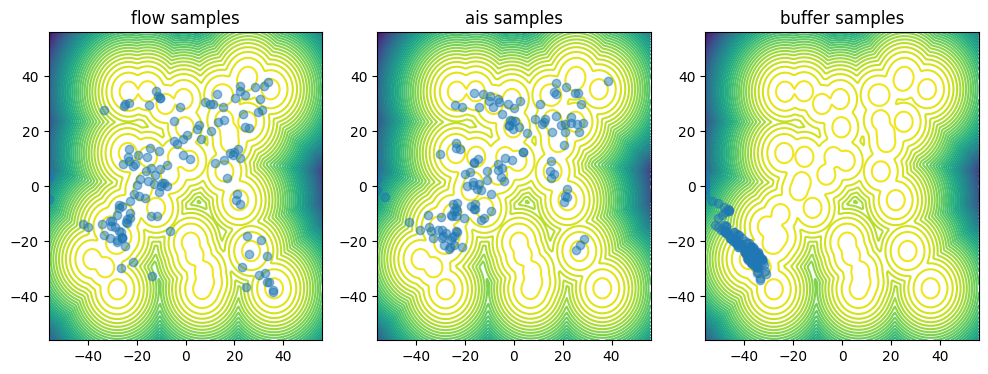

loss: 7.194934854370341e+26, ess base: 0.08483022451400757,ess ais: 0.008015959523618221:  67%|██████▋   | 2668/4000 [09:22<15:01,  1.48it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.4062291673034478e+33, ess base: 0.17731888592243195,ess ais: 0.0986289232969284:  67%|██████▋   | 2669/4000 [09:22<11:51,  1.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1599270614972078e+27, ess base: 0.1887168139219284,ess ais: 0.03902295604348183:  67%|██████▋   | 2670/4000 [09:22<09:37,  2.30it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1788008389008162e+31, ess base: 0.2579091191291809,ess ais: 0.1509636789560318:  67%|██████▋   | 2671/4000 [09:23<08:04,  2.74it/s] 

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.324166153047721e+34, ess base: 0.16846062242984772,ess ais: 0.008064515888690948:  67%|██████▋   | 2672/4000 [09:23<06:59,  3.16it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9991190404513545e+29, ess base: 0.19534896314144135,ess ais: 0.008931309916079044:  67%|██████▋   | 2673/4000 [09:23<06:13,  3.56it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1788846174601154e+31, ess base: 0.18885187804698944,ess ais: 0.007874015718698502:  67%|██████▋   | 2675/4000 [09:23<05:17,  4.17it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3241353283407427e+34, ess base: 0.2138037085533142,ess ais: 0.09648710489273071:  67%|██████▋   | 2676/4000 [09:24<05:01,  4.39it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.0156505343506066e+29, ess base: 0.21105799078941345,ess ais: 0.0078125:  67%|██████▋   | 2677/4000 [09:24<04:49,  4.57it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9881319297018054e+33, ess base: 0.16664960980415344,ess ais: 0.052069153636693954:  67%|██████▋   | 2678/4000 [09:24<04:42,  4.69it/s]

nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2231491516834434e+23, ess base: 0.2176080048084259,ess ais: 0.10464254021644592:  67%|██████▋   | 2679/4000 [09:24<04:37,  4.77it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3944410380218577e+33, ess base: 0.21247977018356323,ess ais: 0.007874030619859695:  67%|██████▋   | 2680/4000 [09:25<04:34,  4.81it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.718800692692661e+27, ess base: 0.0231282040476799,ess ais: 0.0078125:  67%|██████▋   | 2682/4000 [09:25<04:27,  4.92it/s]             

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.341656987073979e+26, ess base: 0.02962462045252323,ess ais: 0.00800000037997961:  67%|██████▋   | 2683/4000 [09:25<04:25,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1847520692914878e+34, ess base: 0.25900861620903015,ess ais: 0.010271737352013588:  67%|██████▋   | 2684/4000 [09:25<04:24,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4059302047839604e+33, ess base: 0.2520049810409546,ess ais: 0.007874015718698502:  67%|██████▋   | 2686/4000 [09:26<04:19,  5.06it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6544359396438878e+27, ess base: 0.21978558599948883,ess ais: 0.07895108312368393:  67%|██████▋   | 2687/4000 [09:26<04:20,  5.03it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3241360711047663e+34, ess base: 0.12096090614795685,ess ais: 0.0078125:  67%|██████▋   | 2688/4000 [09:26<04:20,  5.04it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1847512027334603e+34, ess base: 0.19423943758010864,ess ais: 0.00800000037997961:  67%|██████▋   | 2689/4000 [09:26<04:19,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4524436862083985e+26, ess base: 0.15819676220417023,ess ais: 0.058662671595811844:  67%|██████▋   | 2690/4000 [09:26<04:17,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1788303366908148e+31, ess base: 0.2630098760128021,ess ais: 0.10681292414665222:  67%|██████▋   | 2692/4000 [09:27<04:17,  5.09it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1787863317909808e+31, ess base: 0.18592259287834167,ess ais: 0.011044466868042946:  67%|██████▋   | 2693/4000 [09:27<04:16,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.18354272566711e+34, ess base: 0.21769684553146362,ess ais: 0.11583641916513443:  67%|██████▋   | 2694/4000 [09:27<04:15,  5.11it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3941414565323506e+33, ess base: 0.21345388889312744,ess ais: 0.10386819392442703:  67%|██████▋   | 2695/4000 [09:27<04:16,  5.08it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.202819730657207e+26, ess base: 0.20888900756835938,ess ais: 0.00800000037997961:  67%|██████▋   | 2696/4000 [09:28<04:18,  5.04it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3941414565323506e+33, ess base: 0.253591924905777,ess ais: 0.018791968002915382:  67%|██████▋   | 2697/4000 [09:28<04:21,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3750297479872757e+27, ess base: 0.2758142054080963,ess ais: 0.16262473165988922:  67%|██████▋   | 2698/4000 [09:28<04:22,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.394448929889608e+33, ess base: 0.2607172429561615,ess ais: 0.1389358639717102:  67%|██████▋   | 2699/4000 [09:28<04:20,  5.00it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3130136746550194e+21, ess base: 0.2026890516281128,ess ais: 0.09987081587314606:  68%|██████▊   | 2701/4000 [09:29<04:16,  5.06it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3229866437782898e+34, ess base: 0.23387445509433746,ess ais: 0.09390711039304733:  68%|██████▊   | 2702/4000 [09:29<04:14,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.406228703075933e+33, ess base: 0.2823185324668884,ess ais: 0.13506214320659637:  68%|██████▊   | 2703/4000 [09:29<04:13,  5.12it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3941498126276158e+33, ess base: 0.16224075853824615,ess ais: 0.0078125:  68%|██████▊   | 2704/4000 [09:29<04:12,  5.12it/s]        

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1835725600220567e+34, ess base: 0.27403882145881653,ess ais: 0.02317146584391594:  68%|██████▊   | 2706/4000 [09:30<04:12,  5.13it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.183542478079102e+34, ess base: 0.03823348134756088,ess ais: 0.007874015718698502:  68%|██████▊   | 2707/4000 [09:30<04:11,  5.14it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.349521940877246e+26, ess base: 0.21800488233566284,ess ais: 0.007936508394777775:  68%|██████▊   | 2708/4000 [09:30<04:10,  5.15it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.683868757523064e+26, ess base: 0.04479437321424484,ess ais: 0.00999247096478939:  68%|██████▊   | 2709/4000 [09:30<04:10,  5.16it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3941414565323506e+33, ess base: 0.23687800765037537,ess ais: 0.06448432058095932:  68%|██████▊   | 2710/4000 [09:30<04:10,  5.15it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4601272162837004e+26, ess base: 0.20360919833183289,ess ais: 0.09693577140569687:  68%|██████▊   | 2711/4000 [09:31<04:10,  5.14it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1847212445845096e+34, ess base: 0.18892763555049896,ess ais: 0.007874015718698502:  68%|██████▊   | 2712/4000 [09:31<04:14,  5.06it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.183542601873106e+34, ess base: 0.2628386616706848,ess ais: 0.007936508394777775:  68%|██████▊   | 2713/4000 [09:31<04:16,  5.01it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4059294310714358e+33, ess base: 0.30731672048568726,ess ais: 0.00800000037997961:  68%|██████▊   | 2715/4000 [09:31<04:13,  5.06it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4059370134541765e+33, ess base: 0.25158223509788513,ess ais: 0.008010451681911945:  68%|██████▊   | 2716/4000 [09:32<04:12,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.63535055095056e+25, ess base: 0.22849859297275543,ess ais: 0.00800000037997961:  68%|██████▊   | 2717/4000 [09:32<04:11,  5.10it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3941428492148948e+33, ess base: 0.10072914510965347,ess ais: 0.0078125:  68%|██████▊   | 2718/4000 [09:32<04:11,  5.10it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.341704210738808e+26, ess base: 0.050477564334869385,ess ais: 0.007812537252902985:  68%|██████▊   | 2720/4000 [09:32<04:10,  5.12it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3941490389150913e+33, ess base: 0.09887386858463287,ess ais: 0.007936508394777775:  68%|██████▊   | 2721/4000 [09:33<04:09,  5.13it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3941414565323506e+33, ess base: 0.23523342609405518,ess ais: 0.01197055447846651:  68%|██████▊   | 2722/4000 [09:33<04:08,  5.14it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.556300582513386e+27, ess base: 0.2014484405517578,ess ais: 0.00800000037997961:  68%|██████▊   | 2723/4000 [09:33<04:08,  5.14it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.816506600491344e+23, ess base: 0.2540501654148102,ess ais: 0.12741458415985107:  68%|██████▊   | 2724/4000 [09:33<04:08,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3941414565323506e+33, ess base: 0.28059476613998413,ess ais: 0.0078125:  68%|██████▊   | 2726/4000 [09:34<04:08,  5.12it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.208738436112589e+31, ess base: 0.17784006893634796,ess ais: 0.008045000955462456:  68%|██████▊   | 2727/4000 [09:34<04:08,  5.12it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.48763560296503e+27, ess base: 0.21874897181987762,ess ais: 0.01544424518942833:  68%|██████▊   | 2728/4000 [09:34<04:07,  5.14it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3941420755023703e+33, ess base: 0.2406424731016159,ess ais: 0.10495006293058395:  68%|██████▊   | 2729/4000 [09:34<04:07,  5.13it/s]

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.671010343886021e+27, ess base: 0.2146008461713791,ess ais: 0.08359860628843307:  68%|██████▊   | 2730/4000 [09:35<04:06,  5.14it/s]  

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4059300500414555e+33, ess base: 0.2263166308403015,ess ais: 0.0785113200545311:  68%|██████▊   | 2732/4000 [09:35<04:08,  5.11it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.919314068309809e+25, ess base: 0.2624291479587555,ess ais: 0.007874015718698502:  68%|██████▊   | 2733/4000 [09:35<04:07,  5.13it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.341640101372253e+27, ess base: 0.2995463013648987,ess ais: 0.007874015718698502:  68%|██████▊   | 2734/4000 [09:35<04:06,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.556321833162559e+27, ess base: 0.22639989852905273,ess ais: 0.05541057139635086:  68%|██████▊   | 2735/4000 [09:35<04:06,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.405929276328931e+33, ess base: 0.24661588668823242,ess ais: 0.007936508394777775:  68%|██████▊   | 2737/4000 [09:36<04:05,  5.14it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1795485595202478e+31, ess base: 0.23936870694160461,ess ais: 0.11400233209133148:  68%|██████▊   | 2738/4000 [09:36<04:12,  5.01it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1789565485463825e+31, ess base: 0.2967337667942047,ess ais: 0.007936508394777775:  68%|██████▊   | 2739/4000 [09:36<04:14,  4.96it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1795485595202478e+31, ess base: 0.26626285910606384,ess ais: 0.007874015718698502:  68%|██████▊   | 2740/4000 [09:36<04:13,  4.97it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.830343703856115e+26, ess base: 0.2522934675216675,ess ais: 0.007874015718698502:  69%|██████▊   | 2741/4000 [09:37<04:13,  4.97it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.394149657885111e+33, ess base: 0.2609219253063202,ess ais: 0.00864950381219387:  69%|██████▊   | 2742/4000 [09:37<04:18,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.833540155669207e+26, ess base: 0.23265713453292847,ess ais: 0.007874015718698502:  69%|██████▊   | 2743/4000 [09:37<04:16,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.0709315008723752e+29, ess base: 0.261568546295166,ess ais: 0.007874015718698502:  69%|██████▊   | 2744/4000 [09:37<04:14,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9956736018654528e+29, ess base: 0.24466516077518463,ess ais: 0.09009943157434464:  69%|██████▊   | 2745/4000 [09:37<04:14,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2087334795167285e+31, ess base: 0.22123287618160248,ess ais: 0.09554334729909897:  69%|██████▊   | 2746/4000 [09:38<04:14,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1788400080973717e+31, ess base: 0.08055712282657623,ess ais: 0.007874015718698502:  69%|██████▊   | 2747/4000 [09:38<04:14,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.405929276328931e+33, ess base: 0.30463895201683044,ess ais: 0.008751668967306614:  69%|██████▊   | 2748/4000 [09:38<04:14,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.341869493565708e+26, ess base: 0.20693883299827576,ess ais: 0.09039930999279022:  69%|██████▉   | 2750/4000 [09:38<04:09,  5.01it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.178879781756837e+31, ess base: 0.1576104313135147,ess ais: 0.007874015718698502:  69%|██████▉   | 2751/4000 [09:39<04:08,  5.02it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3944413475068675e+33, ess base: 0.18946947157382965,ess ais: 0.06957726180553436:  69%|██████▉   | 2752/4000 [09:39<04:09,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.68663060404578e+26, ess base: 0.23730719089508057,ess ais: 0.11131425201892853:  69%|██████▉   | 2753/4000 [09:39<04:12,  4.95it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.671330284215235e+27, ess base: 0.03334769234061241,ess ais: 0.00978615041822195:  69%|██████▉   | 2754/4000 [09:39<04:10,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.3646843251255006e+26, ess base: 0.188996359705925,ess ais: 0.03711102157831192:  69%|██████▉   | 2755/4000 [09:39<04:09,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1789286223599494e+31, ess base: 0.29262351989746094,ess ais: 0.0078125:  69%|██████▉   | 2756/4000 [09:40<04:09,  4.99it/s]        

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.006305915554304e+29, ess base: 0.2658272087574005,ess ais: 0.0793587937951088:  69%|██████▉   | 2758/4000 [09:40<04:06,  5.03it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.683868757523064e+26, ess base: 0.2787233889102936,ess ais: 0.1150391548871994:  69%|██████▉   | 2759/4000 [09:40<04:04,  5.07it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1788303366908148e+31, ess base: 0.32372382283210754,ess ais: 0.15211012959480286:  69%|██████▉   | 2760/4000 [09:40<04:03,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.341627705160235e+27, ess base: 0.26094913482666016,ess ais: 0.007874015718698502:  69%|██████▉   | 2761/4000 [09:41<04:03,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.71848606502574e+27, ess base: 0.21193699538707733,ess ais: 0.00800000037997961:  69%|██████▉   | 2762/4000 [09:41<04:25,  4.66it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.0019052366762476e+29, ess base: 0.23933954536914825,ess ais: 0.008671941235661507:  69%|██████▉   | 2763/4000 [09:41<04:29,  4.60it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.637232118846079e+25, ess base: 0.24368639290332794,ess ais: 0.0078125:  69%|██████▉   | 2764/4000 [09:41<04:24,  4.68it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5439282804944303e+22, ess base: 0.22366200387477875,ess ais: 0.007821638137102127:  69%|██████▉   | 2765/4000 [09:41<04:20,  4.74it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1787863317909808e+31, ess base: 0.21083226799964905,ess ais: 0.13621515035629272:  69%|██████▉   | 2766/4000 [09:42<04:17,  4.79it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.888100332662685e+25, ess base: 0.24641062319278717,ess ais: 0.06777511537075043:  69%|██████▉   | 2767/4000 [09:42<04:15,  4.83it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.179642009486104e+31, ess base: 0.235439270734787,ess ais: 0.007874015718698502:  69%|██████▉   | 2768/4000 [09:42<04:14,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.198218374815461e+26, ess base: 0.056504592299461365,ess ais: 0.007874015718698502:  69%|██████▉   | 2769/4000 [09:42<04:13,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.194926737802948e+26, ess base: 0.20111843943595886,ess ais: 0.10690435767173767:  69%|██████▉   | 2770/4000 [09:42<04:11,  4.88it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.341648870506587e+26, ess base: 0.2901703417301178,ess ais: 0.17347197234630585:  69%|██████▉   | 2771/4000 [09:43<04:10,  4.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1788008389008162e+31, ess base: 0.24450507760047913,ess ais: 0.00799973402172327:  69%|██████▉   | 2772/4000 [09:43<04:11,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1595801889216458e+27, ess base: 0.21005019545555115,ess ais: 0.0078125:  69%|██████▉   | 2773/4000 [09:43<04:12,  4.86it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.158437074260946e+26, ess base: 0.19778412580490112,ess ais: 0.04818935692310333:  69%|██████▉   | 2774/4000 [09:43<04:11,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1787863317909808e+31, ess base: 0.2648601830005646,ess ais: 0.09499162435531616:  69%|██████▉   | 2775/4000 [09:43<04:10,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2087334795167285e+31, ess base: 0.1551859825849533,ess ais: 0.007824385538697243:  69%|██████▉   | 2776/4000 [09:44<04:11,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.376924256967034e+21, ess base: 0.222504660487175,ess ais: 0.007874015718698502:  69%|██████▉   | 2777/4000 [09:44<04:12,  4.84it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.15843559852142e+26, ess base: 0.22387757897377014,ess ais: 0.00817915704101324:  69%|██████▉   | 2778/4000 [09:44<04:12,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.2088364799965597e+31, ess base: 0.21145394444465637,ess ais: 0.06470983475446701:  69%|██████▉   | 2779/4000 [09:44<04:10,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.2089132467861052e+31, ess base: 0.2773174047470093,ess ais: 0.13928110897541046:  70%|██████▉   | 2780/4000 [09:44<04:09,  4.88it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.8872042820693046e+25, ess base: 0.1719975471496582,ess ais: 0.015154142864048481:  70%|██████▉   | 2781/4000 [09:45<04:11,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.636235072328895e+25, ess base: 0.2258354276418686,ess ais: 0.007936508394777775:  70%|██████▉   | 2782/4000 [09:45<04:11,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.889478304444991e+25, ess base: 0.26762938499450684,ess ais: 0.008293109945952892:  70%|██████▉   | 2783/4000 [09:45<04:11,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.6537148933115346e+27, ess base: 0.032657522708177567,ess ais: 0.007874015718698502:  70%|██████▉   | 2784/4000 [09:45<04:10,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.2095891572118517e+31, ess base: 0.23919259011745453,ess ais: 0.00800000037997961:  70%|██████▉   | 2785/4000 [09:46<04:10,  4.85it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.342221457442635e+26, ess base: 0.24204489588737488,ess ais: 0.13549725711345673:  70%|██████▉   | 2786/4000 [09:46<04:10,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.0117355036416484e+29, ess base: 0.214712455868721,ess ais: 0.0078125:  70%|██████▉   | 2787/4000 [09:46<04:10,  4.84it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.9951992873759134e+29, ess base: 0.1739571988582611,ess ais: 0.03551486134529114:  70%|██████▉   | 2788/4000 [09:46<04:10,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1795582309268047e+31, ess base: 0.09968537092208862,ess ais: 0.01893947832286358:  70%|██████▉   | 2789/4000 [09:46<04:08,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.622195831848407e+27, ess base: 0.2235792577266693,ess ais: 0.05159689858555794:  70%|██████▉   | 2790/4000 [09:47<04:07,  4.88it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.635091374196325e+25, ess base: 0.23198804259300232,ess ais: 0.054494936019182205:  70%|██████▉   | 2791/4000 [09:47<04:07,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1787863317909808e+31, ess base: 0.25495466589927673,ess ais: 0.1274561583995819:  70%|██████▉   | 2792/4000 [09:47<04:05,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6536543879909728e+27, ess base: 0.3128315806388855,ess ais: 0.1700645238161087:  70%|██████▉   | 2793/4000 [09:47<04:04,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1787863317909808e+31, ess base: 0.19888544082641602,ess ais: 0.007874015718698502:  70%|██████▉   | 2794/4000 [09:47<04:03,  4.95it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.556379091856164e+27, ess base: 0.27045512199401855,ess ais: 0.007874015718698502:  70%|██████▉   | 2795/4000 [09:48<04:03,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.622144476112906e+27, ess base: 0.22575990855693817,ess ais: 0.10686072707176208:  70%|██████▉   | 2796/4000 [09:48<04:04,  4.93it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.341615666367254e+26, ess base: 0.20561668276786804,ess ais: 0.00800000037997961:  70%|██████▉   | 2798/4000 [09:48<04:01,  4.97it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.718494919462896e+27, ess base: 0.24039049446582794,ess ais: 0.03283221274614334:  70%|██████▉   | 2799/4000 [09:48<04:01,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.62221708249758e+27, ess base: 0.2163538783788681,ess ais: 0.07179169356822968:  70%|███████   | 2800/4000 [09:49<04:00,  4.98it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.62219937362327e+27, ess base: 0.19822929799556732,ess ais: 0.007936508394777775:  70%|███████   | 2801/4000 [09:49<04:00,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.556297040738524e+27, ess base: 0.17936952412128448,ess ais: 0.07653436064720154:  70%|███████   | 2802/4000 [09:49<04:00,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4524436862083985e+26, ess base: 0.12581084668636322,ess ais: 0.007936508394777775:  70%|███████   | 2803/4000 [09:49<04:00,  4.99it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.830371005037344e+26, ess base: 0.23687684535980225,ess ais: 0.09410694241523743:  70%|███████   | 2805/4000 [09:50<03:58,  5.02it/s]  

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.1442892197749724e+21, ess base: 0.23272794485092163,ess ais: 0.09548799693584442:  70%|███████   | 2806/4000 [09:50<03:56,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.209080808517979e+20, ess base: 0.15046055614948273,ess ais: 0.04131006821990013:  70%|███████   | 2807/4000 [09:50<03:54,  5.08it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.635019431894438e+25, ess base: 0.24174068868160248,ess ais: 0.09619118273258209:  70%|███████   | 2808/4000 [09:50<03:53,  5.11it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.060467897674638e+22, ess base: 0.27984824776649475,ess ais: 0.008064515888690948:  70%|███████   | 2810/4000 [09:51<03:52,  5.13it/s]

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.684251711930035e+26, ess base: 0.28193747997283936,ess ais: 0.0078125:  70%|███████   | 2811/4000 [09:51<03:53,  5.10it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1787863317909808e+31, ess base: 0.2624436914920807,ess ais: 0.008001507259905338:  70%|███████   | 2812/4000 [09:51<03:56,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1788846174601154e+31, ess base: 0.054959774017333984,ess ais: 0.010106435976922512:  70%|███████   | 2813/4000 [09:51<03:56,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.933286222017326e+22, ess base: 0.3011932373046875,ess ais: 0.007936508394777775:  70%|███████   | 2814/4000 [09:51<03:54,  5.07it/s]   

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.194926737802948e+26, ess base: 0.04984845593571663,ess ais: 0.009933589026331902:  70%|███████   | 2816/4000 [09:52<03:52,  5.08it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.830556210347844e+26, ess base: 0.2765849530696869,ess ais: 0.17402434349060059:  70%|███████   | 2817/4000 [09:52<03:51,  5.10it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.68425318766956e+26, ess base: 0.2139187455177307,ess ais: 0.0078125:  70%|███████   | 2818/4000 [09:52<03:52,  5.07it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.62213503137994e+27, ess base: 0.130507692694664,ess ais: 0.007936508394777775:  70%|███████   | 2819/4000 [09:52<03:53,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1787911674942592e+31, ess base: 0.19194702804088593,ess ais: 0.007936508394777775:  70%|███████   | 2820/4000 [09:52<03:53,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.635019431894438e+25, ess base: 0.23993250727653503,ess ais: 0.04737752303481102:  71%|███████   | 2821/4000 [09:53<03:53,  5.04it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.635916865993624e+25, ess base: 0.1795625239610672,ess ais: 0.03620448708534241:  71%|███████   | 2822/4000 [09:53<03:54,  5.02it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.341627705160235e+27, ess base: 0.2707539200782776,ess ais: 0.16713565587997437:  71%|███████   | 2824/4000 [09:53<03:53,  5.05it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.7025263062961434e+27, ess base: 0.278881698846817,ess ais: 0.0948004201054573:  71%|███████   | 2825/4000 [09:53<03:52,  5.05it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.622156872324924e+27, ess base: 0.15855468809604645,ess ais: 0.00800000037997961:  71%|███████   | 2826/4000 [09:54<03:52,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1787960031975377e+31, ess base: 0.2609882950782776,ess ais: 0.06312008947134018:  71%|███████   | 2827/4000 [09:54<03:52,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.643269738181404e+25, ess base: 0.1019492968916893,ess ais: 0.019700028002262115:  71%|███████   | 2829/4000 [09:54<03:52,  5.04it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.887215811284351e+25, ess base: 0.2811848521232605,ess ais: 0.03283587843179703:  71%|███████   | 2830/4000 [09:54<03:52,  5.04it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1787960031975377e+31, ess base: 0.23613175749778748,ess ais: 0.0078125:  71%|███████   | 2831/4000 [09:55<03:58,  4.90it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.635903953272772e+25, ess base: 0.24782298505306244,ess ais: 0.0083337826654315:  71%|███████   | 2832/4000 [09:55<03:56,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.637233963520486e+25, ess base: 0.23044373095035553,ess ais: 0.11667300760746002:  71%|███████   | 2833/4000 [09:55<03:55,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.641410306378774e+25, ess base: 0.24259726703166962,ess ais: 0.007874015718698502:  71%|███████   | 2834/4000 [09:55<03:53,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1788582628772478e+31, ess base: 0.13568657636642456,ess ais: 0.007874015718698502:  71%|███████   | 2835/4000 [09:55<03:52,  5.00it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.19562033538012e+26, ess base: 0.17929551005363464,ess ais: 0.00889691524207592:  71%|███████   | 2836/4000 [09:56<03:53,  4.98it/s]   

nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.656163462794183e+18, ess base: 0.2805476486682892,ess ais: 0.18443088233470917:  71%|███████   | 2837/4000 [09:56<03:55,  4.94it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.889737020030625e+25, ess base: 0.18770815432071686,ess ais: 0.022727694362401962:  71%|███████   | 2839/4000 [09:56<03:53,  4.98it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1795485595202478e+31, ess base: 0.04860175400972366,ess ais: 0.00922322180122137:  71%|███████   | 2840/4000 [09:57<03:51,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.671028643056142e+27, ess base: 0.2202480584383011,ess ais: 0.008868994191288948:  71%|███████   | 2841/4000 [09:57<03:53,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.635038800975715e+25, ess base: 0.24565666913986206,ess ais: 0.0732906237244606:  71%|███████   | 2842/4000 [09:57<03:55,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.341837027296139e+26, ess base: 0.2680028975009918,ess ais: 0.00971615593880415:  71%|███████   | 2843/4000 [09:57<03:55,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1795488013054117e+31, ess base: 0.22631607949733734,ess ais: 0.007874015718698502:  71%|███████   | 2844/4000 [09:57<03:56,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.532413251787188e+22, ess base: 0.19425474107265472,ess ais: 0.09831061214208603:  71%|███████   | 2845/4000 [09:58<03:57,  4.87it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.638112028538395e+25, ess base: 0.22890056669712067,ess ais: 0.12322039902210236:  71%|███████   | 2846/4000 [09:58<03:58,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.718549226677449e+27, ess base: 0.25742700695991516,ess ais: 0.0078125:  71%|███████   | 2847/4000 [09:58<03:57,  4.85it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.622147427591958e+27, ess base: 0.2753288447856903,ess ais: 0.007828975096344948:  71%|███████   | 2848/4000 [09:58<03:56,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.341836289426376e+26, ess base: 0.2515760064125061,ess ais: 0.007936508394777775:  71%|███████   | 2849/4000 [09:58<03:55,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.622156872324924e+27, ess base: 0.2295074313879013,ess ais: 0.007874015718698502:  71%|███████▏  | 2850/4000 [09:59<03:55,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.654555320147592e+27, ess base: 0.28474941849708557,ess ais: 0.14388270676136017:  71%|███████▏  | 2851/4000 [09:59<03:55,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.82250937164801e+25, ess base: 0.18636274337768555,ess ais: 0.032931119203567505:  71%|███████▏  | 2852/4000 [09:59<03:55,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.321027212635121e+22, ess base: 0.26339709758758545,ess ais: 0.13757865130901337:  71%|███████▏  | 2853/4000 [09:59<03:55,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.635358851985394e+25, ess base: 0.2765921354293823,ess ais: 0.029445931315422058:  71%|███████▏  | 2854/4000 [09:59<03:54,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.314520411893496e+22, ess base: 0.161952942609787,ess ais: 0.0078125:  71%|███████▏  | 2855/4000 [10:00<03:54,  4.88it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.62409245228709e+27, ess base: 0.16882917284965515,ess ais: 0.00800000037997961:  71%|███████▏  | 2856/4000 [10:00<03:54,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.68364739659418e+26, ess base: 0.2784150242805481,ess ais: 0.14383748173713684:  71%|███████▏  | 2857/4000 [10:00<03:54,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.622161004395596e+27, ess base: 0.24756112694740295,ess ais: 0.007882393896579742:  71%|███████▏  | 2858/4000 [10:00<03:54,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.360362723434484e+26, ess base: 0.2631767988204956,ess ais: 0.10954711586236954:  71%|███████▏  | 2859/4000 [10:00<03:53,  4.88it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.390508330328609e+27, ess base: 0.2478509545326233,ess ais: 0.007874015718698502:  72%|███████▏  | 2860/4000 [10:01<03:54,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.720442305341269e+27, ess base: 0.2299494594335556,ess ais: 0.0078125:  72%|███████▏  | 2861/4000 [10:01<03:54,  4.86it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.652646893792703e+27, ess base: 0.19688007235527039,ess ais: 0.0078125:  72%|███████▏  | 2862/4000 [10:01<03:54,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.379797430693194e+22, ess base: 0.04272596538066864,ess ais: 0.010882796719670296:  72%|███████▏  | 2863/4000 [10:01<03:53,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.030533850931698e+27, ess base: 0.22773632407188416,ess ais: 0.13207918405532837:  72%|███████▏  | 2864/4000 [10:01<03:52,  4.89it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.283997287599362e+22, ess base: 0.24427010118961334,ess ais: 0.007936508394777775:  72%|███████▏  | 2865/4000 [10:02<03:52,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.887546930340474e+25, ess base: 0.16207852959632874,ess ais: 0.029272599145770073:  72%|███████▏  | 2866/4000 [10:02<03:56,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.342220719572872e+26, ess base: 0.2671399414539337,ess ais: 0.10743246227502823:  72%|███████▏  | 2867/4000 [10:02<03:55,  4.81it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.638170135782227e+25, ess base: 0.19122812151908875,ess ais: 0.007936508394777775:  72%|███████▏  | 2868/4000 [10:02<03:55,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.4744525779425047e+22, ess base: 0.09182361513376236,ess ais: 0.008064515888690948:  72%|███████▏  | 2869/4000 [10:02<03:54,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.605260307320347e+27, ess base: 0.27239561080932617,ess ais: 0.007814581505954266:  72%|███████▏  | 2870/4000 [10:03<03:54,  4.82it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.21370699900951e+26, ess base: 0.27439579367637634,ess ais: 0.0078125:  72%|███████▏  | 2871/4000 [10:03<03:53,  4.83it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.653676966805719e+27, ess base: 0.2025902420282364,ess ais: 0.04466269910335541:  72%|███████▏  | 2872/4000 [10:03<03:52,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.8872042820693046e+25, ess base: 0.2250385880470276,ess ais: 0.1300818920135498:  72%|███████▏  | 2873/4000 [10:03<03:51,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.342342468083758e+26, ess base: 0.2497745305299759,ess ais: 0.09632156044244766:  72%|███████▏  | 2874/4000 [10:04<03:50,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.638896678654484e+22, ess base: 0.21512556076049805,ess ais: 0.09407559782266617:  72%|███████▏  | 2875/4000 [10:04<03:49,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0305119361997385e+27, ess base: 0.30472493171691895,ess ais: 0.0078125:  72%|███████▏  | 2876/4000 [10:04<03:46,  4.96it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.390508330328609e+27, ess base: 0.2914542257785797,ess ais: 0.007874015718698502:  72%|███████▏  | 2877/4000 [10:04<03:45,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.684252449799797e+26, ess base: 0.12617921829223633,ess ais: 0.0078125:  72%|███████▏  | 2879/4000 [10:04<03:42,  5.04it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.830783474234832e+26, ess base: 0.2042279839515686,ess ais: 0.007936548441648483:  72%|███████▏  | 2880/4000 [10:05<03:42,  5.04it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6555620764760996e+27, ess base: 0.03985362872481346,ess ais: 0.01909582130610943:  72%|███████▏  | 2881/4000 [10:05<03:41,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.622240694329995e+27, ess base: 0.28412115573883057,ess ais: 0.007874015718698502:  72%|███████▏  | 2882/4000 [10:05<03:42,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.952259579573283e+29, ess base: 0.20980514585971832,ess ais: 0.0078125:  72%|███████▏  | 2883/4000 [10:05<03:42,  5.03it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.62400981087364e+27, ess base: 0.2915624678134918,ess ais: 0.14968952536582947:  72%|███████▏  | 2884/4000 [10:05<03:42,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.952261090730558e+29, ess base: 0.2647593319416046,ess ais: 0.007874015718698502:  72%|███████▏  | 2885/4000 [10:06<03:42,  5.01it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.951296216810778e+29, ess base: 0.14741383492946625,ess ais: 0.0245587769895792:  72%|███████▏  | 2886/4000 [10:06<03:46,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0794389733762013e+27, ess base: 0.2321324199438095,ess ais: 0.0078125:  72%|███████▏  | 2887/4000 [10:06<03:46,  4.92it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9606385688711684e+29, ess base: 0.20388458669185638,ess ais: 0.0078125:  72%|███████▏  | 2888/4000 [10:06<03:47,  4.90it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.718540372240293e+27, ess base: 0.23161949217319489,ess ais: 0.007874015718698502:  72%|███████▏  | 2889/4000 [10:07<03:46,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.54166904974136e+22, ess base: 0.22663551568984985,ess ais: 0.11358509212732315:  72%|███████▏  | 2891/4000 [10:07<03:42,  4.98it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.88721073842973e+25, ess base: 0.24043957889080048,ess ais: 0.026303859427571297:  72%|███████▏  | 2892/4000 [10:07<03:39,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.9393635623139394e+24, ess base: 0.12773916125297546,ess ais: 0.00800000037997961:  72%|███████▏  | 2893/4000 [10:07<03:38,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406119074339763e+30, ess base: 0.20710493624210358,ess ais: 0.007874015718698502:  72%|███████▏  | 2894/4000 [10:07<03:37,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.622138573154803e+27, ess base: 0.24082720279693604,ess ais: 0.007892538793385029:  72%|███████▏  | 2896/4000 [10:08<03:37,  5.08it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.41472420832378e+30, ess base: 0.23499242961406708,ess ais: 0.00800000037997961:  72%|███████▏  | 2897/4000 [10:08<03:40,  5.00it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.605168221173931e+27, ess base: 0.029982101172208786,ess ais: 0.007874015718698502:  72%|███████▏  | 2898/4000 [10:08<03:40,  4.99it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.9304426880568558e+24, ess base: 0.26826584339141846,ess ais: 0.15063054859638214:  72%|███████▏  | 2899/4000 [10:08<03:40,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.406120887728493e+30, ess base: 0.2514914870262146,ess ais: 0.009495226666331291:  72%|███████▎  | 2900/4000 [10:09<03:40,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.413743165021163e+30, ess base: 0.10498391091823578,ess ais: 0.014912677928805351:  73%|███████▎  | 2901/4000 [10:09<03:40,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.34161714210678e+26, ess base: 0.2337530553340912,ess ais: 0.0078125:  73%|███████▎  | 2902/4000 [10:09<03:40,  4.99it/s]             

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406169849224187e+30, ess base: 0.3061257302761078,ess ais: 0.15510194003582:  73%|███████▎  | 2904/4000 [10:09<03:39,  5.00it/s]    

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.940035480905843e+18, ess base: 0.24728848040103912,ess ais: 0.14146463572978973:  73%|███████▎  | 2905/4000 [10:10<03:39,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5393505730471217e+29, ess base: 0.25423434376716614,ess ais: 0.12602005898952484:  73%|███████▎  | 2906/4000 [10:10<03:38,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5393498174684845e+29, ess base: 0.2242957353591919,ess ais: 0.010160799138247967:  73%|███████▎  | 2907/4000 [10:10<03:38,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.027518234158843e+29, ess base: 0.19609828293323517,ess ais: 0.007874015718698502:  73%|███████▎  | 2909/4000 [10:10<03:37,  5.01it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.036878720106528e+29, ess base: 0.18733954429626465,ess ais: 0.007874015718698502:  73%|███████▎  | 2910/4000 [10:11<03:38,  4.98it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.341615666367254e+26, ess base: 0.22666095197200775,ess ais: 0.029277680441737175:  73%|███████▎  | 2911/4000 [10:11<03:45,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.801248620462977e+30, ess base: 0.2827381491661072,ess ais: 0.1342741847038269:  73%|███████▎  | 2912/4000 [10:11<03:44,  4.84it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.5459710436721163e+30, ess base: 0.26957207918167114,ess ais: 0.15201213955879211:  73%|███████▎  | 2913/4000 [10:11<03:42,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.49062752260265e+29, ess base: 0.2250487357378006,ess ais: 0.007936508394777775:  73%|███████▎  | 2914/4000 [10:12<03:40,  4.92it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.407055387387055e+30, ess base: 0.284947007894516,ess ais: 0.1059160903096199:  73%|███████▎  | 2915/4000 [10:12<03:40,  4.92it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.808460573413217e+30, ess base: 0.2744565010070801,ess ais: 0.0078125:  73%|███████▎  | 2916/4000 [10:12<03:39,  4.93it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.413790313128128e+30, ess base: 0.25050708651542664,ess ais: 0.007874015718698502:  73%|███████▎  | 2917/4000 [10:12<03:38,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5393632289892958e+29, ess base: 0.16020244359970093,ess ais: 0.007874015718698502:  73%|███████▎  | 2918/4000 [10:12<03:38,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406119074339763e+30, ess base: 0.26036572456359863,ess ais: 0.0078125:  73%|███████▎  | 2919/4000 [10:13<03:38,  4.94it/s]            

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5469052410992235e+30, ess base: 0.20820774137973785,ess ais: 0.007874015718698502:  73%|███████▎  | 2920/4000 [10:13<03:38,  4.94it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5535933209647865e+30, ess base: 0.2616542875766754,ess ais: 0.007936508394777775:  73%|███████▎  | 2922/4000 [10:13<03:36,  4.98it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.627250534872509e+27, ess base: 0.30823448300361633,ess ais: 0.14482960104942322:  73%|███████▎  | 2923/4000 [10:13<03:34,  5.02it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.953072974703226e+30, ess base: 0.15839171409606934,ess ais: 0.0078125:  73%|███████▎  | 2924/4000 [10:14<03:33,  5.05it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406172871538736e+30, ess base: 0.24419096112251282,ess ais: 0.0078125:  73%|███████▎  | 2925/4000 [10:14<03:31,  5.08it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.567336888171747e+29, ess base: 0.22249387204647064,ess ais: 0.0078125:  73%|███████▎  | 2926/4000 [10:14<03:30,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5459710436721163e+30, ess base: 0.20370720326900482,ess ais: 0.0078125:  73%|███████▎  | 2928/4000 [10:14<03:28,  5.15it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.222102762152764e+22, ess base: 0.2134416401386261,ess ais: 0.0078125:  73%|███████▎  | 2929/4000 [10:14<03:27,  5.16it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.413741351632433e+30, ess base: 0.09886431694030762,ess ais: 0.02149909920990467:  73%|███████▎  | 2930/4000 [10:15<03:27,  5.16it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406122096654312e+30, ess base: 0.225210502743721,ess ais: 0.007889113388955593:  73%|███████▎  | 2931/4000 [10:15<03:26,  5.17it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5469052410992235e+30, ess base: 0.24279475212097168,ess ais: 0.0078125:  73%|███████▎  | 2933/4000 [10:15<03:26,  5.17it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.539349628573825e+29, ess base: 0.2849363684654236,ess ais: 0.13979452848434448:  73%|███████▎  | 2934/4000 [10:15<03:25,  5.19it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.890516856136341e+25, ess base: 0.2009381353855133,ess ais: 0.00800000037997961:  73%|███████▎  | 2935/4000 [10:16<03:25,  5.18it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.9411005897953303e+30, ess base: 0.08374305069446564,ess ais: 0.007936508394777775:  73%|███████▎  | 2936/4000 [10:16<03:25,  5.17it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.576678862442819e+29, ess base: 0.2526383101940155,ess ais: 0.00800000037997961:  73%|███████▎  | 2937/4000 [10:16<03:33,  4.98it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.545982226235948e+30, ess base: 0.2639749348163605,ess ais: 0.007936508394777775:  73%|███████▎  | 2938/4000 [10:16<03:33,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.630150658188801e+27, ess base: 0.17768998444080353,ess ais: 0.008130080997943878:  73%|███████▎  | 2939/4000 [10:16<03:33,  4.96it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.951836455536418e+29, ess base: 0.23595009744167328,ess ais: 0.007874015718698502:  74%|███████▎  | 2940/4000 [10:17<03:34,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.8747253063885326e+24, ess base: 0.2111959308385849,ess ais: 0.0078125:  74%|███████▎  | 2941/4000 [10:17<03:34,  4.93it/s]           

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5459710436721163e+30, ess base: 0.16897770762443542,ess ais: 0.03441639617085457:  74%|███████▎  | 2943/4000 [10:17<03:34,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.406119074339763e+30, ess base: 0.171107679605484,ess ais: 0.00800000037997961:  74%|███████▎  | 2944/4000 [10:17<03:34,  4.93it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.5393498174684845e+29, ess base: 0.28044289350509644,ess ais: 0.007874015718698502:  74%|███████▎  | 2945/4000 [10:18<03:30,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.963439816954835e+24, ess base: 0.20757544040679932,ess ais: 0.007936508394777775:  74%|███████▎  | 2946/4000 [10:18<03:33,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.037398935998281e+29, ess base: 0.18637101352214813,ess ais: 0.007874015718698502:  74%|███████▎  | 2947/4000 [10:18<03:33,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5398195984862003e+29, ess base: 0.17722460627555847,ess ais: 0.032210782170295715:  74%|███████▎  | 2948/4000 [10:18<03:33,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.951376685935646e+29, ess base: 0.2895456552505493,ess ais: 0.008175850845873356:  74%|███████▎  | 2949/4000 [10:18<03:32,  4.95it/s]  

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5394291532253967e+29, ess base: 0.25384700298309326,ess ais: 0.00800000037997961:  74%|███████▍  | 2950/4000 [10:19<03:36,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.605190652414725e+27, ess base: 0.23567870259284973,ess ais: 0.06607604771852493:  74%|███████▍  | 2951/4000 [10:19<03:35,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.259082134282706e+22, ess base: 0.025901444256305695,ess ais: 0.008308679796755314:  74%|███████▍  | 2952/4000 [10:19<03:34,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.539349628573825e+29, ess base: 0.20486943423748016,ess ais: 0.008070742711424828:  74%|███████▍  | 2953/4000 [10:19<03:33,  4.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.953072974703226e+30, ess base: 0.0765090063214302,ess ais: 0.007936508394777775:  74%|███████▍  | 2954/4000 [10:20<03:32,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.566153209884083e+27, ess base: 0.146220400929451,ess ais: 0.036748163402080536:  74%|███████▍  | 2955/4000 [10:20<03:32,  4.91it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.671033365422625e+27, ess base: 0.28459325432777405,ess ais: 0.07064606994390488:  74%|███████▍  | 2956/4000 [10:20<03:31,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.491116381980956e+29, ess base: 0.03196975216269493,ess ais: 0.008256632834672928:  74%|███████▍  | 2957/4000 [10:20<03:30,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.407052969535416e+30, ess base: 0.22003857791423798,ess ais: 0.10381025075912476:  74%|███████▍  | 2959/4000 [10:21<03:27,  5.02it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.762005306915422e+19, ess base: 0.3120410740375519,ess ais: 0.12106174230575562:  74%|███████▍  | 2960/4000 [10:21<03:26,  5.03it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.896737892560803e+24, ess base: 0.23413953185081482,ess ais: 0.10302866250276566:  74%|███████▍  | 2961/4000 [10:21<03:26,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406120887728493e+30, ess base: 0.255483478307724,ess ais: 0.12236858904361725:  74%|███████▍  | 2962/4000 [10:21<03:25,  5.06it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.41375102303899e+30, ess base: 0.2551823556423187,ess ais: 0.007874015718698502:  74%|███████▍  | 2964/4000 [10:22<03:22,  5.11it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.414735088656157e+30, ess base: 0.25086238980293274,ess ais: 0.0078125:  74%|███████▍  | 2965/4000 [10:22<03:22,  5.11it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.556329507008093e+27, ess base: 0.2085198611021042,ess ais: 0.007874015718698502:  74%|███████▍  | 2966/4000 [10:22<03:24,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.546907054487953e+30, ess base: 0.18218515813350677,ess ais: 0.0078125:  74%|███████▍  | 2967/4000 [10:22<03:25,  5.02it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.849171926597269e+26, ess base: 0.14623312652111053,ess ais: 0.0078125:  74%|███████▍  | 2968/4000 [10:22<03:26,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.408373116530435e+30, ess base: 0.20064999163150787,ess ais: 0.0078125:  74%|███████▍  | 2969/4000 [10:23<03:26,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.683217721169417e+25, ess base: 0.27631548047065735,ess ais: 0.1775553971529007:  74%|███████▍  | 2970/4000 [10:23<03:26,  4.98it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.689277937766233e+25, ess base: 0.23687411844730377,ess ais: 0.09516356885433197:  74%|███████▍  | 2972/4000 [10:23<03:24,  5.02it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9606895704291834e+29, ess base: 0.1615690439939499,ess ais: 0.03126520290970802:  74%|███████▍  | 2973/4000 [10:23<03:27,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.406169849224187e+30, ess base: 0.2623022198677063,ess ais: 0.007936651818454266:  74%|███████▍  | 2974/4000 [10:24<03:28,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.9512965946000964e+29, ess base: 0.231711283326149,ess ais: 0.1481337696313858:  74%|███████▍  | 2975/4000 [10:24<03:29,  4.90it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.801251642777526e+30, ess base: 0.0472806841135025,ess ais: 0.00959610752761364:  74%|███████▍  | 2976/4000 [10:24<03:29,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.660053942749816e+30, ess base: 0.16911397874355316,ess ais: 0.007874015718698502:  74%|███████▍  | 2977/4000 [10:24<03:31,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.539330928002553e+29, ess base: 0.22095887362957,ess ais: 0.007875710725784302:  74%|███████▍  | 2978/4000 [10:24<03:31,  4.84it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.960750016720164e+29, ess base: 0.2529980540275574,ess ais: 0.04790385067462921:  74%|███████▍  | 2979/4000 [10:25<03:30,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.94110240318406e+30, ess base: 0.2241414189338684,ess ais: 0.0785580575466156:  74%|███████▍  | 2980/4000 [10:25<03:29,  4.86it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.546954202594918e+30, ess base: 0.1618068665266037,ess ais: 0.039944663643836975:  75%|███████▍  | 2981/4000 [10:25<03:28,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.2024456144796424e+27, ess base: 0.20895561575889587,ess ais: 0.007874015718698502:  75%|███████▍  | 2982/4000 [10:25<03:26,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2078138545202916e+24, ess base: 0.2546275854110718,ess ais: 0.102512426674366:  75%|███████▍  | 2983/4000 [10:25<03:26,  4.94it/s]    

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.661034986052433e+30, ess base: 0.19354374706745148,ess ais: 0.0078125:  75%|███████▍  | 2985/4000 [10:26<03:23,  5.00it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.993376000282704e+24, ess base: 0.2244071066379547,ess ais: 0.06919711828231812:  75%|███████▍  | 2986/4000 [10:26<03:30,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.268315139856793e+24, ess base: 0.07805884629487991,ess ais: 0.00781279057264328:  75%|███████▍  | 2987/4000 [10:26<03:27,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.490628278181287e+29, ess base: 0.24734202027320862,ess ais: 0.00800000037997961:  75%|███████▍  | 2988/4000 [10:26<03:24,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.545978901689944e+30, ess base: 0.03375600278377533,ess ais: 0.007874015718698502:  75%|███████▍  | 2989/4000 [10:27<03:22,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.18039665249435e+27, ess base: 0.2967033088207245,ess ais: 0.007937021553516388:  75%|███████▍  | 2991/4000 [10:27<03:20,  5.04it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406119074339763e+30, ess base: 0.012799980118870735,ess ais: 0.007851062342524529:  75%|███████▍  | 2992/4000 [10:27<03:18,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.408365258512607e+30, ess base: 0.2655488848686218,ess ais: 0.008064515888690948:  75%|███████▍  | 2993/4000 [10:27<03:18,  5.07it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.2925835547909816e+18, ess base: 0.24935129284858704,ess ais: 0.00800000037997961:  75%|███████▍  | 2994/4000 [10:28<03:17,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5459761816068497e+30, ess base: 0.24916182458400726,ess ais: 0.007874015718698502:  75%|███████▍  | 2996/4000 [10:28<03:17,  5.08it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406119074339763e+30, ess base: 0.2166403830051422,ess ais: 0.042491789907217026:  75%|███████▍  | 2997/4000 [10:28<03:16,  5.09it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.2085308264146777e+27, ess base: 0.20369292795658112,ess ais: 0.017865005880594254:  75%|███████▍  | 2998/4000 [10:28<03:16,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.9737580585392176e+29, ess base: 0.251431405544281,ess ais: 0.009189927019178867:  75%|███████▍  | 2999/4000 [10:29<03:15,  5.12it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5613042881420048e+29, ess base: 0.23391705751419067,ess ais: 0.07543958723545074:  75%|███████▌  | 3000/4000 [10:29<03:17,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5459710436721163e+30, ess base: 0.33681604266166687,ess ais: 0.1705959141254425:  75%|███████▌  | 3001/4000 [10:29<03:18,  5.03it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.248076661211991e+27, ess base: 0.21475939452648163,ess ais: 0.007874015718698502:  75%|███████▌  | 3002/4000 [10:29<03:35,  4.64it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406119074339763e+30, ess base: 0.25172778964042664,ess ais: 0.1327802687883377:  75%|███████▌  | 3003/4000 [10:29<03:31,  4.71it/s]  

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2592447627960725e+27, ess base: 0.2632913887500763,ess ais: 0.008327420800924301:  75%|███████▌  | 3004/4000 [10:30<03:28,  4.77it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406120887728493e+30, ess base: 0.19418811798095703,ess ais: 0.07540211826562881:  75%|███████▌  | 3005/4000 [10:30<03:25,  4.85it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.364946760035205e+17, ess base: 0.24378253519535065,ess ais: 0.00800000037997961:  75%|███████▌  | 3007/4000 [10:30<03:20,  4.95it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.200631340306505e+27, ess base: 0.21238669753074646,ess ais: 0.055271707475185394:  75%|███████▌  | 3008/4000 [10:30<03:19,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.211297895711919e+25, ess base: 0.22737173736095428,ess ais: 0.10892685502767563:  75%|███████▌  | 3009/4000 [10:31<03:18,  4.99it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.408365258512607e+30, ess base: 0.24154427647590637,ess ais: 0.09684949368238449:  75%|███████▌  | 3010/4000 [10:31<03:17,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.548177937755823e+30, ess base: 0.3109029531478882,ess ais: 0.1726393699645996:  75%|███████▌  | 3011/4000 [10:31<03:20,  4.94it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.246224460533038e+27, ess base: 0.2575719654560089,ess ais: 0.0078125:  75%|███████▌  | 3013/4000 [10:31<03:17,  5.01it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.1973628724045487e+27, ess base: 0.08000220358371735,ess ais: 0.012349043041467667:  75%|███████▌  | 3014/4000 [10:32<03:17,  4.99it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406123910043042e+30, ess base: 0.1925574541091919,ess ais: 0.00800000037997961:  75%|███████▌  | 3015/4000 [10:32<03:24,  4.81it/s]   

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.020632794033867e+24, ess base: 0.20303522050380707,ess ais: 0.026522932574152946:  75%|███████▌  | 3016/4000 [10:32<03:28,  4.71it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2462018817182918e+27, ess base: 0.23395144939422607,ess ais: 0.007819580845534801:  75%|███████▌  | 3017/4000 [10:32<03:28,  4.72it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9512965946000964e+29, ess base: 0.2550913095474243,ess ais: 0.10754287242889404:  75%|███████▌  | 3018/4000 [10:32<03:23,  4.81it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.408327177349289e+30, ess base: 0.2290368229150772,ess ais: 0.007874015718698502:  75%|███████▌  | 3019/4000 [10:33<03:21,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.95209011801188e+30, ess base: 0.2774134874343872,ess ais: 0.0078125:  76%|███████▌  | 3020/4000 [10:33<03:19,  4.90it/s]            

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.199204595332868e+27, ess base: 0.20679500699043274,ess ais: 0.03743056580424309:  76%|███████▌  | 3021/4000 [10:33<03:19,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.801258291869534e+30, ess base: 0.22204555571079254,ess ais: 0.007874015718698502:  76%|███████▌  | 3023/4000 [10:33<03:15,  4.99it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9513158618553465e+29, ess base: 0.24395941197872162,ess ais: 0.11804640293121338:  76%|███████▌  | 3024/4000 [10:34<03:17,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.951296216810778e+29, ess base: 0.2707173526287079,ess ais: 0.15280407667160034:  76%|███████▌  | 3025/4000 [10:34<03:17,  4.94it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.91805451316209e+24, ess base: 0.10811053961515427,ess ais: 0.014965311624109745:  76%|███████▌  | 3026/4000 [10:34<03:17,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5398390546361098e+29, ess base: 0.26532745361328125,ess ais: 0.007812505587935448:  76%|███████▌  | 3027/4000 [10:34<03:16,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.5460233297138146e+30, ess base: 0.20706228911876678,ess ais: 0.08436428010463715:  76%|███████▌  | 3028/4000 [10:34<03:16,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.7999609182069616e+30, ess base: 0.2505795955657959,ess ais: 0.1310136616230011:  76%|███████▌  | 3029/4000 [10:35<03:16,  4.94it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406319756025819e+30, ess base: 0.15641148388385773,ess ais: 0.0078125:  76%|███████▌  | 3030/4000 [10:35<03:17,  4.92it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.960929330378554e+24, ess base: 0.0748172402381897,ess ais: 0.011129108257591724:  76%|███████▌  | 3031/4000 [10:35<03:16,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.79990409869344e+30, ess base: 0.17932796478271484,ess ais: 0.0078125:  76%|███████▌  | 3032/4000 [10:35<03:16,  4.93it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2071822956359132e+27, ess base: 0.2129029929637909,ess ais: 0.011491917073726654:  76%|███████▌  | 3033/4000 [10:35<03:16,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.1973298158391686e+27, ess base: 0.06835905462503433,ess ais: 0.007874015718698502:  76%|███████▌  | 3034/4000 [10:36<03:16,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1167950551364428e+25, ess base: 0.04986961558461189,ess ais: 0.010046604089438915:  76%|███████▌  | 3035/4000 [10:36<03:18,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.205307516142214e+27, ess base: 0.21154572069644928,ess ais: 0.08869969844818115:  76%|███████▌  | 3036/4000 [10:36<03:20,  4.81it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.539330928002553e+29, ess base: 0.26851168274879456,ess ais: 0.007936508394777775:  76%|███████▌  | 3037/4000 [10:36<03:18,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.662249352038236e+30, ess base: 0.16193953156471252,ess ais: 0.07923892140388489:  76%|███████▌  | 3038/4000 [10:37<03:18,  4.85it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.490678146371346e+29, ess base: 0.2799883782863617,ess ais: 0.007874015718698502:  76%|███████▌  | 3039/4000 [10:37<03:17,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.545978901689944e+30, ess base: 0.2539799213409424,ess ais: 0.007874015718698502:  76%|███████▌  | 3040/4000 [10:37<03:18,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.023554329328124e+26, ess base: 0.2100430279970169,ess ais: 0.007813464850187302:  76%|███████▌  | 3041/4000 [10:37<03:17,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.038261540300058e+24, ess base: 0.13663606345653534,ess ais: 0.007936508394777775:  76%|███████▌  | 3042/4000 [10:37<03:22,  4.74it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.143031799334041e+24, ess base: 0.21519260108470917,ess ais: 0.10892264544963837:  76%|███████▌  | 3043/4000 [10:38<03:21,  4.76it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.54597436821812e+30, ess base: 0.014065103605389595,ess ais: 0.008261996321380138:  76%|███████▌  | 3044/4000 [10:38<03:20,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.541434270034023e+29, ess base: 0.26635122299194336,ess ais: 0.0078125:  76%|███████▌  | 3045/4000 [10:38<03:18,  4.81it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.9512965946000964e+29, ess base: 0.22412142157554626,ess ais: 0.10910248011350632:  76%|███████▌  | 3046/4000 [10:38<03:16,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.4038014580682046e+22, ess base: 0.18994472920894623,ess ais: 0.04270105063915253:  76%|███████▌  | 3047/4000 [10:38<03:15,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0562360568686338e+26, ess base: 0.06730083376169205,ess ais: 0.007874015718698502:  76%|███████▌  | 3048/4000 [10:39<03:15,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.2005376308466104e+27, ess base: 0.10817606002092361,ess ais: 0.007874015718698502:  76%|███████▌  | 3049/4000 [10:39<03:15,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0054106652595456e+26, ess base: 0.2460194230079651,ess ais: 0.14468590915203094:  76%|███████▋  | 3050/4000 [10:39<03:14,  4.88it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.660052129361087e+30, ess base: 0.185452401638031,ess ais: 0.01569783128798008:  76%|███████▋  | 3051/4000 [10:39<03:14,  4.89it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.105127775487834e+24, ess base: 0.026118164882063866,ess ais: 0.0078125:  76%|███████▋  | 3052/4000 [10:39<03:13,  4.90it/s]       

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.95209011801188e+30, ess base: 0.2946825921535492,ess ais: 0.1544596254825592:  76%|███████▋  | 3053/4000 [10:40<03:12,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9733500460750976e+29, ess base: 0.27526822686195374,ess ais: 0.0078125:  76%|███████▋  | 3054/4000 [10:40<03:11,  4.93it/s]      

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.801251642777526e+30, ess base: 0.24855104088783264,ess ais: 0.007936508394777775:  76%|███████▋  | 3055/4000 [10:40<03:11,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.409055788933056e+27, ess base: 0.1675855964422226,ess ais: 0.028522878885269165:  76%|███████▋  | 3056/4000 [10:40<03:12,  4.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.95209011801188e+30, ess base: 0.019865458831191063,ess ais: 0.008202088065445423:  76%|███████▋  | 3057/4000 [10:40<03:12,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.941103914341334e+30, ess base: 0.072666697204113,ess ais: 0.01068233884871006:  76%|███████▋  | 3058/4000 [10:41<03:12,  4.91it/s]   

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0206226877033808e+31, ess base: 0.2010442465543747,ess ais: 0.008064515888690948:  76%|███████▋  | 3059/4000 [10:41<03:11,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.859087453798688e+20, ess base: 0.2107485979795456,ess ais: 0.007936508394777775:  76%|███████▋  | 3060/4000 [10:41<03:16,  4.77it/s] 

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.975274504864197e+29, ess base: 0.23942121863365173,ess ais: 0.0078125:  77%|███████▋  | 3062/4000 [10:41<03:11,  4.91it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.548168568580721e+30, ess base: 0.1964021623134613,ess ais: 0.00804006028920412:  77%|███████▋  | 3063/4000 [10:42<03:09,  4.93it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.4125745484297926e+34, ess base: 0.1502840369939804,ess ais: 0.023751286789774895:  77%|███████▋  | 3064/4000 [10:42<03:09,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.4119199257370185e+34, ess base: 0.22315256297588348,ess ais: 0.03574422374367714:  77%|███████▋  | 3065/4000 [10:42<03:08,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4122492177874684e+34, ess base: 0.2618598937988281,ess ais: 0.02277672290802002:  77%|███████▋  | 3066/4000 [10:42<03:07,  4.97it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.411894671760217e+34, ess base: 0.24896053969860077,ess ais: 0.007874015718698502:  77%|███████▋  | 3067/4000 [10:42<03:07,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0241658388941675e+26, ess base: 0.24010103940963745,ess ais: 0.007936508394777775:  77%|███████▋  | 3068/4000 [10:43<03:07,  4.98it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.539331494686531e+29, ess base: 0.226975217461586,ess ais: 0.007936508394777775:  77%|███████▋  | 3069/4000 [10:43<03:13,  4.82it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406119074339763e+30, ess base: 0.156641885638237,ess ais: 0.03009800985455513:  77%|███████▋  | 3070/4000 [10:43<03:11,  4.85it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406126932357591e+30, ess base: 0.251083642244339,ess ais: 0.007936508394777775:  77%|███████▋  | 3072/4000 [10:43<03:08,  4.91it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.4125349343485355e+34, ess base: 0.19898246228694916,ess ais: 0.008087873458862305:  77%|███████▋  | 3073/4000 [10:44<03:08,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.445494345130485e+34, ess base: 0.2855135202407837,ess ais: 0.14826036989688873:  77%|███████▋  | 3074/4000 [10:44<03:07,  4.93it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.2292939980816226e+29, ess base: 0.16286154091358185,ess ais: 0.028409775346517563:  77%|███████▋  | 3075/4000 [10:44<03:07,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.60351211974512e+30, ess base: 0.2010864019393921,ess ais: 0.007874015718698502:  77%|███████▋  | 3076/4000 [10:44<03:07,  4.93it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.411894671760217e+34, ess base: 0.10316554456949234,ess ais: 0.037321846932172775:  77%|███████▋  | 3077/4000 [10:44<03:05,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.9512965946000964e+29, ess base: 0.21814417839050293,ess ais: 0.007936508394777775:  77%|███████▋  | 3078/4000 [10:45<03:05,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.444618378758687e+34, ess base: 0.18697069585323334,ess ais: 0.054956093430519104:  77%|███████▋  | 3079/4000 [10:45<03:05,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.539330928002553e+29, ess base: 0.2844579219818115,ess ais: 0.16765904426574707:  77%|███████▋  | 3080/4000 [10:45<03:05,  4.97it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.141557500228613e+19, ess base: 0.2820310890674591,ess ais: 0.007874015718698502:  77%|███████▋  | 3081/4000 [10:45<03:04,  4.98it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2659043974230195e+32, ess base: 0.16862809658050537,ess ais: 0.007936508394777775:  77%|███████▋  | 3082/4000 [10:45<03:05,  4.96it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.951297350178734e+29, ess base: 0.2725900411605835,ess ais: 0.12794063985347748:  77%|███████▋  | 3083/4000 [10:46<03:05,  4.94it/s]   

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2659043974230195e+32, ess base: 0.31060829758644104,ess ais: 0.00800000037997961:  77%|███████▋  | 3084/4000 [10:46<03:06,  4.92it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.41227447176427e+34, ess base: 0.23363782465457916,ess ais: 0.008064515888690948:  77%|███████▋  | 3086/4000 [10:46<03:04,  4.95it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.265906331704331e+32, ess base: 0.25757843255996704,ess ais: 0.00800000037997961:  77%|███████▋  | 3087/4000 [10:47<03:04,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8574451747664436e+30, ess base: 0.008176923729479313,ess ais: 0.0078125:  77%|███████▋  | 3088/4000 [10:47<03:02,  5.00it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3053393642307176e+32, ess base: 0.29222777485847473,ess ais: 0.19468317925930023:  77%|███████▋  | 3089/4000 [10:47<03:00,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4131779204049403e+34, ess base: 0.27211251854896545,ess ais: 0.14319804310798645:  77%|███████▋  | 3091/4000 [10:47<02:58,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4122489701994606e+34, ess base: 0.16248805820941925,ess ais: 0.0078125:  77%|███████▋  | 3092/4000 [10:47<02:57,  5.12it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.8021013213705893e+30, ess base: 0.05384458601474762,ess ais: 0.009838848374783993:  77%|███████▋  | 3093/4000 [10:48<02:57,  5.12it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5393316835811903e+29, ess base: 0.2973993122577667,ess ais: 0.007874015718698502:  77%|███████▋  | 3094/4000 [10:48<02:56,  5.13it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6297820580355133e+28, ess base: 0.2676486372947693,ess ais: 0.08784371614456177:  77%|███████▋  | 3096/4000 [10:48<02:56,  5.13it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4131534091921625e+34, ess base: 0.01916670799255371,ess ais: 0.0078125:  77%|███████▋  | 3097/4000 [10:48<02:55,  5.14it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4451682717241374e+34, ess base: 0.22169695794582367,ess ais: 0.010104967281222343:  77%|███████▋  | 3098/4000 [10:49<02:54,  5.16it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.269857681567225e+32, ess base: 0.25857239961624146,ess ais: 0.00781322829425335:  77%|███████▋  | 3099/4000 [10:49<02:54,  5.16it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.406119074339763e+30, ess base: 0.20725543797016144,ess ais: 0.00800000037997961:  78%|███████▊  | 3100/4000 [10:49<02:56,  5.11it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.091191902521837e+33, ess base: 0.3079278767108917,ess ais: 0.007936508394777775:  78%|███████▊  | 3102/4000 [10:49<02:57,  5.06it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2659043974230195e+32, ess base: 0.2622409462928772,ess ais: 0.1334557831287384:  78%|███████▊  | 3103/4000 [10:50<02:58,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.7809558148070502e+28, ess base: 0.2702467441558838,ess ais: 0.009144427254796028:  78%|███████▊  | 3104/4000 [10:50<02:58,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.097597932740129e+33, ess base: 0.2220424860715866,ess ais: 0.13327398896217346:  78%|███████▊  | 3105/4000 [10:50<02:58,  5.02it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4445795074414533e+34, ess base: 0.08843632787466049,ess ais: 0.016989344730973244:  78%|███████▊  | 3107/4000 [10:50<02:56,  5.05it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.4217447949017605e+33, ess base: 0.20814712345600128,ess ais: 0.00800000037997961:  78%|███████▊  | 3108/4000 [10:51<02:56,  5.06it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.5459710436721163e+30, ess base: 0.1728370636701584,ess ais: 0.007874015718698502:  78%|███████▊  | 3109/4000 [10:51<02:57,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.440435642655344e+30, ess base: 0.16037525236606598,ess ais: 0.022132759913802147:  78%|███████▊  | 3110/4000 [10:51<03:03,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.801256478480805e+30, ess base: 0.20604470372200012,ess ais: 0.007874015718698502:  78%|███████▊  | 3110/4000 [10:51<03:03,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
4 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf sam

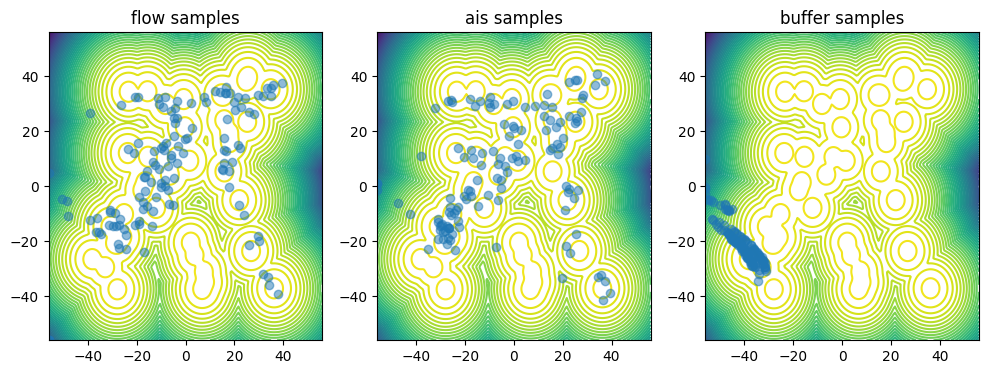

loss: 3.27015594774544e+32, ess base: 0.22864875197410583,ess ais: 0.008761388249695301:  78%|███████▊  | 3112/4000 [10:54<09:49,  1.51it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.8539350823441385e+34, ess base: 0.16684715449810028,ess ais: 0.009633589535951614:  78%|███████▊  | 3113/4000 [10:54<07:45,  1.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4131529140161468e+34, ess base: 0.1789252609014511,ess ais: 0.04460799694061279:  78%|███████▊  | 3114/4000 [10:54<06:17,  2.34it/s]  

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8194125951549585e+29, ess base: 0.1858004480600357,ess ais: 0.06822974234819412:  78%|███████▊  | 3116/4000 [10:54<04:33,  3.23it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.7799768682351514e+28, ess base: 0.047249287366867065,ess ais: 0.007936508394777775:  78%|███████▊  | 3117/4000 [10:55<04:02,  3.63it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.265969389275082e+32, ess base: 0.21660484373569489,ess ais: 0.008407513611018658:  78%|███████▊  | 3118/4000 [10:55<03:42,  3.97it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.265969389275082e+32, ess base: 0.2708764374256134,ess ais: 0.007936508394777775:  78%|███████▊  | 3119/4000 [10:55<03:27,  4.24it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8210147904674303e+34, ess base: 0.09723696857690811,ess ais: 0.01615193672478199:  78%|███████▊  | 3120/4000 [10:55<03:17,  4.45it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.41227447176427e+34, ess base: 0.24471265077590942,ess ais: 0.008064515888690948:  78%|███████▊  | 3121/4000 [10:56<03:10,  4.61it/s] 

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.603508795199116e+30, ess base: 0.20498168468475342,ess ais: 0.048468247056007385:  78%|███████▊  | 3123/4000 [10:56<03:02,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.412892451431881e+34, ess base: 0.27873143553733826,ess ais: 0.007874015718698502:  78%|███████▊  | 3124/4000 [10:56<03:03,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.6033102291332445e+30, ess base: 0.2793842554092407,ess ais: 0.11242301017045975:  78%|███████▊  | 3125/4000 [10:56<02:59,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4122524364315706e+34, ess base: 0.1850252002477646,ess ais: 0.0484561063349247:  78%|███████▊  | 3126/4000 [10:56<02:55,  4.97it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.612023561978117e+30, ess base: 0.2612004578113556,ess ais: 0.08045907318592072:  78%|███████▊  | 3128/4000 [10:57<02:51,  5.07it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.525917342316151e+27, ess base: 0.22894246876239777,ess ais: 0.0863693356513977:  78%|███████▊  | 3129/4000 [10:57<02:51,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.329987910981676e+32, ess base: 0.18403713405132294,ess ais: 0.09485019743442535:  78%|███████▊  | 3130/4000 [10:57<02:50,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.265906718560593e+32, ess base: 0.1702432483434677,ess ais: 0.007874015718698502:  78%|███████▊  | 3131/4000 [10:57<02:50,  5.11it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.4180322127239437e+33, ess base: 0.22888238728046417,ess ais: 0.13619855046272278:  78%|███████▊  | 3133/4000 [10:58<02:49,  5.13it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3301306609424564e+32, ess base: 0.02341315895318985,ess ais: 0.007874015718698502:  78%|███████▊  | 3134/4000 [10:58<02:48,  5.14it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4118944241722092e+34, ess base: 0.209193155169487,ess ais: 0.0078125:  78%|███████▊  | 3135/4000 [10:58<02:47,  5.16it/s]             

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.94110240318406e+30, ess base: 0.2673332691192627,ess ais: 0.14081424474716187:  78%|███████▊  | 3136/4000 [10:58<02:47,  5.17it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8196328463277195e+29, ess base: 0.24579057097434998,ess ais: 0.1291211098432541:  78%|███████▊  | 3137/4000 [10:59<02:46,  5.18it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.411895166936233e+34, ess base: 0.20062850415706635,ess ais: 0.07444053888320923:  78%|███████▊  | 3139/4000 [10:59<02:47,  5.15it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4118944241722092e+34, ess base: 0.2585817873477936,ess ais: 0.0078125:  78%|███████▊  | 3140/4000 [10:59<02:47,  5.14it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2721486443524274e+32, ess base: 0.20637859404087067,ess ais: 0.0078125:  79%|███████▊  | 3141/4000 [10:59<02:47,  5.13it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4449325679406575e+34, ess base: 0.21949511766433716,ess ais: 0.007936508394777775:  79%|███████▊  | 3142/4000 [11:00<02:46,  5.15it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.55599489724785e+29, ess base: 0.2734624445438385,ess ais: 0.11311978101730347:  79%|███████▊  | 3144/4000 [11:00<02:45,  5.17it/s]    

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.094985569772227e+33, ess base: 0.2419794648885727,ess ais: 0.007874015718698502:  79%|███████▊  | 3145/4000 [11:00<02:47,  5.10it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.424198701544634e+33, ess base: 0.1540818065404892,ess ais: 0.030715955421328545:  79%|███████▊  | 3146/4000 [11:00<02:46,  5.13it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8393207699841217e+29, ess base: 0.26271137595176697,ess ais: 0.0078125:  79%|███████▊  | 3147/4000 [11:01<02:45,  5.17it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.1973525422278674e+27, ess base: 0.30806052684783936,ess ais: 0.00800000037997961:  79%|███████▊  | 3148/4000 [11:01<02:44,  5.18it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8219165059920458e+34, ess base: 0.1690964698791504,ess ais: 0.007936508394777775:  79%|███████▊  | 3149/4000 [11:01<02:47,  5.09it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.444554253464652e+34, ess base: 0.2110452800989151,ess ais: 0.016050243750214577:  79%|███████▉  | 3150/4000 [11:01<02:49,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.294041613947189e+32, ess base: 0.23841822147369385,ess ais: 0.10658479481935501:  79%|███████▉  | 3151/4000 [11:01<02:51,  4.95it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.303658860627388e+32, ess base: 0.24496150016784668,ess ais: 0.007874015718698502:  79%|███████▉  | 3152/4000 [11:02<02:53,  4.90it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.68526306840333e+30, ess base: 0.27902036905288696,ess ais: 0.12328591197729111:  79%|███████▉  | 3153/4000 [11:02<02:54,  4.85it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.973271465896823e+29, ess base: 0.2156633883714676,ess ais: 0.08709549158811569:  79%|███████▉  | 3154/4000 [11:02<02:59,  4.72it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.829070839275588e+30, ess base: 0.20331813395023346,ess ais: 0.06860803067684174:  79%|███████▉  | 3155/4000 [11:02<02:57,  4.75it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4122489701994606e+34, ess base: 0.15738117694854736,ess ais: 0.03372969105839729:  79%|███████▉  | 3156/4000 [11:02<02:56,  4.79it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.87025471070949e+30, ess base: 0.2207702100276947,ess ais: 0.041466955095529556:  79%|███████▉  | 3157/4000 [11:03<02:54,  4.83it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4119355237815135e+34, ess base: 0.1801954060792923,ess ais: 0.06696174293756485:  79%|███████▉  | 3158/4000 [11:03<02:55,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.1781318495112804e+29, ess base: 0.15749555826187134,ess ais: 0.0078125:  79%|███████▉  | 3159/4000 [11:03<02:54,  4.82it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.329965473318464e+32, ess base: 0.21078048646450043,ess ais: 0.09541237354278564:  79%|███████▉  | 3160/4000 [11:03<02:53,  4.85it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3033558831463087e+24, ess base: 0.19783101975917816,ess ais: 0.007879363372921944:  79%|███████▉  | 3162/4000 [11:04<02:50,  4.91it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4125091851957184e+34, ess base: 0.2600811719894409,ess ais: 0.1517891138792038:  79%|███████▉  | 3163/4000 [11:04<02:49,  4.94it/s]   

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.610053617355055e+30, ess base: 0.21935106813907623,ess ais: 0.0078125:  79%|███████▉  | 3164/4000 [11:04<02:47,  4.99it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.8214131595720723e+34, ess base: 0.29341885447502136,ess ais: 0.15802545845508575:  79%|███████▉  | 3165/4000 [11:04<02:51,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.412194500837732e+34, ess base: 0.30473652482032776,ess ais: 0.008016474545001984:  79%|███████▉  | 3166/4000 [11:04<02:51,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.219628560275407e+30, ess base: 0.21127469837665558,ess ais: 0.00834620464593172:  79%|███████▉  | 3167/4000 [11:05<02:50,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.0222727560931995e+28, ess base: 0.24851712584495544,ess ais: 0.0078125:  79%|███████▉  | 3168/4000 [11:05<02:50,  4.87it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.217432546524077e+30, ess base: 0.30269256234169006,ess ais: 0.007874015718698502:  79%|███████▉  | 3169/4000 [11:05<02:50,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.546182605690549e+30, ess base: 0.14808529615402222,ess ais: 0.02815370075404644:  79%|███████▉  | 3170/4000 [11:05<02:49,  4.89it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.4118944241722092e+34, ess base: 0.07518189400434494,ess ais: 0.007936508394777775:  79%|███████▉  | 3171/4000 [11:05<02:49,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3605530374078946e+32, ess base: 0.22702187299728394,ess ais: 0.06568046659231186:  79%|███████▉  | 3172/4000 [11:06<02:48,  4.91it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.180794910041819e+35, ess base: 0.2725445628166199,ess ais: 0.11963847279548645:  79%|███████▉  | 3173/4000 [11:06<02:49,  4.88it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.358078317898111e+32, ess base: 0.3073521852493286,ess ais: 0.16878147423267365:  79%|███████▉  | 3174/4000 [11:06<02:52,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.827703952378388e+30, ess base: 0.2703806757926941,ess ais: 0.0556686706840992:  79%|███████▉  | 3175/4000 [11:06<02:51,  4.82it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.545982226235948e+30, ess base: 0.32194074988365173,ess ais: 0.007874015718698502:  79%|███████▉  | 3176/4000 [11:06<02:48,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.303905288066458e+32, ess base: 0.205071821808815,ess ais: 0.007936508394777775:  79%|███████▉  | 3177/4000 [11:07<02:45,  4.96it/s]  

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.9396402289809015e+35, ess base: 0.061479244381189346,ess ais: 0.007936508394777775:  79%|███████▉  | 3178/4000 [11:07<02:46,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.177832829265585e+29, ess base: 0.1537444144487381,ess ais: 0.007874015718698502:  79%|███████▉  | 3179/4000 [11:07<02:46,  4.93it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.444910780195966e+34, ess base: 0.29782721400260925,ess ais: 0.008691627532243729:  80%|███████▉  | 3180/4000 [11:07<02:46,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8279061452217185e+30, ess base: 0.2244269847869873,ess ais: 0.018184712156653404:  80%|███████▉  | 3181/4000 [11:07<02:45,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3561834959254795e+32, ess base: 0.23568427562713623,ess ais: 0.01059735007584095:  80%|███████▉  | 3182/4000 [11:08<02:45,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3273971345932094e+32, ess base: 0.3166598975658417,ess ais: 0.0078125:  80%|███████▉  | 3183/4000 [11:08<02:45,  4.94it/s]           

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9689225063764865e+30, ess base: 0.15441672503948212,ess ais: 0.030258404091000557:  80%|███████▉  | 3185/4000 [11:08<02:42,  5.01it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.980488685010006e+35, ess base: 0.2327537089586258,ess ais: 0.007936508394777775:  80%|███████▉  | 3186/4000 [11:08<02:41,  5.04it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.091191902521837e+33, ess base: 0.22427605092525482,ess ais: 0.007874015718698502:  80%|███████▉  | 3187/4000 [11:09<02:40,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4118944241722092e+34, ess base: 0.1831291913986206,ess ais: 0.0078125:  80%|███████▉  | 3188/4000 [11:09<02:40,  5.05it/s]           

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.430596958672137e+28, ess base: 0.2500167489051819,ess ais: 0.1774003952741623:  80%|███████▉  | 3189/4000 [11:09<02:42,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.5525077055787726e+30, ess base: 0.23960262537002563,ess ais: 0.007936508394777775:  80%|███████▉  | 3190/4000 [11:09<02:42,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.9395792232957655e+35, ess base: 0.2694287896156311,ess ais: 0.007874015718698502:  80%|███████▉  | 3192/4000 [11:10<02:40,  5.02it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.0294168521585477e+30, ess base: 0.24081288278102875,ess ais: 0.008347021415829659:  80%|███████▉  | 3193/4000 [11:10<02:40,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4118944241722092e+34, ess base: 0.24200238287448883,ess ais: 0.13532544672489166:  80%|███████▉  | 3194/4000 [11:10<02:41,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.098014499563349e+33, ess base: 0.3192335069179535,ess ais: 0.007874015718698502:  80%|███████▉  | 3195/4000 [11:10<02:41,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8216280659628923e+34, ess base: 0.23899555206298828,ess ais: 0.007874015718698502:  80%|███████▉  | 3196/4000 [11:10<02:40,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.604557765021223e+29, ess base: 0.26583197712898254,ess ais: 0.007874015718698502:  80%|███████▉  | 3197/4000 [11:11<02:40,  5.00it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.942843027450541e+35, ess base: 0.2937704920768738,ess ais: 0.10025279968976974:  80%|███████▉  | 3198/4000 [11:11<02:43,  4.91it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.0918009690211656e+33, ess base: 0.26813745498657227,ess ais: 0.14615124464035034:  80%|████████  | 3200/4000 [11:11<02:43,  4.90it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.091185403336631e+33, ess base: 0.28545355796813965,ess ais: 0.007874015718698502:  80%|████████  | 3201/4000 [11:11<02:42,  4.93it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.3300258228953794e+32, ess base: 0.19804564118385315,ess ais: 0.007874015718698502:  80%|████████  | 3202/4000 [11:12<02:40,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4445549962286754e+34, ess base: 0.2471473217010498,ess ais: 0.007874015718698502:  80%|████████  | 3203/4000 [11:12<02:40,  4.97it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.939644982670652e+35, ess base: 0.2250123769044876,ess ais: 0.0078125:  80%|████████  | 3204/4000 [11:12<02:39,  4.98it/s]            

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.371376115057609e+32, ess base: 0.24445250630378723,ess ais: 0.12481582164764404:  80%|████████  | 3205/4000 [11:12<02:40,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.887135652365008e+30, ess base: 0.22499863803386688,ess ais: 0.0078125:  80%|████████  | 3207/4000 [11:13<02:37,  5.02it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.093788791239248e+33, ess base: 0.2625318169593811,ess ais: 0.007936508394777775:  80%|████████  | 3208/4000 [11:13<02:37,  5.01it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.221685753137869e+35, ess base: 0.2379646748304367,ess ais: 0.0861692875623703:  80%|████████  | 3209/4000 [11:13<02:39,  4.97it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.801260709721173e+30, ess base: 0.29385367035865784,ess ais: 0.015948353335261345:  80%|████████  | 3210/4000 [11:13<02:39,  4.96it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4449375197008146e+34, ess base: 0.2343718260526657,ess ais: 0.09305064380168915:  80%|████████  | 3211/4000 [11:13<02:39,  4.96it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8212742626996645e+34, ess base: 0.19173020124435425,ess ais: 0.00800000037997961:  80%|████████  | 3212/4000 [11:14<02:39,  4.94it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.939644982670652e+35, ess base: 0.17654316127300262,ess ais: 0.07731815427541733:  80%|████████  | 3213/4000 [11:14<02:38,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.1116711676254324e+29, ess base: 0.16201286017894745,ess ais: 0.02105381153523922:  80%|████████  | 3214/4000 [11:14<02:37,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.167975799448426e+30, ess base: 0.2369350641965866,ess ais: 0.007874015718698502:  80%|████████  | 3215/4000 [11:14<02:37,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.422628165332421e+30, ess base: 0.22923576831817627,ess ais: 0.10163755714893341:  80%|████████  | 3217/4000 [11:15<02:35,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.939669147260219e+35, ess base: 0.30490589141845703,ess ais: 0.0078125:  80%|████████  | 3218/4000 [11:15<02:37,  4.98it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.939615668250522e+35, ess base: 0.24756315350532532,ess ais: 0.12000218778848648:  80%|████████  | 3219/4000 [11:15<02:36,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4452665641632567e+34, ess base: 0.2244805097579956,ess ais: 0.04856867343187332:  80%|████████  | 3220/4000 [11:15<02:35,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.327399455730783e+32, ess base: 0.2549876868724823,ess ais: 0.1275143325328827:  81%|████████  | 3222/4000 [11:16<02:34,  5.05it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2523831061472487e+30, ess base: 0.24650868773460388,ess ais: 0.03294352814555168:  81%|████████  | 3223/4000 [11:16<02:33,  5.05it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.4449684682017967e+34, ess base: 0.24930989742279053,ess ais: 0.1423092782497406:  81%|████████  | 3224/4000 [11:16<02:34,  5.02it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.180827789729263e+35, ess base: 0.09909513592720032,ess ais: 0.013744956813752651:  81%|████████  | 3225/4000 [11:16<02:33,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.821654310291725e+34, ess base: 0.20941634476184845,ess ais: 0.10154981911182404:  81%|████████  | 3226/4000 [11:16<02:33,  5.05it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.412575538781824e+34, ess base: 0.20655877888202667,ess ais: 0.0078125:  81%|████████  | 3228/4000 [11:17<02:32,  5.06it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.853674124583857e+34, ess base: 0.20000183582305908,ess ais: 0.0078125:  81%|████████  | 3229/4000 [11:17<02:32,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.4119890027912106e+34, ess base: 0.24278871715068817,ess ais: 0.011668302118778229:  81%|████████  | 3230/4000 [11:17<02:32,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.1807687647481896e+35, ess base: 0.2894296944141388,ess ais: 0.14609642326831818:  81%|████████  | 3231/4000 [11:18<02:43,  4.70it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.098140459962346e+33, ess base: 0.2819339334964752,ess ais: 0.007874015718698502:  81%|████████  | 3232/4000 [11:18<02:47,  4.58it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.901914664536468e+29, ess base: 0.2285207062959671,ess ais: 0.10610902309417725:  81%|████████  | 3233/4000 [11:18<02:43,  4.68it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.619444205427435e+29, ess base: 0.18476857244968414,ess ais: 0.0078125:  81%|████████  | 3234/4000 [11:18<02:41,  4.75it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.592284689590098e+30, ess base: 0.15534615516662598,ess ais: 0.07521460950374603:  81%|████████  | 3235/4000 [11:18<02:38,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.5546852832113534e+30, ess base: 0.2716974914073944,ess ais: 0.13509345054626465:  81%|████████  | 3236/4000 [11:19<02:37,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.180766387903314e+35, ess base: 0.23483900725841522,ess ais: 0.0078125:  81%|████████  | 3237/4000 [11:19<02:35,  4.91it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3053153791424564e+32, ess base: 0.20618972182273865,ess ais: 0.036096420139074326:  81%|████████  | 3238/4000 [11:19<02:34,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.942845800436229e+35, ess base: 0.3132353127002716,ess ais: 0.007874015718698502:  81%|████████  | 3239/4000 [11:19<02:34,  4.93it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.444599066894074e+34, ess base: 0.2574946880340576,ess ais: 0.007874015718698502:  81%|████████  | 3240/4000 [11:19<02:33,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.9429115598111155e+35, ess base: 0.18031424283981323,ess ais: 0.06912633776664734:  81%|████████  | 3241/4000 [11:20<02:33,  4.94it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8210147904674303e+34, ess base: 0.1992746740579605,ess ais: 0.007874015718698502:  81%|████████  | 3242/4000 [11:20<02:35,  4.88it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.939680239202971e+35, ess base: 0.2746121883392334,ess ais: 0.007874015718698502:  81%|████████  | 3243/4000 [11:20<02:36,  4.85it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.9428810569685475e+35, ess base: 0.01951448991894722,ess ais: 0.008106933906674385:  81%|████████  | 3245/4000 [11:20<02:32,  4.95it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.0913868780780247e+33, ess base: 0.25513163208961487,ess ais: 0.008032333105802536:  81%|████████  | 3246/4000 [11:21<02:30,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.2216869415603066e+35, ess base: 0.17611435055732727,ess ais: 0.04048345237970352:  81%|████████  | 3247/4000 [11:21<02:29,  5.04it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.412310372025409e+34, ess base: 0.21707120537757874,ess ais: 0.007936508394777775:  81%|████████  | 3248/4000 [11:21<02:31,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.091921977660006e+33, ess base: 0.24144113063812256,ess ais: 0.12877553701400757:  81%|████████  | 3249/4000 [11:21<02:32,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2679191448369564e+32, ess base: 0.2969409227371216,ess ais: 0.0078125:  81%|████████▏ | 3250/4000 [11:21<02:31,  4.94it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.2704584693425406e+32, ess base: 0.26025667786598206,ess ais: 0.11319703608751297:  81%|████████▏ | 3251/4000 [11:22<02:31,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3064929696048266e+32, ess base: 0.22682364284992218,ess ais: 0.0078125:  81%|████████▏ | 3252/4000 [11:22<02:31,  4.94it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.939577242591703e+35, ess base: 0.14179931581020355,ess ais: 0.016733871772885323:  81%|████████▏ | 3253/4000 [11:22<02:31,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8571146997179726e+30, ess base: 0.24667713046073914,ess ais: 0.0078125:  81%|████████▏ | 3254/4000 [11:22<02:31,  4.92it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.953419392781476e+29, ess base: 0.24705035984516144,ess ais: 0.11734381318092346:  81%|████████▏ | 3255/4000 [11:22<02:31,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.094506486977024e+33, ess base: 0.21119393408298492,ess ais: 0.0427340604364872:  81%|████████▏ | 3256/4000 [11:23<02:31,  4.91it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.412511165899781e+34, ess base: 0.24106240272521973,ess ais: 0.0078125:  81%|████████▏ | 3257/4000 [11:23<02:33,  4.85it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.9396124991240215e+35, ess base: 0.2472866028547287,ess ais: 0.007874015718698502:  81%|████████▏ | 3258/4000 [11:23<02:32,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.2249444074620805e+35, ess base: 0.2428387850522995,ess ais: 0.08694349229335785:  81%|████████▏ | 3259/4000 [11:23<02:31,  4.89it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.999706927854807e+28, ess base: 0.18351304531097412,ess ais: 0.12579409778118134:  82%|████████▏ | 3260/4000 [11:23<02:31,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.8829357912412685e+29, ess base: 0.2662779986858368,ess ais: 0.14949637651443481:  82%|████████▏ | 3261/4000 [11:24<02:31,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.9322305808328053e+34, ess base: 0.24468675255775452,ess ais: 0.007936610840260983:  82%|████████▏ | 3262/4000 [11:24<02:30,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.364913294340015e+32, ess base: 0.2664549648761749,ess ais: 0.16454678773880005:  82%|████████▏ | 3263/4000 [11:24<02:28,  4.96it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3585379031376954e+32, ess base: 0.3092554807662964,ess ais: 0.06541263312101364:  82%|████████▏ | 3265/4000 [11:24<02:24,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8348174079692616e+30, ess base: 0.16797716915607452,ess ais: 0.06985380500555038:  82%|████████▏ | 3266/4000 [11:25<02:23,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.9429095791070526e+35, ess base: 0.21585048735141754,ess ais: 0.0078125:  82%|████████▏ | 3267/4000 [11:25<02:23,  5.12it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9035412140368945e+30, ess base: 0.2684354782104492,ess ais: 0.14220619201660156:  82%|████████▏ | 3268/4000 [11:25<02:24,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.0333343308140776e+29, ess base: 0.2826935648918152,ess ais: 0.0078125:  82%|████████▏ | 3269/4000 [11:25<02:25,  5.02it/s]          

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.092129642101596e+33, ess base: 0.25115543603897095,ess ais: 0.007918057963252068:  82%|████████▏ | 3270/4000 [11:25<02:26,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.942932555274182e+35, ess base: 0.25126439332962036,ess ais: 0.09103531390428543:  82%|████████▏ | 3271/4000 [11:26<02:29,  4.86it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4121749413851113e+34, ess base: 0.2685295343399048,ess ais: 0.009557636454701424:  82%|████████▏ | 3272/4000 [11:26<02:28,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.36558874537395e+32, ess base: 0.06877624988555908,ess ais: 0.007875324226915836:  82%|████████▏ | 3273/4000 [11:26<02:30,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.207330402371909e+33, ess base: 0.15637755393981934,ess ais: 0.007874015718698502:  82%|████████▏ | 3275/4000 [11:26<02:25,  4.97it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.854692701648181e+34, ess base: 0.23094448447227478,ess ais: 0.014443540945649147:  82%|████████▏ | 3276/4000 [11:27<02:24,  5.01it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.412537657816622e+34, ess base: 0.24624845385551453,ess ais: 0.0078125:  82%|████████▏ | 3277/4000 [11:27<02:23,  5.05it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.93957684645089e+35, ess base: 0.0223489198833704,ess ais: 0.008140881545841694:  82%|████████▏ | 3278/4000 [11:27<02:22,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.203360947635941e+33, ess base: 0.1745227426290512,ess ais: 0.007936508394777775:  82%|████████▏ | 3279/4000 [11:27<02:22,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.4182615411162213e+33, ess base: 0.27745741605758667,ess ais: 0.007936508394777775:  82%|████████▏ | 3281/4000 [11:28<02:20,  5.12it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.1840400955784036e+35, ess base: 0.23243620991706848,ess ais: 0.0078125:  82%|████████▏ | 3282/4000 [11:28<02:20,  5.13it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.445224226613913e+34, ess base: 0.23622670769691467,ess ais: 0.10652028769254684:  82%|████████▏ | 3283/4000 [11:28<02:20,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.180830166574138e+35, ess base: 0.21110863983631134,ess ais: 0.007936508394777775:  82%|████████▏ | 3284/4000 [11:28<02:20,  5.11it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.942935724400682e+35, ess base: 0.10134559124708176,ess ais: 0.0078125:  82%|████████▏ | 3286/4000 [11:29<02:19,  5.14it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.412269024828097e+34, ess base: 0.2670908570289612,ess ais: 0.007813118398189545:  82%|████████▏ | 3287/4000 [11:29<02:18,  5.15it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0871200192561632e+33, ess base: 0.23355866968631744,ess ais: 0.009720719419419765:  82%|████████▏ | 3288/4000 [11:29<02:17,  5.16it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8210400444442317e+34, ess base: 0.1986239105463028,ess ais: 0.054246965795755386:  82%|████████▏ | 3289/4000 [11:29<02:17,  5.16it/s] 

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4445552438166833e+34, ess base: 0.18496815860271454,ess ais: 0.028520623221993446:  82%|████████▏ | 3291/4000 [11:30<02:16,  5.18it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.298414604110329e+33, ess base: 0.2191735953092575,ess ais: 0.007874015718698502:  82%|████████▏ | 3292/4000 [11:30<02:16,  5.19it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2692936451368255e+32, ess base: 0.17567870020866394,ess ais: 0.0078125:  82%|████████▏ | 3293/4000 [11:30<02:16,  5.18it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.180898442747582e+33, ess base: 0.2133198082447052,ess ais: 0.027908725664019585:  82%|████████▏ | 3294/4000 [11:30<02:17,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.753996349619394e+30, ess base: 0.2187643200159073,ess ais: 0.009370586834847927:  82%|████████▏ | 3295/4000 [11:30<02:16,  5.15it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.9916483678409526e+35, ess base: 0.20098169147968292,ess ais: 0.007874015718698502:  82%|████████▏ | 3297/4000 [11:31<02:15,  5.18it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.1840373225927156e+35, ess base: 0.1543840765953064,ess ais: 0.02723258174955845:  82%|████████▏ | 3298/4000 [11:31<02:15,  5.18it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.939605368589395e+35, ess base: 0.25596076250076294,ess ais: 0.14655515551567078:  82%|████████▏ | 3299/4000 [11:31<02:18,  5.08it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.945104362882613e+35, ess base: 0.23283140361309052,ess ais: 0.10241386294364929:  82%|████████▎ | 3300/4000 [11:31<02:19,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1374968031418667e+34, ess base: 0.28137272596359253,ess ais: 0.0078125:  83%|████████▎ | 3301/4000 [11:32<02:20,  4.99it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0833068544501544e+33, ess base: 0.19026003777980804,ess ais: 0.03758584335446358:  83%|████████▎ | 3302/4000 [11:32<02:20,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.48919493045894e+29, ess base: 0.24462640285491943,ess ais: 0.007874015718698502:  83%|████████▎ | 3303/4000 [11:32<02:24,  4.82it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.94288303767261e+35, ess base: 0.049960024654865265,ess ais: 0.007936508394777775:  83%|████████▎ | 3304/4000 [11:32<02:24,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.0291060737830984e+34, ess base: 0.2653624415397644,ess ais: 0.00800000037997961:  83%|████████▎ | 3305/4000 [11:32<02:24,  4.81it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2429801416326836e+29, ess base: 0.281395822763443,ess ais: 0.1438700556755066:  83%|████████▎ | 3306/4000 [11:33<02:22,  4.85it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.939577242591703e+35, ess base: 0.20858357846736908,ess ais: 0.007874207571148872:  83%|████████▎ | 3307/4000 [11:33<02:20,  4.94it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.960383746490386e+35, ess base: 0.15489913523197174,ess ais: 0.03862921521067619:  83%|████████▎ | 3308/4000 [11:33<02:22,  4.87it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8210130573513753e+34, ess base: 0.2694495916366577,ess ais: 0.007874015718698502:  83%|████████▎ | 3309/4000 [11:33<02:22,  4.86it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.847162349813724e+27, ess base: 0.08689892292022705,ess ais: 0.03523996099829674:  83%|████████▎ | 3310/4000 [11:33<02:22,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4110301253852812e+33, ess base: 0.23394857347011566,ess ais: 0.0078125:  83%|████████▎ | 3311/4000 [11:34<02:22,  4.82it/s]         

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.174471058063613e+33, ess base: 0.2765447795391083,ess ais: 0.007874015718698502:  83%|████████▎ | 3312/4000 [11:34<02:22,  4.83it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9322370181210096e+34, ess base: 0.22113454341888428,ess ais: 0.00794257503002882:  83%|████████▎ | 3313/4000 [11:34<02:21,  4.85it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.960383746490386e+35, ess base: 0.22713588178157806,ess ais: 0.0078125:  83%|████████▎ | 3315/4000 [11:34<02:19,  4.92it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.283805839457772e+33, ess base: 0.26213645935058594,ess ais: 0.11718835681676865:  83%|████████▎ | 3316/4000 [11:35<02:18,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.980488685010006e+35, ess base: 0.22347305715084076,ess ais: 0.007874015718698502:  83%|████████▎ | 3317/4000 [11:35<02:19,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.764314206530544e+35, ess base: 0.23403318226337433,ess ais: 0.10023678839206696:  83%|████████▎ | 3318/4000 [11:35<02:18,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.52677150035374e+27, ess base: 0.16922549903392792,ess ais: 0.023018134757876396:  83%|████████▎ | 3319/4000 [11:35<02:18,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0806759223816632e+33, ess base: 0.21166764199733734,ess ais: 0.007889514788985252:  83%|████████▎ | 3320/4000 [11:35<02:17,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.826030172143468e+35, ess base: 0.2104477733373642,ess ais: 0.08758694678544998:  83%|████████▎ | 3321/4000 [11:36<02:17,  4.93it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.744800514695675e+35, ess base: 0.23675787448883057,ess ais: 0.007812617346644402:  83%|████████▎ | 3322/4000 [11:36<02:18,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.268856497560453e+32, ess base: 0.22961978614330292,ess ais: 0.03908495232462883:  83%|████████▎ | 3323/4000 [11:36<02:30,  4.51it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.0295736598956145e+35, ess base: 0.2590557336807251,ess ais: 0.007874015718698502:  83%|████████▎ | 3324/4000 [11:36<02:34,  4.38it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.411896404876272e+34, ess base: 0.2450101673603058,ess ais: 0.007936508394777775:  83%|████████▎ | 3325/4000 [11:37<02:31,  4.46it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.1017097134424145e+35, ess base: 0.0898582860827446,ess ais: 0.014630310237407684:  83%|████████▎ | 3326/4000 [11:37<02:32,  4.42it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.724721721469685e+35, ess base: 0.2737307846546173,ess ais: 0.0078125:  83%|████████▎ | 3327/4000 [11:37<02:33,  4.39it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.6474145631158803e+30, ess base: 0.18010346591472626,ess ais: 0.007936508394777775:  83%|████████▎ | 3328/4000 [11:37<02:32,  4.39it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.417810311971902e+33, ess base: 0.23524917662143707,ess ais: 0.007874015718698502:  83%|████████▎ | 3329/4000 [11:37<02:28,  4.51it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.032519800037186e+35, ess base: 0.008424211293458939,ess ais: 0.007936508394777775:  83%|████████▎ | 3330/4000 [11:38<02:33,  4.37it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.613271201513183e+33, ess base: 0.24543370306491852,ess ais: 0.00800000037997961:  83%|████████▎ | 3331/4000 [11:38<02:33,  4.36it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.532595433874025e+33, ess base: 0.018496576696634293,ess ais: 0.008103695698082447:  83%|████████▎ | 3332/4000 [11:38<02:27,  4.53it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.960383746490386e+35, ess base: 0.24215637147426605,ess ais: 0.12635470926761627:  83%|████████▎ | 3333/4000 [11:38<02:24,  4.62it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.029105083431067e+34, ess base: 0.12414313107728958,ess ais: 0.007874015718698502:  83%|████████▎ | 3334/4000 [11:39<02:22,  4.68it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1375193336505817e+34, ess base: 0.07737540453672409,ess ais: 0.01686987839639187:  83%|████████▎ | 3335/4000 [11:39<02:21,  4.72it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.93960299174452e+35, ess base: 0.12374860048294067,ess ais: 0.00800000037997961:  83%|████████▎ | 3336/4000 [11:39<02:20,  4.72it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0149659650577836e+29, ess base: 0.24913214147090912,ess ais: 0.13927845656871796:  83%|████████▎ | 3337/4000 [11:39<02:19,  4.76it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8163425485720366e+35, ess base: 0.29073965549468994,ess ais: 0.009373141452670097:  83%|████████▎ | 3338/4000 [11:39<02:17,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.078338990063957e+35, ess base: 0.2098679095506668,ess ais: 0.007946441881358624:  83%|████████▎ | 3339/4000 [11:40<02:17,  4.79it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.29193982387424e+32, ess base: 0.11877547949552536,ess ais: 0.027973035350441933:  84%|████████▎ | 3340/4000 [11:40<02:18,  4.77it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.032545945330816e+35, ess base: 0.2143477499485016,ess ais: 0.0483144149184227:  84%|████████▎ | 3341/4000 [11:40<02:16,  4.81it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.4337308949173627e+28, ess base: 0.2556413412094116,ess ais: 0.11326871812343597:  84%|████████▎ | 3342/4000 [11:40<02:17,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.764313414248919e+35, ess base: 0.2240930050611496,ess ais: 0.007874015718698502:  84%|████████▎ | 3343/4000 [11:40<02:16,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.080970552111013e+33, ess base: 0.25889891386032104,ess ais: 0.13189467787742615:  84%|████████▎ | 3344/4000 [11:41<02:16,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.265928769367543e+32, ess base: 0.27238693833351135,ess ais: 0.1450413465499878:  84%|████████▎ | 3345/4000 [11:41<02:15,  4.83it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.816368693865666e+35, ess base: 0.27127575874328613,ess ais: 0.007874015718698502:  84%|████████▎ | 3346/4000 [11:41<02:16,  4.79it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.748094821693018e+35, ess base: 0.2228073924779892,ess ais: 0.00868421420454979:  84%|████████▎ | 3347/4000 [11:41<02:15,  4.81it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.9322283525407346e+34, ess base: 0.25359874963760376,ess ais: 0.020861629396677017:  84%|████████▎ | 3348/4000 [11:41<02:15,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.0124148615175664e+35, ess base: 0.03460978344082832,ess ais: 0.007936508394777775:  84%|████████▎ | 3349/4000 [11:42<02:15,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.76431658337542e+35, ess base: 0.28541049361228943,ess ais: 0.16125944256782532:  84%|████████▍ | 3350/4000 [11:42<02:15,  4.80it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.4121952436017556e+34, ess base: 0.20835988223552704,ess ais: 0.008064515888690948:  84%|████████▍ | 3351/4000 [11:42<02:14,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.2328002759161824e+35, ess base: 0.24371959269046783,ess ais: 0.14401356875896454:  84%|████████▍ | 3352/4000 [11:42<02:13,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.411915469152877e+34, ess base: 0.13976477086544037,ess ais: 0.016033688560128212:  84%|████████▍ | 3353/4000 [11:42<02:13,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.265926448229969e+32, ess base: 0.23127949237823486,ess ais: 0.00800000037997961:  84%|████████▍ | 3354/4000 [11:43<02:13,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.816346509980162e+35, ess base: 0.18094679713249207,ess ais: 0.06954729557037354:  84%|████████▍ | 3355/4000 [11:43<02:19,  4.61it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.8984712813808856e+30, ess base: 0.24665141105651855,ess ais: 0.08715373277664185:  84%|████████▍ | 3356/4000 [11:43<02:27,  4.36it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.619991649600066e+34, ess base: 0.26490166783332825,ess ais: 0.09885594248771667:  84%|████████▍ | 3357/4000 [11:43<02:23,  4.49it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0833090208452232e+33, ess base: 0.16406436264514923,ess ais: 0.00781856756657362:  84%|████████▍ | 3358/4000 [11:44<02:20,  4.58it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.80848905696281e+35, ess base: 0.21827265620231628,ess ais: 0.008295250125229359:  84%|████████▍ | 3359/4000 [11:44<02:17,  4.66it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.015106124894995e+29, ess base: 0.010212328284978867,ess ais: 0.007874015718698502:  84%|████████▍ | 3360/4000 [11:44<02:15,  4.71it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.619991402012058e+34, ess base: 0.020470496267080307,ess ais: 0.008159122429788113:  84%|████████▍ | 3361/4000 [11:44<02:15,  4.70it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.038021567316092e+35, ess base: 0.1354522407054901,ess ais: 0.007874015718698502:  84%|████████▍ | 3362/4000 [11:44<02:14,  4.74it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.4182788722767713e+33, ess base: 0.06540454924106598,ess ais: 0.00781279243528843:  84%|████████▍ | 3363/4000 [11:45<02:12,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.20358687169311e+33, ess base: 0.2911938428878784,ess ais: 0.14123140275478363:  84%|████████▍ | 3364/4000 [11:45<02:10,  4.89it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.268037135996951e+32, ess base: 0.23643916845321655,ess ais: 0.007874015718698502:  84%|████████▍ | 3365/4000 [11:45<02:10,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4119256202611992e+34, ess base: 0.18449600040912628,ess ais: 0.052777014672756195:  84%|████████▍ | 3366/4000 [11:45<02:07,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.942870361166608e+35, ess base: 0.21900305151939392,ess ais: 0.007874015718698502:  84%|████████▍ | 3368/4000 [11:46<02:04,  5.09it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.945080594433859e+35, ess base: 0.19519388675689697,ess ais: 0.007874015718698502:  84%|████████▍ | 3369/4000 [11:46<02:03,  5.12it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.341325197975209e+34, ess base: 0.21811743080615997,ess ais: 0.007874015718698502:  84%|████████▍ | 3370/4000 [11:46<02:07,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.785123087274103e+35, ess base: 0.25921162962913513,ess ais: 0.12699668109416962:  84%|████████▍ | 3371/4000 [11:46<02:05,  5.03it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.205923483517261e+33, ess base: 0.2760612368583679,ess ais: 0.00800000037997961:  84%|████████▍ | 3372/4000 [11:46<02:03,  5.08it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.0973775794131364e+33, ess base: 0.20185308158397675,ess ais: 0.007874015718698502:  84%|████████▍ | 3373/4000 [11:47<02:02,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.805225252808035e+35, ess base: 0.322195827960968,ess ais: 0.007874015718698502:  84%|████████▍ | 3375/4000 [11:47<02:01,  5.13it/s]   

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.19705682763871e+29, ess base: 0.2678552269935608,ess ais: 0.010148979723453522:  84%|████████▍ | 3376/4000 [11:47<02:05,  4.96it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.175164923455632e+33, ess base: 0.20257192850112915,ess ais: 0.007874015718698502:  84%|████████▍ | 3377/4000 [11:47<02:05,  4.95it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.206399471462367e+33, ess base: 0.24650634825229645,ess ais: 0.0078125:  84%|████████▍ | 3378/4000 [11:48<02:05,  4.94it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.826030172143468e+35, ess base: 0.20298676192760468,ess ais: 0.052447471767663956:  84%|████████▍ | 3379/4000 [11:48<02:05,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.291937889592929e+32, ess base: 0.2595270574092865,ess ais: 0.0078125:  84%|████████▍ | 3380/4000 [11:48<02:05,  4.93it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.805223272103972e+35, ess base: 0.13354651629924774,ess ais: 0.007874015718698502:  85%|████████▍ | 3381/4000 [11:48<02:05,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.805282297085045e+35, ess base: 0.2562035024166107,ess ais: 0.019288664683699608:  85%|████████▍ | 3382/4000 [11:48<02:05,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.796857378875672e+35, ess base: 0.05609847232699394,ess ais: 0.0083458935841918:  85%|████████▍ | 3383/4000 [11:49<02:04,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4445856971416497e+34, ess base: 0.1517002284526825,ess ais: 0.007936508394777775:  85%|████████▍ | 3384/4000 [11:49<02:04,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.983787349556287e+35, ess base: 0.2320748269557953,ess ais: 0.03640790656208992:  85%|████████▍ | 3385/4000 [11:49<02:04,  4.95it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.05755823531809e+35, ess base: 0.22611960768699646,ess ais: 0.008129970170557499:  85%|████████▍ | 3386/4000 [11:49<02:03,  4.97it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.236066456915833e+35, ess base: 0.2781383693218231,ess ais: 0.007874015718698502:  85%|████████▍ | 3387/4000 [11:49<02:04,  4.92it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.4180708983501713e+33, ess base: 0.21306897699832916,ess ais: 0.11376745253801346:  85%|████████▍ | 3388/4000 [11:50<02:04,  4.90it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8371755939051624e+35, ess base: 0.23580162227153778,ess ais: 0.00800000037997961:  85%|████████▍ | 3389/4000 [11:50<02:04,  4.91it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.501946431505872e+33, ess base: 0.2014869600534439,ess ais: 0.007874015718698502:  85%|████████▍ | 3390/4000 [11:50<02:04,  4.90it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.091371094342524e+33, ess base: 0.018988054245710373,ess ais: 0.008145772852003574:  85%|████████▍ | 3391/4000 [11:50<02:04,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.93957684645089e+35, ess base: 0.266684353351593,ess ais: 0.02829059585928917:  85%|████████▍ | 3392/4000 [11:50<02:03,  4.92it/s]     

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.932205079267996e+34, ess base: 0.2231326848268509,ess ais: 0.007874015718698502:  85%|████████▍ | 3393/4000 [11:51<02:03,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.283603968735916e+28, ess base: 0.2414914220571518,ess ais: 0.12350054085254669:  85%|████████▍ | 3394/4000 [11:51<02:03,  4.91it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8422570469030265e+24, ess base: 0.23342053592205048,ess ais: 0.007936508394777775:  85%|████████▍ | 3395/4000 [11:51<02:03,  4.91it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.286386325469663e+33, ess base: 0.04127589613199234,ess ais: 0.007874015718698502:  85%|████████▍ | 3396/4000 [11:51<02:03,  4.90it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6423610256359332e+28, ess base: 0.2755905091762543,ess ais: 0.16975994408130646:  85%|████████▍ | 3397/4000 [11:51<02:03,  4.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.932225876660656e+34, ess base: 0.22940102219581604,ess ais: 0.0078125:  85%|████████▍ | 3398/4000 [11:52<02:03,  4.89it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2037779098044091e+25, ess base: 0.23117046058177948,ess ais: 0.03166818991303444:  85%|████████▍ | 3399/4000 [11:52<02:03,  4.88it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.080692015602174e+33, ess base: 0.21929126977920532,ess ais: 0.007936508394777775:  85%|████████▌ | 3400/4000 [11:52<02:02,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.420379037553419e+33, ess base: 0.054011013358831406,ess ais: 0.0078125:  85%|████████▌ | 3401/4000 [11:52<02:03,  4.87it/s]          

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.20311893035826e+33, ess base: 0.1999918818473816,ess ais: 0.007874015718698502:  85%|████████▌ | 3402/4000 [11:53<02:04,  4.82it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.785120710429228e+35, ess base: 0.2787149250507355,ess ais: 0.007874015718698502:  85%|████████▌ | 3403/4000 [11:53<02:06,  4.74it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.411933047901435e+34, ess base: 0.17180700600147247,ess ais: 0.02296624332666397:  85%|████████▌ | 3404/4000 [11:53<02:04,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step


loss: 4.0946804175525434e+33, ess base: 0.19672800600528717,ess ais: 0.017010316252708435:  85%|████████▌ | 3405/4000 [11:53<02:02,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.049678598415234e+35, ess base: 0.22415456175804138,ess ais: 0.007874015718698502:  85%|████████▌ | 3406/4000 [11:53<02:00,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.980490665714069e+35, ess base: 0.25708478689193726,ess ais: 0.007812555879354477:  85%|████████▌ | 3407/4000 [11:54<02:00,  4.93it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.7899767020942193e+30, ess base: 0.23018932342529297,ess ais: 0.12965990602970123:  85%|████████▌ | 3408/4000 [11:54<02:00,  4.93it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.078338990063957e+35, ess base: 0.24624475836753845,ess ais: 0.10666002333164215:  85%|████████▌ | 3409/4000 [11:54<01:59,  4.94it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.619615011662387e+30, ess base: 0.22506241500377655,ess ais: 0.07291720062494278:  85%|████████▌ | 3410/4000 [11:54<01:58,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step


loss: 6.177762740628072e+33, ess base: 0.2362447828054428,ess ais: 0.1130201667547226:  85%|████████▌ | 3411/4000 [11:54<01:56,  5.05it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.291757291187051e+29, ess base: 0.22353054583072662,ess ais: 0.0078125:  85%|████████▌ | 3412/4000 [11:55<01:56,  5.06it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.203112121688044e+33, ess base: 0.26186278462409973,ess ais: 0.1441119760274887:  85%|████████▌ | 3413/4000 [11:55<01:57,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.412522059772127e+34, ess base: 0.26226067543029785,ess ais: 0.0078125:  85%|████████▌ | 3414/4000 [11:55<01:58,  4.96it/s]         

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.963649531349224e+35, ess base: 0.18938802182674408,ess ais: 0.07056917995214462:  85%|████████▌ | 3415/4000 [11:55<01:58,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.707179814007402e+35, ess base: 0.2547453045845032,ess ais: 0.00800000037997961:  85%|████████▌ | 3416/4000 [11:55<01:58,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.942870757307421e+35, ess base: 0.19509351253509521,ess ais: 0.00800000037997961:  85%|████████▌ | 3417/4000 [11:56<01:58,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2937917048017586e+32, ess base: 0.2574673593044281,ess ais: 0.1373579353094101:  85%|████████▌ | 3418/4000 [11:56<01:58,  4.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.505256839919135e+30, ess base: 0.2346830815076828,ess ais: 0.007874015718698502:  85%|████████▌ | 3419/4000 [11:56<02:02,  4.74it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.20329224196376e+33, ess base: 0.08732762932777405,ess ais: 0.007874015718698502:  86%|████████▌ | 3420/4000 [11:56<02:01,  4.79it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4122437708512956e+34, ess base: 0.08667340129613876,ess ais: 0.007874015718698502:  86%|████████▌ | 3421/4000 [11:56<01:59,  4.85it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.0325249498677496e+35, ess base: 0.26819464564323425,ess ais: 0.16245980560779572:  86%|████████▌ | 3422/4000 [11:57<01:58,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.649902762968238e+28, ess base: 0.2162363976240158,ess ais: 0.0078125:  86%|████████▌ | 3423/4000 [11:57<01:58,  4.86it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0801926131817943e+29, ess base: 0.16079647839069366,ess ais: 0.053936004638671875:  86%|████████▌ | 3424/4000 [11:57<01:58,  4.87it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.029603370456557e+35, ess base: 0.22385179996490479,ess ais: 0.00800000037997961:  86%|████████▌ | 3425/4000 [11:57<01:57,  4.87it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.008792905149748e+35, ess base: 0.2504468262195587,ess ais: 0.07817497849464417:  86%|████████▌ | 3426/4000 [11:57<01:57,  4.88it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8163425485720366e+35, ess base: 0.24494045972824097,ess ais: 0.0078125:  86%|████████▌ | 3427/4000 [11:58<02:01,  4.71it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0806759223816632e+33, ess base: 0.22835616767406464,ess ais: 0.0078125:  86%|████████▌ | 3428/4000 [11:58<02:01,  4.71it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.049706724412927e+35, ess base: 0.2695312798023224,ess ais: 0.0078125:  86%|████████▌ | 3429/4000 [11:58<02:00,  4.75it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.094095181398971e+33, ess base: 0.26247620582580566,ess ais: 0.02334587834775448:  86%|████████▌ | 3430/4000 [11:58<01:59,  4.77it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.284099231247083e+33, ess base: 0.1787451058626175,ess ais: 0.0480620302259922:  86%|████████▌ | 3431/4000 [11:58<01:58,  4.80it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.727989090891773e+35, ess base: 0.22863474488258362,ess ais: 0.12359032034873962:  86%|████████▌ | 3432/4000 [11:59<01:58,  4.80it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.767577614544507e+35, ess base: 0.2662065029144287,ess ais: 0.019861264154314995:  86%|████████▌ | 3433/4000 [11:59<01:57,  4.81it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.412223963810667e+34, ess base: 0.16292186081409454,ess ais: 0.024974990636110306:  86%|████████▌ | 3434/4000 [11:59<01:57,  4.82it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.094717865238732e+33, ess base: 0.22742047905921936,ess ais: 0.007874015718698502:  86%|████████▌ | 3435/4000 [11:59<01:57,  4.82it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.091191902521837e+33, ess base: 0.17244476079940796,ess ais: 0.03453975170850754:  86%|████████▌ | 3436/4000 [12:00<01:57,  4.82it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3094860410918553e+35, ess base: 0.33791059255599976,ess ais: 0.17492657899856567:  86%|████████▌ | 3437/4000 [12:00<01:56,  4.82it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.3017737100613134e+32, ess base: 0.21904660761356354,ess ais: 0.08168017864227295:  86%|████████▌ | 3438/4000 [12:00<01:56,  4.81it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.014894751771222e+29, ess base: 0.22836202383041382,ess ais: 0.10557632148265839:  86%|████████▌ | 3439/4000 [12:00<01:56,  4.82it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.764314602671357e+35, ess base: 0.23729519546031952,ess ais: 0.11413045972585678:  86%|████████▌ | 3440/4000 [12:00<01:57,  4.76it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.805228025793723e+35, ess base: 0.2742742598056793,ess ais: 0.007874015718698502:  86%|████████▌ | 3441/4000 [12:01<01:56,  4.79it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5507151966255365e+35, ess base: 0.2803511321544647,ess ais: 0.007812710478901863:  86%|████████▌ | 3442/4000 [12:01<01:55,  4.82it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.2629580798364246e+35, ess base: 0.21078816056251526,ess ais: 0.007936508394777775:  86%|████████▌ | 3443/4000 [12:01<01:58,  4.69it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.767579199107757e+35, ess base: 0.21497933566570282,ess ais: 0.007874015718698502:  86%|████████▌ | 3444/4000 [12:01<01:57,  4.73it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.8163873338492366e+30, ess base: 0.25603973865509033,ess ais: 0.007874015718698502:  86%|████████▌ | 3445/4000 [12:01<01:56,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0842905525538716e+33, ess base: 0.22536121308803558,ess ais: 0.13407285511493683:  86%|████████▌ | 3446/4000 [12:02<01:55,  4.80it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5428502169327454e+35, ess base: 0.26978054642677307,ess ais: 0.058148372918367386:  86%|████████▌ | 3447/4000 [12:02<01:56,  4.76it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.767580387530195e+35, ess base: 0.22235628962516785,ess ais: 0.007874015718698502:  86%|████████▌ | 3448/4000 [12:02<01:55,  4.77it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.265970549843869e+32, ess base: 0.09012056887149811,ess ais: 0.007944292388856411:  86%|████████▌ | 3449/4000 [12:02<01:56,  4.73it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.407266168695834e+33, ess base: 0.1289026290178299,ess ais: 0.0078125:  86%|████████▋ | 3450/4000 [12:02<01:56,  4.72it/s]            

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.444578021913406e+34, ess base: 0.22925609350204468,ess ais: 0.007936508394777775:  86%|████████▋ | 3451/4000 [12:03<01:54,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.980490665714069e+35, ess base: 0.22674670815467834,ess ais: 0.034698486328125:  86%|████████▋ | 3452/4000 [12:03<01:52,  4.85it/s]   

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.262956099132362e+35, ess base: 0.2873547077178955,ess ais: 0.007874015718698502:  86%|████████▋ | 3453/4000 [12:03<01:51,  4.89it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.273709737630423e+35, ess base: 0.23108550906181335,ess ais: 0.08117589354515076:  86%|████████▋ | 3454/4000 [12:03<01:52,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.904270105700792e+29, ess base: 0.02516920119524002,ess ais: 0.007874015718698502:  86%|████████▋ | 3455/4000 [12:03<01:51,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.3038699183955404e+35, ess base: 0.09817216545343399,ess ais: 0.007874015718698502:  86%|████████▋ | 3456/4000 [12:04<01:51,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8371514293155955e+35, ess base: 0.27544015645980835,ess ais: 0.0078125:  86%|████████▋ | 3457/4000 [12:04<01:49,  4.95it/s]           

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.0012959811903146e+35, ess base: 0.19416862726211548,ess ais: 0.007874015718698502:  86%|████████▋ | 3458/4000 [12:04<01:48,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.0575340707285235e+35, ess base: 0.21692681312561035,ess ais: 0.007874015718698502:  86%|████████▋ | 3459/4000 [12:04<01:47,  5.05it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9325175353339116e+34, ess base: 0.25798025727272034,ess ais: 0.13899356126785278:  86%|████████▋ | 3460/4000 [12:04<01:46,  5.09it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.707192490513404e+35, ess base: 0.2635238766670227,ess ais: 0.007874015718698502:  87%|████████▋ | 3461/4000 [12:05<01:45,  5.10it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.764311433544856e+35, ess base: 0.21003249287605286,ess ais: 0.007936508394777775:  87%|████████▋ | 3462/4000 [12:05<01:45,  5.10it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6453561865776933e+28, ess base: 0.29430556297302246,ess ais: 0.008110239170491695:  87%|████████▋ | 3463/4000 [12:05<01:44,  5.12it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2574880038225247e+35, ess base: 0.22342650592327118,ess ais: 0.0078125:  87%|████████▋ | 3464/4000 [12:05<01:45,  5.10it/s]           

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.529943147339856e+33, ess base: 0.057939957827329636,ess ais: 0.01025591790676117:  87%|████████▋ | 3465/4000 [12:05<01:44,  5.11it/s]

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.93960299174452e+35, ess base: 0.2504940927028656,ess ais: 0.008064515888690948:  87%|████████▋ | 3466/4000 [12:06<01:44,  5.09it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.294482287575539e+33, ess base: 0.24586784839630127,ess ais: 0.007936508394777775:  87%|████████▋ | 3467/4000 [12:06<01:44,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.788418978834697e+35, ess base: 0.21143688261508942,ess ais: 0.007936508394777775:  87%|████████▋ | 3468/4000 [12:06<01:47,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 5.045874895251403e+35, ess base: 0.2308129519224167,ess ais: 0.007874015718698502:  87%|████████▋ | 3469/4000 [12:06<01:47,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.294610414369605e+33, ess base: 0.2706910967826843,ess ais: 0.01574612781405449:  87%|████████▋ | 3470/4000 [12:06<01:46,  4.98it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.021799437367381e+35, ess base: 0.17436620593070984,ess ais: 0.007874015718698502:  87%|████████▋ | 3471/4000 [12:07<01:46,  4.98it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3191777251066158e+35, ess base: 0.19489608705043793,ess ais: 0.007886202074587345:  87%|████████▋ | 3472/4000 [12:07<01:45,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.514734188188905e+27, ess base: 0.22295795381069183,ess ais: 0.12561585009098053:  87%|████████▋ | 3473/4000 [12:07<01:45,  5.00it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.755919395022927e+35, ess base: 0.24114826321601868,ess ais: 0.1525019407272339:  87%|████████▋ | 3473/4000 [12:07<01:45,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.755919395022927e+35, ess base: 0.24114826321601868,ess ais: 0.1525019407272339:  87%|████████▋ | 3474/4000 [12:07<01:45,  5.00it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.960383746490386e+35, ess base: 0.18040312826633453,ess ais: 0.007874015718698502:  87%|████████▋ | 3475/4000 [12:07<01:43,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.257457005803941e+35, ess base: 0.26088225841522217,ess ais: 0.15095363557338715:  87%|████████▋ | 3476/4000 [12:08<01:43,  5.05it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.298366863658994e+35, ess base: 0.24423335492610931,ess ais: 0.007874015718698502:  87%|████████▋ | 3477/4000 [12:08<01:44,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3094880217959181e+35, ess base: 0.2564537823200226,ess ais: 0.0078125:  87%|████████▋ | 3478/4000 [12:08<01:45,  4.95it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.294816531386146e+33, ess base: 0.18942642211914062,ess ais: 0.07420491427183151:  87%|████████▋ | 3479/4000 [12:08<01:45,  4.92it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0148868181955307e+29, ess base: 0.2743733525276184,ess ais: 0.13551771640777588:  87%|████████▋ | 3480/4000 [12:08<01:45,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.93957684645089e+35, ess base: 0.26671841740608215,ess ais: 0.03279154375195503:  87%|████████▋ | 3481/4000 [12:09<01:44,  4.99it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.805223272103972e+35, ess base: 0.24031119048595428,ess ais: 0.1263093650341034:  87%|████████▋ | 3482/4000 [12:09<01:43,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.080970552111013e+33, ess base: 0.22809863090515137,ess ais: 0.0078125:  87%|████████▋ | 3483/4000 [12:09<01:42,  5.03it/s]         

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2574599768600353e+35, ess base: 0.2985599637031555,ess ais: 0.007874015718698502:  87%|████████▋ | 3484/4000 [12:09<01:41,  5.07it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0811646650986282e+29, ess base: 0.1870964914560318,ess ais: 0.06165872514247894:  87%|████████▋ | 3485/4000 [12:09<01:40,  5.11it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2574587884375976e+35, ess base: 0.2822200059890747,ess ais: 0.08842118829488754:  87%|████████▋ | 3486/4000 [12:10<01:39,  5.14it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.203112121688044e+33, ess base: 0.2017924040555954,ess ais: 0.10063306242227554:  87%|████████▋ | 3487/4000 [12:10<01:39,  5.15it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2782635097026245e+35, ess base: 0.20413972437381744,ess ais: 0.10341458022594452:  87%|████████▋ | 3488/4000 [12:10<01:39,  5.17it/s]

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.968714571135513e+30, ess base: 0.2000168114900589,ess ais: 0.008064515888690948:  87%|████████▋ | 3489/4000 [12:10<01:39,  5.12it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3094860410918553e+35, ess base: 0.16047713160514832,ess ais: 0.0078125:  87%|████████▋ | 3490/4000 [12:10<01:38,  5.15it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.206398852492347e+33, ess base: 0.2757846415042877,ess ais: 0.0078125:  87%|████████▋ | 3491/4000 [12:11<01:38,  5.19it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.724697160739305e+35, ess base: 0.06937629729509354,ess ais: 0.010682758875191212:  87%|████████▋ | 3492/4000 [12:11<01:37,  5.19it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.287271452597752e+33, ess base: 0.2667391002178192,ess ais: 0.008080370724201202:  87%|████████▋ | 3493/4000 [12:11<01:39,  5.12it/s] 

nan grad norm in replay step
nan grad norm in replay step


loss: 1.2983686462926505e+35, ess base: 0.19164134562015533,ess ais: 0.04313353821635246:  87%|████████▋ | 3494/4000 [12:11<01:42,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.0217713113696885e+35, ess base: 0.2678963243961334,ess ais: 0.1384383589029312:  87%|████████▋ | 3495/4000 [12:11<01:41,  4.98it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.802624801297949e+29, ess base: 0.11794205754995346,ess ais: 0.007936508394777775:  87%|████████▋ | 3496/4000 [12:12<01:42,  4.92it/s]

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2984016250152971e+35, ess base: 0.2756335437297821,ess ais: 0.14046859741210938:  87%|████████▋ | 3497/4000 [12:12<01:43,  4.88it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.93957684645089e+35, ess base: 0.27427616715431213,ess ais: 0.020063593983650208:  87%|████████▋ | 3498/4000 [12:12<01:43,  4.84it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8371514293155955e+35, ess base: 0.26613643765449524,ess ais: 0.1726095974445343:  87%|████████▋ | 3499/4000 [12:12<01:43,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.217840455188718e+35, ess base: 0.28190740942955017,ess ais: 0.19387130439281464:  88%|████████▊ | 3500/4000 [12:12<01:43,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762496643689485e+36, ess base: 0.2519262135028839,ess ais: 0.0078125:  88%|████████▊ | 3501/4000 [12:13<01:43,  4.81it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.032519800037186e+35, ess base: 0.2539023756980896,ess ais: 0.12186302244663239:  88%|████████▊ | 3502/4000 [12:13<01:45,  4.74it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762503774224111e+36, ess base: 0.24483181536197662,ess ais: 0.019075440242886543:  88%|████████▊ | 3503/4000 [12:13<01:45,  4.71it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0808611491600412e+33, ess base: 0.24582131206989288,ess ais: 0.1407240331172943:  88%|████████▊ | 3504/4000 [12:13<01:44,  4.74it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0842630083879975e+33, ess base: 0.13275651633739471,ess ais: 0.007936508394777775:  88%|████████▊ | 3505/4000 [12:13<01:43,  4.76it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.284077567296395e+33, ess base: 0.2083381861448288,ess ais: 0.0078125:  88%|████████▊ | 3506/4000 [12:14<01:48,  4.53it/s]             

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.99160796147807e+35, ess base: 0.1815207451581955,ess ais: 0.0078125:  88%|████████▊ | 3507/4000 [12:14<01:51,  4.42it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.283782937567045e+33, ess base: 0.14743228256702423,ess ais: 0.007884393446147442:  88%|████████▊ | 3508/4000 [12:14<01:48,  4.52it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0806757676391583e+33, ess base: 0.1817009598016739,ess ais: 0.056713592261075974:  88%|████████▊ | 3509/4000 [12:14<01:46,  4.62it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.19462084003092e+27, ess base: 0.24090634286403656,ess ais: 0.097267746925354:  88%|████████▊ | 3510/4000 [12:15<01:44,  4.69it/s]    

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.764311433544856e+35, ess base: 0.17265771329402924,ess ais: 0.024995943531394005:  88%|████████▊ | 3511/4000 [12:15<01:43,  4.74it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.488510497234378e+30, ess base: 0.19654645025730133,ess ais: 0.007979783229529858:  88%|████████▊ | 3512/4000 [12:15<01:42,  4.76it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.755919395022927e+35, ess base: 0.20365123450756073,ess ais: 0.0078125:  88%|████████▊ | 3513/4000 [12:15<01:42,  4.76it/s]           

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.01488700709019e+29, ess base: 0.24487119913101196,ess ais: 0.00787412840873003:  88%|████████▊ | 3514/4000 [12:15<01:41,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.9604166261778296e+35, ess base: 0.2305435687303543,ess ais: 0.10230854153633118:  88%|████████▊ | 3515/4000 [12:16<01:40,  4.81it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762499812815985e+36, ess base: 0.18211574852466583,ess ais: 0.00800000037997961:  88%|████████▊ | 3516/4000 [12:16<01:39,  4.84it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6784297665620116e+36, ess base: 0.1944471001625061,ess ais: 0.007936508394777775:  88%|████████▊ | 3517/4000 [12:16<01:42,  4.72it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.6784297665620116e+36, ess base: 0.13360187411308289,ess ais: 0.08083003014326096:  88%|████████▊ | 3518/4000 [12:16<01:41,  4.77it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.9396097261383335e+35, ess base: 0.21911203861236572,ess ais: 0.0078125:  88%|████████▊ | 3519/4000 [12:16<01:40,  4.79it/s]          

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.703888676136559e+35, ess base: 0.2862641513347626,ess ais: 0.10741028189659119:  88%|████████▊ | 3520/4000 [12:17<01:39,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.203591823453267e+33, ess base: 0.17395839095115662,ess ais: 0.03871001675724983:  88%|████████▊ | 3521/4000 [12:17<01:39,  4.82it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.675410698201243e+36, ess base: 0.24335570633411407,ess ais: 0.007936508394777775:  88%|████████▊ | 3522/4000 [12:17<01:39,  4.81it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.960385727194449e+35, ess base: 0.162664994597435,ess ais: 0.024732092395424843:  88%|████████▊ | 3523/4000 [12:17<01:38,  4.83it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.764311433544856e+35, ess base: 0.18478845059871674,ess ais: 0.007874015718698502:  88%|████████▊ | 3524/4000 [12:17<01:38,  4.85it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.19703632813491e+35, ess base: 0.20160973072052002,ess ais: 0.007936508394777775:  88%|████████▊ | 3525/4000 [12:18<01:37,  4.86it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3094861401270584e+35, ess base: 0.02190248854458332,ess ais: 0.007874015718698502:  88%|████████▊ | 3526/4000 [12:18<01:37,  4.87it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.904278417065802e+29, ess base: 0.18620797991752625,ess ais: 0.007874015718698502:  88%|████████▊ | 3527/4000 [12:18<01:37,  4.87it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.837182328298976e+35, ess base: 0.13386154174804688,ess ais: 0.02978956699371338:  88%|████████▊ | 3528/4000 [12:18<01:36,  4.87it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.93957684645089e+35, ess base: 0.05721123144030571,ess ais: 0.048798903822898865:  88%|████████▊ | 3529/4000 [12:19<01:36,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8690182366850806e+29, ess base: 0.28810662031173706,ess ais: 0.0078125:  88%|████████▊ | 3530/4000 [12:19<01:35,  4.93it/s]         

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2782646981250623e+35, ess base: 0.22333894670009613,ess ais: 0.08828068524599075:  88%|████████▊ | 3531/4000 [12:19<01:34,  4.94it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.867925669975604e+29, ess base: 0.21450521051883698,ess ais: 0.011820140294730663:  88%|████████▊ | 3532/4000 [12:19<01:35,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.703926705654566e+35, ess base: 0.2783322334289551,ess ais: 0.0078125:  88%|████████▊ | 3533/4000 [12:19<01:36,  4.85it/s]            

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9487206230835544e+29, ess base: 0.2542579770088196,ess ais: 0.00800000037997961:  88%|████████▊ | 3534/4000 [12:20<01:35,  4.86it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2782618261041711e+35, ess base: 0.22558355331420898,ess ais: 0.007874015718698502:  88%|████████▊ | 3535/4000 [12:20<01:35,  4.87it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2574897864561813e+35, ess base: 0.17716844379901886,ess ais: 0.007936508394777775:  88%|████████▊ | 3536/4000 [12:20<01:35,  4.85it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.94849300501908e+29, ess base: 0.26655206084251404,ess ais: 0.007874015718698502:  88%|████████▊ | 3537/4000 [12:20<01:35,  4.85it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.764316187234607e+35, ess base: 0.24194146692752838,ess ais: 0.0078125:  88%|████████▊ | 3538/4000 [12:20<01:35,  4.86it/s]          

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.678426438979186e+36, ess base: 0.28993403911590576,ess ais: 0.02918899431824684:  88%|████████▊ | 3539/4000 [12:21<01:34,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.081062623901435e+33, ess base: 0.20959441363811493,ess ais: 0.0078125:  88%|████████▊ | 3540/4000 [12:21<01:34,  4.87it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1814565392093859e+36, ess base: 0.2248050421476364,ess ais: 0.0078125:  89%|████████▊ | 3541/4000 [12:21<01:37,  4.70it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5526808869515966e+36, ess base: 0.2144274115562439,ess ais: 0.007874015718698502:  89%|████████▊ | 3542/4000 [12:21<01:35,  4.79it/s]

nan grad norm in replay step


loss: 5.01244774120501e+35, ess base: 0.2092982828617096,ess ais: 0.00783531367778778:  89%|████████▊ | 3542/4000 [12:21<01:35,  4.79it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.01244774120501e+35, ess base: 0.2092982828617096,ess ais: 0.00783531367778778:  89%|████████▊ | 3543/4000 [12:21<01:34,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step


loss: 1.8011559333161824e+36, ess base: 0.2981918752193451,ess ais: 0.17747072875499725:  89%|████████▊ | 3544/4000 [12:22<01:33,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3072015366398377e+36, ess base: 0.22321544587612152,ess ais: 0.06813401728868484:  89%|████████▊ | 3545/4000 [12:22<01:32,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0808661009201984e+33, ess base: 0.24847638607025146,ess ais: 0.007936508394777775:  89%|████████▊ | 3546/4000 [12:22<01:32,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.939581600140641e+35, ess base: 0.300559937953949,ess ais: 0.007874015718698502:  89%|████████▊ | 3547/4000 [12:22<01:32,  4.90it/s]   

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.764313414248919e+35, ess base: 0.14846140146255493,ess ais: 0.007936508394777775:  89%|████████▊ | 3548/4000 [12:22<01:31,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.93957684645089e+35, ess base: 0.19462235271930695,ess ais: 0.0078125:  89%|████████▊ | 3549/4000 [12:23<01:30,  4.96it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0806757676391583e+33, ess base: 0.2280847132205963,ess ais: 0.0078125:  89%|████████▉ | 3550/4000 [12:23<01:30,  4.95it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.776726295062423e+35, ess base: 0.10152627527713776,ess ais: 0.007946877740323544:  89%|████████▉ | 3551/4000 [12:23<01:31,  4.93it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.755919395022927e+35, ess base: 0.24873390793800354,ess ais: 0.12043482810258865:  89%|████████▉ | 3552/4000 [12:23<01:30,  4.95it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.8532778035241064e+29, ess base: 0.0831492468714714,ess ais: 0.01616121083498001:  89%|████████▉ | 3553/4000 [12:23<01:29,  4.98it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762496643689485e+36, ess base: 0.11969852447509766,ess ais: 0.007875083945691586:  89%|████████▉ | 3554/4000 [12:24<01:29,  4.98it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.991643614151202e+35, ess base: 0.23118825256824493,ess ais: 0.11702358722686768:  89%|████████▉ | 3554/4000 [12:24<01:29,  4.98it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
4 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-w

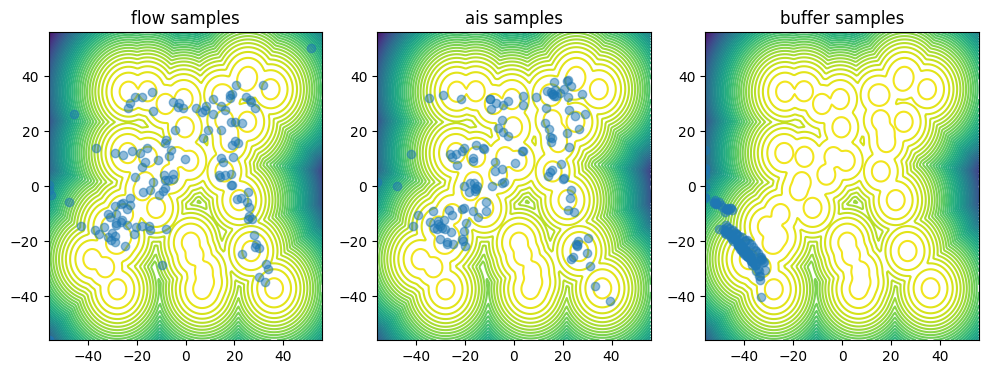

loss: 5.788300521122507e+25, ess base: 0.27857527136802673,ess ais: 0.02241085097193718:  89%|████████▉ | 3556/4000 [12:26<05:10,  1.43it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.283787889327203e+33, ess base: 0.193917915225029,ess ais: 0.08291825652122498:  89%|████████▉ | 3557/4000 [12:27<04:04,  1.81it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.93957684645089e+35, ess base: 0.14135266840457916,ess ais: 0.033044133335351944:  89%|████████▉ | 3558/4000 [12:27<03:16,  2.24it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.991640841165514e+35, ess base: 0.2533787488937378,ess ais: 0.0078125:  89%|████████▉ | 3559/4000 [12:27<02:44,  2.69it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.93957684645089e+35, ess base: 0.24610714614391327,ess ais: 0.007936508394777775:  89%|████████▉ | 3560/4000 [12:27<02:23,  3.08it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.178330354372898e+36, ess base: 0.19878381490707397,ess ais: 0.07292474061250687:  89%|████████▉ | 3561/4000 [12:27<02:05,  3.50it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.904316762681643e+29, ess base: 0.24930499494075775,ess ais: 0.00800000037997961:  89%|████████▉ | 3562/4000 [12:28<01:54,  3.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.939578827154953e+35, ess base: 0.24542923271656036,ess ais: 0.0078125:  89%|████████▉ | 3563/4000 [12:28<01:46,  4.09it/s]          

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.287180524707581e+30, ess base: 0.1771116554737091,ess ais: 0.008202124387025833:  89%|████████▉ | 3564/4000 [12:28<01:41,  4.30it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8163425485720366e+35, ess base: 0.29526451230049133,ess ais: 0.007905996404588223:  89%|████████▉ | 3565/4000 [12:28<01:37,  4.47it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.9988891556509684e+29, ess base: 0.22185401618480682,ess ais: 0.007874015718698502:  89%|████████▉ | 3566/4000 [12:28<01:33,  4.62it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.675410539744918e+36, ess base: 0.15352168679237366,ess ais: 0.047837935388088226:  89%|████████▉ | 3567/4000 [12:29<01:32,  4.70it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.837151033174783e+35, ess base: 0.16294601559638977,ess ais: 0.04210641607642174:  89%|████████▉ | 3568/4000 [12:29<01:30,  4.76it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5526810454079216e+36, ess base: 0.24216648936271667,ess ais: 0.015932926908135414:  89%|████████▉ | 3569/4000 [12:29<01:29,  4.79it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.161777961734183e+27, ess base: 0.05834195017814636,ess ais: 0.0078125:  89%|████████▉ | 3570/4000 [12:29<01:29,  4.82it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.764316187234607e+35, ess base: 0.2251279503107071,ess ais: 0.13915055990219116:  89%|████████▉ | 3571/4000 [12:29<01:28,  4.84it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1783305128292231e+36, ess base: 0.2981278896331787,ess ais: 0.029864875599741936:  89%|████████▉ | 3572/4000 [12:30<01:28,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.93957684645089e+35, ess base: 0.23093770444393158,ess ais: 0.007835160940885544:  89%|████████▉ | 3573/4000 [12:30<01:28,  4.80it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5526808869515966e+36, ess base: 0.2640138864517212,ess ais: 0.0949840247631073:  89%|████████▉ | 3574/4000 [12:30<01:28,  4.82it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.7643213370651706e+35, ess base: 0.19882823526859283,ess ais: 0.07130551338195801:  89%|████████▉ | 3575/4000 [12:30<01:27,  4.86it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2574907768082127e+35, ess base: 0.32914531230926514,ess ais: 0.13328862190246582:  89%|████████▉ | 3577/4000 [12:31<01:25,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.0738071800866196e+35, ess base: 0.2807437479496002,ess ais: 0.14073339104652405:  89%|████████▉ | 3578/4000 [12:31<01:26,  4.88it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3094939639081067e+35, ess base: 0.1445462554693222,ess ais: 0.043763961642980576:  89%|████████▉ | 3579/4000 [12:31<01:26,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.824462610309344e+29, ess base: 0.1742262989282608,ess ais: 0.08125878125429153:  90%|████████▉ | 3580/4000 [12:31<01:26,  4.87it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.8538048196235946e+29, ess base: 0.2536448836326599,ess ais: 0.10680612921714783:  90%|████████▉ | 3581/4000 [12:31<01:25,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.2574879047873216e+35, ess base: 0.26412373781204224,ess ais: 0.1533145010471344:  90%|████████▉ | 3582/4000 [12:32<01:25,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8163425485720366e+35, ess base: 0.18712347745895386,ess ais: 0.0078125:  90%|████████▉ | 3583/4000 [12:32<01:28,  4.71it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.0946041766058014e+35, ess base: 0.16794107854366302,ess ais: 0.0078125:  90%|████████▉ | 3584/4000 [12:32<01:27,  4.76it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1814527362575852e+36, ess base: 0.1988978087902069,ess ais: 0.0636182576417923:  90%|████████▉ | 3585/4000 [12:32<01:27,  4.76it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.5820375321115893e+30, ess base: 0.1980416476726532,ess ais: 0.007936508394777775:  90%|████████▉ | 3586/4000 [12:33<01:26,  4.79it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.203297193723918e+33, ess base: 0.18983738124370575,ess ais: 0.007874015718698502:  90%|████████▉ | 3587/4000 [12:33<01:25,  4.83it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.802404927914506e+29, ess base: 0.18732360005378723,ess ais: 0.026382053270936012:  90%|████████▉ | 3588/4000 [12:33<01:25,  4.84it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.764311433544856e+35, ess base: 0.17073388397693634,ess ais: 0.007906314916908741:  90%|████████▉ | 3589/4000 [12:33<01:24,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5547614184992212e+36, ess base: 0.218513622879982,ess ais: 0.07750726491212845:  90%|████████▉ | 3590/4000 [12:33<01:23,  4.93it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2574628488809264e+35, ess base: 0.036921627819538116,ess ais: 0.008680243045091629:  90%|████████▉ | 3592/4000 [12:34<01:20,  5.04it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2574879047873216e+35, ess base: 0.2225755900144577,ess ais: 0.0078125:  90%|████████▉ | 3593/4000 [12:34<01:19,  5.10it/s]             

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.7643462939363626e+35, ess base: 0.10350743681192398,ess ais: 0.012933362275362015:  90%|████████▉ | 3594/4000 [12:34<01:18,  5.14it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1783343950091863e+36, ess base: 0.21675433218479156,ess ais: 0.10007740557193756:  90%|████████▉ | 3595/4000 [12:34<01:18,  5.16it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.875464168324336e+29, ess base: 0.12573261559009552,ess ais: 0.007874015718698502:  90%|████████▉ | 3597/4000 [12:35<01:17,  5.19it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1762496643689485e+36, ess base: 0.21772630512714386,ess ais: 0.05784988030791283:  90%|████████▉ | 3598/4000 [12:35<01:18,  5.11it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.081473001024458e+33, ess base: 0.2811843752861023,ess ais: 0.15434309840202332:  90%|████████▉ | 3599/4000 [12:35<01:18,  5.09it/s]  

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3019959294500005e+36, ess base: 0.03993592783808708,ess ais: 0.010731087066233158:  90%|█████████ | 3600/4000 [12:35<01:18,  5.09it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.971194440412862e+29, ess base: 0.20481829345226288,ess ais: 0.09084898233413696:  90%|█████████ | 3601/4000 [12:36<01:18,  5.11it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.0217990412265685e+35, ess base: 0.11360246688127518,ess ais: 0.01930081471800804:  90%|█████████ | 3602/4000 [12:36<01:17,  5.11it/s]

nan grad norm in replay step


loss: 1.2782618261041711e+35, ess base: 0.1725986748933792,ess ais: 0.0078125:  90%|█████████ | 3602/4000 [12:36<01:17,  5.11it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3071990013386372e+36, ess base: 0.24770833551883698,ess ais: 0.0078125:  90%|█████████ | 3604/4000 [12:36<01:19,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1814559846122483e+36, ess base: 0.21180231869220734,ess ais: 0.007874015718698502:  90%|█████████ | 3605/4000 [12:36<01:20,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5526808869515966e+36, ess base: 0.26454100012779236,ess ais: 0.007988151162862778:  90%|█████████ | 3606/4000 [12:37<01:26,  4.57it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.178330354372898e+36, ess base: 0.19532130658626556,ess ais: 0.06526502966880798:  90%|█████████ | 3607/4000 [12:37<01:25,  4.62it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0849452680921486e+33, ess base: 0.15308767557144165,ess ais: 0.018036777153611183:  90%|█████████ | 3608/4000 [12:37<01:23,  4.68it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.580529006518291e+25, ess base: 0.2533809542655945,ess ais: 0.021664801985025406:  90%|█████████ | 3609/4000 [12:37<01:22,  4.74it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.0426079219701274e+35, ess base: 0.2927986681461334,ess ais: 0.12621521949768066:  90%|█████████ | 3610/4000 [12:37<01:21,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.764311433544856e+35, ess base: 0.18794451653957367,ess ais: 0.020586464554071426:  90%|█████████ | 3611/4000 [12:38<01:19,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.149688703538037e+27, ess base: 0.16546344757080078,ess ais: 0.03622628375887871:  90%|█████████ | 3612/4000 [12:38<01:19,  4.86it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.2717580217507055e+25, ess base: 0.2511198818683624,ess ais: 0.00800000037997961:  90%|█████████ | 3613/4000 [12:38<01:19,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.021766557679938e+35, ess base: 0.19741669297218323,ess ais: 0.013860520906746387:  90%|█████████ | 3614/4000 [12:38<01:19,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.764319356361108e+35, ess base: 0.25326165556907654,ess ais: 0.027411015704274178:  90%|█████████ | 3615/4000 [12:38<01:18,  4.91it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.257454926064675e+35, ess base: 0.2724390923976898,ess ais: 0.0078125:  90%|█████████ | 3616/4000 [12:39<01:17,  4.95it/s]            

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.178330354372898e+36, ess base: 0.19567924737930298,ess ais: 0.0078125:  90%|█████████ | 3617/4000 [12:39<01:17,  4.94it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.269528560515672e+30, ess base: 0.24136707186698914,ess ais: 0.007874015718698502:  90%|█████████ | 3618/4000 [12:39<01:17,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.257454926064675e+35, ess base: 0.19782303273677826,ess ais: 0.0078125:  90%|█████████ | 3619/4000 [12:39<01:17,  4.92it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762506151068986e+36, ess base: 0.23372778296470642,ess ais: 0.0078125:  90%|█████████ | 3620/4000 [12:39<01:17,  4.93it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.203107169927887e+33, ess base: 0.13037966191768646,ess ais: 0.007936508394777775:  91%|█████████ | 3621/4000 [12:40<01:16,  4.93it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.195499200196734e+27, ess base: 0.2164071947336197,ess ais: 0.007874015718698502:  91%|█████████ | 3623/4000 [12:40<01:16,  4.95it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.2782636087378277e+35, ess base: 0.24214966595172882,ess ais: 0.008064569905400276:  91%|█████████ | 3624/4000 [12:40<01:15,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1762496643689485e+36, ess base: 0.26473772525787354,ess ais: 0.007874015718698502:  91%|█████████ | 3625/4000 [12:40<01:16,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3023230625330219e+36, ess base: 0.2812385559082031,ess ais: 0.0967065691947937:  91%|█████████ | 3626/4000 [12:41<01:16,  4.87it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.16013366756636e+21, ess base: 0.2608989477157593,ess ais: 0.007874015718698502:  91%|█████████ | 3627/4000 [12:41<01:17,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.0808662556627033e+33, ess base: 0.20446491241455078,ess ais: 0.025195099413394928:  91%|█████████ | 3628/4000 [12:41<01:17,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.5547623692371714e+36, ess base: 0.055619385093450546,ess ais: 0.01616033911705017:  91%|█████████ | 3629/4000 [12:41<01:17,  4.80it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.4094068765087682e+33, ess base: 0.25234389305114746,ess ais: 0.11436746269464493:  91%|█████████ | 3630/4000 [12:41<01:16,  4.81it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.0841373682261293e+30, ess base: 0.26708129048347473,ess ais: 0.14534738659858704:  91%|█████████ | 3631/4000 [12:42<01:16,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.8163425485720366e+35, ess base: 0.029767174273729324,ess ais: 0.02043733187019825:  91%|█████████ | 3632/4000 [12:42<01:16,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.8548968196490934e+29, ess base: 0.15646278858184814,ess ais: 0.007812606170773506:  91%|█████████ | 3633/4000 [12:42<01:16,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.611897088069577e+33, ess base: 0.19934318959712982,ess ais: 0.007936508394777775:  91%|█████████ | 3634/4000 [12:42<01:16,  4.81it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3095268435955501e+35, ess base: 0.2850903868675232,ess ais: 0.11483132839202881:  91%|█████████ | 3635/4000 [12:43<01:16,  4.79it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.281144599875409e+32, ess base: 0.2198386788368225,ess ais: 0.007936508394777775:  91%|█████████ | 3636/4000 [12:43<01:15,  4.81it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1814559846122483e+36, ess base: 0.025597089901566505,ess ais: 0.008492295630276203:  91%|█████████ | 3637/4000 [12:43<01:15,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.4724091164743857e+30, ess base: 0.2419634759426117,ess ais: 0.12443840503692627:  91%|█████████ | 3638/4000 [12:43<01:15,  4.82it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.764313414248919e+35, ess base: 0.053705744445323944,ess ais: 0.01996017061173916:  91%|█████████ | 3639/4000 [12:43<01:15,  4.78it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.176577589733595e+36, ess base: 0.20575062930583954,ess ais: 0.0856938436627388:  91%|█████████ | 3640/4000 [12:44<01:15,  4.78it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1762504566505736e+36, ess base: 0.2392003834247589,ess ais: 0.12557315826416016:  91%|█████████ | 3641/4000 [12:44<01:14,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.7851183335843524e+35, ess base: 0.23136810958385468,ess ais: 0.007936508394777775:  91%|█████████ | 3642/4000 [12:44<01:13,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.767590687191322e+35, ess base: 0.2883079946041107,ess ais: 0.15086758136749268:  91%|█████████ | 3643/4000 [12:44<01:13,  4.88it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762496643689485e+36, ess base: 0.2087121605873108,ess ais: 0.09285561740398407:  91%|█████████ | 3644/4000 [12:44<01:12,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.1410635046076113e+22, ess base: 0.23959293961524963,ess ais: 0.0078125:  91%|█████████ | 3645/4000 [12:45<01:11,  4.95it/s]         

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.257454926064675e+35, ess base: 0.2470434308052063,ess ais: 0.1258048266172409:  91%|█████████ | 3646/4000 [12:45<01:11,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.257454926064675e+35, ess base: 0.227800190448761,ess ais: 0.06355118751525879:  91%|█████████ | 3647/4000 [12:45<01:11,  4.94it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0814779527846152e+33, ess base: 0.2404046356678009,ess ais: 0.007874015718698502:  91%|█████████ | 3648/4000 [12:45<01:11,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.8527815772540865e+29, ess base: 0.2369990050792694,ess ais: 0.03293988108634949:  91%|█████████ | 3649/4000 [12:45<01:11,  4.93it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.531221320430418e+33, ess base: 0.22479647397994995,ess ais: 0.11107204854488373:  91%|█████████▏| 3650/4000 [12:46<01:11,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.573541841031771e+25, ess base: 0.18483904004096985,ess ais: 0.0078125:  91%|█████████▏| 3651/4000 [12:46<01:10,  4.93it/s]          

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.67875428511567e+36, ess base: 0.21578386425971985,ess ais: 0.007874015718698502:  91%|█████████▏| 3652/4000 [12:46<01:12,  4.81it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0806808741418203e+33, ess base: 0.27537405490875244,ess ais: 0.007874015718698502:  91%|█████████▏| 3653/4000 [12:46<01:14,  4.64it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.8404366250742495e+35, ess base: 0.23161821067333221,ess ais: 0.09580205380916595:  91%|█████████▏| 3654/4000 [12:46<01:15,  4.58it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.284765242988218e+33, ess base: 0.2603049874305725,ess ais: 0.12347277253866196:  91%|█████████▏| 3655/4000 [12:47<01:14,  4.60it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.073830552394561e+35, ess base: 0.24454975128173828,ess ais: 0.0078125:  91%|█████████▏| 3656/4000 [12:47<01:14,  4.64it/s]         

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.080676077124168e+33, ess base: 0.22853536903858185,ess ais: 0.007936508394777775:  91%|█████████▏| 3657/4000 [12:47<01:14,  4.63it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2574976102372296e+35, ess base: 0.2657495141029358,ess ais: 0.007812507450580597:  91%|█████████▏| 3658/4000 [12:47<01:13,  4.67it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5526815207768967e+36, ess base: 0.23556582629680634,ess ais: 0.13393869996070862:  91%|█████████▏| 3659/4000 [12:48<01:12,  4.69it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.023202429172684e+29, ess base: 0.2674937844276428,ess ais: 0.007874015718698502:  92%|█████████▏| 3660/4000 [12:48<01:12,  4.71it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.022001059139441e+29, ess base: 0.18967802822589874,ess ais: 0.007936508394777775:  92%|█████████▏| 3661/4000 [12:48<01:11,  4.75it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2792907846665795e+32, ess base: 0.2567318379878998,ess ais: 0.09484583884477615:  92%|█████████▏| 3662/4000 [12:48<01:11,  4.70it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3019994154891511e+36, ess base: 0.2729009985923767,ess ais: 0.025333987548947334:  92%|█████████▏| 3663/4000 [12:48<01:14,  4.49it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.874324755739349e+29, ess base: 0.020581817254424095,ess ais: 0.008010699413716793:  92%|█████████▏| 3664/4000 [12:49<01:15,  4.46it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2607440832314547e+35, ess base: 0.1361764818429947,ess ais: 0.03135990723967552:  92%|█████████▏| 3665/4000 [12:49<01:14,  4.48it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1786582797375446e+36, ess base: 0.29419031739234924,ess ais: 0.1598118394613266:  92%|█████████▏| 3666/4000 [12:49<01:11,  4.64it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.7643213370651706e+35, ess base: 0.22292637825012207,ess ais: 0.007874015718698502:  92%|█████████▏| 3667/4000 [12:49<01:12,  4.58it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.084295435277044e+30, ess base: 0.2145928591489792,ess ais: 0.008321014232933521:  92%|█████████▏| 3668/4000 [12:50<01:18,  4.22it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2793418496932e+32, ess base: 0.17303656041622162,ess ais: 0.009536121971905231:  92%|█████████▏| 3669/4000 [12:50<01:17,  4.25it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.257454926064675e+35, ess base: 0.23212315142154694,ess ais: 0.007874015718698502:  92%|█████████▏| 3670/4000 [12:50<01:14,  4.41it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.304079075526988e+36, ess base: 0.14451666176319122,ess ais: 0.06232675537467003:  92%|█████████▏| 3671/4000 [12:50<01:12,  4.54it/s] 

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762529127236115e+36, ess base: 0.18473702669143677,ess ais: 0.09142901003360748:  92%|█████████▏| 3672/4000 [12:50<01:17,  4.22it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.709278055091474e+22, ess base: 0.27254366874694824,ess ais: 0.007874015718698502:  92%|█████████▏| 3673/4000 [12:51<01:15,  4.32it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0839628079284708e+33, ess base: 0.2785654366016388,ess ais: 0.00781667698174715:  92%|█████████▏| 3674/4000 [12:51<01:15,  4.32it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2574550250998782e+35, ess base: 0.2734108567237854,ess ais: 0.1554965078830719:  92%|█████████▏| 3675/4000 [12:51<01:15,  4.33it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762504566505736e+36, ess base: 0.2492833286523819,ess ais: 0.11210916191339493:  92%|█████████▏| 3676/4000 [12:51<01:13,  4.38it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0806808741418203e+33, ess base: 0.2547634541988373,ess ais: 0.1441309005022049:  92%|█████████▏| 3677/4000 [12:52<01:12,  4.47it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.852781388359427e+29, ess base: 0.22058111429214478,ess ais: 0.0078125:  92%|█████████▏| 3678/4000 [12:52<01:11,  4.47it/s]         

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2872619579507905e+32, ess base: 0.21551670134067535,ess ais: 0.007874015718698502:  92%|█████████▏| 3679/4000 [12:52<01:11,  4.47it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1309999473519728e+26, ess base: 0.17599767446517944,ess ais: 0.007874015718698502:  92%|█████████▏| 3680/4000 [12:52<01:11,  4.48it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 9.866038405840322e+22, ess base: 0.024716265499591827,ess ais: 0.007936508394777775:  92%|█████████▏| 3681/4000 [12:52<01:10,  4.51it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.312160800703442e+32, ess base: 0.24006220698356628,ess ais: 0.09323267638683319:  92%|█████████▏| 3682/4000 [12:53<01:10,  4.51it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762496643689485e+36, ess base: 0.23632803559303284,ess ais: 0.0078125:  92%|█████████▏| 3683/4000 [12:53<01:10,  4.47it/s]         

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762504566505736e+36, ess base: 0.2327294647693634,ess ais: 0.06958410143852234:  92%|█████████▏| 3684/4000 [12:53<01:09,  4.52it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2792907846665795e+32, ess base: 0.21649208664894104,ess ais: 0.012696039862930775:  92%|█████████▏| 3685/4000 [12:53<01:09,  4.51it/s]

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.7643443132323e+35, ess base: 0.23366300761699677,ess ais: 0.008064515888690948:  92%|█████████▏| 3686/4000 [12:54<01:08,  4.58it/s]   

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.477377499361547e+30, ess base: 0.1872202605009079,ess ais: 0.03799683228135109:  92%|█████████▏| 3687/4000 [12:54<01:08,  4.55it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.023131404780781e+29, ess base: 0.31857752799987793,ess ais: 0.04869812726974487:  92%|█████████▏| 3688/4000 [12:54<01:08,  4.58it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.9031386266914966e+29, ess base: 0.2336517721414566,ess ais: 0.009077447466552258:  92%|█████████▏| 3689/4000 [12:54<01:07,  4.60it/s]

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.764311433544856e+35, ess base: 0.19664087891578674,ess ais: 0.008064515888690948:  92%|█████████▏| 3690/4000 [12:54<01:05,  4.74it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.767590687191322e+35, ess base: 0.21095030009746552,ess ais: 0.08858932554721832:  92%|█████████▏| 3691/4000 [12:55<01:06,  4.67it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2607750812500384e+35, ess base: 0.022581836208701134,ess ais: 0.007931257598102093:  92%|█████████▏| 3692/4000 [12:55<01:06,  4.66it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.292053704686448e+30, ess base: 0.24902792274951935,ess ais: 0.12121836841106415:  92%|█████████▏| 3693/4000 [12:55<01:06,  4.62it/s]   

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.874324755739349e+29, ess base: 0.24736209213733673,ess ais: 0.011066693812608719:  92%|█████████▏| 3694/4000 [12:55<01:05,  4.64it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.8527817661487458e+29, ess base: 0.20406363904476166,ess ais: 0.07479081302881241:  92%|█████████▏| 3695/4000 [12:56<01:05,  4.67it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1765809965445831e+36, ess base: 0.19205278158187866,ess ais: 0.007936508394777775:  92%|█████████▏| 3696/4000 [12:56<01:05,  4.62it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762529127236115e+36, ess base: 0.23324930667877197,ess ais: 0.08639907836914062:  92%|█████████▏| 3697/4000 [12:56<01:06,  4.54it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.257454926064675e+35, ess base: 0.2824145257472992,ess ais: 0.007874015718698502:  92%|█████████▏| 3698/4000 [12:56<01:06,  4.55it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762498228252735e+36, ess base: 0.1891249716281891,ess ais: 0.08905235677957535:  92%|█████████▏| 3699/4000 [12:56<01:05,  4.59it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762529127236115e+36, ess base: 0.24554495513439178,ess ais: 0.007874015718698502:  92%|█████████▎| 3700/4000 [12:57<01:06,  4.54it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762506151068986e+36, ess base: 0.308098167181015,ess ais: 0.007874015718698502:  93%|█████████▎| 3701/4000 [12:57<01:05,  4.58it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2464463169165693e+23, ess base: 0.20439155399799347,ess ais: 0.0078125:  93%|█████████▎| 3702/4000 [12:57<01:04,  4.61it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2792907846665795e+32, ess base: 0.19076816737651825,ess ais: 0.0078125:  93%|█████████▎| 3703/4000 [12:57<01:03,  4.66it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762504566505736e+36, ess base: 0.28634071350097656,ess ais: 0.007812859490513802:  93%|█████████▎| 3704/4000 [12:57<01:03,  4.70it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2921519299092915e+30, ess base: 0.22746381163597107,ess ais: 0.007874015718698502:  93%|█████████▎| 3705/4000 [12:58<01:04,  4.61it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.312212639442587e+32, ess base: 0.03684765845537186,ess ais: 0.008741394616663456:  93%|█████████▎| 3706/4000 [12:58<01:03,  4.60it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.287017924184843e+30, ess base: 0.24378299713134766,ess ais: 0.007874015718698502:  93%|█████████▎| 3707/4000 [12:58<01:02,  4.68it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762529127236115e+36, ess base: 0.06343545764684677,ess ais: 0.010359176434576511:  93%|█████████▎| 3708/4000 [12:58<01:02,  4.70it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.2764762377161585e+25, ess base: 0.21674314141273499,ess ais: 0.07739182561635971:  93%|█████████▎| 3709/4000 [12:59<01:01,  4.76it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.035746854743547e+27, ess base: 0.2214520126581192,ess ais: 0.055082403123378754:  93%|█████████▎| 3710/4000 [12:59<01:00,  4.77it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.022001059139441e+29, ess base: 0.15097975730895996,ess ais: 0.00800000037997961:  93%|█████████▎| 3711/4000 [12:59<01:04,  4.46it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.477430389866155e+30, ess base: 0.1312403380870819,ess ais: 0.007936508394777775:  93%|█████████▎| 3712/4000 [12:59<01:07,  4.26it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1765808380882581e+36, ess base: 0.036197319626808167,ess ais: 0.008746830746531487:  93%|█████████▎| 3713/4000 [12:59<01:05,  4.41it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.58128716769972e+25, ess base: 0.2675554156303406,ess ais: 0.1560179889202118:  93%|█████████▎| 3714/4000 [13:00<01:04,  4.47it/s]      

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 5.088448464692373e+27, ess base: 0.19702289998531342,ess ais: 0.06028827652335167:  93%|█████████▎| 3715/4000 [13:00<01:04,  4.42it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.2793410759806755e+32, ess base: 0.17829486727714539,ess ais: 0.00800000037997961:  93%|█████████▎| 3716/4000 [13:00<01:05,  4.36it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.852781388359427e+29, ess base: 0.17126043140888214,ess ais: 0.007874015718698502:  93%|█████████▎| 3717/4000 [13:00<01:02,  4.50it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.301998623207526e+36, ess base: 0.2311372607946396,ess ais: 0.09854681044816971:  93%|█████████▎| 3718/4000 [13:01<01:01,  4.61it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762529127236115e+36, ess base: 0.18722319602966309,ess ais: 0.0078125:  93%|█████████▎| 3719/4000 [13:01<00:59,  4.70it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3019991778046636e+36, ess base: 0.18710903823375702,ess ais: 0.0078125:  93%|█████████▎| 3720/4000 [13:01<00:59,  4.68it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.735432259567465e+22, ess base: 0.1807987540960312,ess ais: 0.016663746908307076:  93%|█████████▎| 3721/4000 [13:01<00:58,  4.75it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.301996167134488e+36, ess base: 0.195765882730484,ess ais: 0.007874015718698502:  93%|█████████▎| 3722/4000 [13:01<00:57,  4.82it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2607361604152033e+35, ess base: 0.013224989175796509,ess ais: 0.007874015718698502:  93%|█████████▎| 3723/4000 [13:02<00:56,  4.86it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.257454926064675e+35, ess base: 0.27013054490089417,ess ais: 0.007874015718698502:  93%|█████████▎| 3724/4000 [13:02<00:57,  4.76it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2607421025273918e+35, ess base: 0.1926134079694748,ess ais: 0.007936508394777775:  93%|█████████▎| 3725/4000 [13:02<00:57,  4.77it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.472348670183405e+30, ess base: 0.17384707927703857,ess ais: 0.04427528753876686:  93%|█████████▎| 3726/4000 [13:02<00:57,  4.76it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.358282668572732e+26, ess base: 0.31716832518577576,ess ais: 0.007936508394777775:  93%|█████████▎| 3727/4000 [13:02<00:56,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.37298820310321e+26, ess base: 0.14508862793445587,ess ais: 0.007874015718698502:  93%|█████████▎| 3728/4000 [13:03<00:55,  4.88it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.257454926064675e+35, ess base: 0.21566015481948853,ess ais: 0.08579319715499878:  93%|█████████▎| 3729/4000 [13:03<00:55,  4.89it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.925794287306593e+27, ess base: 0.2535439133644104,ess ais: 0.007874015718698502:  93%|█████████▎| 3729/4000 [13:03<00:55,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.925794287306593e+27, ess base: 0.2535439133644104,ess ais: 0.007874015718698502:  93%|█████████▎| 3730/4000 [13:03<00:54,  4.92it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1762530711799366e+36, ess base: 0.2172490805387497,ess ais: 0.007936508394777775:  93%|█████████▎| 3731/4000 [13:03<00:54,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.176577589733595e+36, ess base: 0.2613297402858734,ess ais: 0.0078125:  93%|█████████▎| 3732/4000 [13:03<00:54,  4.95it/s]            

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762496643689485e+36, ess base: 0.275380402803421,ess ais: 0.058191511780023575:  93%|█████████▎| 3733/4000 [13:04<00:55,  4.79it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.257454926064675e+35, ess base: 0.23476038873195648,ess ais: 0.09252229332923889:  93%|█████████▎| 3734/4000 [13:04<00:55,  4.79it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3125987175266344e+36, ess base: 0.30885517597198486,ess ais: 0.16870015859603882:  93%|█████████▎| 3735/4000 [13:04<01:00,  4.37it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.279341462836938e+32, ess base: 0.21103650331497192,ess ais: 0.07905822992324829:  93%|█████████▎| 3736/4000 [13:04<01:01,  4.28it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.281152723856917e+32, ess base: 0.2191503643989563,ess ais: 0.0078125:  93%|█████████▎| 3737/4000 [13:05<01:00,  4.37it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1762496643689485e+36, ess base: 0.05821017548441887,ess ais: 0.007874015718698502:  93%|█████████▎| 3738/4000 [13:05<00:58,  4.46it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.090055362344598e+30, ess base: 0.2507266402244568,ess ais: 0.007874015718698502:  93%|█████████▎| 3739/4000 [13:05<00:57,  4.56it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1762529127236115e+36, ess base: 0.25537368655204773,ess ais: 0.011801609769463539:  94%|█████████▎| 3740/4000 [13:05<00:55,  4.66it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3019994154891511e+36, ess base: 0.1380745768547058,ess ais: 0.07086934894323349:  94%|█████████▎| 3741/4000 [13:05<00:54,  4.74it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0603544457997943e+34, ess base: 0.28298312425613403,ess ais: 0.15966562926769257:  94%|█████████▎| 3742/4000 [13:06<00:54,  4.77it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0607016879808138e+34, ess base: 0.08593517541885376,ess ais: 0.0078125:  94%|█████████▎| 3743/4000 [13:06<00:54,  4.73it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0935557500654203e+34, ess base: 0.23174497485160828,ess ais: 0.054486505687236786:  94%|█████████▎| 3744/4000 [13:06<00:56,  4.55it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3634903335064533e+35, ess base: 0.2393587976694107,ess ais: 0.12509511411190033:  94%|█████████▎| 3745/4000 [13:06<00:54,  4.66it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.2929924355853786e+30, ess base: 0.20722602307796478,ess ais: 0.1145235151052475:  94%|█████████▎| 3746/4000 [13:06<00:53,  4.73it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2870635611345336e+30, ess base: 0.18402087688446045,ess ais: 0.0078125:  94%|█████████▎| 3747/4000 [13:07<00:52,  4.82it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.853726428339979e+29, ess base: 0.12391229718923569,ess ais: 0.0078125:  94%|█████████▎| 3748/4000 [13:07<00:51,  4.88it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.97118688462649e+29, ess base: 0.2738785147666931,ess ais: 0.007874015718698502:  94%|█████████▎| 3749/4000 [13:07<00:50,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.486808317798331e+22, ess base: 0.2685522735118866,ess ais: 0.14730556309223175:  94%|█████████▍| 3750/4000 [13:07<00:50,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.022487651781836e+29, ess base: 0.23070935904979706,ess ais: 0.007874015718698502:  94%|█████████▍| 3752/4000 [13:08<00:49,  4.98it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3019959294500005e+36, ess base: 0.21503232419490814,ess ais: 0.07868397980928421:  94%|█████████▍| 3753/4000 [13:08<00:49,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.279349973674708e+32, ess base: 0.22172711789608002,ess ais: 0.1334417313337326:  94%|█████████▍| 3754/4000 [13:08<00:49,  4.99it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.540296907484995e+33, ess base: 0.014374949969351292,ess ais: 0.007919841445982456:  94%|█████████▍| 3755/4000 [13:08<00:48,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3634903335064533e+35, ess base: 0.016753779724240303,ess ais: 0.007874015718698502:  94%|█████████▍| 3756/4000 [13:08<00:48,  5.02it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1890622843544303e+36, ess base: 0.15676724910736084,ess ais: 0.007936508394777775:  94%|█████████▍| 3758/4000 [13:09<00:48,  4.99it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.537014045243315e+33, ess base: 0.26150187849998474,ess ais: 0.10044443607330322:  94%|█████████▍| 3759/4000 [13:09<00:48,  5.00it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.2574879047873216e+35, ess base: 0.19465863704681396,ess ais: 0.009162264876067638:  94%|█████████▍| 3760/4000 [13:09<00:48,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2793550028061174e+32, ess base: 0.23672795295715332,ess ais: 0.007874015718698502:  94%|█████████▍| 3761/4000 [13:09<00:47,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762496643689485e+36, ess base: 0.21627812087535858,ess ais: 0.00800000037997961:  94%|█████████▍| 3762/4000 [13:10<00:47,  5.01it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1868564930818706e+36, ess base: 0.12385713309049606,ess ais: 0.007874015718698502:  94%|█████████▍| 3764/4000 [13:10<00:47,  5.00it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.980544726048944e+29, ess base: 0.23633718490600586,ess ais: 0.007874015718698502:  94%|█████████▍| 3765/4000 [13:10<00:46,  5.01it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3019959294500005e+36, ess base: 0.23542949557304382,ess ais: 0.03741197660565376:  94%|█████████▍| 3766/4000 [13:10<00:46,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5370098671956824e+33, ess base: 0.019661646336317062,ess ais: 0.012545623816549778:  94%|█████████▍| 3767/4000 [13:11<00:46,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1808664478549797e+36, ess base: 0.22660183906555176,ess ais: 0.00949394702911377:  94%|█████████▍| 3768/4000 [13:11<00:46,  4.96it/s]  

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1808664478549797e+36, ess base: 0.20950499176979065,ess ais: 0.007874015718698502:  94%|█████████▍| 3769/4000 [13:11<00:46,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1868564930818706e+36, ess base: 0.2005583792924881,ess ais: 0.007874015718698502:  94%|█████████▍| 3770/4000 [13:11<00:46,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.522036879605045e+34, ess base: 0.23677395284175873,ess ais: 0.007874015718698502:  94%|█████████▍| 3771/4000 [13:12<00:46,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.7432737244038807e+34, ess base: 0.24177199602127075,ess ais: 0.008883616887032986:  94%|█████████▍| 3772/4000 [13:12<00:46,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.6168271234175963e+33, ess base: 0.06114529073238373,ess ais: 0.00800000037997961:  94%|█████████▍| 3773/4000 [13:12<00:46,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3003439034193343e+35, ess base: 0.2628768980503082,ess ais: 0.07975070923566818:  94%|█████████▍| 3774/4000 [13:12<00:45,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762529127236115e+36, ess base: 0.24386712908744812,ess ais: 0.0078125:  94%|█████████▍| 3776/4000 [13:13<00:44,  4.98it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4892439717583793e+34, ess base: 0.0836847648024559,ess ais: 0.0078125:  94%|█████████▍| 3777/4000 [13:13<00:44,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.522116602943575e+34, ess base: 0.047508809715509415,ess ais: 0.013513435609638691:  94%|█████████▍| 3778/4000 [13:13<00:44,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1784595755059588e+36, ess base: 0.18368665874004364,ess ais: 0.014975931495428085:  94%|█████████▍| 3779/4000 [13:13<00:44,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.257454926064675e+35, ess base: 0.22422999143600464,ess ais: 0.09700135141611099:  94%|█████████▍| 3780/4000 [13:13<00:43,  5.00it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3019959294500005e+36, ess base: 0.2540345788002014,ess ais: 0.00800000037997961:  95%|█████████▍| 3781/4000 [13:14<00:43,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 9.357513070409977e+26, ess base: 0.2555113732814789,ess ais: 0.14438095688819885:  95%|█████████▍| 3783/4000 [13:14<00:42,  5.05it/s]   

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.5942660490198356e+22, ess base: 0.1875864863395691,ess ais: 0.033690936863422394:  95%|█████████▍| 3784/4000 [13:14<00:42,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2574628488809264e+35, ess base: 0.2834632992744446,ess ais: 0.0078125:  95%|█████████▍| 3785/4000 [13:14<00:42,  5.06it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1784595755059588e+36, ess base: 0.24111664295196533,ess ais: 0.007817788980901241:  95%|█████████▍| 3786/4000 [13:14<00:42,  5.08it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.279291558379104e+32, ess base: 0.20642425119876862,ess ais: 0.007874015718698502:  95%|█████████▍| 3788/4000 [13:15<00:41,  5.09it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3855890487357444e+35, ess base: 0.15108495950698853,ess ais: 0.0078125:  95%|█████████▍| 3789/4000 [13:15<00:41,  5.09it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 6.404626310682696e+27, ess base: 0.18976277112960815,ess ais: 0.0398431159555912:  95%|█████████▍| 3790/4000 [13:15<00:41,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1868532447272075e+36, ess base: 0.1904733031988144,ess ais: 0.07876118272542953:  95%|█████████▍| 3791/4000 [13:15<00:41,  5.09it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3638915251143849e+35, ess base: 0.21888390183448792,ess ais: 0.0078125:  95%|█████████▍| 3793/4000 [13:16<00:40,  5.08it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1805385224903331e+36, ess base: 0.0700315535068512,ess ais: 0.00800000037997961:  95%|█████████▍| 3794/4000 [13:16<00:40,  5.03it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1762897538191807e+36, ess base: 0.2824443280696869,ess ais: 0.007874015718698502:  95%|█████████▍| 3795/4000 [13:16<00:40,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.176577589733595e+36, ess base: 0.14644218981266022,ess ais: 0.007936508394777775:  95%|█████████▍| 3796/4000 [13:16<00:40,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3224426186486255e+35, ess base: 0.222617045044899,ess ais: 0.00800000037997961:  95%|█████████▍| 3797/4000 [13:17<00:40,  5.06it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.971257153439755e+29, ess base: 0.2542147934436798,ess ais: 0.13665184378623962:  95%|█████████▍| 3799/4000 [13:17<00:39,  5.07it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.27935538966238e+32, ess base: 0.2249920517206192,ess ais: 0.10763784497976303:  95%|█████████▌| 3800/4000 [13:17<00:39,  5.05it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.044590593657578e+29, ess base: 0.2409484088420868,ess ais: 0.011999554000794888:  95%|█████████▌| 3801/4000 [13:17<00:39,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.373067155167845e+26, ess base: 0.26433509588241577,ess ais: 0.007874015718698502:  95%|█████████▌| 3802/4000 [13:18<00:39,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3172155010126656e+36, ess base: 0.2720026969909668,ess ais: 0.00796846766024828:  95%|█████████▌| 3803/4000 [13:18<00:39,  4.94it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.24839466952663e+33, ess base: 0.22007979452610016,ess ais: 0.01029219850897789:  95%|█████████▌| 3804/4000 [13:18<00:40,  4.87it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.2090862047166964e+33, ess base: 0.23539012670516968,ess ais: 0.007874015718698502:  95%|█████████▌| 3805/4000 [13:18<00:40,  4.85it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.287334300071836e+32, ess base: 0.2585710287094116,ess ais: 0.09258401393890381:  95%|█████████▌| 3806/4000 [13:19<00:39,  4.86it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.1911421028485922e+36, ess base: 0.2866978645324707,ess ais: 0.1323520839214325:  95%|█████████▌| 3807/4000 [13:19<00:39,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.616826194962567e+33, ess base: 0.2269062101840973,ess ais: 0.1092250719666481:  95%|█████████▌| 3808/4000 [13:19<00:39,  4.86it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1890630766360554e+36, ess base: 0.2638005316257477,ess ais: 0.0078125:  95%|█████████▌| 3809/4000 [13:19<00:40,  4.71it/s]        

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.0642858957765568e+34, ess base: 0.26773127913475037,ess ais: 0.15209750831127167:  95%|█████████▌| 3810/4000 [13:19<00:42,  4.52it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1868933341774398e+36, ess base: 0.22350360453128815,ess ais: 0.0078125:  95%|█████████▌| 3811/4000 [13:20<00:40,  4.63it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.2483883250839286e+33, ess base: 0.05808001011610031,ess ais: 0.00976876262575388:  95%|█████████▌| 3812/4000 [13:20<00:39,  4.76it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9309238522458144e+31, ess base: 0.21960926055908203,ess ais: 0.0078125:  95%|█████████▌| 3813/4000 [13:20<00:38,  4.82it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3003518262355857e+35, ess base: 0.2729826867580414,ess ais: 0.0443570651113987:  95%|█████████▌| 3815/4000 [13:20<00:37,  4.96it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2607341797111404e+35, ess base: 0.2626712918281555,ess ais: 0.11400875449180603:  95%|█████████▌| 3816/4000 [13:21<00:37,  4.88it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.317986851547624e+34, ess base: 0.2765062749385834,ess ais: 0.1424701064825058:  95%|█████████▌| 3817/4000 [13:21<00:37,  4.87it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.304024150603325e+35, ess base: 0.26485374569892883,ess ais: 0.14973203837871552:  95%|█████████▌| 3818/4000 [13:21<00:37,  4.84it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4284701032741523e+35, ess base: 0.29106995463371277,ess ais: 0.007936508394777775:  95%|█████████▌| 3819/4000 [13:21<00:36,  4.91it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3003438043841312e+35, ess base: 0.047982145100831985,ess ais: 0.012777610681951046:  96%|█████████▌| 3820/4000 [13:21<00:36,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3007447979216565e+35, ess base: 0.3302317261695862,ess ais: 0.014067161828279495:  96%|█████████▌| 3821/4000 [13:22<00:36,  4.95it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2793550028061174e+32, ess base: 0.28208041191101074,ess ais: 0.010718152858316898:  96%|█████████▌| 3822/4000 [13:22<00:35,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.035719344877518e+29, ess base: 0.2630363702774048,ess ais: 0.008130080997943878:  96%|█████████▌| 3823/4000 [13:22<00:35,  4.98it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.161780636538813e+24, ess base: 0.23465049266815186,ess ais: 0.01581568829715252:  96%|█████████▌| 3825/4000 [13:22<00:34,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1805385224903331e+36, ess base: 0.1787918657064438,ess ais: 0.007874051108956337:  96%|█████████▌| 3826/4000 [13:23<00:34,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9309238522458144e+31, ess base: 0.1823079138994217,ess ais: 0.0078125:  96%|█████████▌| 3827/4000 [13:23<00:34,  4.99it/s]           

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.971643254123394e+29, ess base: 0.10973984748125076,ess ais: 0.015308701433241367:  96%|█████████▌| 3828/4000 [13:23<00:34,  5.00it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9308447884972116e+31, ess base: 0.2991954982280731,ess ais: 0.00800000037997961:  96%|█████████▌| 3829/4000 [13:23<00:34,  4.97it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.09322707698499e+34, ess base: 0.20179207623004913,ess ais: 0.018390022218227386:  96%|█████████▌| 3831/4000 [13:24<00:33,  4.99it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.4893238188909132e+34, ess base: 0.26600274443626404,ess ais: 0.007936508394777775:  96%|█████████▌| 3832/4000 [13:24<00:33,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1805385224903331e+36, ess base: 0.2552431523799896,ess ais: 0.10788030177354813:  96%|█████████▌| 3833/4000 [13:24<00:33,  5.01it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0604342929323282e+34, ess base: 0.21706385910511017,ess ais: 0.028313398361206055:  96%|█████████▌| 3834/4000 [13:24<00:33,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.2888906173107026e+33, ess base: 0.28826382756233215,ess ais: 0.0078125:  96%|█████████▌| 3835/4000 [13:24<00:32,  5.00it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.6723754327659154e+32, ess base: 0.24625937640666962,ess ais: 0.0078125:  96%|█████████▌| 3837/4000 [13:25<00:32,  5.02it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5763174035505866e+33, ess base: 0.038509536534547806,ess ais: 0.010503624565899372:  96%|█████████▌| 3838/4000 [13:25<00:32,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.931480683478329e+31, ess base: 0.14922749996185303,ess ais: 0.007874015718698502:  96%|█████████▌| 3839/4000 [13:25<00:31,  5.03it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0603544457997943e+34, ess base: 0.2228824347257614,ess ais: 0.08772774785757065:  96%|█████████▌| 3840/4000 [13:25<00:31,  5.03it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5771209813785877e+33, ess base: 0.2826206386089325,ess ais: 0.1573898047208786:  96%|█████████▌| 3842/4000 [13:26<00:31,  5.04it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1827476413457184e+36, ess base: 0.293718159198761,ess ais: 0.007874015718698502:  96%|█████████▌| 3844/4000 [13:26<00:32,  4.87it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.209079860273995e+33, ess base: 0.2776705324649811,ess ais: 0.007936508394777775:  96%|█████████▌| 3845/4000 [13:26<00:31,  4.92it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.9309415025627808e+31, ess base: 0.21843920648097992,ess ais: 0.011606751941144466:  96%|█████████▌| 3846/4000 [13:27<00:31,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1830655047337256e+36, ess base: 0.24473831057548523,ess ais: 0.00800000037997961:  96%|█████████▌| 3847/4000 [13:27<00:30,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.57455263714906e+32, ess base: 0.26015204191207886,ess ais: 0.11933425068855286:  96%|█████████▌| 3849/4000 [13:27<00:30,  4.99it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762889615375555e+36, ess base: 0.31221485137939453,ess ais: 0.19503439962863922:  96%|█████████▋| 3850/4000 [13:27<00:29,  5.02it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.2793635136438875e+32, ess base: 0.12507347762584686,ess ais: 0.008070775307714939:  96%|█████████▋| 3851/4000 [13:28<00:29,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1762897538191807e+36, ess base: 0.10809554904699326,ess ais: 0.013398676179349422:  96%|█████████▋| 3852/4000 [13:28<00:29,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1809058242517493e+36, ess base: 0.1989108920097351,ess ais: 0.04567001760005951:  96%|█████████▋| 3853/4000 [13:28<00:29,  4.99it/s]  

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.209079860273995e+33, ess base: 0.3019201159477234,ess ais: 0.00800000037997961:  96%|█████████▋| 3854/4000 [13:28<00:29,  4.97it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.097078184653203e+34, ess base: 0.19736896455287933,ess ais: 0.054899074137210846:  96%|█████████▋| 3855/4000 [13:28<00:29,  5.00it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1766168869022021e+36, ess base: 0.24337825179100037,ess ais: 0.0078125:  96%|█████████▋| 3857/4000 [13:29<00:28,  4.99it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.607043992772134e+33, ess base: 0.2122839242219925,ess ais: 0.00794996414333582:  96%|█████████▋| 3858/4000 [13:29<00:28,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1872204672604612e+36, ess base: 0.19708962738513947,ess ais: 0.0392843559384346:  96%|█████████▋| 3859/4000 [13:29<00:28,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.24839466952663e+33, ess base: 0.16782960295677185,ess ais: 0.04634552448987961:  96%|█████████▋| 3860/4000 [13:29<00:27,  5.01it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2092889173981294e+33, ess base: 0.2642683684825897,ess ais: 0.0078125:  97%|█████████▋| 3862/4000 [13:30<00:27,  5.02it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.3130570029291779e+34, ess base: 0.18935196101665497,ess ais: 0.007936508394777775:  97%|█████████▋| 3863/4000 [13:30<00:27,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762897538191807e+36, ess base: 0.16130906343460083,ess ais: 0.013050698675215244:  97%|█████████▋| 3864/4000 [13:30<00:26,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.566326298978524e+33, ess base: 0.16889789700508118,ess ais: 0.027534781023859978:  97%|█████████▋| 3866/4000 [13:31<00:26,  5.07it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1784590209088212e+36, ess base: 0.24048364162445068,ess ais: 0.1088021993637085:  97%|█████████▋| 3867/4000 [13:31<00:26,  5.06it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.179387282643069e+32, ess base: 0.2566916346549988,ess ais: 0.10086651891469955:  97%|█████████▋| 3868/4000 [13:31<00:26,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.7458762457484704e+34, ess base: 0.2227744162082672,ess ais: 0.008064515888690948:  97%|█████████▋| 3869/4000 [13:31<00:26,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.0105570049096496e+31, ess base: 0.14251609146595,ess ais: 0.032047126442193985:  97%|█████████▋| 3870/4000 [13:31<00:26,  4.97it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 6.4587339680395475e+32, ess base: 0.22109249234199524,ess ais: 0.08622704446315765:  97%|█████████▋| 3871/4000 [13:32<00:25,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3130563839591582e+34, ess base: 0.27817970514297485,ess ais: 0.007874015718698502:  97%|█████████▋| 3872/4000 [13:32<00:25,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1805778988871027e+36, ess base: 0.32056137919425964,ess ais: 0.05260559543967247:  97%|█████████▋| 3873/4000 [13:32<00:25,  4.95it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1827484336273435e+36, ess base: 0.14145731925964355,ess ais: 0.03320908173918724:  97%|█████████▋| 3874/4000 [13:32<00:25,  4.95it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1784598131904464e+36, ess base: 0.2421850860118866,ess ais: 0.11900268495082855:  97%|█████████▋| 3875/4000 [13:32<00:25,  4.90it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.971186129047852e+29, ess base: 0.15627345442771912,ess ais: 0.0078125:  97%|█████████▋| 3876/4000 [13:33<00:25,  4.88it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 7.973576024277503e+29, ess base: 0.20191507041454315,ess ais: 0.007874015718698502:  97%|█████████▋| 3878/4000 [13:33<00:24,  4.93it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2852944644321482e+34, ess base: 0.19468094408512115,ess ais: 0.07738053053617477:  97%|█████████▋| 3879/4000 [13:33<00:24,  4.93it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.854947841090278e+33, ess base: 0.24154628813266754,ess ais: 0.13542018830776215:  97%|█████████▋| 3880/4000 [13:33<00:24,  4.97it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1762496643689485e+36, ess base: 0.05746624991297722,ess ais: 0.039361730217933655:  97%|█████████▋| 3881/4000 [13:34<00:23,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0603544457997943e+34, ess base: 0.2086641937494278,ess ais: 0.04925021901726723:  97%|█████████▋| 3882/4000 [13:34<00:23,  5.01it/s]  

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.468796099421364e+32, ess base: 0.23987546563148499,ess ais: 0.013451809994876385:  97%|█████████▋| 3884/4000 [13:34<00:23,  5.01it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0642852768065371e+34, ess base: 0.21758995950222015,ess ais: 0.010186426341533661:  97%|█████████▋| 3885/4000 [13:34<00:22,  5.03it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 4.9355555220272755e+33, ess base: 0.21990665793418884,ess ais: 0.007874015718698502:  97%|█████████▋| 3886/4000 [13:35<00:22,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.4931744313831103e+34, ess base: 0.07707574963569641,ess ais: 0.019285447895526886:  97%|█████████▋| 3887/4000 [13:35<00:22,  5.06it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.191460045464762e+36, ess base: 0.2797585725784302,ess ais: 0.0808599516749382:  97%|█████████▋| 3888/4000 [13:35<00:22,  5.03it/s]    

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3458490442178162e+34, ess base: 0.058159470558166504,ess ais: 0.009439554065465927:  97%|█████████▋| 3890/4000 [13:35<00:21,  5.06it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1765783820152201e+36, ess base: 0.1684071570634842,ess ais: 0.045085977762937546:  97%|█████████▋| 3891/4000 [13:36<00:21,  5.02it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.930840194579097e+31, ess base: 0.2613780200481415,ess ais: 0.11709947884082794:  97%|█████████▋| 3892/4000 [13:36<00:21,  5.02it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.6824371772914696e+32, ess base: 0.23320594429969788,ess ais: 0.1326071321964264:  97%|█████████▋| 3893/4000 [13:36<00:21,  4.87it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1765676069851182e+36, ess base: 0.21128159761428833,ess ais: 0.0078125:  97%|█████████▋| 3894/4000 [13:36<00:21,  4.92it/s]         

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.606828591205298e+33, ess base: 0.19227057695388794,ess ais: 0.007874039933085442:  97%|█████████▋| 3895/4000 [13:36<00:21,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.7429658487161104e+34, ess base: 0.048311010003089905,ess ais: 0.00800000037997961:  97%|█████████▋| 3896/4000 [13:37<00:21,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.1805778196589402e+36, ess base: 0.23709070682525635,ess ais: 0.0985688641667366:  97%|█████████▋| 3897/4000 [13:37<00:21,  4.86it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.181469149618511e+32, ess base: 0.26093506813049316,ess ais: 0.0078125:  97%|█████████▋| 3898/4000 [13:37<00:21,  4.82it/s]          

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.3130771813518182e+34, ess base: 0.2176806777715683,ess ais: 0.007874015718698502:  97%|█████████▋| 3899/4000 [13:37<00:20,  4.82it/s]

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.288897116495909e+33, ess base: 0.23197056353092194,ess ais: 0.13057751953601837:  98%|█████████▊| 3900/4000 [13:37<00:20,  4.84it/s] 

nan grad norm in replay step
nan grad norm in replay step
6 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2813428360327454e+34, ess base: 0.23873473703861237,ess ais: 0.008196720853447914:  98%|█████████▊| 3901/4000 [13:38<00:20,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.460824926137153e+32, ess base: 0.22545185685157776,ess ais: 0.0987546518445015:  98%|█████████▊| 3902/4000 [13:38<00:19,  4.92it/s]   

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.209079860273995e+33, ess base: 0.20176202058792114,ess ais: 0.007874015718698502:  98%|█████████▊| 3903/4000 [13:38<00:19,  4.93it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.187351492514559e+32, ess base: 0.21888765692710876,ess ais: 0.059728607535362244:  98%|█████████▊| 3905/4000 [13:38<00:19,  4.96it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.497971406039727e+33, ess base: 0.21283923089504242,ess ais: 0.06849382072687149:  98%|█████████▊| 3906/4000 [13:39<00:18,  4.99it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.279355776518642e+32, ess base: 0.2588382363319397,ess ais: 0.1313607394695282:  98%|█████████▊| 3907/4000 [13:39<00:18,  5.00it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.5372181506072922e+33, ess base: 0.22269099950790405,ess ais: 0.007936508394777775:  98%|█████████▊| 3908/4000 [13:39<00:18,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.672375045909653e+32, ess base: 0.30493608117103577,ess ais: 0.007874015718698502:  98%|█████████▊| 3909/4000 [13:39<00:18,  4.88it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.4892434765823635e+34, ess base: 0.16749708354473114,ess ais: 0.007936508394777775:  98%|█████████▊| 3910/4000 [13:40<00:18,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.607834726972227e+33, ess base: 0.008125082589685917,ess ais: 0.0078125:  98%|█████████▊| 3911/4000 [13:40<00:18,  4.91it/s]           

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.279291945235366e+32, ess base: 0.17334601283073425,ess ais: 0.007874015718698502:  98%|█████████▊| 3912/4000 [13:40<00:17,  4.95it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.209164968651696e+33, ess base: 0.2627979815006256,ess ais: 0.06917838007211685:  98%|█████████▊| 3914/4000 [13:40<00:17,  5.00it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.064285400600541e+34, ess base: 0.24293537437915802,ess ais: 0.007874015718698502:  98%|█████████▊| 3915/4000 [13:40<00:16,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.674464843438472e+32, ess base: 0.21512927114963531,ess ais: 0.0078125:  98%|█████████▊| 3916/4000 [13:41<00:16,  5.01it/s]           

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.281550025238275e+32, ess base: 0.191262885928154,ess ais: 0.007874015718698502:  98%|█████████▊| 3917/4000 [13:41<00:16,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.4893231999208935e+34, ess base: 0.20526178181171417,ess ais: 0.0785784125328064:  98%|█████████▊| 3918/4000 [13:41<00:16,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2103188835108148e+33, ess base: 0.1967698633670807,ess ais: 0.04681940749287605:  98%|█████████▊| 3920/4000 [13:42<00:16,  4.98it/s] 

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.010556279554158e+31, ess base: 0.046788375824689865,ess ais: 0.008985830470919609:  98%|█████████▊| 3921/4000 [13:42<00:15,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.1249411200874186e+34, ess base: 0.12168961018323898,ess ais: 0.02705249935388565:  98%|█████████▊| 3922/4000 [13:42<00:15,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.5673322800029484e+33, ess base: 0.24775740504264832,ess ais: 0.0078125:  98%|█████████▊| 3923/4000 [13:42<00:15,  4.88it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.2793004560731364e+32, ess base: 0.2075122445821762,ess ais: 0.007936508394777775:  98%|█████████▊| 3924/4000 [13:42<00:15,  4.90it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.288891545765732e+33, ess base: 0.26404452323913574,ess ais: 0.09486684203147888:  98%|█████████▊| 3925/4000 [13:43<00:15,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.74207626500388e+34, ess base: 0.26519036293029785,ess ais: 0.007874015718698502:  98%|█████████▊| 3926/4000 [13:43<00:14,  4.95it/s]  

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2090800150165e+33, ess base: 0.2317488044500351,ess ais: 0.0078125:  98%|█████████▊| 3928/4000 [13:43<00:14,  4.99it/s]             

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 7.460143103622253e+27, ess base: 0.21209831535816193,ess ais: 0.007936508394777775:  98%|█████████▊| 3929/4000 [13:43<00:14,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 7.283928588609782e+27, ess base: 0.22764313220977783,ess ais: 0.030940888449549675:  98%|█████████▊| 3930/4000 [13:44<00:13,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.289099519692332e+33, ess base: 0.24290217459201813,ess ais: 0.0078125:  98%|█████████▊| 3932/4000 [13:44<00:13,  5.01it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.281381355907923e+32, ess base: 0.2714826464653015,ess ais: 0.00800000037997961:  98%|█████████▊| 3933/4000 [13:44<00:13,  5.01it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.7747467405806604e+34, ess base: 0.25372397899627686,ess ais: 0.11153154820203781:  98%|█████████▊| 3934/4000 [13:44<00:13,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 4.328424541950291e+33, ess base: 0.2049582600593567,ess ais: 0.09355478733778:  98%|█████████▊| 3935/4000 [13:45<00:12,  5.03it/s]     

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.0921482122407528e+34, ess base: 0.056600332260131836,ess ais: 0.007874015718698502:  98%|█████████▊| 3936/4000 [13:45<00:12,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.9309301386600764e+31, ess base: 0.22981619834899902,ess ais: 0.014553080312907696:  98%|█████████▊| 3937/4000 [13:45<00:12,  4.96it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0603753669864582e+34, ess base: 0.23076508939266205,ess ais: 0.0078125:  98%|█████████▊| 3938/4000 [13:45<00:12,  4.99it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0643069407572246e+34, ess base: 0.13551780581474304,ess ais: 0.02096489816904068:  98%|█████████▊| 3940/4000 [13:46<00:11,  5.02it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 8.043998975584604e+29, ess base: 0.2570328116416931,ess ais: 0.008130080997943878:  99%|█████████▊| 3941/4000 [13:46<00:11,  5.03it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.3099342919265256e+30, ess base: 0.21777495741844177,ess ais: 0.008067942224442959:  99%|█████████▊| 3942/4000 [13:46<00:11,  4.98it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.2092961902958602e+33, ess base: 0.2873370051383972,ess ais: 0.15497274696826935:  99%|█████████▊| 3943/4000 [13:46<00:11,  4.98it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.27935538966238e+32, ess base: 0.1385238617658615,ess ais: 0.029583636671304703:  99%|█████████▊| 3944/4000 [13:46<00:11,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.930925302956798e+31, ess base: 0.280532568693161,ess ais: 0.1729627102613449:  99%|█████████▊| 3945/4000 [13:47<00:10,  5.02it/s]  

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.523130046164033e+25, ess base: 0.2640603184700012,ess ais: 0.14306165277957916:  99%|█████████▊| 3946/4000 [13:47<00:10,  5.03it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.4594511995498085e+32, ess base: 0.28752344846725464,ess ais: 0.1331685185432434:  99%|█████████▊| 3948/4000 [13:47<00:10,  5.03it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2092890721406343e+33, ess base: 0.17551235854625702,ess ais: 0.05946654826402664:  99%|█████████▊| 3949/4000 [13:47<00:10,  4.96it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.2852367764263175e+34, ess base: 0.2937108278274536,ess ais: 0.0151558518409729:  99%|█████████▉| 3950/4000 [13:48<00:10,  4.91it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9314983337952953e+31, ess base: 0.3004215359687805,ess ais: 0.1783757507801056:  99%|█████████▉| 3951/4000 [13:48<00:09,  4.94it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0931760738553715e+34, ess base: 0.21325504779815674,ess ais: 0.007874015718698502:  99%|█████████▉| 3952/4000 [13:48<00:09,  4.98it/s]

nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0643656191150868e+34, ess base: 0.14966082572937012,ess ais: 0.03707665950059891:  99%|█████████▉| 3954/4000 [13:48<00:09,  4.99it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.938642843604054e+31, ess base: 0.21631841361522675,ess ais: 0.007874015718698502:  99%|█████████▉| 3955/4000 [13:49<00:09,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.438281442497587e+28, ess base: 0.23803670704364777,ess ais: 0.015387610532343388:  99%|█████████▉| 3956/4000 [13:49<00:08,  5.02it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.1793807060866104e+32, ess base: 0.22849898040294647,ess ais: 0.008130080997943878:  99%|█████████▉| 3957/4000 [13:49<00:08,  5.03it/s]

nan grad norm in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2489009870026977e+33, ess base: 0.08129645884037018,ess ais: 0.01117296889424324:  99%|█████████▉| 3959/4000 [13:49<00:08,  5.04it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.5210450420455696e+34, ess base: 0.24731482565402985,ess ais: 0.03861839696764946:  99%|█████████▉| 3960/4000 [13:50<00:07,  5.03it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
6 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 2.2575257859785594e+29, ess base: 0.16504570841789246,ess ais: 0.008196720853447914:  99%|█████████▉| 3961/4000 [13:50<00:07,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.1881294604579975e+32, ess base: 0.1189037635922432,ess ais: 0.0078125:  99%|█████████▉| 3962/4000 [13:50<00:07,  5.06it/s]            

nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 4.2888906173107026e+33, ess base: 0.1837083250284195,ess ais: 0.07109744101762772:  99%|█████████▉| 3963/4000 [13:50<00:07,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9308416452900806e+31, ess base: 0.22932490706443787,ess ais: 0.013964910991489887:  99%|█████████▉| 3965/4000 [13:51<00:06,  5.04it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0603986402591967e+34, ess base: 0.25467076897621155,ess ais: 0.11040747165679932:  99%|█████████▉| 3966/4000 [13:51<00:06,  5.05it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.2897723401036836e+33, ess base: 0.2853802740573883,ess ais: 0.16783222556114197:  99%|█████████▉| 3967/4000 [13:51<00:06,  4.92it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2813809690516604e+32, ess base: 0.10454968363046646,ess ais: 0.014673847705125809:  99%|█████████▉| 3968/4000 [13:51<00:06,  4.87it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.7101746739854996e+34, ess base: 0.3464381992816925,ess ais: 0.04021039232611656:  99%|█████████▉| 3969/4000 [13:51<00:06,  4.85it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 3.576810330295707e+32, ess base: 0.16594527661800385,ess ais: 0.007874015718698502:  99%|█████████▉| 3970/4000 [13:52<00:06,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.826923022978835e+33, ess base: 0.2074194848537445,ess ais: 0.0078125:  99%|█████████▉| 3971/4000 [13:52<00:05,  4.95it/s]            

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.257596999265121e+29, ess base: 0.26962271332740784,ess ais: 0.15885843336582184:  99%|█████████▉| 3972/4000 [13:52<00:05,  4.99it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.2821682215453935e+32, ess base: 0.2651616036891937,ess ais: 0.007936508394777775:  99%|█████████▉| 3974/4000 [13:52<00:05,  5.00it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.279292718947891e+32, ess base: 0.21616758406162262,ess ais: 0.0173213928937912:  99%|█████████▉| 3975/4000 [13:53<00:04,  5.01it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.498048777292182e+33, ess base: 0.3207618296146393,ess ais: 0.1759188026189804:  99%|█████████▉| 3976/4000 [13:53<00:04,  5.00it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.17937896523343e+32, ess base: 0.15405234694480896,ess ais: 0.008000209927558899:  99%|█████████▉| 3977/4000 [13:53<00:04,  5.00it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2659174312186187e+29, ess base: 0.10816676169633865,ess ais: 0.00800000037997961:  99%|█████████▉| 3979/4000 [13:53<00:04,  5.03it/s]

nan grad norm in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.288978511053492e+33, ess base: 0.21765634417533875,ess ais: 0.0078125: 100%|█████████▉| 3980/4000 [13:54<00:03,  5.02it/s]           

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1.4892660070910785e+34, ess base: 0.17135363817214966,ess ais: 0.00788327120244503: 100%|█████████▉| 3981/4000 [13:54<00:03,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 5.05994189941853e+25, ess base: 0.29352816939353943,ess ais: 0.16425327956676483: 100%|█████████▉| 3982/4000 [13:54<00:03,  5.02it/s]  

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 4.646137829727756e+33, ess base: 0.02082681469619274,ess ais: 0.008045626804232597: 100%|█████████▉| 3983/4000 [13:54<00:03,  5.01it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.1793807060866104e+32, ess base: 0.2774612605571747,ess ais: 0.12086587399244308: 100%|█████████▉| 3985/4000 [13:55<00:02,  5.05it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.802799702705008e+29, ess base: 0.19926178455352783,ess ais: 0.0078125: 100%|█████████▉| 3986/4000 [13:55<00:02,  5.05it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 2.2090806339865196e+33, ess base: 0.23205417394638062,ess ais: 0.00804394856095314: 100%|█████████▉| 3987/4000 [13:55<00:02,  5.04it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.573306573128267e+32, ess base: 0.27417850494384766,ess ais: 0.007860591635107994: 100%|█████████▉| 3988/4000 [13:55<00:02,  5.05it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.279291945235366e+32, ess base: 0.27742764353752136,ess ais: 0.020657267421483994: 100%|█████████▉| 3989/4000 [13:55<00:02,  4.98it/s]

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 6.81591464117949e+33, ess base: 0.20880304276943207,ess ais: 0.010947207920253277: 100%|█████████▉| 3991/4000 [13:56<00:01,  4.93it/s] 

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step


loss: 3.672438877192929e+32, ess base: 0.22767704725265503,ess ais: 0.0078125: 100%|█████████▉| 3992/4000 [13:56<00:01,  4.94it/s]          

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.9392813982219742e+31, ess base: 0.2998625338077545,ess ais: 0.1952839195728302: 100%|█████████▉| 3993/4000 [13:56<00:01,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 1.7140823555135079e+34, ess base: 0.12968900799751282,ess ais: 0.007936508394777775: 100%|█████████▉| 3994/4000 [13:56<00:01,  4.97it/s]

nan grad norm in replay step
nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0961309129351418e+34, ess base: 0.24890077114105225,ess ais: 0.008064515888690948: 100%|█████████▉| 3995/4000 [13:57<00:01,  4.99it/s]

nan grad norm in replay step
nan grad norm in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 3.9540566478041403e+31, ess base: 0.16174918413162231,ess ais: 0.008064515888690948: 100%|█████████▉| 3996/4000 [13:57<00:00,  4.95it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.2812702927464432e+34, ess base: 0.22986553609371185,ess ais: 0.007874015718698502: 100%|█████████▉| 3997/4000 [13:57<00:00,  4.89it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0603551885638178e+34, ess base: 0.03908205032348633,ess ais: 0.008645480498671532: 100%|█████████▉| 3998/4000 [13:57<00:00,  4.88it/s]

nan grad norm in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 1.0921482122407528e+34, ess base: 0.27988842129707336,ess ais: 0.12333136796951294: 100%|█████████▉| 3999/4000 [13:57<00:00,  4.86it/s] 

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 2.0905678412393183e+29, ess base: 0.034562766551971436,ess ais: 0.009189748205244541: 100%|█████████▉| 3999/4000 [13:58<00:00,  4.86it/s]

nan grad norm in replay step
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


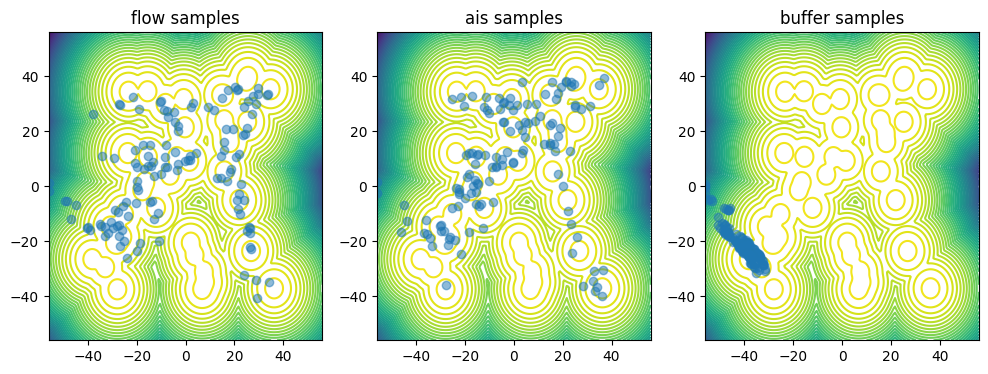

loss: 2.0905678412393183e+29, ess base: 0.034562766551971436,ess ais: 0.009189748205244541: 100%|██████████| 4000/4000 [14:00<00:00,  4.76it/s]

Timelimit not set


In [9]:
# Now run!
trainer.run(n_iterations=n_iterations, batch_size=batch_size, n_plot=n_plots, \
            n_eval=n_eval, eval_batch_size=eval_batch_size, save=False)  # note that the progress bar during training prints ESS w.r.t p^2/q. 

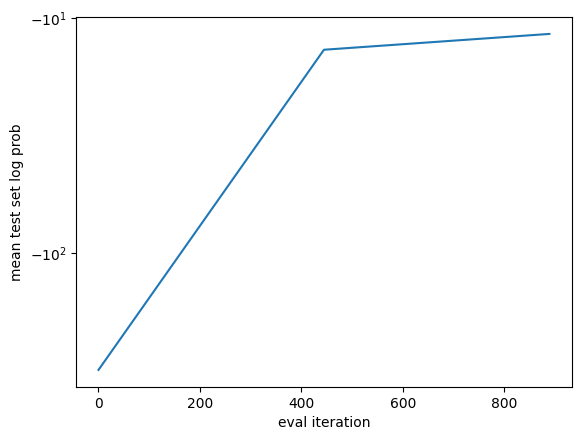

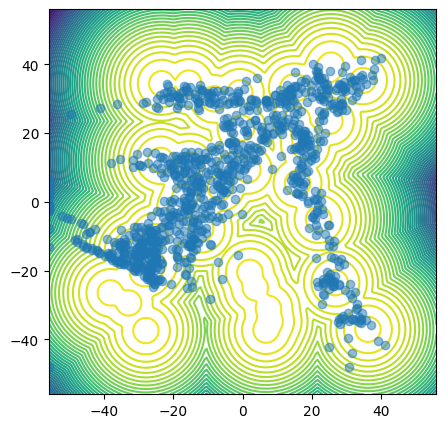

In [10]:
# Test set probability using samples from the target distribution.
eval_iters = np.linspace(0, n_iterations, n_eval)
plt.plot(eval_iters, logger.history['flow_test_set_mean_log_prob_p_target'])
plt.ylabel("mean test set log prob")
plt.xlabel("eval iteration")
plt.yscale("symlog")

fig, axs = plt.subplots(1, 1, figsize=(5, 5))
target.to("cpu")
plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs, n_contour_levels=50, grid_width_n_points=200)
target.to("cuda")

n_samples = 1000
samples_flow = fab_model.flow.sample((n_samples,)).detach()
plot_marginal_pair(samples_flow, ax=axs, bounds=plotting_bounds)

### Training a regular flow with Reverse KL

In [11]:
loss_type = "flow_reverse_kl" # can set to "target_foward_kl" for training by maximum likelihood of samples from the GMM target.

# Create flow using the same architecture.
flow = make_wrapped_normflow_realnvp(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = False)
optimizer = torch.optim.Adam(flow.parameters(), lr=lr)
logger = ListLogger(save=False) # save training history

# use GPU if available
if torch.cuda.is_available():
    flow.cuda()
    transition_operator.cuda()
    target.to("cuda")
    print(f"Running with GPU")

n_iterations = int(3*(n_iterations)) # Training the flow by KL minimisation is cheaper per iteration, so we run it for more iterations.

Running with GPU


In [12]:
reverse_kld_model = FABModel(flow=flow,
                     target_distribution=target,
                     n_intermediate_distributions=n_intermediate_distributions,
                     transition_operator=transition_operator,
                     loss_type=loss_type,
                     alpha=1.0)

def plot_flow_reverse_kld(fab_model, n_samples = 300):
    fig, axs = plt.subplots(1,1, figsize=(4, 4))
    target.to("cpu")
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs, n_contour_levels=50, grid_width_n_points=200)
    target.to("cuda")

    # plot flow samples
    samples_flow = fab_model.flow.sample((n_samples,))
    plot_marginal_pair(samples_flow, ax=axs, bounds=plotting_bounds)
    
    axs.set_title("flow samples")
    plt.show()
    return [fig]

In [13]:
trainer = Trainer(model=reverse_kld_model, optimizer=optimizer, logger=logger, plot=plot_flow_reverse_kld, max_gradient_norm=max_gradient_norm)

loss: 20.90253448486328:   0%|          | 0/12000 [00:00<?, ?it/s]

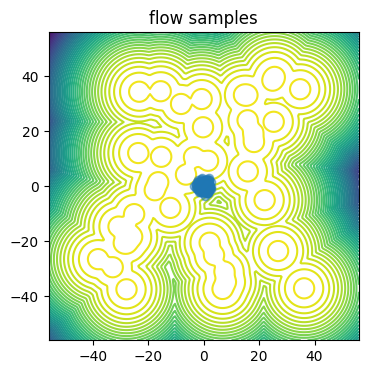

loss: 13.639678955078125:   1%|          | 63/12000 [00:04<09:41, 20.52it/s] 

nan loss encountered
nan loss encountered
nan loss encountered


loss: 12.305039405822754:   1%|          | 73/12000 [00:05<10:20, 19.24it/s]

nan loss encountered


loss: 12.59797477722168:   1%|          | 78/12000 [00:05<10:27, 18.99it/s] 

nan loss encountered


loss: 12.00942611694336:   1%|          | 87/12000 [00:05<10:11, 19.47it/s] 

nan loss encountered


loss: 9.653411865234375:   1%|          | 112/12000 [00:07<09:32, 20.76it/s] 

nan loss encountered
nan loss encountered


loss: inf:   1%|          | 125/12000 [00:07<10:20, 19.15it/s]              

nan loss encountered
nan loss encountered


loss: 6.3464131355285645:   1%|          | 149/12000 [00:09<11:11, 17.64it/s]

nan loss encountered


loss: 5.450508117675781:   1%|▏         | 170/12000 [00:10<10:32, 18.71it/s] 

nan loss encountered
nan loss encountered


loss: 5.078858852386475:   2%|▏         | 186/12000 [00:11<10:35, 18.58it/s]

nan loss encountered


loss: 4.897407054901123:   2%|▏         | 200/12000 [00:12<09:11, 21.40it/s]

nan loss encountered
nan loss encountered
nan loss encountered


loss: 4.863958358764648:   2%|▏         | 214/12000 [00:12<09:17, 21.12it/s]

nan loss encountered
nan loss encountered


loss: 4.146132469177246:   2%|▏         | 220/12000 [00:13<08:58, 21.87it/s] 

nan loss encountered
nan loss encountered


loss: 3.545437812805176:   2%|▏         | 297/12000 [00:17<10:23, 18.78it/s] 

nan loss encountered


loss: 2.8377647399902344:  11%|█         | 1333/12000 [01:15<10:19, 17.22it/s]

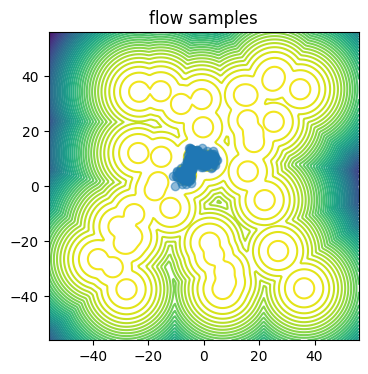

loss: 2.644115447998047:  22%|██▏       | 2665/12000 [02:31<08:43, 17.84it/s] 

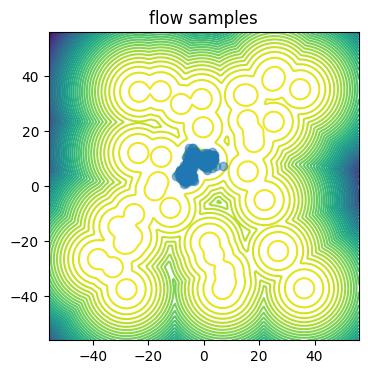

loss: 2.7087178230285645:  33%|███▎      | 3999/12000 [03:51<10:38, 12.52it/s]

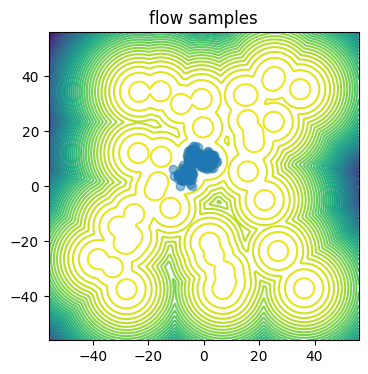

loss: 2.6645779609680176:  44%|████▍     | 5331/12000 [05:13<06:08, 18.08it/s]

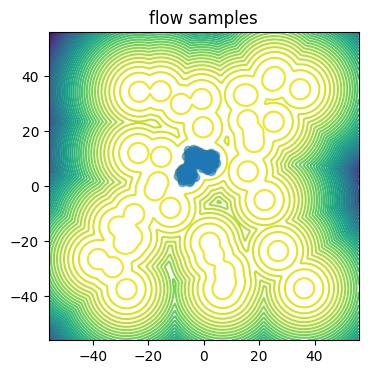

loss: 2.6854238510131836:  56%|█████▌    | 6665/12000 [06:29<05:05, 17.47it/s]

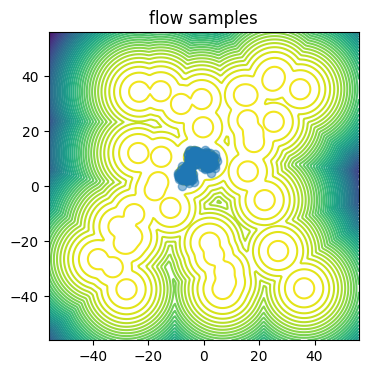

loss: 2.6151232719421387:  67%|██████▋   | 7999/12000 [07:46<04:15, 15.67it/s]

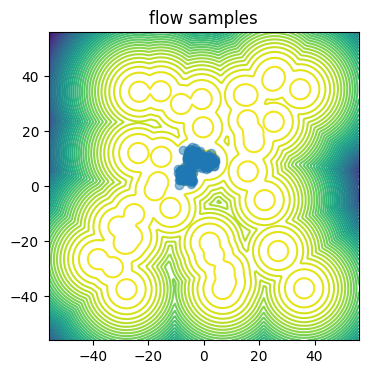

loss: 2.6461939811706543:  78%|███████▊  | 9331/12000 [09:02<02:33, 17.41it/s]

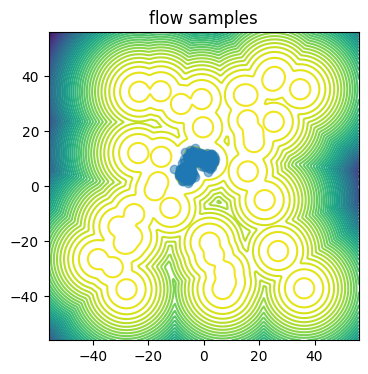

loss: 2.5830163955688477:  89%|████████▉ | 10665/12000 [10:18<01:15, 17.57it/s]

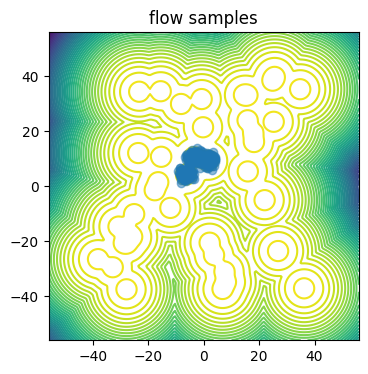

loss: 2.5937681198120117: 100%|█████████▉| 11999/12000 [11:34<00:00, 18.06it/s]

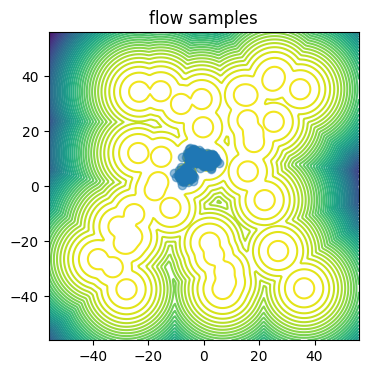

loss: 2.5937681198120117: 100%|██████████| 12000/12000 [11:36<00:00, 17.24it/s]

Timelimit not set


In [14]:
# Now run!
trainer.run(n_iterations=n_iterations, batch_size=batch_size, n_plot=n_plots, \
            n_eval=n_eval, eval_batch_size=eval_batch_size, save=False)

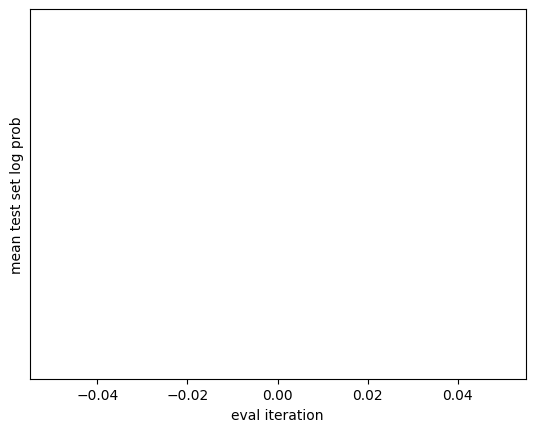

In [15]:
logger.history["flow_test_set_mean_log_prob"]
eval_iters = np.linspace(0, n_iterations, n_eval)
plt.plot(eval_iters, logger.history["flow_test_set_mean_log_prob"])
plt.ylabel("mean test set log prob")
plt.xlabel("eval iteration")
plt.yscale("symlog")